In [1]:
import pandas as pd

In [2]:
import h5py 
import numpy as np
def import_tfmodisco_motifs(tfm_results_path, trim=True, only_pos=True):
    """
    Imports the PFMs to into a dictionary, mapping `(x, y)` to the PFM,
    where `x` is the metacluster index and `y` is the pattern index.
    Arguments:
        `tfm_results_path`: path to HDF5 containing TF-MoDISco results
        `out_dir`: where to save motifs
        `trim`: if True, trim the motif flanks based on information content
        `only_pos`: if True, only return motifs with positive contributions
    Returns the dictionary of PFMs.
    """ 
    pfms = {}
    with h5py.File(tfm_results_path, "r") as f:
        metaclusters = f["metacluster_idx_to_submetacluster_results"]
        num_metaclusters = len(metaclusters.keys())
        for metacluster_i, metacluster_key in enumerate(metaclusters.keys()):
            metacluster = metaclusters[metacluster_key]
            print(len(metacluster["seqlets"].value))
            if "patterns" not in metacluster["seqlets_to_patterns_result"]:
                continue
            patterns = metacluster["seqlets_to_patterns_result"]["patterns"]
            num_patterns = len(patterns["all_pattern_names"][:])
            for pattern_i, pattern_name in enumerate(patterns["all_pattern_names"][:]):
                pattern_name = pattern_name
                pattern = patterns[pattern_name]
                if metacluster_i==0:
                    key = "pos_patterns.pattern_"+str(pattern_i)
                if metacluster_i==1:
                    key = "neg_patterns.pattern_"+str(pattern_i)                
                
                if key not in pfms:
                    pfms[key] = []

                for seqlet in pattern["seqlets_and_alnmts"]["seqlets"]:
                    pfms[key].append(seqlet)
               
    return pfms

In [3]:
dttype = 'ATAC'
mode = "profile"
celltype="GM12878"
dttype1="ATAC_PE"
tfm_results_path = '/oak/stanford/groups/akundaje/projects/chromatin-atlas-2022/chrombpnet/folds/'+dttype+'/'+celltype+'/merge_folds_new/'+mode+'/modisco_old_format.h5'

pfms = import_tfmodisco_motifs(tfm_results_path)

/users/anusri/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.


227455
41695


In [4]:
htmld="/oak/stanford/groups/akundaje/projects/chromatin-atlas-2022/chrombpnet/folds/"+dttype+'/'+celltype+"/merge_folds_new/"+mode+"/motifs.html"
df = pd.read_html(htmld)
tomtom = df[0]
tomtom

,pattern,num_seqlets,modisco_cwm_fwd,modisco_cwm_rev,match0,qval0,match0_logo,match1,qval1,match1_logo,match2,qval2,match2_logo
0,pos_patterns.pattern_0,41115,NaN,NaN,CTCF_MA0139.1,1.341610e-12,NaN,CTCF_HUMAN.H11MO.0.A,1.193380e-09,NaN,CTCF_MOUSE.H11MO.0.A,2.045770e-08,NaN
1,pos_patterns.pattern_1,38163,NaN,NaN,IRF1_MOUSE.H11MO.0.A,1.475530e-03,NaN,IRF1_HUMAN.H11MO.0.A,1.475530e-03,NaN,STAT2_HUMAN.H11MO.0.A,1.475530e-03,NaN
2,pos_patterns.pattern_2,24609,NaN,NaN,JDP2_MA0655.1,2.652640e-03,NaN,JDP2_bZIP_3,2.652640e-03,NaN,FOS+JUN_MA0099.3,2.652640e-03,NaN
3,pos_patterns.pattern_3,18050,NaN,NaN,RUNX1_HUMAN.H11MO.0.A,1.521070e-02,NaN,RUNX1_MOUSE.H11MO.0.A,1.521070e-02,NaN,RUNX3_HUMAN.H11MO.0.A,1.816690e-02,NaN
4,pos_patterns.pattern_4,15120,NaN,NaN,KLF12_HUMAN.H11MO.0.C,6.127350e-05,NaN,SP1_HUMAN.H11MO.0.A,1.429720e-04,NaN,KLF3_HUMAN.H11MO.0.B,4.320100e-04,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,neg_patterns.pattern_85,29,NaN,NaN,RUNX3_RUNX_3,3.707600e-01,NaN,RUNX2_RUNX_2,3.707600e-01,NaN,RUNX2_HUMAN.H11MO.0.A,3.707600e-01,NaN
149,neg_patterns.pattern_86,25,NaN,NaN,NFKB2_HUMAN.H11MO.0.B,2.118310e-04,NaN,NFKB2_MOUSE.H11MO.0.C,2.118310e-04,NaN,RELB_HUMAN.H11MO.0.C,5.743180e-04,NaN
150,neg_patterns.pattern_87,25,NaN,NaN,THA11_HUMAN.H11MO.0.B,1.356870e-01,NaN,THA11_MOUSE.H11MO.0.B,1.356870e-01,NaN,ZN382_HUMAN.H11MO.0.C,1.356870e-01,NaN
151,neg_patterns.pattern_88,23,NaN,NaN,STAT1_MA0137.3,5.757610e-03,NaN,Bcl6_MA0463.1,1.407530e-02,NaN,BCL6_MOUSE.H11MO.0.A,1.407530e-02,NaN


In [5]:
bed="/oak/stanford/groups/akundaje/projects/chromatin-atlas-2022/chrombpnet/folds/"+dttype+'/'+celltype+"/merge_folds_new/in_peaks.interpreted_regions.bed"
bed = pd.read_csv(bed, sep="\t", header=None)
bed.head()
print(bed.shape)

(277907, 11)


In [6]:
lists=[]
for key in pfms:
    print(key)
    if key in tomtom["pattern"].values:
        match_name = tomtom[tomtom["pattern"]==key]["match0"]
        keyd = key.replace("pos_patterns.pattern","0").replace("neg_patterns.pattern","1")+"_"+match_name
        keyd = keyd.values[0]
        #print(keyd.values[0])
        for seqlet in pfms[key]:
            vals = seqlet.split(",")
            peak_id = int(vals[0].split(":")[1])
            ss = vals[1].split(":")[1]
            ee = vals[2].split(":")[1]
            blist = [bed.loc[peak_id,0], bed.loc[peak_id,1]+bed.loc[peak_id,9]-250+int(ss), bed.loc[peak_id,1]+bed.loc[peak_id,9]-250+int(ee), keyd]
            print(blist)
            lists.append(blist)
    else:
        print(key)
            

pos_patterns.pattern_0
['chr3', 94249692, 94249722, '0_0_CTCF_MA0139.1']
['chr12', 45170637, 45170667, '0_0_CTCF_MA0139.1']
['chr1', 21232137, 21232167, '0_0_CTCF_MA0139.1']
['chr22', 24758349, 24758379, '0_0_CTCF_MA0139.1']
['chr1', 21232137, 21232167, '0_0_CTCF_MA0139.1']
['chr22', 22710890, 22710920, '0_0_CTCF_MA0139.1']
['chr5', 178235198, 178235228, '0_0_CTCF_MA0139.1']
['chr11', 18115669, 18115699, '0_0_CTCF_MA0139.1']
['chr14', 21014854, 21014884, '0_0_CTCF_MA0139.1']
['chr12', 40152967, 40152997, '0_0_CTCF_MA0139.1']
['chr8', 82307713, 82307743, '0_0_CTCF_MA0139.1']
['chr4', 157992226, 157992256, '0_0_CTCF_MA0139.1']
['chr17', 58711142, 58711172, '0_0_CTCF_MA0139.1']
['chr2', 212567790, 212567820, '0_0_CTCF_MA0139.1']
['chr17', 700687, 700717, '0_0_CTCF_MA0139.1']
['chr10', 51011083, 51011113, '0_0_CTCF_MA0139.1']
['chr1', 9110922, 9110952, '0_0_CTCF_MA0139.1']
['chr12', 4421668, 4421698, '0_0_CTCF_MA0139.1']
['chr1', 189429697, 189429727, '0_0_CTCF_MA0139.1']
['chr17', 7906527

['chr22', 39623040, 39623070, '0_0_CTCF_MA0139.1']
['chr17', 50362149, 50362179, '0_0_CTCF_MA0139.1']
['chr22', 30485549, 30485579, '0_0_CTCF_MA0139.1']
['chr10', 29998500, 29998530, '0_0_CTCF_MA0139.1']
['chr2', 85391412, 85391442, '0_0_CTCF_MA0139.1']
['chr1', 119968167, 119968197, '0_0_CTCF_MA0139.1']
['chr9', 133994557, 133994587, '0_0_CTCF_MA0139.1']
['chr14', 70074123, 70074153, '0_0_CTCF_MA0139.1']
['chr6', 80338424, 80338454, '0_0_CTCF_MA0139.1']
['chr17', 82154041, 82154071, '0_0_CTCF_MA0139.1']
['chr4', 150209577, 150209607, '0_0_CTCF_MA0139.1']
['chr19', 15101658, 15101688, '0_0_CTCF_MA0139.1']
['chr14', 101665658, 101665688, '0_0_CTCF_MA0139.1']
['chr4', 168514454, 168514484, '0_0_CTCF_MA0139.1']
['chr3', 39498754, 39498784, '0_0_CTCF_MA0139.1']
['chr9', 34437525, 34437555, '0_0_CTCF_MA0139.1']
['chr3', 49671868, 49671898, '0_0_CTCF_MA0139.1']
['chr11', 73178228, 73178258, '0_0_CTCF_MA0139.1']
['chrX', 14528807, 14528837, '0_0_CTCF_MA0139.1']
['chr10', 59809539, 59809569, '

['chr19', 5892708, 5892738, '0_0_CTCF_MA0139.1']
['chrX', 103464920, 103464950, '0_0_CTCF_MA0139.1']
['chr9', 94315237, 94315267, '0_0_CTCF_MA0139.1']
['chr22', 36782192, 36782222, '0_0_CTCF_MA0139.1']
['chr6', 134064002, 134064032, '0_0_CTCF_MA0139.1']
['chr12', 110245672, 110245702, '0_0_CTCF_MA0139.1']
['chr14', 60331989, 60332019, '0_0_CTCF_MA0139.1']
['chr9', 137695376, 137695406, '0_0_CTCF_MA0139.1']
['chr4', 110970841, 110970871, '0_0_CTCF_MA0139.1']
['chr17', 64797910, 64797940, '0_0_CTCF_MA0139.1']
['chr12', 108512112, 108512142, '0_0_CTCF_MA0139.1']
['chr2', 128714948, 128714978, '0_0_CTCF_MA0139.1']
['chr14', 88463472, 88463502, '0_0_CTCF_MA0139.1']
['chr22', 50498362, 50498392, '0_0_CTCF_MA0139.1']
['chr22', 34414968, 34414998, '0_0_CTCF_MA0139.1']
['chr19', 54359595, 54359625, '0_0_CTCF_MA0139.1']
['chr11', 662868, 662898, '0_0_CTCF_MA0139.1']
['chr18', 62586358, 62586388, '0_0_CTCF_MA0139.1']
['chr3', 62833687, 62833717, '0_0_CTCF_MA0139.1']
['chr11', 86781701, 86781731, 

['chr10', 104080926, 104080956, '0_0_CTCF_MA0139.1']
['chr13', 71285877, 71285907, '0_0_CTCF_MA0139.1']
['chr11', 67389607, 67389637, '0_0_CTCF_MA0139.1']
['chr17', 61358994, 61359024, '0_0_CTCF_MA0139.1']
['chr12', 28963740, 28963770, '0_0_CTCF_MA0139.1']
['chr1', 28113216, 28113246, '0_0_CTCF_MA0139.1']
['chr15', 72342572, 72342602, '0_0_CTCF_MA0139.1']
['chr14', 31326298, 31326328, '0_0_CTCF_MA0139.1']
['chr22', 17205615, 17205645, '0_0_CTCF_MA0139.1']
['chr14', 22163165, 22163195, '0_0_CTCF_MA0139.1']
['chr4', 20422607, 20422637, '0_0_CTCF_MA0139.1']
['chr21', 42923990, 42924020, '0_0_CTCF_MA0139.1']
['chr3', 154552487, 154552517, '0_0_CTCF_MA0139.1']
['chr14', 104001200, 104001230, '0_0_CTCF_MA0139.1']
['chr22', 39306883, 39306913, '0_0_CTCF_MA0139.1']
['chr9', 117783342, 117783372, '0_0_CTCF_MA0139.1']
['chr17', 1630156, 1630186, '0_0_CTCF_MA0139.1']
['chr10', 132940470, 132940500, '0_0_CTCF_MA0139.1']
['chr5', 144192226, 144192256, '0_0_CTCF_MA0139.1']
['chr11', 120622359, 12062

['chr7', 44348542, 44348572, '0_0_CTCF_MA0139.1']
['chr6', 111642736, 111642766, '0_0_CTCF_MA0139.1']
['chr3', 111616793, 111616823, '0_0_CTCF_MA0139.1']
['chr5', 140169580, 140169610, '0_0_CTCF_MA0139.1']
['chr2', 222318102, 222318132, '0_0_CTCF_MA0139.1']
['chr11', 115548937, 115548967, '0_0_CTCF_MA0139.1']
['chr4', 11489330, 11489360, '0_0_CTCF_MA0139.1']
['chr3', 27022256, 27022286, '0_0_CTCF_MA0139.1']
['chr22', 21938705, 21938735, '0_0_CTCF_MA0139.1']
['chr16', 68384844, 68384874, '0_0_CTCF_MA0139.1']
['chr14', 67559752, 67559782, '0_0_CTCF_MA0139.1']
['chrX', 46653666, 46653696, '0_0_CTCF_MA0139.1']
['chr5', 127562404, 127562434, '0_0_CTCF_MA0139.1']
['chr11', 45852981, 45853011, '0_0_CTCF_MA0139.1']
['chr7', 106155089, 106155119, '0_0_CTCF_MA0139.1']
['chr17', 64216874, 64216904, '0_0_CTCF_MA0139.1']
['chr3', 153174300, 153174330, '0_0_CTCF_MA0139.1']
['chr16', 25066061, 25066091, '0_0_CTCF_MA0139.1']
['chr5', 177489432, 177489462, '0_0_CTCF_MA0139.1']
['chr6', 166456509, 16645

['chr3', 56995581, 56995611, '0_0_CTCF_MA0139.1']
['chr15', 42059876, 42059906, '0_0_CTCF_MA0139.1']
['chr5', 37413188, 37413218, '0_0_CTCF_MA0139.1']
['chr12', 68864043, 68864073, '0_0_CTCF_MA0139.1']
['chr2', 63861418, 63861448, '0_0_CTCF_MA0139.1']
['chr12', 132415075, 132415105, '0_0_CTCF_MA0139.1']
['chr1', 227131404, 227131434, '0_0_CTCF_MA0139.1']
['chr2', 102020780, 102020810, '0_0_CTCF_MA0139.1']
['chr7', 27784618, 27784648, '0_0_CTCF_MA0139.1']
['chr6', 49623225, 49623255, '0_0_CTCF_MA0139.1']
['chr17', 40803698, 40803728, '0_0_CTCF_MA0139.1']
['chr7', 56005002, 56005032, '0_0_CTCF_MA0139.1']
['chr22', 28855778, 28855808, '0_0_CTCF_MA0139.1']
['chr10', 22586393, 22586423, '0_0_CTCF_MA0139.1']
['chr9', 127586643, 127586673, '0_0_CTCF_MA0139.1']
['chr10', 82811800, 82811830, '0_0_CTCF_MA0139.1']
['chrX', 113929157, 113929187, '0_0_CTCF_MA0139.1']
['chr16', 4359226, 4359256, '0_0_CTCF_MA0139.1']
['chr2', 179411062, 179411092, '0_0_CTCF_MA0139.1']
['chr4', 100093566, 100093596, '

['chr20', 33211998, 33212028, '0_0_CTCF_MA0139.1']
['chr16', 64950449, 64950479, '0_0_CTCF_MA0139.1']
['chrX', 155651417, 155651447, '0_0_CTCF_MA0139.1']
['chr17', 73998787, 73998817, '0_0_CTCF_MA0139.1']
['chr12', 105383516, 105383546, '0_0_CTCF_MA0139.1']
['chr12', 52980982, 52981012, '0_0_CTCF_MA0139.1']
['chr3', 52820939, 52820969, '0_0_CTCF_MA0139.1']
['chr15', 78979883, 78979913, '0_0_CTCF_MA0139.1']
['chr16', 68396711, 68396741, '0_0_CTCF_MA0139.1']
['chr9', 93302850, 93302880, '0_0_CTCF_MA0139.1']
['chr18', 40935597, 40935627, '0_0_CTCF_MA0139.1']
['chr2', 119517620, 119517650, '0_0_CTCF_MA0139.1']
['chrX', 153609997, 153610027, '0_0_CTCF_MA0139.1']
['chr18', 3594410, 3594440, '0_0_CTCF_MA0139.1']
['chr6', 42726760, 42726790, '0_0_CTCF_MA0139.1']
['chr11', 77113686, 77113716, '0_0_CTCF_MA0139.1']
['chr15', 74065918, 74065948, '0_0_CTCF_MA0139.1']
['chr6', 78308193, 78308223, '0_0_CTCF_MA0139.1']
['chr6', 108113623, 108113653, '0_0_CTCF_MA0139.1']
['chr11', 12412455, 12412485, '

['chr9', 136792002, 136792032, '0_0_CTCF_MA0139.1']
['chr3', 16366793, 16366823, '0_0_CTCF_MA0139.1']
['chr16', 86045513, 86045543, '0_0_CTCF_MA0139.1']
['chr16', 53007285, 53007315, '0_0_CTCF_MA0139.1']
['chr9', 33786053, 33786083, '0_0_CTCF_MA0139.1']
['chr1', 209798207, 209798237, '0_0_CTCF_MA0139.1']
['chr2', 26462659, 26462689, '0_0_CTCF_MA0139.1']
['chr16', 53547048, 53547078, '0_0_CTCF_MA0139.1']
['chr1', 50349353, 50349383, '0_0_CTCF_MA0139.1']
['chr11', 63830063, 63830093, '0_0_CTCF_MA0139.1']
['chr2', 274683, 274713, '0_0_CTCF_MA0139.1']
['chr19', 49489873, 49489903, '0_0_CTCF_MA0139.1']
['chr2', 177263643, 177263673, '0_0_CTCF_MA0139.1']
['chr20', 20435634, 20435664, '0_0_CTCF_MA0139.1']
['chr9', 68583314, 68583344, '0_0_CTCF_MA0139.1']
['chr19', 11454002, 11454032, '0_0_CTCF_MA0139.1']
['chr12', 26058492, 26058522, '0_0_CTCF_MA0139.1']
['chr18', 21914903, 21914933, '0_0_CTCF_MA0139.1']
['chr2', 142165878, 142165908, '0_0_CTCF_MA0139.1']
['chr17', 27388521, 27388551, '0_0_CT

['chr5', 134302998, 134303028, '0_0_CTCF_MA0139.1']
['chr7', 152336948, 152336978, '0_0_CTCF_MA0139.1']
['chr11', 9015773, 9015803, '0_0_CTCF_MA0139.1']
['chr9', 84315444, 84315474, '0_0_CTCF_MA0139.1']
['chr11', 64553639, 64553669, '0_0_CTCF_MA0139.1']
['chr3', 25532947, 25532977, '0_0_CTCF_MA0139.1']
['chrX', 143664486, 143664516, '0_0_CTCF_MA0139.1']
['chr10', 98262709, 98262739, '0_0_CTCF_MA0139.1']
['chr15', 32651409, 32651439, '0_0_CTCF_MA0139.1']
['chr7', 22501540, 22501570, '0_0_CTCF_MA0139.1']
['chr4', 38759723, 38759753, '0_0_CTCF_MA0139.1']
['chr9', 36023605, 36023635, '0_0_CTCF_MA0139.1']
['chr10', 86585617, 86585647, '0_0_CTCF_MA0139.1']
['chr20', 13788347, 13788377, '0_0_CTCF_MA0139.1']
['chr3', 148861444, 148861474, '0_0_CTCF_MA0139.1']
['chr16', 53773316, 53773346, '0_0_CTCF_MA0139.1']
['chr7', 108805977, 108806007, '0_0_CTCF_MA0139.1']
['chr20', 38221260, 38221290, '0_0_CTCF_MA0139.1']
['chr14', 58501399, 58501429, '0_0_CTCF_MA0139.1']
['chr17', 13031973, 13032003, '0_

['chr20', 2387379, 2387409, '0_0_CTCF_MA0139.1']
['chr5', 139968917, 139968947, '0_0_CTCF_MA0139.1']
['chr2', 120437382, 120437412, '0_0_CTCF_MA0139.1']
['chr17', 2282436, 2282466, '0_0_CTCF_MA0139.1']
['chr2', 185280205, 185280235, '0_0_CTCF_MA0139.1']
['chr4', 157045705, 157045735, '0_0_CTCF_MA0139.1']
['chr2', 113370702, 113370732, '0_0_CTCF_MA0139.1']
['chr2', 95729099, 95729129, '0_0_CTCF_MA0139.1']
['chr2', 72220389, 72220419, '0_0_CTCF_MA0139.1']
['chr12', 41368171, 41368201, '0_0_CTCF_MA0139.1']
['chr10', 91370174, 91370204, '0_0_CTCF_MA0139.1']
['chr14', 104896848, 104896878, '0_0_CTCF_MA0139.1']
['chrX', 11533391, 11533421, '0_0_CTCF_MA0139.1']
['chr1', 244548727, 244548757, '0_0_CTCF_MA0139.1']
['chr10', 69696300, 69696330, '0_0_CTCF_MA0139.1']
['chr4', 40325592, 40325622, '0_0_CTCF_MA0139.1']
['chr22', 33083434, 33083464, '0_0_CTCF_MA0139.1']
['chr7', 92610077, 92610107, '0_0_CTCF_MA0139.1']
['chr3', 143674539, 143674569, '0_0_CTCF_MA0139.1']
['chr2', 219058154, 219058184, 

['chr1', 223811807, 223811837, '0_0_CTCF_MA0139.1']
['chr1', 203625796, 203625826, '0_0_CTCF_MA0139.1']
['chr2', 31435099, 31435129, '0_0_CTCF_MA0139.1']
['chr15', 74066196, 74066226, '0_0_CTCF_MA0139.1']
['chr5', 112238659, 112238689, '0_0_CTCF_MA0139.1']
['chr5', 96440101, 96440131, '0_0_CTCF_MA0139.1']
['chrX', 149493744, 149493774, '0_0_CTCF_MA0139.1']
['chrX', 149831678, 149831708, '0_0_CTCF_MA0139.1']
['chr1', 66752321, 66752351, '0_0_CTCF_MA0139.1']
['chr19', 8456240, 8456270, '0_0_CTCF_MA0139.1']
['chr4', 163755075, 163755105, '0_0_CTCF_MA0139.1']
['chr14', 73777631, 73777661, '0_0_CTCF_MA0139.1']
['chr20', 1509393, 1509423, '0_0_CTCF_MA0139.1']
['chr8', 127035100, 127035130, '0_0_CTCF_MA0139.1']
['chr1', 6141781, 6141811, '0_0_CTCF_MA0139.1']
['chr2', 127877306, 127877336, '0_0_CTCF_MA0139.1']
['chr2', 175031175, 175031205, '0_0_CTCF_MA0139.1']
['chr2', 173955127, 173955157, '0_0_CTCF_MA0139.1']
['chr1', 66752321, 66752351, '0_0_CTCF_MA0139.1']
['chr9', 71783227, 71783257, '0_

['chr3', 11835219, 11835249, '0_0_CTCF_MA0139.1']
['chr16', 88443173, 88443203, '0_0_CTCF_MA0139.1']
['chr1', 235513940, 235513970, '0_0_CTCF_MA0139.1']
['chr4', 89159076, 89159106, '0_0_CTCF_MA0139.1']
['chr17', 136689, 136719, '0_0_CTCF_MA0139.1']
['chr2', 191555256, 191555286, '0_0_CTCF_MA0139.1']
['chr6', 70310249, 70310279, '0_0_CTCF_MA0139.1']
['chr1', 88877544, 88877574, '0_0_CTCF_MA0139.1']
['chr2', 69565499, 69565529, '0_0_CTCF_MA0139.1']
['chr5', 90866459, 90866489, '0_0_CTCF_MA0139.1']
['chr5', 83712173, 83712203, '0_0_CTCF_MA0139.1']
['chr7', 130897124, 130897154, '0_0_CTCF_MA0139.1']
['chr2', 102473101, 102473131, '0_0_CTCF_MA0139.1']
['chr10', 80222830, 80222860, '0_0_CTCF_MA0139.1']
['chr10', 103244843, 103244873, '0_0_CTCF_MA0139.1']
['chr1', 207077970, 207078000, '0_0_CTCF_MA0139.1']
['chr12', 96062033, 96062063, '0_0_CTCF_MA0139.1']
['chr8', 7887083, 7887113, '0_0_CTCF_MA0139.1']
['chr13', 75695991, 75696021, '0_0_CTCF_MA0139.1']
['chr11', 113994523, 113994553, '0_0_C

['chr16', 71537849, 71537879, '0_0_CTCF_MA0139.1']
['chr3', 167102244, 167102274, '0_0_CTCF_MA0139.1']
['chr15', 51650097, 51650127, '0_0_CTCF_MA0139.1']
['chr15', 63093754, 63093784, '0_0_CTCF_MA0139.1']
['chr10', 114786596, 114786626, '0_0_CTCF_MA0139.1']
['chr4', 52545622, 52545652, '0_0_CTCF_MA0139.1']
['chr1', 158329980, 158330010, '0_0_CTCF_MA0139.1']
['chr2', 75677486, 75677516, '0_0_CTCF_MA0139.1']
['chr7', 5827944, 5827974, '0_0_CTCF_MA0139.1']
['chr5', 132419807, 132419837, '0_0_CTCF_MA0139.1']
['chr10', 71696884, 71696914, '0_0_CTCF_MA0139.1']
['chr12', 53508718, 53508748, '0_0_CTCF_MA0139.1']
['chr1', 22964365, 22964395, '0_0_CTCF_MA0139.1']
['chr1', 209354483, 209354513, '0_0_CTCF_MA0139.1']
['chr11', 63636028, 63636058, '0_0_CTCF_MA0139.1']
['chr10', 49594698, 49594728, '0_0_CTCF_MA0139.1']
['chr5', 64148015, 64148045, '0_0_CTCF_MA0139.1']
['chrX', 153554959, 153554989, '0_0_CTCF_MA0139.1']
['chr19', 17855740, 17855770, '0_0_CTCF_MA0139.1']
['chr4', 48109843, 48109873, '0

['chr17', 21450094, 21450124, '0_0_CTCF_MA0139.1']
['chr3', 158918078, 158918108, '0_0_CTCF_MA0139.1']
['chr16', 57600528, 57600558, '0_0_CTCF_MA0139.1']
['chr2', 241598659, 241598689, '0_0_CTCF_MA0139.1']
['chr14', 62179560, 62179590, '0_0_CTCF_MA0139.1']
['chr15', 73781458, 73781488, '0_0_CTCF_MA0139.1']
['chr13', 26707885, 26707915, '0_0_CTCF_MA0139.1']
['chrX', 110992791, 110992821, '0_0_CTCF_MA0139.1']
['chr12', 68158610, 68158640, '0_0_CTCF_MA0139.1']
['chr2', 225123046, 225123076, '0_0_CTCF_MA0139.1']
['chr1', 40850171, 40850201, '0_0_CTCF_MA0139.1']
['chr2', 36672393, 36672423, '0_0_CTCF_MA0139.1']
['chr3', 67790233, 67790263, '0_0_CTCF_MA0139.1']
['chr19', 55212616, 55212646, '0_0_CTCF_MA0139.1']
['chr4', 53804930, 53804960, '0_0_CTCF_MA0139.1']
['chr1', 44572243, 44572273, '0_0_CTCF_MA0139.1']
['chr3', 35924265, 35924295, '0_0_CTCF_MA0139.1']
['chr4', 183262046, 183262076, '0_0_CTCF_MA0139.1']
['chr2', 213490260, 213490290, '0_0_CTCF_MA0139.1']
['chrX', 54786087, 54786117, '0

['chr22', 24189824, 24189854, '0_0_CTCF_MA0139.1']
['chr11', 16946083, 16946113, '0_0_CTCF_MA0139.1']
['chr13', 30461845, 30461875, '0_0_CTCF_MA0139.1']
['chrX', 131746625, 131746655, '0_0_CTCF_MA0139.1']
['chr1', 8561226, 8561256, '0_0_CTCF_MA0139.1']
['chr6', 144581983, 144582013, '0_0_CTCF_MA0139.1']
['chr11', 71813919, 71813949, '0_0_CTCF_MA0139.1']
['chr3', 144843278, 144843308, '0_0_CTCF_MA0139.1']
['chr5', 157312588, 157312618, '0_0_CTCF_MA0139.1']
['chr6', 10510677, 10510707, '0_0_CTCF_MA0139.1']
['chrX', 119728661, 119728691, '0_0_CTCF_MA0139.1']
['chr8', 141629580, 141629610, '0_0_CTCF_MA0139.1']
['chr10', 64092075, 64092105, '0_0_CTCF_MA0139.1']
['chr2', 109208273, 109208303, '0_0_CTCF_MA0139.1']
['chr15', 92521709, 92521739, '0_0_CTCF_MA0139.1']
['chr2', 21754349, 21754379, '0_0_CTCF_MA0139.1']
['chr2', 224931076, 224931106, '0_0_CTCF_MA0139.1']
['chr4', 73662853, 73662883, '0_0_CTCF_MA0139.1']
['chr3', 153595384, 153595414, '0_0_CTCF_MA0139.1']
['chr4', 128454424, 12845445

['chr3', 851226, 851256, '0_0_CTCF_MA0139.1']
['chr4', 7008187, 7008217, '0_0_CTCF_MA0139.1']
['chr16', 303852, 303882, '0_0_CTCF_MA0139.1']
['chr2', 60550503, 60550533, '0_0_CTCF_MA0139.1']
['chr3', 31562005, 31562035, '0_0_CTCF_MA0139.1']
['chr21', 33132240, 33132270, '0_0_CTCF_MA0139.1']
['chr1', 45230731, 45230761, '0_0_CTCF_MA0139.1']
['chr17', 62416859, 62416889, '0_0_CTCF_MA0139.1']
['chr2', 85745150, 85745180, '0_0_CTCF_MA0139.1']
['chr1', 93735179, 93735209, '0_0_CTCF_MA0139.1']
['chr7', 81501450, 81501480, '0_0_CTCF_MA0139.1']
['chr3', 12876130, 12876160, '0_0_CTCF_MA0139.1']
['chr10', 72568090, 72568120, '0_0_CTCF_MA0139.1']
['chr1', 6414477, 6414507, '0_0_CTCF_MA0139.1']
['chr6', 89375665, 89375695, '0_0_CTCF_MA0139.1']
['chr16', 57302836, 57302866, '0_0_CTCF_MA0139.1']
['chr8', 130416725, 130416755, '0_0_CTCF_MA0139.1']
['chr16', 13186983, 13187013, '0_0_CTCF_MA0139.1']
['chr1', 13765166, 13765196, '0_0_CTCF_MA0139.1']
['chr21', 25360775, 25360805, '0_0_CTCF_MA0139.1']
['c

['chr17', 36768458, 36768488, '0_0_CTCF_MA0139.1']
['chr1', 27884383, 27884413, '0_0_CTCF_MA0139.1']
['chrY', 15355489, 15355519, '0_0_CTCF_MA0139.1']
['chr13', 94988838, 94988868, '0_0_CTCF_MA0139.1']
['chr10', 24916545, 24916575, '0_0_CTCF_MA0139.1']
['chr20', 45824404, 45824434, '0_0_CTCF_MA0139.1']
['chr9', 70406503, 70406533, '0_0_CTCF_MA0139.1']
['chr3', 113890458, 113890488, '0_0_CTCF_MA0139.1']
['chr12', 94812508, 94812538, '0_0_CTCF_MA0139.1']
['chr3', 33716950, 33716980, '0_0_CTCF_MA0139.1']
['chr9', 94918268, 94918298, '0_0_CTCF_MA0139.1']
['chr8', 56081030, 56081060, '0_0_CTCF_MA0139.1']
['chr11', 46678488, 46678518, '0_0_CTCF_MA0139.1']
['chr3', 106566488, 106566518, '0_0_CTCF_MA0139.1']
['chr4', 47565390, 47565420, '0_0_CTCF_MA0139.1']
['chr10', 111360408, 111360438, '0_0_CTCF_MA0139.1']
['chr3', 131731767, 131731797, '0_0_CTCF_MA0139.1']
['chr19', 18063550, 18063580, '0_0_CTCF_MA0139.1']
['chr1', 77031435, 77031465, '0_0_CTCF_MA0139.1']
['chr16', 10501158, 10501188, '0_0

['chr4', 70601606, 70601636, '0_0_CTCF_MA0139.1']
['chr9', 114487758, 114487788, '0_0_CTCF_MA0139.1']
['chr5', 168706735, 168706765, '0_0_CTCF_MA0139.1']
['chrX', 135464103, 135464133, '0_0_CTCF_MA0139.1']
['chr14', 88868761, 88868791, '0_0_CTCF_MA0139.1']
['chrX', 24242235, 24242265, '0_0_CTCF_MA0139.1']
['chr10', 33155994, 33156024, '0_0_CTCF_MA0139.1']
['chr7', 1593684, 1593714, '0_0_CTCF_MA0139.1']
['chr1', 24202024, 24202054, '0_0_CTCF_MA0139.1']
['chr9', 92957354, 92957384, '0_0_CTCF_MA0139.1']
['chr1', 60765380, 60765410, '0_0_CTCF_MA0139.1']
['chr5', 59496956, 59496986, '0_0_CTCF_MA0139.1']
['chrX', 95765044, 95765074, '0_0_CTCF_MA0139.1']
['chr12', 51875414, 51875444, '0_0_CTCF_MA0139.1']
['chrX', 150405775, 150405805, '0_0_CTCF_MA0139.1']
['chr20', 20360569, 20360599, '0_0_CTCF_MA0139.1']
['chr11', 1051253, 1051283, '0_0_CTCF_MA0139.1']
['chr20', 137906, 137936, '0_0_CTCF_MA0139.1']
['chr1', 26391653, 26391683, '0_0_CTCF_MA0139.1']
['chr1', 214809033, 214809063, '0_0_CTCF_MA0

['chrX', 63186353, 63186383, '0_0_CTCF_MA0139.1']
['chr7', 94276997, 94277027, '0_0_CTCF_MA0139.1']
['chr11', 43119801, 43119831, '0_0_CTCF_MA0139.1']
['chr19', 1113430, 1113460, '0_0_CTCF_MA0139.1']
['chr3', 127857465, 127857495, '0_0_CTCF_MA0139.1']
['chr8', 61652950, 61652980, '0_0_CTCF_MA0139.1']
['chr12', 93979378, 93979408, '0_0_CTCF_MA0139.1']
['chr10', 25935037, 25935067, '0_0_CTCF_MA0139.1']
['chr9', 7402192, 7402222, '0_0_CTCF_MA0139.1']
['chr17', 309410, 309440, '0_0_CTCF_MA0139.1']
['chr8', 22587877, 22587907, '0_0_CTCF_MA0139.1']
['chr2', 120949569, 120949599, '0_0_CTCF_MA0139.1']
['chr11', 134579568, 134579598, '0_0_CTCF_MA0139.1']
['chr12', 99390775, 99390805, '0_0_CTCF_MA0139.1']
['chr17', 49514441, 49514471, '0_0_CTCF_MA0139.1']
['chr2', 189288071, 189288101, '0_0_CTCF_MA0139.1']
['chr17', 45149312, 45149342, '0_0_CTCF_MA0139.1']
['chr11', 13873352, 13873382, '0_0_CTCF_MA0139.1']
['chr11', 22730508, 22730538, '0_0_CTCF_MA0139.1']
['chr4', 173834321, 173834351, '0_0_CTC

['chr6', 38806434, 38806464, '0_0_CTCF_MA0139.1']
['chr6', 28383729, 28383759, '0_0_CTCF_MA0139.1']
['chr5', 5063858, 5063888, '0_0_CTCF_MA0139.1']
['chr9', 136910998, 136911028, '0_0_CTCF_MA0139.1']
['chr17', 38908166, 38908196, '0_0_CTCF_MA0139.1']
['chr17', 82231061, 82231091, '0_0_CTCF_MA0139.1']
['chr10', 61904986, 61905016, '0_0_CTCF_MA0139.1']
['chr1', 145452717, 145452747, '0_0_CTCF_MA0139.1']
['chr9', 840466, 840496, '0_0_CTCF_MA0139.1']
['chr10', 5582939, 5582969, '0_0_CTCF_MA0139.1']
['chr12', 124914084, 124914114, '0_0_CTCF_MA0139.1']
['chr1', 198523329, 198523359, '0_0_CTCF_MA0139.1']
['chr22', 22720521, 22720551, '0_0_CTCF_MA0139.1']
['chr16', 88160725, 88160755, '0_0_CTCF_MA0139.1']
['chr11', 12122264, 12122294, '0_0_CTCF_MA0139.1']
['chr17', 17850201, 17850231, '0_0_CTCF_MA0139.1']
['chr7', 95690723, 95690753, '0_0_CTCF_MA0139.1']
['chr2', 96234031, 96234061, '0_0_CTCF_MA0139.1']
['chr11', 71120760, 71120790, '0_0_CTCF_MA0139.1']
['chr14', 59330634, 59330664, '0_0_CTCF_

['chr9', 67514758, 67514788, '0_0_CTCF_MA0139.1']
['chr5', 86118729, 86118759, '0_0_CTCF_MA0139.1']
['chr5', 103441707, 103441737, '0_0_CTCF_MA0139.1']
['chr3', 62667878, 62667908, '0_0_CTCF_MA0139.1']
['chr15', 36811222, 36811252, '0_0_CTCF_MA0139.1']
['chr8', 142339149, 142339179, '0_0_CTCF_MA0139.1']
['chr4', 110211449, 110211479, '0_0_CTCF_MA0139.1']
['chr4', 180557550, 180557580, '0_0_CTCF_MA0139.1']
['chr1', 186330957, 186330987, '0_0_CTCF_MA0139.1']
['chr3', 115861502, 115861532, '0_0_CTCF_MA0139.1']
['chr18', 27005786, 27005816, '0_0_CTCF_MA0139.1']
['chr8', 107495979, 107496009, '0_0_CTCF_MA0139.1']
['chr4', 10170031, 10170061, '0_0_CTCF_MA0139.1']
['chr11', 18727794, 18727824, '0_0_CTCF_MA0139.1']
['chr3', 129053534, 129053564, '0_0_CTCF_MA0139.1']
['chr1', 160780229, 160780259, '0_0_CTCF_MA0139.1']
['chr14', 52043853, 52043883, '0_0_CTCF_MA0139.1']
['chr4', 60760018, 60760048, '0_0_CTCF_MA0139.1']
['chr17', 21239834, 21239864, '0_0_CTCF_MA0139.1']
['chr10', 56449952, 5644998

['chr11', 116145371, 116145401, '0_0_CTCF_MA0139.1']
['chr8', 47905568, 47905598, '0_0_CTCF_MA0139.1']
['chr8', 27461830, 27461860, '0_0_CTCF_MA0139.1']
['chr4', 182455969, 182455999, '0_0_CTCF_MA0139.1']
['chr5', 103973838, 103973868, '0_0_CTCF_MA0139.1']
['chr17', 17440159, 17440189, '0_0_CTCF_MA0139.1']
['chr12', 63353701, 63353731, '0_0_CTCF_MA0139.1']
['chr10', 21022010, 21022040, '0_0_CTCF_MA0139.1']
['chrX', 71555288, 71555318, '0_0_CTCF_MA0139.1']
['chr1', 182484655, 182484685, '0_0_CTCF_MA0139.1']
['chr11', 108025835, 108025865, '0_0_CTCF_MA0139.1']
['chr18', 40529693, 40529723, '0_0_CTCF_MA0139.1']
['chr1', 92461904, 92461934, '0_0_CTCF_MA0139.1']
['chr17', 31508379, 31508409, '0_0_CTCF_MA0139.1']
['chr1', 7808428, 7808458, '0_0_CTCF_MA0139.1']
['chr17', 40111824, 40111854, '0_0_CTCF_MA0139.1']
['chr6', 119720361, 119720391, '0_0_CTCF_MA0139.1']
['chr6', 56618191, 56618221, '0_0_CTCF_MA0139.1']
['chr10', 99371089, 99371119, '0_0_CTCF_MA0139.1']
['chr1', 234231800, 234231830, 

['chr10', 68699536, 68699566, '0_0_CTCF_MA0139.1']
['chr11', 25971276, 25971306, '0_0_CTCF_MA0139.1']
['chr16', 62213984, 62214014, '0_0_CTCF_MA0139.1']
['chr7', 15389269, 15389299, '0_0_CTCF_MA0139.1']
['chr12', 106455239, 106455269, '0_0_CTCF_MA0139.1']
['chr20', 52230707, 52230737, '0_0_CTCF_MA0139.1']
['chr20', 8082191, 8082221, '0_0_CTCF_MA0139.1']
['chrX', 74234999, 74235029, '0_0_CTCF_MA0139.1']
['chr8', 21421780, 21421810, '0_0_CTCF_MA0139.1']
['chr3', 125165352, 125165382, '0_0_CTCF_MA0139.1']
['chr7', 98291897, 98291927, '0_0_CTCF_MA0139.1']
['chr2', 38485893, 38485923, '0_0_CTCF_MA0139.1']
['chr8', 143276796, 143276826, '0_0_CTCF_MA0139.1']
['chr3', 135516435, 135516465, '0_0_CTCF_MA0139.1']
['chr12', 104414851, 104414881, '0_0_CTCF_MA0139.1']
['chr11', 44457085, 44457115, '0_0_CTCF_MA0139.1']
['chrX', 120072203, 120072233, '0_0_CTCF_MA0139.1']
['chr15', 64069637, 64069667, '0_0_CTCF_MA0139.1']
['chr7', 121351871, 121351901, '0_0_CTCF_MA0139.1']
['chr8', 56254982, 56255012, 

['chr18', 77900240, 77900270, '0_0_CTCF_MA0139.1']
['chr10', 69007433, 69007463, '0_0_CTCF_MA0139.1']
['chr3', 27523972, 27524002, '0_0_CTCF_MA0139.1']
['chr11', 35145506, 35145536, '0_0_CTCF_MA0139.1']
['chr3', 69764367, 69764397, '0_0_CTCF_MA0139.1']
['chr3', 154318705, 154318735, '0_0_CTCF_MA0139.1']
['chrX', 19879379, 19879409, '0_0_CTCF_MA0139.1']
['chr6', 91575292, 91575322, '0_0_CTCF_MA0139.1']
['chr1', 27609786, 27609816, '0_0_CTCF_MA0139.1']
['chrX', 49123772, 49123802, '0_0_CTCF_MA0139.1']
['chr16', 17491334, 17491364, '0_0_CTCF_MA0139.1']
['chr10', 82922260, 82922290, '0_0_CTCF_MA0139.1']
['chr7', 134627561, 134627591, '0_0_CTCF_MA0139.1']
['chr9', 35281328, 35281358, '0_0_CTCF_MA0139.1']
['chr6', 33365398, 33365428, '0_0_CTCF_MA0139.1']
['chr16', 29790473, 29790503, '0_0_CTCF_MA0139.1']
['chr7', 88429538, 88429568, '0_0_CTCF_MA0139.1']
['chr18', 62030762, 62030792, '0_0_CTCF_MA0139.1']
['chrX', 70043228, 70043258, '0_0_CTCF_MA0139.1']
['chr7', 22726549, 22726579, '0_0_CTCF_

['chr13', 36418163, 36418193, '0_0_CTCF_MA0139.1']
['chr8', 101109637, 101109667, '0_0_CTCF_MA0139.1']
['chr14', 51552442, 51552472, '0_0_CTCF_MA0139.1']
['chr8', 37402036, 37402066, '0_0_CTCF_MA0139.1']
['chr9', 105159932, 105159962, '0_0_CTCF_MA0139.1']
['chr11', 128956696, 128956726, '0_0_CTCF_MA0139.1']
['chr6', 113768142, 113768172, '0_0_CTCF_MA0139.1']
['chr8', 100542284, 100542314, '0_0_CTCF_MA0139.1']
['chr2', 154195825, 154195855, '0_0_CTCF_MA0139.1']
['chr15', 72732748, 72732778, '0_0_CTCF_MA0139.1']
['chr18', 80170574, 80170604, '0_0_CTCF_MA0139.1']
['chr12', 39145567, 39145597, '0_0_CTCF_MA0139.1']
['chr6', 28981238, 28981268, '0_0_CTCF_MA0139.1']
['chr1', 93846328, 93846358, '0_0_CTCF_MA0139.1']
['chrX', 13805436, 13805466, '0_0_CTCF_MA0139.1']
['chr8', 28401293, 28401323, '0_0_CTCF_MA0139.1']
['chr1', 175209330, 175209360, '0_0_CTCF_MA0139.1']
['chr11', 65067687, 65067717, '0_0_CTCF_MA0139.1']
['chr1', 206525244, 206525274, '0_0_CTCF_MA0139.1']
['chr4', 143020574, 1430206

['chr14', 55732068, 55732098, '0_0_CTCF_MA0139.1']
['chr18', 61635982, 61636012, '0_0_CTCF_MA0139.1']
['chr3', 46866911, 46866941, '0_0_CTCF_MA0139.1']
['chr13', 59318503, 59318533, '0_0_CTCF_MA0139.1']
['chr22', 38100942, 38100972, '0_0_CTCF_MA0139.1']
['chr10', 97073018, 97073048, '0_0_CTCF_MA0139.1']
['chr2', 1897302, 1897332, '0_0_CTCF_MA0139.1']
['chr1', 53393483, 53393513, '0_0_CTCF_MA0139.1']
['chr19', 46402375, 46402405, '0_0_CTCF_MA0139.1']
['chr9', 38160798, 38160828, '0_0_CTCF_MA0139.1']
['chr1', 154335234, 154335264, '0_0_CTCF_MA0139.1']
['chr2', 129936514, 129936544, '0_0_CTCF_MA0139.1']
['chr3', 85567254, 85567284, '0_0_CTCF_MA0139.1']
['chr21', 44510652, 44510682, '0_0_CTCF_MA0139.1']
['chr6', 46849107, 46849137, '0_0_CTCF_MA0139.1']
['chr6', 26572774, 26572804, '0_0_CTCF_MA0139.1']
['chr5', 133553098, 133553128, '0_0_CTCF_MA0139.1']
['chr17', 28848839, 28848869, '0_0_CTCF_MA0139.1']
['chr20', 33292017, 33292047, '0_0_CTCF_MA0139.1']
['chr17', 3737857, 3737887, '0_0_CTCF

['chr9', 4077672, 4077702, '0_0_CTCF_MA0139.1']
['chr12', 47949625, 47949655, '0_0_CTCF_MA0139.1']
['chr17', 31525515, 31525545, '0_0_CTCF_MA0139.1']
['chr16', 85420854, 85420884, '0_0_CTCF_MA0139.1']
['chr7', 45923381, 45923411, '0_0_CTCF_MA0139.1']
['chr16', 24010641, 24010671, '0_0_CTCF_MA0139.1']
['chr4', 121950340, 121950370, '0_0_CTCF_MA0139.1']
['chr17', 74923677, 74923707, '0_0_CTCF_MA0139.1']
['chr17', 82767328, 82767358, '0_0_CTCF_MA0139.1']
['chr17', 80575514, 80575544, '0_0_CTCF_MA0139.1']
['chrX', 155057518, 155057548, '0_0_CTCF_MA0139.1']
['chr1', 50333160, 50333190, '0_0_CTCF_MA0139.1']
['chr20', 38731646, 38731676, '0_0_CTCF_MA0139.1']
['chr6', 16331490, 16331520, '0_0_CTCF_MA0139.1']
['chr14', 95566327, 95566357, '0_0_CTCF_MA0139.1']
['chr2', 17830701, 17830731, '0_0_CTCF_MA0139.1']
['chr6', 152206621, 152206651, '0_0_CTCF_MA0139.1']
['chr2', 105235801, 105235831, '0_0_CTCF_MA0139.1']
['chr17', 8785982, 8786012, '0_0_CTCF_MA0139.1']
['chr15', 81265993, 81266023, '0_0_C

['chr19', 44989356, 44989386, '0_0_CTCF_MA0139.1']
['chr22', 29470576, 29470606, '0_0_CTCF_MA0139.1']
['chr11', 61680278, 61680308, '0_0_CTCF_MA0139.1']
['chr12', 2846078, 2846108, '0_0_CTCF_MA0139.1']
['chr10', 13161342, 13161372, '0_0_CTCF_MA0139.1']
['chr19', 15556007, 15556037, '0_0_CTCF_MA0139.1']
['chr7', 139505775, 139505805, '0_0_CTCF_MA0139.1']
['chr17', 28251802, 28251832, '0_0_CTCF_MA0139.1']
['chr5', 176812988, 176813018, '0_0_CTCF_MA0139.1']
['chr5', 6765853, 6765883, '0_0_CTCF_MA0139.1']
['chr11', 4187712, 4187742, '0_0_CTCF_MA0139.1']
['chr9', 33452941, 33452971, '0_0_CTCF_MA0139.1']
['chr16', 49857818, 49857848, '0_0_CTCF_MA0139.1']
['chr9', 34701435, 34701465, '0_0_CTCF_MA0139.1']
['chr12', 113462534, 113462564, '0_0_CTCF_MA0139.1']
['chr14', 82872679, 82872709, '0_0_CTCF_MA0139.1']
['chr5', 164968879, 164968909, '0_0_CTCF_MA0139.1']
['chr22', 22855861, 22855891, '0_0_CTCF_MA0139.1']
['chr6', 42963995, 42964025, '0_0_CTCF_MA0139.1']
['chr11', 62786682, 62786712, '0_0_C

['chr1', 85259745, 85259775, '0_0_CTCF_MA0139.1']
['chr14', 106664240, 106664270, '0_0_CTCF_MA0139.1']
['chr10', 70559496, 70559526, '0_0_CTCF_MA0139.1']
['chr9', 22244299, 22244329, '0_0_CTCF_MA0139.1']
['chr19', 11293937, 11293967, '0_0_CTCF_MA0139.1']
['chr15', 62482948, 62482978, '0_0_CTCF_MA0139.1']
['chr10', 114459170, 114459200, '0_0_CTCF_MA0139.1']
['chr17', 27381172, 27381202, '0_0_CTCF_MA0139.1']
['chr12', 65963277, 65963307, '0_0_CTCF_MA0139.1']
['chr10', 100010062, 100010092, '0_0_CTCF_MA0139.1']
['chr8', 143008400, 143008430, '0_0_CTCF_MA0139.1']
['chr17', 7851929, 7851959, '0_0_CTCF_MA0139.1']
['chr14', 103679573, 103679603, '0_0_CTCF_MA0139.1']
['chr10', 101843632, 101843662, '0_0_CTCF_MA0139.1']
['chr15', 64046548, 64046578, '0_0_CTCF_MA0139.1']
['chr17', 27381126, 27381156, '0_0_CTCF_MA0139.1']
['chr16', 89240956, 89240986, '0_0_CTCF_MA0139.1']
['chr1', 32893023, 32893053, '0_0_CTCF_MA0139.1']
['chr3', 51942209, 51942239, '0_0_CTCF_MA0139.1']
['chr6', 154733342, 154733

['chr20', 64285826, 64285856, '0_0_CTCF_MA0139.1']
['chr19', 17448710, 17448740, '0_0_CTCF_MA0139.1']
['chr20', 1440175, 1440205, '0_0_CTCF_MA0139.1']
['chr11', 118659683, 118659713, '0_0_CTCF_MA0139.1']
['chr4', 89837698, 89837728, '0_0_CTCF_MA0139.1']
['chr3', 138115123, 138115153, '0_0_CTCF_MA0139.1']
['chr13', 20704206, 20704236, '0_0_CTCF_MA0139.1']
['chr1', 147172685, 147172715, '0_0_CTCF_MA0139.1']
['chr10', 24952869, 24952899, '0_0_CTCF_MA0139.1']
['chr20', 58651172, 58651202, '0_0_CTCF_MA0139.1']
['chr6', 111259156, 111259186, '0_0_CTCF_MA0139.1']
['chr6', 131628335, 131628365, '0_0_CTCF_MA0139.1']
['chr6', 36678639, 36678669, '0_0_CTCF_MA0139.1']
['chr19', 39532936, 39532966, '0_0_CTCF_MA0139.1']
['chr5', 126600851, 126600881, '0_0_CTCF_MA0139.1']
['chr16', 89565692, 89565722, '0_0_CTCF_MA0139.1']
['chr15', 22173403, 22173433, '0_0_CTCF_MA0139.1']
['chr4', 12102, 12132, '0_0_CTCF_MA0139.1']
['chr1', 11478826, 11478856, '0_0_CTCF_MA0139.1']
['chr6', 46652869, 46652899, '0_0_CT

['chr16', 75464837, 75464867, '0_0_CTCF_MA0139.1']
['chr14', 64540462, 64540492, '0_0_CTCF_MA0139.1']
['chr14', 64540462, 64540492, '0_0_CTCF_MA0139.1']
['chr6', 83511982, 83512012, '0_0_CTCF_MA0139.1']
['chr3', 45593300, 45593330, '0_0_CTCF_MA0139.1']
['chr15', 31435440, 31435470, '0_0_CTCF_MA0139.1']
['chrX', 107451287, 107451317, '0_0_CTCF_MA0139.1']
['chr1', 207423773, 207423803, '0_0_CTCF_MA0139.1']
['chr1', 235504583, 235504613, '0_0_CTCF_MA0139.1']
['chr6', 169724000, 169724030, '0_0_CTCF_MA0139.1']
['chr8', 144274557, 144274587, '0_0_CTCF_MA0139.1']
['chr2', 10080018, 10080048, '0_0_CTCF_MA0139.1']
['chr17', 134515, 134545, '0_0_CTCF_MA0139.1']
['chr14', 106170539, 106170569, '0_0_CTCF_MA0139.1']
['chr20', 63955645, 63955675, '0_0_CTCF_MA0139.1']
['chr6', 157981713, 157981743, '0_0_CTCF_MA0139.1']
['chr2', 99490227, 99490257, '0_0_CTCF_MA0139.1']
['chr4', 169271094, 169271124, '0_0_CTCF_MA0139.1']
['chr3', 84958646, 84958676, '0_0_CTCF_MA0139.1']
['chr16', 2785819, 2785849, '0_

['chr9', 36328995, 36329025, '0_0_CTCF_MA0139.1']
['chr10', 118850648, 118850678, '0_0_CTCF_MA0139.1']
['chr10', 102229923, 102229953, '0_0_CTCF_MA0139.1']
['chr1', 27102862, 27102892, '0_0_CTCF_MA0139.1']
['chr5', 10284165, 10284195, '0_0_CTCF_MA0139.1']
['chr11', 117947077, 117947107, '0_0_CTCF_MA0139.1']
['chr8', 83825121, 83825151, '0_0_CTCF_MA0139.1']
['chr18', 63323197, 63323227, '0_0_CTCF_MA0139.1']
['chr3', 5426522, 5426552, '0_0_CTCF_MA0139.1']
['chr8', 2814661, 2814691, '0_0_CTCF_MA0139.1']
['chr19', 30683127, 30683157, '0_0_CTCF_MA0139.1']
['chr9', 95181430, 95181460, '0_0_CTCF_MA0139.1']
['chr11', 61517091, 61517121, '0_0_CTCF_MA0139.1']
['chr7', 141976409, 141976439, '0_0_CTCF_MA0139.1']
['chr17', 17001946, 17001976, '0_0_CTCF_MA0139.1']
['chr11', 128831337, 128831367, '0_0_CTCF_MA0139.1']
['chr17', 4413363, 4413393, '0_0_CTCF_MA0139.1']
['chr12', 119413351, 119413381, '0_0_CTCF_MA0139.1']
['chr9', 92134084, 92134114, '0_0_CTCF_MA0139.1']
['chr12', 27733233, 27733263, '0_0

['chr21', 39518472, 39518502, '0_0_CTCF_MA0139.1']
['chr17', 17568883, 17568913, '0_0_CTCF_MA0139.1']
['chr9', 74777238, 74777268, '0_0_CTCF_MA0139.1']
['chr4', 165131423, 165131453, '0_0_CTCF_MA0139.1']
['chr3', 50550273, 50550303, '0_0_CTCF_MA0139.1']
['chr9', 130343561, 130343591, '0_0_CTCF_MA0139.1']
['chr1', 181190040, 181190070, '0_0_CTCF_MA0139.1']
['chr19', 39474306, 39474336, '0_0_CTCF_MA0139.1']
['chr6', 116112106, 116112136, '0_0_CTCF_MA0139.1']
['chr9', 4339496, 4339526, '0_0_CTCF_MA0139.1']
['chr15', 89057672, 89057702, '0_0_CTCF_MA0139.1']
['chr7', 23273222, 23273252, '0_0_CTCF_MA0139.1']
['chr14', 106639012, 106639042, '0_0_CTCF_MA0139.1']
['chr2', 100263029, 100263059, '0_0_CTCF_MA0139.1']
['chr11', 44538637, 44538667, '0_0_CTCF_MA0139.1']
['chr1', 18581600, 18581630, '0_0_CTCF_MA0139.1']
['chr19', 5048437, 5048467, '0_0_CTCF_MA0139.1']
['chr11', 8263971, 8264001, '0_0_CTCF_MA0139.1']
['chr17', 5062575, 5062605, '0_0_CTCF_MA0139.1']
['chr16', 72832718, 72832748, '0_0_CT

['chr22', 31947454, 31947484, '0_0_CTCF_MA0139.1']
['chr8', 69832524, 69832554, '0_0_CTCF_MA0139.1']
['chr5', 145101435, 145101465, '0_0_CTCF_MA0139.1']
['chr3', 187150794, 187150824, '0_0_CTCF_MA0139.1']
['chr11', 57568333, 57568363, '0_0_CTCF_MA0139.1']
['chr15', 45714681, 45714711, '0_0_CTCF_MA0139.1']
['chr5', 159516010, 159516040, '0_0_CTCF_MA0139.1']
['chr12', 1796177, 1796207, '0_0_CTCF_MA0139.1']
['chr10', 84097971, 84098001, '0_0_CTCF_MA0139.1']
['chr12', 6872526, 6872556, '0_0_CTCF_MA0139.1']
['chr4', 173494549, 173494579, '0_0_CTCF_MA0139.1']
['chr17', 50079830, 50079860, '0_0_CTCF_MA0139.1']
['chr1', 156096774, 156096804, '0_0_CTCF_MA0139.1']
['chr8', 11970669, 11970699, '0_0_CTCF_MA0139.1']
['chr8', 22066948, 22066978, '0_0_CTCF_MA0139.1']
['chr16', 53054952, 53054982, '0_0_CTCF_MA0139.1']
['chr10', 100433997, 100434027, '0_0_CTCF_MA0139.1']
['chr2', 42975229, 42975259, '0_0_CTCF_MA0139.1']
['chr12', 121443386, 121443416, '0_0_CTCF_MA0139.1']
['chr1', 204807371, 204807401,

['chr10', 24310235, 24310265, '0_0_CTCF_MA0139.1']
['chr11', 1293776, 1293806, '0_0_CTCF_MA0139.1']
['chr1', 26169804, 26169834, '0_0_CTCF_MA0139.1']
['chr5', 141845625, 141845655, '0_0_CTCF_MA0139.1']
['chr6', 120077636, 120077666, '0_0_CTCF_MA0139.1']
['chr5', 100420534, 100420564, '0_0_CTCF_MA0139.1']
['chr17', 16690006, 16690036, '0_0_CTCF_MA0139.1']
['chr6', 52234377, 52234407, '0_0_CTCF_MA0139.1']
['chr2', 137096886, 137096916, '0_0_CTCF_MA0139.1']
['chr4', 20760229, 20760259, '0_0_CTCF_MA0139.1']
['chr15', 96491782, 96491812, '0_0_CTCF_MA0139.1']
['chr17', 44911253, 44911283, '0_0_CTCF_MA0139.1']
['chr6', 149929605, 149929635, '0_0_CTCF_MA0139.1']
['chr6', 42913891, 42913921, '0_0_CTCF_MA0139.1']
['chr9', 131740112, 131740142, '0_0_CTCF_MA0139.1']
['chr11', 448415, 448445, '0_0_CTCF_MA0139.1']
['chr1', 149711825, 149711855, '0_0_CTCF_MA0139.1']
['chr7', 127254094, 127254124, '0_0_CTCF_MA0139.1']
['chr3', 180085524, 180085554, '0_0_CTCF_MA0139.1']
['chr1', 22276014, 22276044, '0_

['chr1', 223057734, 223057764, '0_0_CTCF_MA0139.1']
['chr4', 4575431, 4575461, '0_0_CTCF_MA0139.1']
['chr22', 23113222, 23113252, '0_0_CTCF_MA0139.1']
['chr8', 108248730, 108248760, '0_0_CTCF_MA0139.1']
['chr5', 43557129, 43557159, '0_0_CTCF_MA0139.1']
['chr17', 20908471, 20908501, '0_0_CTCF_MA0139.1']
['chr16', 67841942, 67841972, '0_0_CTCF_MA0139.1']
['chr17', 36609346, 36609376, '0_0_CTCF_MA0139.1']
['chr2', 64312521, 64312551, '0_0_CTCF_MA0139.1']
['chr6', 160262518, 160262548, '0_0_CTCF_MA0139.1']
['chr11', 93054935, 93054965, '0_0_CTCF_MA0139.1']
['chr7', 30446023, 30446053, '0_0_CTCF_MA0139.1']
['chr1', 204619978, 204620008, '0_0_CTCF_MA0139.1']
['chr4', 47483844, 47483874, '0_0_CTCF_MA0139.1']
['chr10', 117216806, 117216836, '0_0_CTCF_MA0139.1']
['chr19', 37719838, 37719868, '0_0_CTCF_MA0139.1']
['chr10', 117216806, 117216836, '0_0_CTCF_MA0139.1']
['chrX', 153723888, 153723918, '0_0_CTCF_MA0139.1']
['chr7', 101996506, 101996536, '0_0_CTCF_MA0139.1']
['chr13', 94427545, 94427575

['chr10', 6050982, 6051012, '0_0_CTCF_MA0139.1']
['chr2', 226799933, 226799963, '0_0_CTCF_MA0139.1']
['chr1', 1746617, 1746647, '0_0_CTCF_MA0139.1']
['chr12', 49750921, 49750951, '0_0_CTCF_MA0139.1']
['chr3', 55482293, 55482323, '0_0_CTCF_MA0139.1']
['chr16', 80804533, 80804563, '0_0_CTCF_MA0139.1']
['chr10', 92885059, 92885089, '0_0_CTCF_MA0139.1']
['chr12', 107676417, 107676447, '0_0_CTCF_MA0139.1']
['chr12', 34034092, 34034122, '0_0_CTCF_MA0139.1']
['chr11', 74870661, 74870691, '0_0_CTCF_MA0139.1']
['chr10', 108784125, 108784155, '0_0_CTCF_MA0139.1']
['chr6', 91081647, 91081677, '0_0_CTCF_MA0139.1']
['chr12', 38328494, 38328524, '0_0_CTCF_MA0139.1']
['chr1', 74469181, 74469211, '0_0_CTCF_MA0139.1']
['chr18', 62131488, 62131518, '0_0_CTCF_MA0139.1']
['chr5', 44536837, 44536867, '0_0_CTCF_MA0139.1']
['chr14', 52823737, 52823767, '0_0_CTCF_MA0139.1']
['chr2', 160088534, 160088564, '0_0_CTCF_MA0139.1']
['chr11', 88886980, 88887010, '0_0_CTCF_MA0139.1']
['chr18', 43571257, 43571287, '0_0

['chr6', 2998419, 2998449, '0_0_CTCF_MA0139.1']
['chr11', 75408049, 75408079, '0_0_CTCF_MA0139.1']
['chr5', 81165686, 81165716, '0_0_CTCF_MA0139.1']
['chr1', 160990419, 160990449, '0_0_CTCF_MA0139.1']
['chr7', 129298436, 129298466, '0_0_CTCF_MA0139.1']
['chr18', 76257077, 76257107, '0_0_CTCF_MA0139.1']
['chr6', 28684393, 28684423, '0_0_CTCF_MA0139.1']
['chr1', 220113316, 220113346, '0_0_CTCF_MA0139.1']
['chr15', 65401485, 65401515, '0_0_CTCF_MA0139.1']
['chr14', 94036729, 94036759, '0_0_CTCF_MA0139.1']
['chr5', 33970016, 33970046, '0_0_CTCF_MA0139.1']
['chr19', 50368734, 50368764, '0_0_CTCF_MA0139.1']
['chr2', 228657979, 228658009, '0_0_CTCF_MA0139.1']
['chr3', 14203621, 14203651, '0_0_CTCF_MA0139.1']
['chr4', 17472515, 17472545, '0_0_CTCF_MA0139.1']
['chr3', 45656945, 45656975, '0_0_CTCF_MA0139.1']
['chr16', 15822000, 15822030, '0_0_CTCF_MA0139.1']
['chr15', 77966958, 77966988, '0_0_CTCF_MA0139.1']
['chr7', 7541580, 7541610, '0_0_CTCF_MA0139.1']
['chr2', 71299601, 71299631, '0_0_CTCF_

['chr19', 1315830, 1315860, '0_0_CTCF_MA0139.1']
['chr12', 63103717, 63103747, '0_0_CTCF_MA0139.1']
['chr11', 73360639, 73360669, '0_0_CTCF_MA0139.1']
['chr18', 26813218, 26813248, '0_0_CTCF_MA0139.1']
['chr5', 154632019, 154632049, '0_0_CTCF_MA0139.1']
['chr15', 94582550, 94582580, '0_0_CTCF_MA0139.1']
['chr8', 125828911, 125828941, '0_0_CTCF_MA0139.1']
['chr5', 37555097, 37555127, '0_0_CTCF_MA0139.1']
['chr6', 168957061, 168957091, '0_0_CTCF_MA0139.1']
['chr2', 192190626, 192190656, '0_0_CTCF_MA0139.1']
['chr2', 159036208, 159036238, '0_0_CTCF_MA0139.1']
['chr17', 67834119, 67834149, '0_0_CTCF_MA0139.1']
['chrX', 70433950, 70433980, '0_0_CTCF_MA0139.1']
['chr1', 115772032, 115772062, '0_0_CTCF_MA0139.1']
['chr3', 19688963, 19688993, '0_0_CTCF_MA0139.1']
['chr13', 83780407, 83780437, '0_0_CTCF_MA0139.1']
['chr1', 179105551, 179105581, '0_0_CTCF_MA0139.1']
['chr10', 1715904, 1715934, '0_0_CTCF_MA0139.1']
['chr2', 95421063, 95421093, '0_0_CTCF_MA0139.1']
['chr13', 23960723, 23960753, '0

['chr1', 9010193, 9010223, '0_0_CTCF_MA0139.1']
['chr19', 33119248, 33119278, '0_0_CTCF_MA0139.1']
['chr5', 87541206, 87541236, '0_0_CTCF_MA0139.1']
['chr12', 106149284, 106149314, '0_0_CTCF_MA0139.1']
['chr12', 110338998, 110339028, '0_0_CTCF_MA0139.1']
['chr5', 86880957, 86880987, '0_0_CTCF_MA0139.1']
['chr11', 117198062, 117198092, '0_0_CTCF_MA0139.1']
['chr11', 111357822, 111357852, '0_0_CTCF_MA0139.1']
['chr2', 208034280, 208034310, '0_0_CTCF_MA0139.1']
['chr6', 52505904, 52505934, '0_0_CTCF_MA0139.1']
['chr7', 12494799, 12494829, '0_0_CTCF_MA0139.1']
['chr5', 174045575, 174045605, '0_0_CTCF_MA0139.1']
['chr21', 15062742, 15062772, '0_0_CTCF_MA0139.1']
['chr3', 156150650, 156150680, '0_0_CTCF_MA0139.1']
['chr12', 101490456, 101490486, '0_0_CTCF_MA0139.1']
['chr6', 122569224, 122569254, '0_0_CTCF_MA0139.1']
['chr6', 35297731, 35297761, '0_0_CTCF_MA0139.1']
['chr4', 149896614, 149896644, '0_0_CTCF_MA0139.1']
['chrX', 129449320, 129449350, '0_0_CTCF_MA0139.1']
['chr8', 74198708, 7419

['chr2', 46230247, 46230277, '0_0_CTCF_MA0139.1']
['chr20', 41157375, 41157405, '0_0_CTCF_MA0139.1']
['chr17', 42322962, 42322992, '0_0_CTCF_MA0139.1']
['chr7', 99631828, 99631858, '0_0_CTCF_MA0139.1']
['chr14', 24993118, 24993148, '0_0_CTCF_MA0139.1']
['chr16', 81855947, 81855977, '0_0_CTCF_MA0139.1']
['chr7', 41705280, 41705310, '0_0_CTCF_MA0139.1']
['chr6', 15254121, 15254151, '0_0_CTCF_MA0139.1']
['chr7', 129612921, 129612951, '0_0_CTCF_MA0139.1']
['chr1', 84973714, 84973744, '0_0_CTCF_MA0139.1']
['chr12', 90013597, 90013627, '0_0_CTCF_MA0139.1']
['chr8', 42140817, 42140847, '0_0_CTCF_MA0139.1']
['chr19', 49869670, 49869700, '0_0_CTCF_MA0139.1']
['chr8', 32927910, 32927940, '0_0_CTCF_MA0139.1']
['chr1', 150487301, 150487331, '0_0_CTCF_MA0139.1']
['chr21', 8245374, 8245404, '0_0_CTCF_MA0139.1']
['chr3', 129016465, 129016495, '0_0_CTCF_MA0139.1']
['chr21', 8428398, 8428428, '0_0_CTCF_MA0139.1']
['chr5', 159005239, 159005269, '0_0_CTCF_MA0139.1']
['chr22', 40370515, 40370545, '0_0_CTC

['chr1', 119613932, 119613962, '0_0_CTCF_MA0139.1']
['chr3', 88113751, 88113781, '0_0_CTCF_MA0139.1']
['chr1', 111715045, 111715075, '0_0_CTCF_MA0139.1']
['chr13', 85806747, 85806777, '0_0_CTCF_MA0139.1']
['chr1', 213374471, 213374501, '0_0_CTCF_MA0139.1']
['chr6', 15464457, 15464487, '0_0_CTCF_MA0139.1']
['chr19', 51473101, 51473131, '0_0_CTCF_MA0139.1']
['chr7', 113159924, 113159954, '0_0_CTCF_MA0139.1']
['chr9', 107137779, 107137809, '0_0_CTCF_MA0139.1']
['chr4', 111854678, 111854708, '0_0_CTCF_MA0139.1']
['chr11', 116224554, 116224584, '0_0_CTCF_MA0139.1']
['chr10', 53601450, 53601480, '0_0_CTCF_MA0139.1']
['chr4', 22897688, 22897718, '0_0_CTCF_MA0139.1']
['chrX', 95076667, 95076697, '0_0_CTCF_MA0139.1']
['chr11', 2305497, 2305527, '0_0_CTCF_MA0139.1']
['chr5', 168748470, 168748500, '0_0_CTCF_MA0139.1']
['chr6', 30828653, 30828683, '0_0_CTCF_MA0139.1']
['chr9', 107137779, 107137809, '0_0_CTCF_MA0139.1']
['chr1', 111030678, 111030708, '0_0_CTCF_MA0139.1']
['chr11', 112113601, 112113

['chr2', 101884020, 101884050, '0_0_CTCF_MA0139.1']
['chr5', 16690410, 16690440, '0_0_CTCF_MA0139.1']
['chr2', 120521403, 120521433, '0_0_CTCF_MA0139.1']
['chr1', 114282981, 114283011, '0_0_CTCF_MA0139.1']
['chr20', 45799341, 45799371, '0_0_CTCF_MA0139.1']
['chr22', 41526883, 41526913, '0_0_CTCF_MA0139.1']
['chr6', 41846960, 41846990, '0_0_CTCF_MA0139.1']
['chr12', 22121409, 22121439, '0_0_CTCF_MA0139.1']
['chr1', 21217033, 21217063, '0_0_CTCF_MA0139.1']
['chrX', 119008298, 119008328, '0_0_CTCF_MA0139.1']
['chr1', 41812148, 41812178, '0_0_CTCF_MA0139.1']
['chr9', 2336257, 2336287, '0_0_CTCF_MA0139.1']
['chr11', 76721927, 76721957, '0_0_CTCF_MA0139.1']
['chr1', 21217033, 21217063, '0_0_CTCF_MA0139.1']
['chr4', 10013920, 10013950, '0_0_CTCF_MA0139.1']
['chrX', 152904717, 152904747, '0_0_CTCF_MA0139.1']
['chr8', 41421261, 41421291, '0_0_CTCF_MA0139.1']
['chrX', 21708305, 21708335, '0_0_CTCF_MA0139.1']
['chr14', 94180850, 94180880, '0_0_CTCF_MA0139.1']
['chr2', 64488150, 64488180, '0_0_CTC

['chr19', 3822052, 3822082, '0_0_CTCF_MA0139.1']
['chr17', 9577334, 9577364, '0_0_CTCF_MA0139.1']
['chrX', 123423060, 123423090, '0_0_CTCF_MA0139.1']
['chr7', 102638571, 102638601, '0_0_CTCF_MA0139.1']
['chr15', 73951286, 73951316, '0_0_CTCF_MA0139.1']
['chr7', 115680088, 115680118, '0_0_CTCF_MA0139.1']
['chr6', 18990538, 18990568, '0_0_CTCF_MA0139.1']
['chr7', 99365692, 99365722, '0_0_CTCF_MA0139.1']
['chr3', 124016709, 124016739, '0_0_CTCF_MA0139.1']
['chr1', 95309159, 95309189, '0_0_CTCF_MA0139.1']
['chr19', 39674021, 39674051, '0_0_CTCF_MA0139.1']
['chr11', 77101326, 77101356, '0_0_CTCF_MA0139.1']
['chr18', 35777206, 35777236, '0_0_CTCF_MA0139.1']
['chr11', 33716386, 33716416, '0_0_CTCF_MA0139.1']
['chr2', 238370933, 238370963, '0_0_CTCF_MA0139.1']
['chr7', 10708635, 10708665, '0_0_CTCF_MA0139.1']
['chr16', 57649179, 57649209, '0_0_CTCF_MA0139.1']
['chr10', 48510106, 48510136, '0_0_CTCF_MA0139.1']
['chr1', 39411081, 39411111, '0_0_CTCF_MA0139.1']
['chr15', 100350285, 100350315, '0_

['chr5', 59034573, 59034603, '0_0_CTCF_MA0139.1']
['chr7', 110442493, 110442523, '0_0_CTCF_MA0139.1']
['chr2', 196482258, 196482288, '0_0_CTCF_MA0139.1']
['chr1', 9627111, 9627141, '0_0_CTCF_MA0139.1']
['chr2', 105454960, 105454990, '0_0_CTCF_MA0139.1']
['chr10', 125145240, 125145270, '0_0_CTCF_MA0139.1']
['chr2', 218658740, 218658770, '0_0_CTCF_MA0139.1']
['chr20', 46014285, 46014315, '0_0_CTCF_MA0139.1']
['chr8', 27242196, 27242226, '0_0_CTCF_MA0139.1']
['chr6', 17469577, 17469607, '0_0_CTCF_MA0139.1']
['chr11', 66418249, 66418279, '0_0_CTCF_MA0139.1']
['chr1', 54499605, 54499635, '0_0_CTCF_MA0139.1']
['chr19', 50500403, 50500433, '0_0_CTCF_MA0139.1']
['chr19', 51096653, 51096683, '0_0_CTCF_MA0139.1']
['chr2', 224359770, 224359800, '0_0_CTCF_MA0139.1']
['chr16', 66717192, 66717222, '0_0_CTCF_MA0139.1']
['chr12', 57239260, 57239290, '0_0_CTCF_MA0139.1']
['chr12', 63152236, 63152266, '0_0_CTCF_MA0139.1']
['chr17', 41679352, 41679382, '0_0_CTCF_MA0139.1']
['chrX', 1560025, 1560055, '0_0

['chrX', 129773006, 129773036, '0_0_CTCF_MA0139.1']
['chr19', 2923107, 2923137, '0_0_CTCF_MA0139.1']
['chr16', 33816628, 33816658, '0_0_CTCF_MA0139.1']
['chr11', 102406920, 102406950, '0_0_CTCF_MA0139.1']
['chr10', 55263515, 55263545, '0_0_CTCF_MA0139.1']
['chr4', 140427727, 140427757, '0_0_CTCF_MA0139.1']
['chr7', 155216992, 155217022, '0_0_CTCF_MA0139.1']
['chr4', 39465281, 39465311, '0_0_CTCF_MA0139.1']
['chr3', 119810340, 119810370, '0_0_CTCF_MA0139.1']
['chr3', 21171145, 21171175, '0_0_CTCF_MA0139.1']
['chr5', 159833257, 159833287, '0_0_CTCF_MA0139.1']
['chr3', 184812082, 184812112, '0_0_CTCF_MA0139.1']
['chr12', 107565185, 107565215, '0_0_CTCF_MA0139.1']
['chr5', 93597198, 93597228, '0_0_CTCF_MA0139.1']
['chr4', 102625762, 102625792, '0_0_CTCF_MA0139.1']
['chr3', 160575738, 160575768, '0_0_CTCF_MA0139.1']
['chr10', 119299745, 119299775, '0_0_CTCF_MA0139.1']
['chr1', 1284056, 1284086, '0_0_CTCF_MA0139.1']
['chr1', 77683535, 77683565, '0_0_CTCF_MA0139.1']
['chr16', 33816628, 338166

['chr4', 71541044, 71541074, '0_0_CTCF_MA0139.1']
['chr9', 61081944, 61081974, '0_0_CTCF_MA0139.1']
['chr12', 119902205, 119902235, '0_0_CTCF_MA0139.1']
['chr9', 6829725, 6829755, '0_0_CTCF_MA0139.1']
['chr13', 31050609, 31050639, '0_0_CTCF_MA0139.1']
['chr6', 33428735, 33428765, '0_0_CTCF_MA0139.1']
['chr12', 32792665, 32792695, '0_0_CTCF_MA0139.1']
['chr3', 118480607, 118480637, '0_0_CTCF_MA0139.1']
['chr6', 33822770, 33822800, '0_0_CTCF_MA0139.1']
['chr9', 460006, 460036, '0_0_CTCF_MA0139.1']
['chr1', 195581205, 195581235, '0_0_CTCF_MA0139.1']
['chr8', 102808607, 102808637, '0_0_CTCF_MA0139.1']
['chr8', 53311282, 53311312, '0_0_CTCF_MA0139.1']
['chr1', 108049715, 108049745, '0_0_CTCF_MA0139.1']
['chr5', 77867548, 77867578, '0_0_CTCF_MA0139.1']
['chr5', 148125859, 148125889, '0_0_CTCF_MA0139.1']
['chrX', 74233062, 74233092, '0_0_CTCF_MA0139.1']
['chr10', 89183085, 89183115, '0_0_CTCF_MA0139.1']
['chr9', 39118157, 39118187, '0_0_CTCF_MA0139.1']
['chr1', 71979987, 71980017, '0_0_CTCF_M

['chr12', 62123871, 62123901, '0_0_CTCF_MA0139.1']
['chr7', 45136312, 45136342, '0_0_CTCF_MA0139.1']
['chr3', 46088038, 46088068, '0_0_CTCF_MA0139.1']
['chrX', 71670155, 71670185, '0_0_CTCF_MA0139.1']
['chr1', 101238912, 101238942, '0_0_CTCF_MA0139.1']
['chrX', 63250466, 63250496, '0_0_CTCF_MA0139.1']
['chr2', 1750976, 1751006, '0_0_CTCF_MA0139.1']
['chr18', 6219296, 6219326, '0_0_CTCF_MA0139.1']
['chr1', 174262853, 174262883, '0_0_CTCF_MA0139.1']
['chr16', 24409226, 24409256, '0_0_CTCF_MA0139.1']
['chr15', 92077529, 92077559, '0_0_CTCF_MA0139.1']
['chr20', 37192433, 37192463, '0_0_CTCF_MA0139.1']
['chr2', 176654041, 176654071, '0_0_CTCF_MA0139.1']
['chr1', 20101080, 20101110, '0_0_CTCF_MA0139.1']
['chr1', 17075591, 17075621, '0_0_CTCF_MA0139.1']
['chr14', 106443048, 106443078, '0_0_CTCF_MA0139.1']
['chr3', 184371706, 184371736, '0_0_CTCF_MA0139.1']
['chr1', 152034708, 152034738, '0_0_CTCF_MA0139.1']
['chr6', 110457748, 110457778, '0_0_CTCF_MA0139.1']
['chrX', 149512431, 149512461, '0_

['chr7', 90455604, 90455634, '0_0_CTCF_MA0139.1']
['chr5', 176658184, 176658214, '0_0_CTCF_MA0139.1']
['chr17', 32253209, 32253239, '0_0_CTCF_MA0139.1']
['chr1', 63616003, 63616033, '0_0_CTCF_MA0139.1']
['chr20', 3054029, 3054059, '0_0_CTCF_MA0139.1']
['chr2', 137838661, 137838691, '0_0_CTCF_MA0139.1']
['chr2', 129849743, 129849773, '0_0_CTCF_MA0139.1']
['chr6', 33585804, 33585834, '0_0_CTCF_MA0139.1']
['chrX', 68511445, 68511475, '0_0_CTCF_MA0139.1']
['chr6', 136226396, 136226426, '0_0_CTCF_MA0139.1']
['chr8', 119070662, 119070692, '0_0_CTCF_MA0139.1']
['chr14', 74362490, 74362520, '0_0_CTCF_MA0139.1']
['chr11', 65510929, 65510959, '0_0_CTCF_MA0139.1']
['chr5', 123611282, 123611312, '0_0_CTCF_MA0139.1']
['chr11', 8566777, 8566807, '0_0_CTCF_MA0139.1']
['chr6', 43667394, 43667424, '0_0_CTCF_MA0139.1']
['chr5', 149434624, 149434654, '0_0_CTCF_MA0139.1']
['chr4', 69689695, 69689725, '0_0_CTCF_MA0139.1']
['chr15', 71448770, 71448800, '0_0_CTCF_MA0139.1']
['chr1', 47174004, 47174034, '0_0_

['chr4', 152454590, 152454620, '0_0_CTCF_MA0139.1']
['chr14', 64891970, 64892000, '0_0_CTCF_MA0139.1']
['chr11', 67665648, 67665678, '0_0_CTCF_MA0139.1']
['chr12', 12506092, 12506122, '0_0_CTCF_MA0139.1']
['chr8', 26764317, 26764347, '0_0_CTCF_MA0139.1']
['chr3', 32334856, 32334886, '0_0_CTCF_MA0139.1']
['chr4', 184282530, 184282560, '0_0_CTCF_MA0139.1']
['chr11', 115869967, 115869997, '0_0_CTCF_MA0139.1']
['chr19', 39824721, 39824751, '0_0_CTCF_MA0139.1']
['chr22', 20507508, 20507538, '0_0_CTCF_MA0139.1']
['chr5', 29367601, 29367631, '0_0_CTCF_MA0139.1']
['chr11', 78188739, 78188769, '0_0_CTCF_MA0139.1']
['chr3', 67594106, 67594136, '0_0_CTCF_MA0139.1']
['chr7', 69609975, 69610005, '0_0_CTCF_MA0139.1']
['chr6', 110999832, 110999862, '0_0_CTCF_MA0139.1']
['chr17', 33779282, 33779312, '0_0_CTCF_MA0139.1']
['chr2', 73085797, 73085827, '0_0_CTCF_MA0139.1']
['chrX', 26649725, 26649755, '0_0_CTCF_MA0139.1']
['chr9', 78439636, 78439666, '0_0_CTCF_MA0139.1']
['chr19', 34145925, 34145955, '0_0

['chrX', 145405199, 145405229, '0_0_CTCF_MA0139.1']
['chr4', 115090668, 115090698, '0_0_CTCF_MA0139.1']
['chrX', 123884996, 123885026, '0_0_CTCF_MA0139.1']
['chr17', 27880188, 27880218, '0_0_CTCF_MA0139.1']
['chr2', 158754188, 158754218, '0_0_CTCF_MA0139.1']
['chr14', 24710579, 24710609, '0_0_CTCF_MA0139.1']
['chr11', 17599119, 17599149, '0_0_CTCF_MA0139.1']
['chr1', 119367681, 119367711, '0_0_CTCF_MA0139.1']
['chr10', 92965393, 92965423, '0_0_CTCF_MA0139.1']
['chr6', 24431181, 24431211, '0_0_CTCF_MA0139.1']
['chr12', 109387538, 109387568, '0_0_CTCF_MA0139.1']
['chr4', 152398250, 152398280, '0_0_CTCF_MA0139.1']
['chr6', 40328831, 40328861, '0_0_CTCF_MA0139.1']
['chr6', 105078054, 105078084, '0_0_CTCF_MA0139.1']
['chr1', 196373130, 196373160, '0_0_CTCF_MA0139.1']
['chr3', 135895290, 135895320, '0_0_CTCF_MA0139.1']
['chr9', 111760234, 111760264, '0_0_CTCF_MA0139.1']
['chr6', 154154552, 154154582, '0_0_CTCF_MA0139.1']
['chr10', 95601308, 95601338, '0_0_CTCF_MA0139.1']
['chrX', 3638451, 36

['chr1', 21195340, 21195370, '0_0_CTCF_MA0139.1']
['chr10', 126749217, 126749247, '0_0_CTCF_MA0139.1']
['chr17', 76408735, 76408765, '0_0_CTCF_MA0139.1']
['chr11', 74255953, 74255983, '0_0_CTCF_MA0139.1']
['chr15', 78113389, 78113419, '0_0_CTCF_MA0139.1']
['chr13', 46321794, 46321824, '0_0_CTCF_MA0139.1']
['chr14', 21768297, 21768327, '0_0_CTCF_MA0139.1']
['chr1', 67347859, 67347889, '0_0_CTCF_MA0139.1']
['chr1', 80217537, 80217567, '0_0_CTCF_MA0139.1']
['chr10', 30002600, 30002630, '0_0_CTCF_MA0139.1']
['chr6', 146700271, 146700301, '0_0_CTCF_MA0139.1']
['chr10', 69958456, 69958486, '0_0_CTCF_MA0139.1']
['chr2', 72993247, 72993277, '0_0_CTCF_MA0139.1']
['chr4', 109826902, 109826932, '0_0_CTCF_MA0139.1']
['chr13', 114226907, 114226937, '0_0_CTCF_MA0139.1']
['chr16', 27235141, 27235171, '0_0_CTCF_MA0139.1']
['chrX', 134254122, 134254152, '0_0_CTCF_MA0139.1']
['chrX', 108699527, 108699557, '0_0_CTCF_MA0139.1']
['chr3', 48558324, 48558354, '0_0_CTCF_MA0139.1']
['chr3', 187318984, 18731901

['chr7', 123070879, 123070909, '0_0_CTCF_MA0139.1']
['chr8', 96234808, 96234838, '0_0_CTCF_MA0139.1']
['chr6', 17815512, 17815542, '0_0_CTCF_MA0139.1']
['chrX', 97316127, 97316157, '0_0_CTCF_MA0139.1']
['chr2', 25129379, 25129409, '0_0_CTCF_MA0139.1']
['chr5', 137220607, 137220637, '0_0_CTCF_MA0139.1']
['chr10', 110279550, 110279580, '0_0_CTCF_MA0139.1']
['chr19', 53746481, 53746511, '0_0_CTCF_MA0139.1']
['chr12', 57905520, 57905550, '0_0_CTCF_MA0139.1']
['chr9', 128084041, 128084071, '0_0_CTCF_MA0139.1']
['chr12', 44948924, 44948954, '0_0_CTCF_MA0139.1']
['chr14', 33849378, 33849408, '0_0_CTCF_MA0139.1']
['chr21', 29499856, 29499886, '0_0_CTCF_MA0139.1']
['chrX', 17945277, 17945307, '0_0_CTCF_MA0139.1']
['chr4', 121462849, 121462879, '0_0_CTCF_MA0139.1']
['chr19', 6863740, 6863770, '0_0_CTCF_MA0139.1']
['chr17', 4889238, 4889268, '0_0_CTCF_MA0139.1']
['chr3', 15399011, 15399041, '0_0_CTCF_MA0139.1']
['chr8', 82443672, 82443702, '0_0_CTCF_MA0139.1']
['chr1', 41123266, 41123296, '0_0_CT

['chr2', 193695553, 193695583, '0_0_CTCF_MA0139.1']
['chr13', 40777618, 40777648, '0_0_CTCF_MA0139.1']
['chr9', 132411233, 132411263, '0_0_CTCF_MA0139.1']
['chr12', 8682222, 8682252, '0_0_CTCF_MA0139.1']
['chr19', 29967031, 29967061, '0_0_CTCF_MA0139.1']
['chr3', 71955650, 71955680, '0_0_CTCF_MA0139.1']
['chr2', 64625562, 64625592, '0_0_CTCF_MA0139.1']
['chr1', 152735828, 152735858, '0_0_CTCF_MA0139.1']
['chr2', 183295209, 183295239, '0_0_CTCF_MA0139.1']
['chr14', 24297015, 24297045, '0_0_CTCF_MA0139.1']
['chr7', 90460074, 90460104, '0_0_CTCF_MA0139.1']
['chr1', 199545925, 199545955, '0_0_CTCF_MA0139.1']
['chr4', 186068188, 186068218, '0_0_CTCF_MA0139.1']
['chr4', 183839454, 183839484, '0_0_CTCF_MA0139.1']
['chr11', 16606369, 16606399, '0_0_CTCF_MA0139.1']
['chr7', 155356857, 155356887, '0_0_CTCF_MA0139.1']
['chr1', 158121819, 158121849, '0_0_CTCF_MA0139.1']
['chr1', 41423575, 41423605, '0_0_CTCF_MA0139.1']
['chr16', 57045957, 57045987, '0_0_CTCF_MA0139.1']
['chr11', 65706401, 65706431

['chr5', 101729109, 101729139, '0_0_CTCF_MA0139.1']
['chr4', 53653910, 53653940, '0_0_CTCF_MA0139.1']
['chr2', 42010894, 42010924, '0_0_CTCF_MA0139.1']
['chr3', 117045258, 117045288, '0_0_CTCF_MA0139.1']
['chr10', 96720992, 96721022, '0_0_CTCF_MA0139.1']
['chr6', 28397234, 28397264, '0_0_CTCF_MA0139.1']
['chr14', 95336333, 95336363, '0_0_CTCF_MA0139.1']
['chr17', 43753609, 43753639, '0_0_CTCF_MA0139.1']
['chr10', 102453097, 102453127, '0_0_CTCF_MA0139.1']
['chr13', 96984412, 96984442, '0_0_CTCF_MA0139.1']
['chr11', 120548629, 120548659, '0_0_CTCF_MA0139.1']
['chr15', 31265966, 31265996, '0_0_CTCF_MA0139.1']
['chr9', 21883744, 21883774, '0_0_CTCF_MA0139.1']
['chr21', 42033337, 42033367, '0_0_CTCF_MA0139.1']
['chr4', 1009729, 1009759, '0_0_CTCF_MA0139.1']
['chr19', 10836321, 10836351, '0_0_CTCF_MA0139.1']
['chr3', 114412011, 114412041, '0_0_CTCF_MA0139.1']
['chr17', 56660229, 56660259, '0_0_CTCF_MA0139.1']
['chr19', 35194187, 35194217, '0_0_CTCF_MA0139.1']
['chr1', 178056094, 178056124, 

['chr20', 5205557, 5205587, '0_0_CTCF_MA0139.1']
['chr5', 7079112, 7079142, '0_0_CTCF_MA0139.1']
['chrX', 107659911, 107659941, '0_0_CTCF_MA0139.1']
['chr14', 35883848, 35883878, '0_0_CTCF_MA0139.1']
['chr7', 134513357, 134513387, '0_0_CTCF_MA0139.1']
['chr2', 174462946, 174462976, '0_0_CTCF_MA0139.1']
['chr3', 148955649, 148955679, '0_0_CTCF_MA0139.1']
['chr19', 41691559, 41691589, '0_0_CTCF_MA0139.1']
['chrX', 147476185, 147476215, '0_0_CTCF_MA0139.1']
['chr4', 156169084, 156169114, '0_0_CTCF_MA0139.1']
['chr11', 9862301, 9862331, '0_0_CTCF_MA0139.1']
['chr3', 142929304, 142929334, '0_0_CTCF_MA0139.1']
['chr4', 45453408, 45453438, '0_0_CTCF_MA0139.1']
['chr16', 74035037, 74035067, '0_0_CTCF_MA0139.1']
['chr10', 106189437, 106189467, '0_0_CTCF_MA0139.1']
['chr10', 120942993, 120943023, '0_0_CTCF_MA0139.1']
['chr1', 65459557, 65459587, '0_0_CTCF_MA0139.1']
['chr2', 135004416, 135004446, '0_0_CTCF_MA0139.1']
['chr6', 27609459, 27609489, '0_0_CTCF_MA0139.1']
['chr1', 24835099, 24835129, 

['chr10', 17872875, 17872905, '0_0_CTCF_MA0139.1']
['chr12', 42129786, 42129816, '0_0_CTCF_MA0139.1']
['chr12', 2683083, 2683113, '0_0_CTCF_MA0139.1']
['chr4', 39061630, 39061660, '0_0_CTCF_MA0139.1']
['chr5', 175460226, 175460256, '0_0_CTCF_MA0139.1']
['chr10', 87311708, 87311738, '0_0_CTCF_MA0139.1']
['chr3', 173553843, 173553873, '0_0_CTCF_MA0139.1']
['chr1', 86965427, 86965457, '0_0_CTCF_MA0139.1']
['chr16', 56311390, 56311420, '0_0_CTCF_MA0139.1']
['chr1', 15595273, 15595303, '0_0_CTCF_MA0139.1']
['chr12', 80186821, 80186851, '0_0_CTCF_MA0139.1']
['chr10', 79789550, 79789580, '0_0_CTCF_MA0139.1']
['chr11', 82864371, 82864401, '0_0_CTCF_MA0139.1']
['chr5', 52943456, 52943486, '0_0_CTCF_MA0139.1']
['chr12', 7677511, 7677541, '0_0_CTCF_MA0139.1']
['chr7', 115748317, 115748347, '0_0_CTCF_MA0139.1']
['chr9', 126386264, 126386294, '0_0_CTCF_MA0139.1']
['chr3', 7076079, 7076109, '0_0_CTCF_MA0139.1']
['chr18', 37553900, 37553930, '0_0_CTCF_MA0139.1']
['chr12', 75488725, 75488755, '0_0_CTC

['chr2', 46780999, 46781029, '0_0_CTCF_MA0139.1']
['chr9', 84997646, 84997676, '0_0_CTCF_MA0139.1']
['chr11', 95151672, 95151702, '0_0_CTCF_MA0139.1']
['chr6', 137166203, 137166233, '0_0_CTCF_MA0139.1']
['chr9', 98989473, 98989503, '0_0_CTCF_MA0139.1']
['chr6', 24521128, 24521158, '0_0_CTCF_MA0139.1']
['chr13', 101941555, 101941585, '0_0_CTCF_MA0139.1']
['chr11', 78961352, 78961382, '0_0_CTCF_MA0139.1']
['chr19', 29745468, 29745498, '0_0_CTCF_MA0139.1']
['chr3', 66372931, 66372961, '0_0_CTCF_MA0139.1']
['chr16', 88748096, 88748126, '0_0_CTCF_MA0139.1']
['chr8', 7784058, 7784088, '0_0_CTCF_MA0139.1']
['chr9', 2723027, 2723057, '0_0_CTCF_MA0139.1']
['chr11', 70523011, 70523041, '0_0_CTCF_MA0139.1']
['chr4', 15964354, 15964384, '0_0_CTCF_MA0139.1']
['chr4', 180615918, 180615948, '0_0_CTCF_MA0139.1']
['chr7', 122350913, 122350943, '0_0_CTCF_MA0139.1']
['chr18', 59127256, 59127286, '0_0_CTCF_MA0139.1']
['chr14', 74549664, 74549694, '0_0_CTCF_MA0139.1']
['chr6', 33490450, 33490480, '0_0_CTCF

['chr4', 72326881, 72326911, '0_0_CTCF_MA0139.1']
['chr2', 182784874, 182784904, '0_0_CTCF_MA0139.1']
['chr10', 113705235, 113705265, '0_0_CTCF_MA0139.1']
['chr11', 56783628, 56783658, '0_0_CTCF_MA0139.1']
['chr1', 56709461, 56709491, '0_0_CTCF_MA0139.1']
['chr6', 160534365, 160534395, '0_0_CTCF_MA0139.1']
['chr12', 47021398, 47021428, '0_0_CTCF_MA0139.1']
['chr1', 117128761, 117128791, '0_0_CTCF_MA0139.1']
['chr6', 47631470, 47631500, '0_0_CTCF_MA0139.1']
['chr2', 181058804, 181058834, '0_0_CTCF_MA0139.1']
['chr9', 32968578, 32968608, '0_0_CTCF_MA0139.1']
['chr17', 68463151, 68463181, '0_0_CTCF_MA0139.1']
['chrX', 141278467, 141278497, '0_0_CTCF_MA0139.1']
['chr3', 71730014, 71730044, '0_0_CTCF_MA0139.1']
['chr8', 117044870, 117044900, '0_0_CTCF_MA0139.1']
['chr10', 58065417, 58065447, '0_0_CTCF_MA0139.1']
['chr14', 23265257, 23265287, '0_0_CTCF_MA0139.1']
['chr14', 21918017, 21918047, '0_0_CTCF_MA0139.1']
['chr10', 113799767, 113799797, '0_0_CTCF_MA0139.1']
['chr6', 52049670, 5204970

['chr14', 51780265, 51780295, '0_0_CTCF_MA0139.1']
['chr3', 37814724, 37814754, '0_0_CTCF_MA0139.1']
['chr2', 89957427, 89957457, '0_0_CTCF_MA0139.1']
['chr13', 70623452, 70623482, '0_0_CTCF_MA0139.1']
['chr10', 71303448, 71303478, '0_0_CTCF_MA0139.1']
['chr8', 114090995, 114091025, '0_0_CTCF_MA0139.1']
['chr7', 26667745, 26667775, '0_0_CTCF_MA0139.1']
['chr11', 70755685, 70755715, '0_0_CTCF_MA0139.1']
['chr5', 170420992, 170421022, '0_0_CTCF_MA0139.1']
['chr6', 151406220, 151406250, '0_0_CTCF_MA0139.1']
['chr4', 145840352, 145840382, '0_0_CTCF_MA0139.1']
['chr10', 109866666, 109866696, '0_0_CTCF_MA0139.1']
['chr10', 89954958, 89954988, '0_0_CTCF_MA0139.1']
['chr5', 7927946, 7927976, '0_0_CTCF_MA0139.1']
['chr5', 10695218, 10695248, '0_0_CTCF_MA0139.1']
['chr4', 33160329, 33160359, '0_0_CTCF_MA0139.1']
['chr15', 45614402, 45614432, '0_0_CTCF_MA0139.1']
['chr12', 47032742, 47032772, '0_0_CTCF_MA0139.1']
['chr2', 3692544, 3692574, '0_0_CTCF_MA0139.1']
['chr2', 196751185, 196751215, '0_0_

['chr2', 99615627, 99615657, '0_0_CTCF_MA0139.1']
['chr7', 143765838, 143765868, '0_0_CTCF_MA0139.1']
['chr13', 42660553, 42660583, '0_0_CTCF_MA0139.1']
['chr15', 47027738, 47027768, '0_0_CTCF_MA0139.1']
['chr11', 131217459, 131217489, '0_0_CTCF_MA0139.1']
['chr10', 80855549, 80855579, '0_0_CTCF_MA0139.1']
['chr3', 74883788, 74883818, '0_0_CTCF_MA0139.1']
['chr12', 79408112, 79408142, '0_0_CTCF_MA0139.1']
['chr16', 22680834, 22680864, '0_0_CTCF_MA0139.1']
['chr1', 176119746, 176119776, '0_0_CTCF_MA0139.1']
['chr15', 94120103, 94120133, '0_0_CTCF_MA0139.1']
['chrX', 131753300, 131753330, '0_0_CTCF_MA0139.1']
['chr11', 5600438, 5600468, '0_0_CTCF_MA0139.1']
['chr2', 46461549, 46461579, '0_0_CTCF_MA0139.1']
['chr5', 139262812, 139262842, '0_0_CTCF_MA0139.1']
['chr1', 64243161, 64243191, '0_0_CTCF_MA0139.1']
['chr14', 23666065, 23666095, '0_0_CTCF_MA0139.1']
['chr15', 78308579, 78308609, '0_0_CTCF_MA0139.1']
['chr11', 29334391, 29334421, '0_0_CTCF_MA0139.1']
['chr1', 109089379, 109089409, 

['chr6', 4957614, 4957644, '0_0_CTCF_MA0139.1']
['chr4', 146275035, 146275065, '0_0_CTCF_MA0139.1']
['chr17', 74866029, 74866059, '0_0_CTCF_MA0139.1']
['chr1', 56289436, 56289466, '0_0_CTCF_MA0139.1']
['chr10', 62983600, 62983630, '0_0_CTCF_MA0139.1']
['chr5', 131068954, 131068984, '0_0_CTCF_MA0139.1']
['chr7', 121337612, 121337642, '0_0_CTCF_MA0139.1']
['chr9', 137294736, 137294766, '0_0_CTCF_MA0139.1']
['chr5', 119335150, 119335180, '0_0_CTCF_MA0139.1']
['chr20', 31916374, 31916404, '0_0_CTCF_MA0139.1']
['chr6', 130381943, 130381973, '0_0_CTCF_MA0139.1']
['chr4', 36183325, 36183355, '0_0_CTCF_MA0139.1']
['chr4', 184907406, 184907436, '0_0_CTCF_MA0139.1']
['chr3', 40567, 40597, '0_0_CTCF_MA0139.1']
['chr5', 168946540, 168946570, '0_0_CTCF_MA0139.1']
['chr10', 96719327, 96719357, '0_0_CTCF_MA0139.1']
['chr11', 762571, 762601, '0_0_CTCF_MA0139.1']
['chr1', 190792791, 190792821, '0_0_CTCF_MA0139.1']
['chr14', 20613542, 20613572, '0_0_CTCF_MA0139.1']
['chr5', 158880649, 158880679, '0_0_CT

['chr20', 31413726, 31413756, '0_0_CTCF_MA0139.1']
['chr19', 42081750, 42081780, '0_0_CTCF_MA0139.1']
['chr12', 12986194, 12986224, '0_0_CTCF_MA0139.1']
['chr13', 108897130, 108897160, '0_0_CTCF_MA0139.1']
['chr7', 108452907, 108452937, '0_0_CTCF_MA0139.1']
['chr15', 66903806, 66903836, '0_0_CTCF_MA0139.1']
['chr10', 4982257, 4982287, '0_0_CTCF_MA0139.1']
['chr3', 114299577, 114299607, '0_0_CTCF_MA0139.1']
['chr1', 152034708, 152034738, '0_0_CTCF_MA0139.1']
['chr2', 46555201, 46555231, '0_0_CTCF_MA0139.1']
['chr12', 90854211, 90854241, '0_0_CTCF_MA0139.1']
['chr1', 228265335, 228265365, '0_0_CTCF_MA0139.1']
['chr9', 124447015, 124447045, '0_0_CTCF_MA0139.1']
['chr12', 97716536, 97716566, '0_0_CTCF_MA0139.1']
['chr8', 26536925, 26536955, '0_0_CTCF_MA0139.1']
['chr7', 21261922, 21261952, '0_0_CTCF_MA0139.1']
['chr11', 109946371, 109946401, '0_0_CTCF_MA0139.1']
['chr15', 62345118, 62345148, '0_0_CTCF_MA0139.1']
['chr1', 65020952, 65020982, '0_0_CTCF_MA0139.1']
['chr7', 134633127, 13463315

['chr6', 165777874, 165777904, '0_0_CTCF_MA0139.1']
['chr14', 56556118, 56556148, '0_0_CTCF_MA0139.1']
['chr8', 6711704, 6711734, '0_0_CTCF_MA0139.1']
['chr16', 9797370, 9797400, '0_0_CTCF_MA0139.1']
['chr12', 108352696, 108352726, '0_0_CTCF_MA0139.1']
['chr1', 36143671, 36143701, '0_0_CTCF_MA0139.1']
['chr2', 160010625, 160010655, '0_0_CTCF_MA0139.1']
['chr11', 121446300, 121446330, '0_0_CTCF_MA0139.1']
['chr17', 4934452, 4934482, '0_0_CTCF_MA0139.1']
['chr1', 191831755, 191831785, '0_0_CTCF_MA0139.1']
['chr3', 27325598, 27325628, '0_0_CTCF_MA0139.1']
['chr12', 32302404, 32302434, '0_0_CTCF_MA0139.1']
['chr11', 119534256, 119534286, '0_0_CTCF_MA0139.1']
['chr3', 20245958, 20245988, '0_0_CTCF_MA0139.1']
['chr18', 46793763, 46793793, '0_0_CTCF_MA0139.1']
['chr9', 69822585, 69822615, '0_0_CTCF_MA0139.1']
['chr11', 13105768, 13105798, '0_0_CTCF_MA0139.1']
['chr15', 40937163, 40937193, '0_0_CTCF_MA0139.1']
['chr8', 70865884, 70865914, '0_0_CTCF_MA0139.1']
['chr4', 1763648, 1763678, '0_0_CT

['chr5', 33452157, 33452187, '0_0_CTCF_MA0139.1']
['chr6', 57536106, 57536136, '0_0_CTCF_MA0139.1']
['chr8', 2985394, 2985424, '0_0_CTCF_MA0139.1']
['chr8', 56696917, 56696947, '0_0_CTCF_MA0139.1']
['chr4', 173264794, 173264824, '0_0_CTCF_MA0139.1']
['chr12', 54197782, 54197812, '0_0_CTCF_MA0139.1']
['chr3', 62230075, 62230105, '0_0_CTCF_MA0139.1']
['chr2', 160088498, 160088528, '0_0_CTCF_MA0139.1']
['chr12', 29682127, 29682157, '0_0_CTCF_MA0139.1']
['chr11', 3866397, 3866427, '0_0_CTCF_MA0139.1']
['chr4', 111988669, 111988699, '0_0_CTCF_MA0139.1']
['chr3', 127455750, 127455780, '0_0_CTCF_MA0139.1']
['chr1', 82395565, 82395595, '0_0_CTCF_MA0139.1']
['chr9', 78023316, 78023346, '0_0_CTCF_MA0139.1']
['chr9', 85554474, 85554504, '0_0_CTCF_MA0139.1']
['chr1', 10074528, 10074558, '0_0_CTCF_MA0139.1']
['chr19', 42420232, 42420262, '0_0_CTCF_MA0139.1']
['chr3', 57675846, 57675876, '0_0_CTCF_MA0139.1']
['chr12', 130770640, 130770670, '0_0_CTCF_MA0139.1']
['chr11', 10599900, 10599930, '0_0_CTCF

['chr10', 82796672, 82796702, '0_0_CTCF_MA0139.1']
['chr3', 73101240, 73101270, '0_0_CTCF_MA0139.1']
['chr13', 24020497, 24020527, '0_0_CTCF_MA0139.1']
['chr11', 18540403, 18540433, '0_0_CTCF_MA0139.1']
['chr1', 246689659, 246689689, '0_0_CTCF_MA0139.1']
['chr4', 47122858, 47122888, '0_0_CTCF_MA0139.1']
['chr6', 41776065, 41776095, '0_0_CTCF_MA0139.1']
['chr1', 203702269, 203702299, '0_0_CTCF_MA0139.1']
['chr17', 2244931, 2244961, '0_0_CTCF_MA0139.1']
['chr1', 151968138, 151968168, '0_0_CTCF_MA0139.1']
['chr2', 118882790, 118882820, '0_0_CTCF_MA0139.1']
['chr10', 52729691, 52729721, '0_0_CTCF_MA0139.1']
['chr15', 41185013, 41185043, '0_0_CTCF_MA0139.1']
['chr5', 72920870, 72920900, '0_0_CTCF_MA0139.1']
['chr12', 54294380, 54294410, '0_0_CTCF_MA0139.1']
['chr4', 2220185, 2220215, '0_0_CTCF_MA0139.1']
['chr1', 160101147, 160101177, '0_0_CTCF_MA0139.1']
['chr7', 131859337, 131859367, '0_0_CTCF_MA0139.1']
['chr15', 40904178, 40904208, '0_0_CTCF_MA0139.1']
['chr17', 27609781, 27609811, '0_0

['chr9', 72844237, 72844267, '0_0_CTCF_MA0139.1']
['chr3', 67358012, 67358042, '0_0_CTCF_MA0139.1']
['chr13', 45683969, 45683999, '0_0_CTCF_MA0139.1']
['chr21', 32994505, 32994535, '0_0_CTCF_MA0139.1']
['chr1', 233025367, 233025397, '0_0_CTCF_MA0139.1']
['chr1', 158973031, 158973061, '0_0_CTCF_MA0139.1']
['chr5', 22214267, 22214297, '0_0_CTCF_MA0139.1']
['chr2', 199485112, 199485142, '0_0_CTCF_MA0139.1']
['chr2', 165874612, 165874642, '0_0_CTCF_MA0139.1']
['chr2', 14907140, 14907170, '0_0_CTCF_MA0139.1']
['chr12', 46675843, 46675873, '0_0_CTCF_MA0139.1']
['chr19', 27775046, 27775076, '0_0_CTCF_MA0139.1']
['chr10', 102669968, 102669998, '0_0_CTCF_MA0139.1']
['chr6', 37018332, 37018362, '0_0_CTCF_MA0139.1']
['chr12', 6326457, 6326487, '0_0_CTCF_MA0139.1']
['chr22', 25880702, 25880732, '0_0_CTCF_MA0139.1']
['chr6', 43953913, 43953943, '0_0_CTCF_MA0139.1']
['chr11', 6439158, 6439188, '0_0_CTCF_MA0139.1']
['chr20', 62972471, 62972501, '0_0_CTCF_MA0139.1']
['chr16', 57668107, 57668137, '0_0_

['chr7', 110204720, 110204750, '0_0_CTCF_MA0139.1']
['chr1', 21742740, 21742770, '0_0_CTCF_MA0139.1']
['chr11', 41175751, 41175781, '0_0_CTCF_MA0139.1']
['chr16', 15783114, 15783144, '0_0_CTCF_MA0139.1']
['chr11', 103619658, 103619688, '0_0_CTCF_MA0139.1']
['chr7', 26667629, 26667659, '0_0_CTCF_MA0139.1']
['chr1', 12184452, 12184482, '0_0_CTCF_MA0139.1']
['chr8', 119416969, 119416999, '0_0_CTCF_MA0139.1']
['chr12', 46144544, 46144574, '0_0_CTCF_MA0139.1']
['chr6', 12234233, 12234263, '0_0_CTCF_MA0139.1']
['chr2', 120695856, 120695886, '0_0_CTCF_MA0139.1']
['chr16', 14285279, 14285309, '0_0_CTCF_MA0139.1']
['chr2', 45834043, 45834073, '0_0_CTCF_MA0139.1']
['chr6', 2854318, 2854348, '0_0_CTCF_MA0139.1']
['chr13', 24625690, 24625720, '0_0_CTCF_MA0139.1']
['chr12', 121060172, 121060202, '0_0_CTCF_MA0139.1']
['chr2', 9100506, 9100536, '0_0_CTCF_MA0139.1']
['chr6', 27157489, 27157519, '0_0_CTCF_MA0139.1']
['chr10', 45376171, 45376201, '0_0_CTCF_MA0139.1']
['chr9', 117927561, 117927591, '0_0_

['chr6', 114304485, 114304515, '0_0_CTCF_MA0139.1']
['chr17', 71473374, 71473404, '0_0_CTCF_MA0139.1']
['chr7', 92461697, 92461727, '0_0_CTCF_MA0139.1']
['chr14', 63770371, 63770401, '0_0_CTCF_MA0139.1']
['chrX', 139126671, 139126701, '0_0_CTCF_MA0139.1']
['chr16', 9008935, 9008965, '0_0_CTCF_MA0139.1']
['chr10', 96556187, 96556217, '0_0_CTCF_MA0139.1']
['chr7', 5984123, 5984153, '0_0_CTCF_MA0139.1']
['chr11', 61435661, 61435691, '0_0_CTCF_MA0139.1']
['chr2', 109890049, 109890079, '0_0_CTCF_MA0139.1']
['chr9', 125428163, 125428193, '0_0_CTCF_MA0139.1']
['chr3', 184250423, 184250453, '0_0_CTCF_MA0139.1']
['chr11', 63024240, 63024270, '0_0_CTCF_MA0139.1']
['chr17', 78289946, 78289976, '0_0_CTCF_MA0139.1']
['chr11', 27296579, 27296609, '0_0_CTCF_MA0139.1']
['chr16', 3690608, 3690638, '0_0_CTCF_MA0139.1']
['chr14', 74217812, 74217842, '0_0_CTCF_MA0139.1']
['chr16', 27639940, 27639970, '0_0_CTCF_MA0139.1']
['chr9', 77488679, 77488709, '0_0_CTCF_MA0139.1']
['chr12', 57213446, 57213476, '0_0_

['chr17', 45740611, 45740641, '0_0_CTCF_MA0139.1']
['chr7', 149195483, 149195513, '0_0_CTCF_MA0139.1']
['chr8', 96328080, 96328110, '0_0_CTCF_MA0139.1']
['chr8', 141431255, 141431285, '0_0_CTCF_MA0139.1']
['chr7', 105760311, 105760341, '0_0_CTCF_MA0139.1']
['chr1', 113905245, 113905275, '0_0_CTCF_MA0139.1']
['chr12', 108568329, 108568359, '0_0_CTCF_MA0139.1']
['chr16', 13113308, 13113338, '0_0_CTCF_MA0139.1']
['chr2', 233063349, 233063379, '0_0_CTCF_MA0139.1']
['chr12', 122422222, 122422252, '0_0_CTCF_MA0139.1']
['chr11', 118607931, 118607961, '0_0_CTCF_MA0139.1']
['chr19', 46825571, 46825601, '0_0_CTCF_MA0139.1']
['chr12', 99609388, 99609418, '0_0_CTCF_MA0139.1']
['chr20', 4166585, 4166615, '0_0_CTCF_MA0139.1']
['chr16', 23556268, 23556298, '0_0_CTCF_MA0139.1']
['chr15', 65336567, 65336597, '0_0_CTCF_MA0139.1']
['chr11', 103648763, 103648793, '0_0_CTCF_MA0139.1']
['chr10', 133257943, 133257973, '0_0_CTCF_MA0139.1']
['chr8', 127366125, 127366155, '0_0_CTCF_MA0139.1']
['chr1', 89046977,

['chr14', 63361981, 63362011, '0_0_CTCF_MA0139.1']
['chr8', 41542855, 41542885, '0_0_CTCF_MA0139.1']
['chr10', 32650300, 32650330, '0_0_CTCF_MA0139.1']
['chr12', 130761855, 130761885, '0_0_CTCF_MA0139.1']
['chr3', 108494032, 108494062, '0_0_CTCF_MA0139.1']
['chr7', 83271398, 83271428, '0_0_CTCF_MA0139.1']
['chr6', 117830047, 117830077, '0_0_CTCF_MA0139.1']
['chr12', 24781207, 24781237, '0_0_CTCF_MA0139.1']
['chr3', 112814444, 112814474, '0_0_CTCF_MA0139.1']
['chr1', 6445291, 6445321, '0_0_CTCF_MA0139.1']
['chr1', 177913863, 177913893, '0_0_CTCF_MA0139.1']
['chr3', 140499301, 140499331, '0_0_CTCF_MA0139.1']
['chr16', 53207921, 53207951, '0_0_CTCF_MA0139.1']
['chr17', 9529204, 9529234, '0_0_CTCF_MA0139.1']
['chrX', 85851602, 85851632, '0_0_CTCF_MA0139.1']
['chr7', 108592895, 108592925, '0_0_CTCF_MA0139.1']
['chr7', 114082077, 114082107, '0_0_CTCF_MA0139.1']
['chr3', 150793820, 150793850, '0_0_CTCF_MA0139.1']
['chr4', 86522527, 86522557, '0_0_CTCF_MA0139.1']
['chr11', 111996900, 111996930

['chr14', 21852251, 21852281, '0_0_CTCF_MA0139.1']
['chr12', 122336204, 122336234, '0_0_CTCF_MA0139.1']
['chr9', 113737596, 113737626, '0_0_CTCF_MA0139.1']
['chr7', 45854450, 45854480, '0_0_CTCF_MA0139.1']
['chr11', 44556816, 44556846, '0_0_CTCF_MA0139.1']
['chr19', 48320174, 48320204, '0_0_CTCF_MA0139.1']
['chr20', 31634412, 31634442, '0_0_CTCF_MA0139.1']
['chr1', 156385766, 156385796, '0_0_CTCF_MA0139.1']
['chr19', 14196206, 14196236, '0_0_CTCF_MA0139.1']
['chr1', 29793182, 29793212, '0_0_CTCF_MA0139.1']
['chr11', 19077163, 19077193, '0_0_CTCF_MA0139.1']
['chr3', 138068749, 138068779, '0_0_CTCF_MA0139.1']
['chr11', 71639363, 71639393, '0_0_CTCF_MA0139.1']
['chr19', 38962273, 38962303, '0_0_CTCF_MA0139.1']
['chrX', 51614554, 51614584, '0_0_CTCF_MA0139.1']
['chr15', 33292885, 33292915, '0_0_CTCF_MA0139.1']
['chr4', 6546794, 6546824, '0_0_CTCF_MA0139.1']
['chr2', 88001989, 88002019, '0_0_CTCF_MA0139.1']
['chr7', 102236858, 102236888, '0_0_CTCF_MA0139.1']
['chr6', 75211324, 75211354, '0_

['chr7', 36021468, 36021498, '0_0_CTCF_MA0139.1']
['chr15', 64209899, 64209929, '0_0_CTCF_MA0139.1']
['chr14', 46581258, 46581288, '0_0_CTCF_MA0139.1']
['chr17', 32067051, 32067081, '0_0_CTCF_MA0139.1']
['chr12', 27015867, 27015897, '0_0_CTCF_MA0139.1']
['chr14', 91177527, 91177557, '0_0_CTCF_MA0139.1']
['chr2', 218980206, 218980236, '0_0_CTCF_MA0139.1']
['chr2', 199985793, 199985823, '0_0_CTCF_MA0139.1']
['chr6', 43070139, 43070169, '0_0_CTCF_MA0139.1']
['chr9', 113113005, 113113035, '0_0_CTCF_MA0139.1']
['chr22', 38114658, 38114688, '0_0_CTCF_MA0139.1']
['chr10', 118424024, 118424054, '0_0_CTCF_MA0139.1']
['chr14', 76352935, 76352965, '0_0_CTCF_MA0139.1']
['chr1', 114346699, 114346729, '0_0_CTCF_MA0139.1']
['chr12', 128387962, 128387992, '0_0_CTCF_MA0139.1']
['chr5', 171405722, 171405752, '0_0_CTCF_MA0139.1']
['chr6', 168884793, 168884823, '0_0_CTCF_MA0139.1']
['chr17', 27645782, 27645812, '0_0_CTCF_MA0139.1']
['chr2', 97806895, 97806925, '0_0_CTCF_MA0139.1']
['chr11', 7665909, 76659

['chr13', 23715961, 23715991, '0_0_CTCF_MA0139.1']
['chr5', 157918119, 157918149, '0_0_CTCF_MA0139.1']
['chr17', 75240828, 75240858, '0_0_CTCF_MA0139.1']
['chr3', 27357848, 27357878, '0_0_CTCF_MA0139.1']
['chr17', 79790027, 79790057, '0_0_CTCF_MA0139.1']
['chr6', 41786583, 41786613, '0_0_CTCF_MA0139.1']
['chr1', 228004447, 228004477, '0_0_CTCF_MA0139.1']
['chr3', 52934802, 52934832, '0_0_CTCF_MA0139.1']
['chr10', 29735955, 29735985, '0_0_CTCF_MA0139.1']
['chr17', 45894401, 45894431, '0_0_CTCF_MA0139.1']
['chr2', 135819384, 135819414, '0_0_CTCF_MA0139.1']
['chr3', 186849537, 186849567, '0_0_CTCF_MA0139.1']
['chr5', 157743682, 157743712, '0_0_CTCF_MA0139.1']
['chr11', 65469026, 65469056, '0_0_CTCF_MA0139.1']
['chr17', 42681354, 42681384, '0_0_CTCF_MA0139.1']
['chr20', 62822938, 62822968, '0_0_CTCF_MA0139.1']
['chr11', 518860, 518890, '0_0_CTCF_MA0139.1']
['chr7', 55255700, 55255730, '0_0_CTCF_MA0139.1']
['chr1', 226121624, 226121654, '0_0_CTCF_MA0139.1']
['chr22', 50030447, 50030477, '0_

['chr18', 45212903, 45212933, '0_0_CTCF_MA0139.1']
['chr16', 7025774, 7025804, '0_0_CTCF_MA0139.1']
['chr3', 78659568, 78659598, '0_0_CTCF_MA0139.1']
['chr12', 44931184, 44931214, '0_0_CTCF_MA0139.1']
['chr3', 14261313, 14261343, '0_0_CTCF_MA0139.1']
['chr16', 16530966, 16530996, '0_0_CTCF_MA0139.1']
['chr9', 70640366, 70640396, '0_0_CTCF_MA0139.1']
['chr19', 40305492, 40305522, '0_0_CTCF_MA0139.1']
['chr2', 46650705, 46650735, '0_0_CTCF_MA0139.1']
['chr13', 22796271, 22796301, '0_0_CTCF_MA0139.1']
['chr11', 44094438, 44094468, '0_0_CTCF_MA0139.1']
['chr11', 35485870, 35485900, '0_0_CTCF_MA0139.1']
['chr6', 25602561, 25602591, '0_0_CTCF_MA0139.1']
['chr9', 97890124, 97890154, '0_0_CTCF_MA0139.1']
['chr8', 30667011, 30667041, '0_0_CTCF_MA0139.1']
['chr3', 44532961, 44532991, '0_0_CTCF_MA0139.1']
['chr15', 60329016, 60329046, '0_0_CTCF_MA0139.1']
['chr18', 6886417, 6886447, '0_0_CTCF_MA0139.1']
['chr18', 42298924, 42298954, '0_0_CTCF_MA0139.1']
['chr7', 122529046, 122529076, '0_0_CTCF_MA

['chr20', 956612, 956642, '0_0_CTCF_MA0139.1']
['chr7', 134701444, 134701474, '0_0_CTCF_MA0139.1']
['chr19', 45591102, 45591132, '0_0_CTCF_MA0139.1']
['chr6', 32642948, 32642978, '0_0_CTCF_MA0139.1']
['chr6', 80742671, 80742701, '0_0_CTCF_MA0139.1']
['chr6', 27127148, 27127178, '0_0_CTCF_MA0139.1']
['chr17', 3048846, 3048876, '0_0_CTCF_MA0139.1']
['chr20', 37178372, 37178402, '0_0_CTCF_MA0139.1']
['chr6', 109383382, 109383412, '0_0_CTCF_MA0139.1']
['chr5', 150272701, 150272731, '0_0_CTCF_MA0139.1']
['chr10', 90871385, 90871415, '0_0_CTCF_MA0139.1']
['chrX', 3812177, 3812207, '0_0_CTCF_MA0139.1']
['chr10', 11698265, 11698295, '0_0_CTCF_MA0139.1']
['chr5', 11046329, 11046359, '0_0_CTCF_MA0139.1']
['chr7', 70716573, 70716603, '0_0_CTCF_MA0139.1']
['chr7', 143300008, 143300038, '0_0_CTCF_MA0139.1']
['chr11', 78420491, 78420521, '0_0_CTCF_MA0139.1']
['chr6', 389713, 389743, '0_0_CTCF_MA0139.1']
['chr7', 73616078, 73616108, '0_0_CTCF_MA0139.1']
['chr5', 93607982, 93608012, '0_0_CTCF_MA0139.1

['chr16', 83792556, 83792586, '0_0_CTCF_MA0139.1']
['chr6', 52063683, 52063713, '0_0_CTCF_MA0139.1']
['chr4', 55409603, 55409633, '0_0_CTCF_MA0139.1']
['chr20', 52959203, 52959233, '0_0_CTCF_MA0139.1']
['chr9', 14769363, 14769393, '0_0_CTCF_MA0139.1']
['chr10', 26157922, 26157952, '0_0_CTCF_MA0139.1']
['chr2', 142796338, 142796368, '0_0_CTCF_MA0139.1']
['chr14', 78595985, 78596015, '0_0_CTCF_MA0139.1']
['chr9', 33223944, 33223974, '0_0_CTCF_MA0139.1']
['chr16', 52068580, 52068610, '0_0_CTCF_MA0139.1']
['chr3', 148366905, 148366935, '0_0_CTCF_MA0139.1']
['chrX', 13691032, 13691062, '0_0_CTCF_MA0139.1']
['chr15', 44265926, 44265956, '0_0_CTCF_MA0139.1']
['chr7', 81716193, 81716223, '0_0_CTCF_MA0139.1']
['chr13', 101786037, 101786067, '0_0_CTCF_MA0139.1']
['chr13', 101298697, 101298727, '0_0_CTCF_MA0139.1']
['chr4', 106809284, 106809314, '0_0_CTCF_MA0139.1']
['chr21', 35940491, 35940521, '0_0_CTCF_MA0139.1']
['chr14', 75794678, 75794708, '0_0_CTCF_MA0139.1']
['chr5', 83608324, 83608354, '

['chr5', 134430418, 134430448, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 52730908, 52730938, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 45060216, 45060246, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 78893678, 78893708, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 71956691, 71956721, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 105228678, 105228708, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 199067654, 199067684, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 7231543, 7231573, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 248366800, 248366830, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 121027794, 121027824, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 39113729, 39113759, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 69766057, 69766087, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 66751863, 66751893, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 21571218, 21571248, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 167676463, 167676493, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 58940370, 58940400, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 3434603, 3434633, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 6560

['chr6', 141291541, 141291571, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 68985599, 68985629, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 56512124, 56512154, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 78216958, 78216988, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 178915191, 178915221, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 15971805, 15971835, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 143081435, 143081465, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 128682327, 128682357, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 85574021, 85574051, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 39637565, 39637595, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 197713264, 197713294, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 26575066, 26575096, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 196774833, 196774863, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 179421287, 179421317, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 123412355, 123412385, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 60826865, 60826895, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 63699854, 63699884, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 1

['chr9', 108956779, 108956809, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 50432051, 50432081, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 80681467, 80681497, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 21165865, 21165895, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 102484432, 102484462, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 32050854, 32050884, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 81914026, 81914056, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 161694903, 161694933, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 4631424, 4631454, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 29540850, 29540880, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 27309419, 27309449, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 94475638, 94475668, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 51658854, 51658884, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 77022376, 77022406, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 81697195, 81697225, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 71651585, 71651615, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 98538734, 98538764, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 75753608,

['chr11', 3905195, 3905225, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 15986749, 15986779, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 85785134, 85785164, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 25117882, 25117912, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 93165561, 93165591, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 113707159, 113707189, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 78592883, 78592913, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 10168645, 10168675, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 78073017, 78073047, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 14677728, 14677758, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 136532536, 136532566, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 69848137, 69848167, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 47660069, 47660099, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 90978982, 90979012, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 91613905, 91613935, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 133671007, 133671037, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 58994248, 58994278, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 132828547, 

['chr15', 34403311, 34403341, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 99144396, 99144426, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 58022395, 58022425, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 119210037, 119210067, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 135886492, 135886522, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 103915439, 103915469, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 32192566, 32192596, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 27458529, 27458559, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 115386701, 115386731, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 38774798, 38774828, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 30061154, 30061184, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 112636754, 112636784, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 21978211, 21978241, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 82726902, 82726932, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 139268465, 139268495, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 31252062, 31252092, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 98300990, 98301020, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 118048

['chr2', 234491551, 234491581, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 82520506, 82520536, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 80862744, 80862774, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 192553048, 192553078, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 89331725, 89331755, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 34267444, 34267474, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 165697580, 165697610, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 109762432, 109762462, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 114162047, 114162077, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 112055087, 112055117, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 42150052, 42150082, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 28541351, 28541381, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 113631296, 113631326, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 35695040, 35695070, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 72971633, 72971663, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 76859640, 76859670, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 33929688, 33929718, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 1

['chr21', 29036486, 29036516, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 33595531, 33595561, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 70508365, 70508395, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 65390729, 65390759, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 26890018, 26890048, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 101453323, 101453353, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 28474513, 28474543, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 215905860, 215905890, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 155334999, 155335029, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 70172364, 70172394, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 144431359, 144431389, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 74463733, 74463763, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 111300210, 111300240, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 46626465, 46626495, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 27951395, 27951425, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 33722168, 33722198, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 68305414, 68305444, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 906156

['chr2', 181907219, 181907249, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 111527652, 111527682, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 108580332, 108580362, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 41944254, 41944284, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 74134659, 74134689, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 26303097, 26303127, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 12141525, 12141555, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 53508290, 53508320, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 69534701, 69534731, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 67677582, 67677612, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 15465563, 15465593, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 155881642, 155881672, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 67510669, 67510699, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 41482954, 41482984, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 183161832, 183161862, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 78562713, 78562743, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 143928161, 143928191, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 27136

['chr8', 8363435, 8363465, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 108270420, 108270450, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 83699124, 83699154, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 41490719, 41490749, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 61725087, 61725117, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 51203803, 51203833, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 39052962, 39052992, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 78606921, 78606951, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 101712147, 101712177, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 104970942, 104970972, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 108558483, 108558513, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 83222042, 83222072, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 84754591, 84754621, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 227593194, 227593224, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 131645305, 131645335, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 152575714, 152575744, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 36558831, 36558861, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 443388

['chr3', 106248510, 106248540, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 120338641, 120338671, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 83771212, 83771242, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 179116119, 179116149, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 138190437, 138190467, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 38945192, 38945222, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 82258018, 82258048, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 71225937, 71225967, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 43519995, 43520025, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 62372348, 62372378, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 216057028, 216057058, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 47935625, 47935655, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 75488230, 75488260, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 26724511, 26724541, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 112634789, 112634819, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 40116178, 40116208, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 42129642, 42129672, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 93955

['chr2', 62333239, 62333269, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 171225233, 171225263, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 36046021, 36046051, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 43696765, 43696795, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 108850045, 108850075, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 99993140, 99993170, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 42899379, 42899409, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 79980631, 79980661, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 34306608, 34306638, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 72746527, 72746557, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 31262827, 31262857, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 26746981, 26747011, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 180847148, 180847178, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 197633247, 197633277, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 171557584, 171557614, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 15907850, 15907880, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 141552654, 141552684, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 1365877

['chr8', 72644812, 72644842, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 157103506, 157103536, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 72509792, 72509822, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 103407185, 103407215, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 55398321, 55398351, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 11075820, 11075850, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 8352570, 8352600, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 90588132, 90588162, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 108576584, 108576614, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 78032801, 78032831, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 91758590, 91758620, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 184861283, 184861313, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 92276686, 92276716, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 41630896, 41630926, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 72657573, 72657603, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 21636900, 21636930, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 239319343, 239319373, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 93954236

['chr5', 158049617, 158049647, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 221103494, 221103524, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 159006204, 159006234, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 99224504, 99224534, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 44857159, 44857189, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 50237363, 50237393, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 57161124, 57161154, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 23242250, 23242280, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 30533679, 30533709, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 61784537, 61784567, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 238094705, 238094735, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 24735250, 24735280, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 16798152, 16798182, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 61804744, 61804774, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 127778747, 127778777, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 48098464, 48098494, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 7807745, 7807775, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 17393

['chr1', 118960313, 118960343, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 229872369, 229872399, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 161060568, 161060598, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 39933040, 39933070, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 98748514, 98748544, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 19934861, 19934891, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 66303605, 66303635, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 81903714, 81903744, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 46523200, 46523230, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 60864724, 60864754, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 191570503, 191570533, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 121339297, 121339327, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 40226498, 40226528, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 44868135, 44868165, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 72312338, 72312368, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 4849960, 4849990, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 14489761, 14489791, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 7767210

['chrX', 44903957, 44903987, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 32379401, 32379431, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 54272456, 54272486, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 11098577, 11098607, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 24668820, 24668850, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 5373330, 5373360, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 122095463, 122095493, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 110610495, 110610525, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 144975569, 144975599, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 114437821, 114437851, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 184534778, 184534808, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 122298981, 122299011, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 37040005, 37040035, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 153512257, 153512287, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 17637022, 17637052, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 133880335, 133880365, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 22432794, 22432824, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 20

['chr9', 24932990, 24933020, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 63470993, 63471023, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 74064343, 74064373, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 83007076, 83007106, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 99333380, 99333410, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 131108228, 131108258, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 140169562, 140169592, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 12757510, 12757540, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 54364646, 54364676, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 58919124, 58919154, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 73922175, 73922205, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 74702798, 74702828, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 35132291, 35132321, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 115747403, 115747433, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 67988879, 67988909, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 11075776, 11075806, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 39794455, 39794485, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 168365

['chr20', 5654077, 5654107, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 122577778, 122577808, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 13524699, 13524729, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 75986979, 75987009, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 75917314, 75917344, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 104905559, 104905589, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 20073970, 20074000, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 131145272, 131145302, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 222750849, 222750879, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 56851954, 56851984, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 15316611, 15316641, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 95503860, 95503890, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 102750127, 102750157, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 11966384, 11966414, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 91994998, 91995028, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 52466261, 52466291, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 74406218, 74406248, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 254

['chr17', 30926758, 30926788, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 87067964, 87067994, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 101912804, 101912834, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 36320682, 36320712, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 58749311, 58749341, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 49754058, 49754088, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 80100448, 80100478, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 122847911, 122847941, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 27350154, 27350184, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 88775709, 88775739, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 72561470, 72561500, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 77228484, 77228514, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 185418852, 185418882, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 138035828, 138035858, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 100381611, 100381641, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 60318090, 60318120, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 52572737, 52572767, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 236245

['chr22', 28562509, 28562539, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 196302735, 196302765, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 206289950, 206289980, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 94406010, 94406040, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 132858374, 132858404, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 104870895, 104870925, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 5689744, 5689774, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 194309219, 194309249, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 4394830, 4394860, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 127154542, 127154572, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 103568466, 103568496, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 165686852, 165686882, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 87326809, 87326839, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 34377283, 34377313, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 149815964, 149815994, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 68370953, 68370983, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 27814246, 27814276, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12'

['chr11', 33064642, 33064672, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 240551961, 240551991, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 137997936, 137997966, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 74929893, 74929923, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 156698395, 156698425, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 184421302, 184421332, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 29364189, 29364219, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 9758723, 9758753, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 227783550, 227783580, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 60877141, 60877171, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 23847063, 23847093, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 16199051, 16199081, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 153224186, 153224216, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 95248149, 95248179, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 3204415, 3204445, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 39088666, 39088696, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 8806454, 8806484, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 75317675,

['chr1', 166303612, 166303642, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 23064806, 23064836, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 161415048, 161415078, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 20207050, 20207080, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 209107762, 209107792, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 72407499, 72407529, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 151384838, 151384868, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 118564987, 118565017, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 118565028, 118565058, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 51952837, 51952867, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 137747724, 137747754, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 158388963, 158388993, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 63499393, 63499423, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 61859279, 61859309, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 146298757, 146298787, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 13235555, 13235585, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 31091075, 31091105, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11'

['chr6', 107713005, 107713035, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 117081699, 117081729, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 48911988, 48912018, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 217719015, 217719045, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 103769360, 103769390, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 31326552, 31326582, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 15180175, 15180205, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 138223089, 138223119, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 93219670, 93219700, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 141977752, 141977782, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 118343324, 118343354, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 80046456, 80046486, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 57940011, 57940041, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 114438565, 114438595, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 56860018, 56860048, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 40792894, 40792924, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 11980602, 11980632, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16'

['chr3', 140756820, 140756850, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 116350356, 116350386, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 42117489, 42117519, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 56725422, 56725452, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 53441354, 53441384, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 48583109, 48583139, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 110143643, 110143673, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 85138418, 85138448, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 29354006, 29354036, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 75960475, 75960505, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 75512348, 75512378, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 47217970, 47218000, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 180451713, 180451743, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 74626228, 74626258, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 108461727, 108461757, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 45795050, 45795080, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 45204304, 45204334, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 4646037

['chr1', 62131238, 62131268, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 61223424, 61223454, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 159445447, 159445477, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 23624506, 23624536, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 101706902, 101706932, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 40647360, 40647390, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 54933542, 54933572, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 30500288, 30500318, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 12405151, 12405181, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 139978872, 139978902, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 79400672, 79400702, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 167180449, 167180479, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 94621805, 94621835, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 98361553, 98361583, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 75310334, 75310364, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 6414546, 6414576, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 923416, 923446, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 130183798, 1

['chr21', 15732506, 15732536, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 186521603, 186521633, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 29714575, 29714605, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 107210923, 107210953, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 48514987, 48515017, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr21', 19510227, 19510257, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 11949381, 11949411, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 141884974, 141885004, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 45984649, 45984679, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 181358125, 181358155, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 46990213, 46990243, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 111367505, 111367535, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 9549351, 9549381, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 24499090, 24499120, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 55923055, 55923085, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 124181091, 124181121, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 51860667, 51860697, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 885

['chr21', 46369032, 46369062, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 76584221, 76584251, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 40584613, 40584643, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 83034852, 83034882, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 35089764, 35089794, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 31421792, 31421822, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 71445672, 71445702, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 92455350, 92455380, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 57031433, 57031463, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 16659752, 16659782, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 40453124, 40453154, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 91912737, 91912767, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 33150823, 33150853, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 154243358, 154243388, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 76376877, 76376907, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 162134769, 162134799, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 30431707, 30431737, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 13847855

['chr10', 120969348, 120969378, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 71879390, 71879420, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 69318061, 69318091, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 107840662, 107840692, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 131731911, 131731941, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 57220291, 57220321, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 197089921, 197089951, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 122931011, 122931041, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 11498811, 11498841, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 107069207, 107069237, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 97062086, 97062116, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 131970116, 131970146, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 57892996, 57893026, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 97745576, 97745606, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 51815220, 51815250, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 96812467, 96812497, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 104272955, 104272985, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12'

['chr20', 32355086, 32355116, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 6253337, 6253367, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 7994217, 7994247, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 70337010, 70337040, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 82849549, 82849579, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 73582633, 73582663, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 136021308, 136021338, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 21316568, 21316598, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 94798787, 94798817, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 164117573, 164117603, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 151113323, 151113353, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 22422459, 22422489, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 28918196, 28918226, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 62069705, 62069735, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 8052425, 8052455, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 65300475, 65300505, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 6475742, 6475772, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 149310898, 14931

['chr12', 54959811, 54959841, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 42192920, 42192950, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 237702417, 237702447, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 80102196, 80102226, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 75274295, 75274325, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 130564142, 130564172, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 96156330, 96156360, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 241129622, 241129652, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 101717012, 101717042, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 10633980, 10634010, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 22668585, 22668615, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 98259967, 98259997, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 4884904, 4884934, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 168719864, 168719894, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 47884804, 47884834, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 219837909, 219837939, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 15970092, 15970122, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 4252

['chr11', 74072474, 74072504, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 198978718, 198978748, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 111013503, 111013533, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 164304447, 164304477, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 85866470, 85866500, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 106334230, 106334260, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 23114082, 23114112, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 79707878, 79707908, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 3380850, 3380880, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 15997718, 15997748, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 35128733, 35128763, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 55542523, 55542553, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 111080870, 111080900, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 22922457, 22922487, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 120343559, 120343589, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 24513593, 24513623, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 91859518, 91859548, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 131414

['chr15', 95531208, 95531238, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 3011869, 3011899, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 46137777, 46137807, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 55480857, 55480887, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 111436678, 111436708, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 200448434, 200448464, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 121087214, 121087244, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 61446719, 61446749, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 81436396, 81436426, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 112020875, 112020905, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 59102523, 59102553, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 168524274, 168524304, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 49771544, 49771574, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 8816608, 8816638, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 10317373, 10317403, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 230269789, 230269819, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 149124846, 149124876, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 4145614

['chr13', 46624611, 46624641, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 22483737, 22483767, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 109043491, 109043521, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 107810877, 107810907, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 4935651, 4935681, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 75349056, 75349086, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 31509473, 31509503, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 153354947, 153354977, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 42754269, 42754299, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 78070820, 78070850, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 25749927, 25749957, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 73478896, 73478926, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 88357507, 88357537, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 108134147, 108134177, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 33664298, 33664328, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 90477182, 90477212, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 8276628, 8276658, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 158649704, 

['chr2', 55804832, 55804862, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 111908493, 111908523, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 88701460, 88701490, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 9516127, 9516157, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 84272460, 84272490, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 83948904, 83948934, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 228794966, 228794996, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 21464717, 21464747, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 123586200, 123586230, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 88142160, 88142190, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 39727458, 39727488, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 103031782, 103031812, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 55283395, 55283425, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 73743176, 73743206, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 47499028, 47499058, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 60594780, 60594810, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 53732432, 53732462, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 134391407, 

['chr5', 164799535, 164799565, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 171752483, 171752513, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 73979109, 73979139, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 3901022, 3901052, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 17871373, 17871403, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 6222239, 6222269, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 126610198, 126610228, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 50572328, 50572358, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 95354109, 95354139, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 35183214, 35183244, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 102754783, 102754813, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 73167132, 73167162, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 54014010, 54014040, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 52148579, 52148609, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 54054514, 54054544, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 102895948, 102895978, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 68992986, 68993016, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 456891, 45

['chr12', 51993316, 51993346, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 74679081, 74679111, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 86017285, 86017315, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 137869618, 137869648, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 38661848, 38661878, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 46373795, 46373825, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 37320396, 37320426, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 6964672, 6964702, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 75284815, 75284845, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 207150031, 207150061, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 182717474, 182717504, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 38086359, 38086389, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 73609256, 73609286, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 111761412, 111761442, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 36277716, 36277746, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 103440607, 103440637, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 38232749, 38232779, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 16321372, 16

['chr4', 118713029, 118713059, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 30959400, 30959430, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 58927903, 58927933, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 8069341, 8069371, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 22993586, 22993616, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 64628832, 64628862, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 139294270, 139294300, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 88428215, 88428245, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 67495852, 67495882, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 38723078, 38723108, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 15920424, 15920454, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 21519406, 21519436, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 42237460, 42237490, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 37371146, 37371176, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 89929674, 89929704, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 114209754, 114209784, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 136351695, 136351725, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 58909662, 

['chr4', 14790703, 14790733, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 100531990, 100532020, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 118514519, 118514549, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 188050421, 188050451, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 81422804, 81422834, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 44970566, 44970596, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 28892163, 28892193, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 78538721, 78538751, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 148459599, 148459629, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 82395651, 82395681, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 13843563, 13843593, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 154161867, 154161897, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 88984070, 88984100, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 243165100, 243165130, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 122870454, 122870484, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 6828039, 6828069, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 234313853, 234313883, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 9905

['chr9', 5375216, 5375246, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 89022845, 89022875, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 71114389, 71114419, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 115931891, 115931921, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 45186432, 45186462, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 93454044, 93454074, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 72478672, 72478702, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 5437414, 5437444, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 139414205, 139414235, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 61976130, 61976160, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 34091590, 34091620, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 26314623, 26314653, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 208732699, 208732729, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 125824202, 125824232, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 40404802, 40404832, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 196274826, 196274856, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 232457781, 232457811, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 68185909, 

['chr1', 202228117, 202228147, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 142870804, 142870834, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 32868841, 32868871, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 39558027, 39558057, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 207345128, 207345158, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 28086720, 28086750, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 137639499, 137639529, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 97097683, 97097713, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 96591129, 96591159, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 104448216, 104448246, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 55230486, 55230516, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 54946471, 54946501, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 3985251, 3985281, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 192860925, 192860955, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 38981487, 38981517, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 94248096, 94248126, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 213934798, 213934828, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 313

['chr1', 43295583, 43295613, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 17002218, 17002248, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 18806435, 18806465, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 115969228, 115969258, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 110979971, 110980001, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 38424391, 38424421, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 137526929, 137526959, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 137222992, 137223022, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 175204554, 175204584, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 172036231, 172036261, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 128491842, 128491872, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 32854560, 32854590, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 19082560, 19082590, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 89659990, 89660020, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 14218417, 14218447, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 3503830, 3503860, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 2110829, 2110859, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 21307

['chr3', 16048800, 16048830, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 125894170, 125894200, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 115357363, 115357393, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 73839026, 73839056, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 130748113, 130748143, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 162633566, 162633596, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 94380277, 94380307, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 120031517, 120031547, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 159077914, 159077944, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 127918953, 127918983, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 157362555, 157362585, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 97007880, 97007910, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 35978416, 35978446, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 133590663, 133590693, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 27146008, 27146038, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 195053647, 195053677, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 51491606, 51491636, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 1

['chr9', 11040276, 11040306, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 36920572, 36920602, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 20367851, 20367881, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 135225099, 135225129, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 92511766, 92511796, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 55706362, 55706392, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 20043565, 20043595, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 11865249, 11865279, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 137664634, 137664664, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 16387412, 16387442, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 182918041, 182918071, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 78493418, 78493448, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 100048008, 100048038, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 43461859, 43461889, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 114884776, 114884806, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 66573744, 66573774, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 106688765, 106688795, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 1747742, 

['chr4', 114603577, 114603607, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 85995460, 85995490, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 3500179, 3500209, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 6214565, 6214595, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 102254134, 102254164, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 41691848, 41691878, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 141560115, 141560145, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 73415329, 73415359, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 65761441, 65761471, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 221503995, 221504025, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 15255641, 15255671, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 43360896, 43360926, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 191233734, 191233764, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 103466885, 103466915, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 4102142, 4102172, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 82763108, 82763138, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 70782140, 70782170, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 86007757

['chr3', 112848317, 112848347, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 132856151, 132856181, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 10776471, 10776501, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 59234837, 59234867, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 7787459, 7787489, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 11250726, 11250756, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 156755414, 156755444, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 86592343, 86592373, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 132351201, 132351231, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 57854838, 57854868, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 141177340, 141177370, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 23132753, 23132783, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr21', 42820735, 42820765, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 86753197, 86753227, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 132334757, 132334787, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 75551742, 75551772, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 23459068, 23459098, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 378725

['chr4', 113122155, 113122185, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 10186961, 10186991, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 20464420, 20464450, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 96137510, 96137540, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 56871360, 56871390, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 110021873, 110021903, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 133754740, 133754770, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 6592705, 6592735, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 11734172, 11734202, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 83288094, 83288124, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 94954109, 94954139, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 10962325, 10962355, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 206466146, 206466176, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 87336729, 87336759, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 46938370, 46938400, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 68806254, 68806284, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 16388888, 16388918, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 11507801

['chr8', 21370805, 21370835, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 25076559, 25076589, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 56584910, 56584940, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 17611704, 17611734, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 54395894, 54395924, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 226971066, 226971096, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 23775320, 23775350, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 133307470, 133307500, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 70354305, 70354335, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 73461978, 73462008, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 117973279, 117973309, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 20985532, 20985562, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 1013380, 1013410, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 138816765, 138816795, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 49785974, 49786004, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 184543981, 184544011, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 172798205, 172798235, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr21', 372

['chr7', 20290972, 20291002, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 109974490, 109974520, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 41928460, 41928490, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 190229945, 190229975, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 34070803, 34070833, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 142284573, 142284603, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 56629093, 56629123, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 78104143, 78104173, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 106539908, 106539938, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 25514105, 25514135, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 182716555, 182716585, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 84146781, 84146811, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 167491995, 167492025, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 2265682, 2265712, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 176436722, 176436752, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 14593641, 14593671, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 33746628, 33746658, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 89163

['chrX', 154990626, 154990656, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 19995762, 19995792, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 185395443, 185395473, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 49080001, 49080031, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 22345209, 22345239, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 8172400, 8172430, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 144344810, 144344840, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 142935787, 142935817, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 137965138, 137965168, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 22002603, 22002633, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 35559170, 35559200, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 35062297, 35062327, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 70379917, 70379947, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 93171745, 93171775, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 64734251, 64734281, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 152664045, 152664075, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 182789420, 182789450, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 108

['chr10', 45710468, 45710498, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 17909731, 17909761, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 75287797, 75287827, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 87931552, 87931582, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 115484739, 115484769, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 121059789, 121059819, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 39167750, 39167780, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 247966701, 247966731, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 127382441, 127382471, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 80681533, 80681563, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 64827217, 64827247, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 22694838, 22694868, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 63261673, 63261703, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 260101, 260131, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 191235819, 191235849, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 83690376, 83690406, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 25368358, 25368388, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr21', 32241210

['chr13', 40756974, 40757004, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 153597407, 153597437, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 90965338, 90965368, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 119477590, 119477620, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 98532216, 98532246, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 99054678, 99054708, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 73150929, 73150959, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 84274184, 84274214, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 110769978, 110770008, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 43942767, 43942797, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 60717493, 60717523, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 171025137, 171025167, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 21988596, 21988626, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 171878688, 171878718, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 152315578, 152315608, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 128168311, 128168341, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 60622264, 60622294, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 167

['chr10', 13905410, 13905440, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 10463722, 10463752, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 27601041, 27601071, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 28425610, 28425640, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 28487972, 28488002, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 158521934, 158521964, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 165498066, 165498096, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 16563562, 16563592, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 195119434, 195119464, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 89408033, 89408063, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 145898688, 145898718, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 32604150, 32604180, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 151351503, 151351533, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 40826512, 40826542, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 130087647, 130087677, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 13905410, 13905440, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 196962089, 196962119, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 1

['chr7', 12357630, 12357660, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 236083731, 236083761, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 103291864, 103291894, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 163929505, 163929535, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 99912219, 99912249, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 26754024, 26754054, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 169363539, 169363569, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 45795588, 45795618, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 59939912, 59939942, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 125678488, 125678518, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 154961347, 154961377, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 54178156, 54178186, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 89429295, 89429325, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 116375018, 116375048, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 62433338, 62433368, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 107482346, 107482376, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 159458520, 159458550, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1

['chr4', 166482013, 166482043, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 64671745, 64671775, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 39667888, 39667918, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 59386467, 59386497, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 151001503, 151001533, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 90798717, 90798747, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 20467692, 20467722, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 152334160, 152334190, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 146572717, 146572747, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 221323701, 221323731, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 141412411, 141412441, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 103067946, 103067976, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 32258229, 32258259, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 727359, 727389, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 106275897, 106275927, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 34784238, 34784268, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 131327974, 131328004, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 10

['chr1', 246471899, 246471929, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr21', 15445653, 15445683, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 151251442, 151251472, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 67101304, 67101334, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 53030047, 53030077, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 34367185, 34367215, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 45949731, 45949761, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 151135892, 151135922, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 144028946, 144028976, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 74678191, 74678221, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 120156748, 120156778, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 61995726, 61995756, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 67202752, 67202782, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 136647679, 136647709, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 76862489, 76862519, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 141731083, 141731113, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 137557239, 137557269, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9',

['chr2', 197176697, 197176727, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 52974187, 52974217, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 95939729, 95939759, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 110977627, 110977657, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 80471947, 80471977, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 125418888, 125418918, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 56412245, 56412275, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 13778211, 13778241, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 23602612, 23602642, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 37755191, 37755221, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 140242609, 140242639, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 68815348, 68815378, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 221348997, 221349027, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 75258394, 75258424, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 95762944, 95762974, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 202848282, 202848312, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 89381185, 89381215, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 245

['chr2', 133590659, 133590689, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 96020429, 96020459, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 25384230, 25384260, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 83559712, 83559742, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 17298232, 17298262, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 3975429, 3975459, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 24345992, 24346022, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 73106459, 73106489, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 19667146, 19667176, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr20', 37922219, 37922249, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 79759973, 79760003, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 152241830, 152241860, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 81695439, 81695469, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 22222469, 22222499, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr19', 53246683, 53246713, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 56980933, 56980963, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 9196478, 9196508, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 94525091, 9452

['chr4', 129264164, 129264194, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 80755926, 80755956, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 190964503, 190964533, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 58940785, 58940815, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr21', 35234920, 35234950, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 10630539, 10630569, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 86402726, 86402756, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 99603911, 99603941, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 77175443, 77175473, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 133188616, 133188646, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 128777299, 128777329, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 42823546, 42823576, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 134853114, 134853144, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 36169475, 36169505, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 162835374, 162835404, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 54609458, 54609488, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 20049926, 20049956, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 116006

['chr2', 165647715, 165647745, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 28771598, 28771628, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 63775086, 63775116, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 175320920, 175320950, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 130924898, 130924928, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 51460260, 51460290, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 30166136, 30166166, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 13194153, 13194183, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 42420516, 42420546, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 77820114, 77820144, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 133514226, 133514256, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 77806101, 77806131, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 41881954, 41881984, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 70313696, 70313726, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 127639321, 127639351, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 56512773, 56512803, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 66342388, 66342418, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 73789960

['chr12', 26425814, 26425844, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr18', 54262150, 54262180, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 97318559, 97318589, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 118399055, 118399085, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 35306700, 35306730, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 158847257, 158847287, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 112884246, 112884276, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 37390134, 37390164, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 193701577, 193701607, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 90148695, 90148725, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 187527561, 187527591, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 39527852, 39527882, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 162165514, 162165544, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 60488491, 60488521, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 86472937, 86472967, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 66705247, 66705277, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 105601872, 105601902, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 5

['chr1', 188050457, 188050487, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 98976227, 98976257, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 14865891, 14865921, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 39413729, 39413759, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 124988818, 124988848, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 90932687, 90932717, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 96896323, 96896353, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 83185408, 83185438, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 20490176, 20490206, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 41799124, 41799154, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 22791458, 22791488, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 94316443, 94316473, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 83794564, 83794594, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 75539872, 75539902, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr9', 84823046, 84823076, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 37851891, 37851921, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 89360800, 89360830, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 89617093, 89

['chr4', 59553682, 59553712, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 104987359, 104987389, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr13', 42406508, 42406538, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 168555625, 168555655, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 17952438, 17952468, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 58854752, 58854782, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 125294294, 125294324, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 81439249, 81439279, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 32723746, 32723776, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 94219008, 94219038, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 5506365, 5506395, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr5', 102307494, 102307524, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 146734981, 146735011, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 35673499, 35673529, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 173301705, 173301735, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr17', 68186028, 68186058, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr16', 69444523, 69444553, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 185514

['chr4', 87055328, 87055358, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 114760828, 114760858, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 143375189, 143375219, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 26294856, 26294886, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 155026306, 155026336, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 69503747, 69503777, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 61668466, 61668496, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 96954727, 96954757, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 82351940, 82351970, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr22', 46349502, 46349532, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 115501874, 115501904, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 171285392, 171285422, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 90474377, 90474407, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 209652195, 209652225, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr12', 14851445, 14851475, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr3', 173055730, 173055760, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr11', 122931770, 122931800, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr7', 43

['chr1', 150322611, 150322641, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 4864807, 4864837, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 46051065, 46051095, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr6', 29724077, 29724107, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 171181227, 171181257, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr8', 56560350, 56560380, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr15', 48089927, 48089957, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 100065280, 100065310, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 61444423, 61444453, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 155639712, 155639742, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 30744335, 30744365, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr2', 125397964, 125397994, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr14', 59029361, 59029391, '0_1_IRF1_MOUSE.H11MO.0.A']
['chrX', 19677280, 19677310, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 58291575, 58291605, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr1', 212162899, 212162929, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr10', 11783065, 11783095, '0_1_IRF1_MOUSE.H11MO.0.A']
['chr4', 11398

['chr5', 124794067, 124794097, '0_2_JDP2_MA0655.1']
['chr4', 118869920, 118869950, '0_2_JDP2_MA0655.1']
['chr1', 207824799, 207824829, '0_2_JDP2_MA0655.1']
['chr2', 20365565, 20365595, '0_2_JDP2_MA0655.1']
['chr17', 55090416, 55090446, '0_2_JDP2_MA0655.1']
['chr10', 96565996, 96566026, '0_2_JDP2_MA0655.1']
['chr8', 70013697, 70013727, '0_2_JDP2_MA0655.1']
['chr9', 73149670, 73149700, '0_2_JDP2_MA0655.1']
['chr14', 54253733, 54253763, '0_2_JDP2_MA0655.1']
['chr5', 59180698, 59180728, '0_2_JDP2_MA0655.1']
['chr7', 76118392, 76118422, '0_2_JDP2_MA0655.1']
['chr12', 102302757, 102302787, '0_2_JDP2_MA0655.1']
['chr5', 81284948, 81284978, '0_2_JDP2_MA0655.1']
['chr8', 116728727, 116728757, '0_2_JDP2_MA0655.1']
['chr12', 1325750, 1325780, '0_2_JDP2_MA0655.1']
['chr7', 140876879, 140876909, '0_2_JDP2_MA0655.1']
['chr8', 136615359, 136615389, '0_2_JDP2_MA0655.1']
['chr5', 92460692, 92460722, '0_2_JDP2_MA0655.1']
['chr17', 50283408, 50283438, '0_2_JDP2_MA0655.1']
['chr8', 128016687, 128016717, '

['chr20', 58976509, 58976539, '0_2_JDP2_MA0655.1']
['chr7', 74141828, 74141858, '0_2_JDP2_MA0655.1']
['chr5', 123209727, 123209757, '0_2_JDP2_MA0655.1']
['chr8', 127970850, 127970880, '0_2_JDP2_MA0655.1']
['chr11', 115222581, 115222611, '0_2_JDP2_MA0655.1']
['chr9', 4289793, 4289823, '0_2_JDP2_MA0655.1']
['chr2', 96342240, 96342270, '0_2_JDP2_MA0655.1']
['chr11', 21612859, 21612889, '0_2_JDP2_MA0655.1']
['chr7', 127114840, 127114870, '0_2_JDP2_MA0655.1']
['chr10', 17652770, 17652800, '0_2_JDP2_MA0655.1']
['chr21', 44583950, 44583980, '0_2_JDP2_MA0655.1']
['chr1', 174209804, 174209834, '0_2_JDP2_MA0655.1']
['chr1', 176380114, 176380144, '0_2_JDP2_MA0655.1']
['chr11', 83971314, 83971344, '0_2_JDP2_MA0655.1']
['chr3', 167839646, 167839676, '0_2_JDP2_MA0655.1']
['chr6', 130620450, 130620480, '0_2_JDP2_MA0655.1']
['chrX', 65596455, 65596485, '0_2_JDP2_MA0655.1']
['chr3', 75059293, 75059323, '0_2_JDP2_MA0655.1']
['chr8', 9249118, 9249148, '0_2_JDP2_MA0655.1']
['chr3', 161701127, 161701157, '

['chr10', 68543165, 68543195, '0_2_JDP2_MA0655.1']
['chr1', 244353915, 244353945, '0_2_JDP2_MA0655.1']
['chr14', 105582158, 105582188, '0_2_JDP2_MA0655.1']
['chr5', 164359065, 164359095, '0_2_JDP2_MA0655.1']
['chr5', 74016530, 74016560, '0_2_JDP2_MA0655.1']
['chr5', 129075042, 129075072, '0_2_JDP2_MA0655.1']
['chr17', 59572766, 59572796, '0_2_JDP2_MA0655.1']
['chr3', 148127103, 148127133, '0_2_JDP2_MA0655.1']
['chr4', 26731511, 26731541, '0_2_JDP2_MA0655.1']
['chrX', 40384120, 40384150, '0_2_JDP2_MA0655.1']
['chr18', 23523844, 23523874, '0_2_JDP2_MA0655.1']
['chr15', 22895621, 22895651, '0_2_JDP2_MA0655.1']
['chr5', 154351839, 154351869, '0_2_JDP2_MA0655.1']
['chr7', 49091755, 49091785, '0_2_JDP2_MA0655.1']
['chr2', 111495089, 111495119, '0_2_JDP2_MA0655.1']
['chr15', 63177277, 63177307, '0_2_JDP2_MA0655.1']
['chr11', 2860823, 2860853, '0_2_JDP2_MA0655.1']
['chr11', 125177061, 125177091, '0_2_JDP2_MA0655.1']
['chr2', 200615413, 200615443, '0_2_JDP2_MA0655.1']
['chr1', 109131279, 109131

['chr10', 119862695, 119862725, '0_2_JDP2_MA0655.1']
['chr3', 156484448, 156484478, '0_2_JDP2_MA0655.1']
['chr1', 27637206, 27637236, '0_2_JDP2_MA0655.1']
['chr4', 113539642, 113539672, '0_2_JDP2_MA0655.1']
['chr6', 24883804, 24883834, '0_2_JDP2_MA0655.1']
['chr5', 150750586, 150750616, '0_2_JDP2_MA0655.1']
['chr17', 65850627, 65850657, '0_2_JDP2_MA0655.1']
['chr16', 69831569, 69831599, '0_2_JDP2_MA0655.1']
['chr22', 38874214, 38874244, '0_2_JDP2_MA0655.1']
['chr14', 36478852, 36478882, '0_2_JDP2_MA0655.1']
['chr4', 79294231, 79294261, '0_2_JDP2_MA0655.1']
['chr4', 87061080, 87061110, '0_2_JDP2_MA0655.1']
['chr7', 86863645, 86863675, '0_2_JDP2_MA0655.1']
['chr8', 78387145, 78387175, '0_2_JDP2_MA0655.1']
['chr20', 36729205, 36729235, '0_2_JDP2_MA0655.1']
['chr10', 75615170, 75615200, '0_2_JDP2_MA0655.1']
['chr9', 99778504, 99778534, '0_2_JDP2_MA0655.1']
['chr7', 16620011, 16620041, '0_2_JDP2_MA0655.1']
['chrX', 115260486, 115260516, '0_2_JDP2_MA0655.1']
['chr7', 137882388, 137882418, '0

['chr4', 64522458, 64522488, '0_2_JDP2_MA0655.1']
['chr13', 80173358, 80173388, '0_2_JDP2_MA0655.1']
['chr8', 69644129, 69644159, '0_2_JDP2_MA0655.1']
['chr6', 108805957, 108805987, '0_2_JDP2_MA0655.1']
['chrX', 109881803, 109881833, '0_2_JDP2_MA0655.1']
['chr19', 57302117, 57302147, '0_2_JDP2_MA0655.1']
['chrX', 11580042, 11580072, '0_2_JDP2_MA0655.1']
['chr4', 55358834, 55358864, '0_2_JDP2_MA0655.1']
['chr5', 170219693, 170219723, '0_2_JDP2_MA0655.1']
['chr8', 78387145, 78387175, '0_2_JDP2_MA0655.1']
['chr19', 8187783, 8187813, '0_2_JDP2_MA0655.1']
['chr13', 77535641, 77535671, '0_2_JDP2_MA0655.1']
['chr18', 4759187, 4759217, '0_2_JDP2_MA0655.1']
['chr8', 77118979, 77119009, '0_2_JDP2_MA0655.1']
['chr12', 116060890, 116060920, '0_2_JDP2_MA0655.1']
['chr2', 228132112, 228132142, '0_2_JDP2_MA0655.1']
['chr5', 56813442, 56813472, '0_2_JDP2_MA0655.1']
['chr2', 123468303, 123468333, '0_2_JDP2_MA0655.1']
['chr5', 160213712, 160213742, '0_2_JDP2_MA0655.1']
['chr3', 6108124, 6108154, '0_2_JD

['chrX', 1583162, 1583192, '0_2_JDP2_MA0655.1']
['chr10', 107071478, 107071508, '0_2_JDP2_MA0655.1']
['chr1', 57131887, 57131917, '0_2_JDP2_MA0655.1']
['chr3', 172095285, 172095315, '0_2_JDP2_MA0655.1']
['chr8', 141943058, 141943088, '0_2_JDP2_MA0655.1']
['chr15', 48865823, 48865853, '0_2_JDP2_MA0655.1']
['chr3', 39637926, 39637956, '0_2_JDP2_MA0655.1']
['chr9', 7118314, 7118344, '0_2_JDP2_MA0655.1']
['chr12', 25075211, 25075241, '0_2_JDP2_MA0655.1']
['chr8', 101980773, 101980803, '0_2_JDP2_MA0655.1']
['chr14', 94364275, 94364305, '0_2_JDP2_MA0655.1']
['chr20', 13122281, 13122311, '0_2_JDP2_MA0655.1']
['chrX', 108030497, 108030527, '0_2_JDP2_MA0655.1']
['chr6', 39446994, 39447024, '0_2_JDP2_MA0655.1']
['chr6', 156699214, 156699244, '0_2_JDP2_MA0655.1']
['chr5', 1536515, 1536545, '0_2_JDP2_MA0655.1']
['chr4', 32140795, 32140825, '0_2_JDP2_MA0655.1']
['chr6', 115676747, 115676777, '0_2_JDP2_MA0655.1']
['chr19', 16330619, 16330649, '0_2_JDP2_MA0655.1']
['chr7', 137389435, 137389465, '0_2_

['chr8', 42768649, 42768679, '0_2_JDP2_MA0655.1']
['chr4', 97498182, 97498212, '0_2_JDP2_MA0655.1']
['chr12', 65928365, 65928395, '0_2_JDP2_MA0655.1']
['chrX', 72269980, 72270010, '0_2_JDP2_MA0655.1']
['chr12', 40238437, 40238467, '0_2_JDP2_MA0655.1']
['chr3', 15769146, 15769176, '0_2_JDP2_MA0655.1']
['chr11', 111531847, 111531877, '0_2_JDP2_MA0655.1']
['chr15', 69760988, 69761018, '0_2_JDP2_MA0655.1']
['chr16', 67995678, 67995708, '0_2_JDP2_MA0655.1']
['chr5', 157918060, 157918090, '0_2_JDP2_MA0655.1']
['chr7', 140253058, 140253088, '0_2_JDP2_MA0655.1']
['chr14', 31283689, 31283719, '0_2_JDP2_MA0655.1']
['chr2', 138013007, 138013037, '0_2_JDP2_MA0655.1']
['chr2', 45812103, 45812133, '0_2_JDP2_MA0655.1']
['chr10', 31004819, 31004849, '0_2_JDP2_MA0655.1']
['chr9', 126303690, 126303720, '0_2_JDP2_MA0655.1']
['chr4', 101156839, 101156869, '0_2_JDP2_MA0655.1']
['chr6', 114997880, 114997910, '0_2_JDP2_MA0655.1']
['chr1', 225746987, 225747017, '0_2_JDP2_MA0655.1']
['chr11', 122852637, 122852

['chr21', 42986537, 42986567, '0_2_JDP2_MA0655.1']
['chr18', 23920268, 23920298, '0_2_JDP2_MA0655.1']
['chr11', 66021200, 66021230, '0_2_JDP2_MA0655.1']
['chr10', 96262199, 96262229, '0_2_JDP2_MA0655.1']
['chr11', 128580024, 128580054, '0_2_JDP2_MA0655.1']
['chrX', 13761761, 13761791, '0_2_JDP2_MA0655.1']
['chr12', 39632887, 39632917, '0_2_JDP2_MA0655.1']
['chr12', 102422075, 102422105, '0_2_JDP2_MA0655.1']
['chr19', 19615281, 19615311, '0_2_JDP2_MA0655.1']
['chr2', 138615420, 138615450, '0_2_JDP2_MA0655.1']
['chr11', 110951735, 110951765, '0_2_JDP2_MA0655.1']
['chr10', 131635708, 131635738, '0_2_JDP2_MA0655.1']
['chr3', 84074857, 84074887, '0_2_JDP2_MA0655.1']
['chr15', 73225538, 73225568, '0_2_JDP2_MA0655.1']
['chr12', 88242314, 88242344, '0_2_JDP2_MA0655.1']
['chr19', 909330, 909360, '0_2_JDP2_MA0655.1']
['chr22', 48090277, 48090307, '0_2_JDP2_MA0655.1']
['chr3', 61895165, 61895195, '0_2_JDP2_MA0655.1']
['chr2', 178142877, 178142907, '0_2_JDP2_MA0655.1']
['chr16', 2032692, 2032722, 

['chr12', 12036737, 12036767, '0_2_JDP2_MA0655.1']
['chr11', 8353291, 8353321, '0_2_JDP2_MA0655.1']
['chr10', 117478378, 117478408, '0_2_JDP2_MA0655.1']
['chr12', 93323809, 93323839, '0_2_JDP2_MA0655.1']
['chr10', 12044073, 12044103, '0_2_JDP2_MA0655.1']
['chr6', 111463220, 111463250, '0_2_JDP2_MA0655.1']
['chr6', 158031547, 158031577, '0_2_JDP2_MA0655.1']
['chr15', 60855341, 60855371, '0_2_JDP2_MA0655.1']
['chr14', 50040649, 50040679, '0_2_JDP2_MA0655.1']
['chr17', 47204124, 47204154, '0_2_JDP2_MA0655.1']
['chr13', 97276419, 97276449, '0_2_JDP2_MA0655.1']
['chrX', 109774828, 109774858, '0_2_JDP2_MA0655.1']
['chr18', 75267704, 75267734, '0_2_JDP2_MA0655.1']
['chr6', 150611955, 150611985, '0_2_JDP2_MA0655.1']
['chr8', 2719764, 2719794, '0_2_JDP2_MA0655.1']
['chr10', 110110430, 110110460, '0_2_JDP2_MA0655.1']
['chr2', 152564894, 152564924, '0_2_JDP2_MA0655.1']
['chr14', 66702043, 66702073, '0_2_JDP2_MA0655.1']
['chr9', 110891999, 110892029, '0_2_JDP2_MA0655.1']
['chr16', 72474760, 724747

['chr11', 71946439, 71946469, '0_2_JDP2_MA0655.1']
['chr4', 75005149, 75005179, '0_2_JDP2_MA0655.1']
['chr2', 238032835, 238032865, '0_2_JDP2_MA0655.1']
['chr15', 69979414, 69979444, '0_2_JDP2_MA0655.1']
['chr16', 27578850, 27578880, '0_2_JDP2_MA0655.1']
['chr10', 21401380, 21401410, '0_2_JDP2_MA0655.1']
['chr10', 784918, 784948, '0_2_JDP2_MA0655.1']
['chr5', 76874270, 76874300, '0_2_JDP2_MA0655.1']
['chr12', 3622824, 3622854, '0_2_JDP2_MA0655.1']
['chr7', 144248206, 144248236, '0_2_JDP2_MA0655.1']
['chr11', 36019872, 36019902, '0_2_JDP2_MA0655.1']
['chrX', 108642126, 108642156, '0_2_JDP2_MA0655.1']
['chr1', 234768542, 234768572, '0_2_JDP2_MA0655.1']
['chr3', 192676135, 192676165, '0_2_JDP2_MA0655.1']
['chr13', 97749304, 97749334, '0_2_JDP2_MA0655.1']
['chr18', 58947397, 58947427, '0_2_JDP2_MA0655.1']
['chr14', 73228585, 73228615, '0_2_JDP2_MA0655.1']
['chr3', 47422572, 47422602, '0_2_JDP2_MA0655.1']
['chr2', 197847922, 197847952, '0_2_JDP2_MA0655.1']
['chr5', 61289372, 61289402, '0_2_

['chr5', 158382673, 158382703, '0_2_JDP2_MA0655.1']
['chr10', 96691365, 96691395, '0_2_JDP2_MA0655.1']
['chr3', 168647756, 168647786, '0_2_JDP2_MA0655.1']
['chr15', 60660675, 60660705, '0_2_JDP2_MA0655.1']
['chr6', 53861764, 53861794, '0_2_JDP2_MA0655.1']
['chr2', 218582225, 218582255, '0_2_JDP2_MA0655.1']
['chr6', 140774407, 140774437, '0_2_JDP2_MA0655.1']
['chr17', 68090088, 68090118, '0_2_JDP2_MA0655.1']
['chr14', 63468449, 63468479, '0_2_JDP2_MA0655.1']
['chr13', 21017595, 21017625, '0_2_JDP2_MA0655.1']
['chr9', 31674422, 31674452, '0_2_JDP2_MA0655.1']
['chr8', 126934760, 126934790, '0_2_JDP2_MA0655.1']
['chr2', 102137285, 102137315, '0_2_JDP2_MA0655.1']
['chr6', 77760899, 77760929, '0_2_JDP2_MA0655.1']
['chr14', 69092989, 69093019, '0_2_JDP2_MA0655.1']
['chr6', 144758766, 144758796, '0_2_JDP2_MA0655.1']
['chr13', 53704022, 53704052, '0_2_JDP2_MA0655.1']
['chr12', 20028232, 20028262, '0_2_JDP2_MA0655.1']
['chr11', 33722728, 33722758, '0_2_JDP2_MA0655.1']
['chr6', 42510009, 42510039

['chr12', 103925438, 103925468, '0_2_JDP2_MA0655.1']
['chr2', 54081766, 54081796, '0_2_JDP2_MA0655.1']
['chr14', 105025035, 105025065, '0_2_JDP2_MA0655.1']
['chr3', 44000831, 44000861, '0_2_JDP2_MA0655.1']
['chr7', 43517091, 43517121, '0_2_JDP2_MA0655.1']
['chr10', 112203537, 112203567, '0_2_JDP2_MA0655.1']
['chr6', 129663249, 129663279, '0_2_JDP2_MA0655.1']
['chr9', 77434864, 77434894, '0_2_JDP2_MA0655.1']
['chr9', 33211726, 33211756, '0_2_JDP2_MA0655.1']
['chr7', 112009319, 112009349, '0_2_JDP2_MA0655.1']
['chr9', 91396018, 91396048, '0_2_JDP2_MA0655.1']
['chr15', 98669063, 98669093, '0_2_JDP2_MA0655.1']
['chr14', 65291071, 65291101, '0_2_JDP2_MA0655.1']
['chr13', 54029360, 54029390, '0_2_JDP2_MA0655.1']
['chr6', 137088052, 137088082, '0_2_JDP2_MA0655.1']
['chr3', 69088147, 69088177, '0_2_JDP2_MA0655.1']
['chr9', 109092347, 109092377, '0_2_JDP2_MA0655.1']
['chr20', 45355410, 45355440, '0_2_JDP2_MA0655.1']
['chr18', 56804562, 56804592, '0_2_JDP2_MA0655.1']
['chr12', 32604091, 32604121

['chr4', 153781078, 153781108, '0_2_JDP2_MA0655.1']
['chr4', 81725271, 81725301, '0_2_JDP2_MA0655.1']
['chr6', 81452034, 81452064, '0_2_JDP2_MA0655.1']
['chr2', 84958545, 84958575, '0_2_JDP2_MA0655.1']
['chr17', 30796268, 30796298, '0_2_JDP2_MA0655.1']
['chr2', 108370267, 108370297, '0_2_JDP2_MA0655.1']
['chr11', 120835992, 120836022, '0_2_JDP2_MA0655.1']
['chr1', 171420945, 171420975, '0_2_JDP2_MA0655.1']
['chr22', 41725709, 41725739, '0_2_JDP2_MA0655.1']
['chr2', 15799537, 15799567, '0_2_JDP2_MA0655.1']
['chr1', 69382641, 69382671, '0_2_JDP2_MA0655.1']
['chr6', 71738130, 71738160, '0_2_JDP2_MA0655.1']
['chr5', 19929152, 19929182, '0_2_JDP2_MA0655.1']
['chr10', 30682548, 30682578, '0_2_JDP2_MA0655.1']
['chr4', 184459631, 184459661, '0_2_JDP2_MA0655.1']
['chr7', 127907927, 127907957, '0_2_JDP2_MA0655.1']
['chr2', 190912072, 190912102, '0_2_JDP2_MA0655.1']
['chr11', 5277967, 5277997, '0_2_JDP2_MA0655.1']
['chr1', 12604510, 12604540, '0_2_JDP2_MA0655.1']
['chr1', 44532256, 44532286, '0_2

['chr6', 20805280, 20805310, '0_2_JDP2_MA0655.1']
['chr1', 57125024, 57125054, '0_2_JDP2_MA0655.1']
['chr17', 5012168, 5012198, '0_2_JDP2_MA0655.1']
['chr1', 43582423, 43582453, '0_2_JDP2_MA0655.1']
['chr6', 10248415, 10248445, '0_2_JDP2_MA0655.1']
['chr1', 8097550, 8097580, '0_2_JDP2_MA0655.1']
['chr6', 39452583, 39452613, '0_2_JDP2_MA0655.1']
['chr1', 32619886, 32619916, '0_2_JDP2_MA0655.1']
['chr1', 215892177, 215892207, '0_2_JDP2_MA0655.1']
['chr13', 48043944, 48043974, '0_2_JDP2_MA0655.1']
['chr10', 124627061, 124627091, '0_2_JDP2_MA0655.1']
['chr11', 88917243, 88917273, '0_2_JDP2_MA0655.1']
['chr14', 90254002, 90254032, '0_2_JDP2_MA0655.1']
['chr3', 55716918, 55716948, '0_2_JDP2_MA0655.1']
['chr9', 95865380, 95865410, '0_2_JDP2_MA0655.1']
['chr2', 144414730, 144414760, '0_2_JDP2_MA0655.1']
['chrX', 70043189, 70043219, '0_2_JDP2_MA0655.1']
['chr19', 7807702, 7807732, '0_2_JDP2_MA0655.1']
['chr13', 81269314, 81269344, '0_2_JDP2_MA0655.1']
['chr14', 55454686, 55454716, '0_2_JDP2_MA0

['chr20', 34271333, 34271363, '0_2_JDP2_MA0655.1']
['chr2', 4048467, 4048497, '0_2_JDP2_MA0655.1']
['chr16', 47499975, 47500005, '0_2_JDP2_MA0655.1']
['chr2', 120006248, 120006278, '0_2_JDP2_MA0655.1']
['chr22', 39815094, 39815124, '0_2_JDP2_MA0655.1']
['chr6', 16320186, 16320216, '0_2_JDP2_MA0655.1']
['chr12', 94561058, 94561088, '0_2_JDP2_MA0655.1']
['chr2', 64339041, 64339071, '0_2_JDP2_MA0655.1']
['chr15', 31062302, 31062332, '0_2_JDP2_MA0655.1']
['chr3', 71778613, 71778643, '0_2_JDP2_MA0655.1']
['chr6', 53231836, 53231866, '0_2_JDP2_MA0655.1']
['chr3', 179098672, 179098702, '0_2_JDP2_MA0655.1']
['chr1', 56159321, 56159351, '0_2_JDP2_MA0655.1']
['chr12', 89894482, 89894512, '0_2_JDP2_MA0655.1']
['chr15', 77650510, 77650540, '0_2_JDP2_MA0655.1']
['chr11', 94469635, 94469665, '0_2_JDP2_MA0655.1']
['chr6', 636664, 636694, '0_2_JDP2_MA0655.1']
['chr14', 25014684, 25014714, '0_2_JDP2_MA0655.1']
['chr10', 22816576, 22816606, '0_2_JDP2_MA0655.1']
['chr2', 207149979, 207150009, '0_2_JDP2_M

['chr3', 46953510, 46953540, '0_2_JDP2_MA0655.1']
['chr1', 145016201, 145016231, '0_2_JDP2_MA0655.1']
['chr4', 23334048, 23334078, '0_2_JDP2_MA0655.1']
['chr17', 80909683, 80909713, '0_2_JDP2_MA0655.1']
['chr16', 29612608, 29612638, '0_2_JDP2_MA0655.1']
['chr1', 201883813, 201883843, '0_2_JDP2_MA0655.1']
['chr5', 41481423, 41481453, '0_2_JDP2_MA0655.1']
['chr7', 90222757, 90222787, '0_2_JDP2_MA0655.1']
['chr7', 139118309, 139118339, '0_2_JDP2_MA0655.1']
['chr6', 80280730, 80280760, '0_2_JDP2_MA0655.1']
['chr3', 186225923, 186225953, '0_2_JDP2_MA0655.1']
['chr4', 155704063, 155704093, '0_2_JDP2_MA0655.1']
['chr4', 138178749, 138178779, '0_2_JDP2_MA0655.1']
['chr16', 450535, 450565, '0_2_JDP2_MA0655.1']
['chr8', 18748004, 18748034, '0_2_JDP2_MA0655.1']
['chrX', 25297009, 25297039, '0_2_JDP2_MA0655.1']
['chr9', 3863292, 3863322, '0_2_JDP2_MA0655.1']
['chr7', 17690252, 17690282, '0_2_JDP2_MA0655.1']
['chr13', 62643225, 62643255, '0_2_JDP2_MA0655.1']
['chr7', 150754518, 150754548, '0_2_JDP2

['chr1', 117003770, 117003800, '0_2_JDP2_MA0655.1']
['chr1', 198576298, 198576328, '0_2_JDP2_MA0655.1']
['chr13', 63088394, 63088424, '0_2_JDP2_MA0655.1']
['chr9', 108756118, 108756148, '0_2_JDP2_MA0655.1']
['chr12', 46210025, 46210055, '0_2_JDP2_MA0655.1']
['chr2', 33617141, 33617171, '0_2_JDP2_MA0655.1']
['chr16', 57377455, 57377485, '0_2_JDP2_MA0655.1']
['chr18', 23756324, 23756354, '0_2_JDP2_MA0655.1']
['chr6', 84753479, 84753509, '0_2_JDP2_MA0655.1']
['chr14', 51725559, 51725589, '0_2_JDP2_MA0655.1']
['chr14', 97306286, 97306316, '0_2_JDP2_MA0655.1']
['chr4', 31098311, 31098341, '0_2_JDP2_MA0655.1']
['chr1', 9112049, 9112079, '0_2_JDP2_MA0655.1']
['chr3', 135197420, 135197450, '0_2_JDP2_MA0655.1']
['chrX', 38869020, 38869050, '0_2_JDP2_MA0655.1']
['chr2', 7452754, 7452784, '0_2_JDP2_MA0655.1']
['chrX', 152926507, 152926537, '0_2_JDP2_MA0655.1']
['chr8', 37144854, 37144884, '0_2_JDP2_MA0655.1']
['chr1', 221824127, 221824157, '0_2_JDP2_MA0655.1']
['chr5', 40842520, 40842550, '0_2_JD

['chr9', 120926222, 120926252, '0_2_JDP2_MA0655.1']
['chr1', 56461836, 56461866, '0_2_JDP2_MA0655.1']
['chr2', 191923268, 191923298, '0_2_JDP2_MA0655.1']
['chr12', 41074407, 41074437, '0_2_JDP2_MA0655.1']
['chr5', 151675826, 151675856, '0_2_JDP2_MA0655.1']
['chr2', 46033124, 46033154, '0_2_JDP2_MA0655.1']
['chr7', 126026760, 126026790, '0_2_JDP2_MA0655.1']
['chr6', 137681046, 137681076, '0_2_JDP2_MA0655.1']
['chr15', 56371909, 56371939, '0_2_JDP2_MA0655.1']
['chr18', 75016245, 75016275, '0_2_JDP2_MA0655.1']
['chr16', 57405409, 57405439, '0_2_JDP2_MA0655.1']
['chr1', 248793827, 248793857, '0_2_JDP2_MA0655.1']
['chr3', 632802, 632832, '0_2_JDP2_MA0655.1']
['chr2', 230008381, 230008411, '0_2_JDP2_MA0655.1']
['chr5', 54090944, 54090974, '0_2_JDP2_MA0655.1']
['chr4', 105712111, 105712141, '0_2_JDP2_MA0655.1']
['chr5', 114390662, 114390692, '0_2_JDP2_MA0655.1']
['chr18', 58545164, 58545194, '0_2_JDP2_MA0655.1']
['chr6', 4820894, 4820924, '0_2_JDP2_MA0655.1']
['chr9', 72154856, 72154886, '0_2

['chr22', 38396143, 38396173, '0_2_JDP2_MA0655.1']
['chr1', 206971164, 206971194, '0_2_JDP2_MA0655.1']
['chr16', 2295336, 2295366, '0_2_JDP2_MA0655.1']
['chr8', 23074828, 23074858, '0_2_JDP2_MA0655.1']
['chr15', 59137866, 59137896, '0_2_JDP2_MA0655.1']
['chr1', 8900040, 8900070, '0_2_JDP2_MA0655.1']
['chr9', 5910211, 5910241, '0_2_JDP2_MA0655.1']
['chr13', 24822822, 24822852, '0_2_JDP2_MA0655.1']
['chr6', 70110732, 70110762, '0_2_JDP2_MA0655.1']
['chr15', 38704863, 38704893, '0_2_JDP2_MA0655.1']
['chr6', 42340210, 42340240, '0_2_JDP2_MA0655.1']
['chr15', 38696460, 38696490, '0_2_JDP2_MA0655.1']
['chr7', 85160385, 85160415, '0_2_JDP2_MA0655.1']
['chr16', 30130938, 30130968, '0_2_JDP2_MA0655.1']
['chr1', 212596497, 212596527, '0_2_JDP2_MA0655.1']
['chr8', 58133885, 58133915, '0_2_JDP2_MA0655.1']
['chr3', 63688059, 63688089, '0_2_JDP2_MA0655.1']
['chr1', 86753974, 86754004, '0_2_JDP2_MA0655.1']
['chr6', 17431646, 17431676, '0_2_JDP2_MA0655.1']
['chr7', 92768998, 92769028, '0_2_JDP2_MA0655

['chrX', 38811891, 38811921, '0_2_JDP2_MA0655.1']
['chr9', 27785937, 27785967, '0_2_JDP2_MA0655.1']
['chr1', 174398441, 174398471, '0_2_JDP2_MA0655.1']
['chr1', 184491708, 184491738, '0_2_JDP2_MA0655.1']
['chr10', 88409373, 88409403, '0_2_JDP2_MA0655.1']
['chr8', 108243261, 108243291, '0_2_JDP2_MA0655.1']
['chr2', 224820919, 224820949, '0_2_JDP2_MA0655.1']
['chr4', 170447013, 170447043, '0_2_JDP2_MA0655.1']
['chr4', 159947150, 159947180, '0_2_JDP2_MA0655.1']
['chr6', 75363409, 75363439, '0_2_JDP2_MA0655.1']
['chr11', 102780673, 102780703, '0_2_JDP2_MA0655.1']
['chr11', 99536064, 99536094, '0_2_JDP2_MA0655.1']
['chrX', 144185401, 144185431, '0_2_JDP2_MA0655.1']
['chr8', 24438762, 24438792, '0_2_JDP2_MA0655.1']
['chr17', 71399339, 71399369, '0_2_JDP2_MA0655.1']
['chr5', 134138483, 134138513, '0_2_JDP2_MA0655.1']
['chr5', 96177603, 96177633, '0_2_JDP2_MA0655.1']
['chr7', 114931347, 114931377, '0_2_JDP2_MA0655.1']
['chr3', 65732447, 65732477, '0_2_JDP2_MA0655.1']
['chr6', 127570879, 127570

['chr17', 15849289, 15849319, '0_2_JDP2_MA0655.1']
['chr7', 74013097, 74013127, '0_2_JDP2_MA0655.1']
['chr9', 3386069, 3386099, '0_2_JDP2_MA0655.1']
['chr6', 137678538, 137678568, '0_2_JDP2_MA0655.1']
['chr5', 62277202, 62277232, '0_2_JDP2_MA0655.1']
['chr2', 111705951, 111705981, '0_2_JDP2_MA0655.1']
['chr15', 101579947, 101579977, '0_2_JDP2_MA0655.1']
['chr3', 79954952, 79954982, '0_2_JDP2_MA0655.1']
['chr14', 99418447, 99418477, '0_2_JDP2_MA0655.1']
['chr5', 159458422, 159458452, '0_2_JDP2_MA0655.1']
['chr3', 109927361, 109927391, '0_2_JDP2_MA0655.1']
['chr16', 87407706, 87407736, '0_2_JDP2_MA0655.1']
['chr7', 3106652, 3106682, '0_2_JDP2_MA0655.1']
['chr11', 65279980, 65280010, '0_2_JDP2_MA0655.1']
['chr3', 167406997, 167407027, '0_2_JDP2_MA0655.1']
['chr20', 11111425, 11111455, '0_2_JDP2_MA0655.1']
['chr11', 45676643, 45676673, '0_2_JDP2_MA0655.1']
['chr12', 81628746, 81628776, '0_2_JDP2_MA0655.1']
['chr7', 46291796, 46291826, '0_2_JDP2_MA0655.1']
['chr3', 109927361, 109927391, '0_

['chr7', 74500667, 74500697, '0_2_JDP2_MA0655.1']
['chr3', 74897212, 74897242, '0_2_JDP2_MA0655.1']
['chr4', 67910486, 67910516, '0_2_JDP2_MA0655.1']
['chr19', 45630655, 45630685, '0_2_JDP2_MA0655.1']
['chr4', 71339027, 71339057, '0_2_JDP2_MA0655.1']
['chr1', 161744257, 161744287, '0_2_JDP2_MA0655.1']
['chr7', 30226097, 30226127, '0_2_JDP2_MA0655.1']
['chr3', 37130044, 37130074, '0_2_JDP2_MA0655.1']
['chr3', 13301634, 13301664, '0_2_JDP2_MA0655.1']
['chr6', 37791491, 37791521, '0_2_JDP2_MA0655.1']
['chr2', 25226654, 25226684, '0_2_JDP2_MA0655.1']
['chr14', 72049760, 72049790, '0_2_JDP2_MA0655.1']
['chr4', 20764491, 20764521, '0_2_JDP2_MA0655.1']
['chr2', 206452388, 206452418, '0_2_JDP2_MA0655.1']
['chr20', 56555043, 56555073, '0_2_JDP2_MA0655.1']
['chr1', 81597846, 81597876, '0_2_JDP2_MA0655.1']
['chr11', 114080508, 114080538, '0_2_JDP2_MA0655.1']
['chr8', 130528536, 130528566, '0_2_JDP2_MA0655.1']
['chr3', 45123201, 45123231, '0_2_JDP2_MA0655.1']
['chr5', 116696574, 116696604, '0_2_JD

['chr2', 164761473, 164761503, '0_2_JDP2_MA0655.1']
['chr3', 154053403, 154053433, '0_2_JDP2_MA0655.1']
['chr9', 99127913, 99127943, '0_2_JDP2_MA0655.1']
['chr13', 103272956, 103272986, '0_2_JDP2_MA0655.1']
['chr6', 156192120, 156192150, '0_2_JDP2_MA0655.1']
['chr3', 75049795, 75049825, '0_2_JDP2_MA0655.1']
['chr17', 2112902, 2112932, '0_2_JDP2_MA0655.1']
['chr7', 99552118, 99552148, '0_2_JDP2_MA0655.1']
['chr3', 70383435, 70383465, '0_2_JDP2_MA0655.1']
['chr12', 18570866, 18570896, '0_2_JDP2_MA0655.1']
['chr1', 35539938, 35539968, '0_2_JDP2_MA0655.1']
['chr5', 67732687, 67732717, '0_2_JDP2_MA0655.1']
['chr16', 20865884, 20865914, '0_2_JDP2_MA0655.1']
['chr11', 9615279, 9615309, '0_2_JDP2_MA0655.1']
['chr12', 104763358, 104763388, '0_2_JDP2_MA0655.1']
['chr12', 19967737, 19967767, '0_2_JDP2_MA0655.1']
['chr12', 11981336, 11981366, '0_2_JDP2_MA0655.1']
['chr18', 65606982, 65607012, '0_2_JDP2_MA0655.1']
['chrX', 19791814, 19791844, '0_2_JDP2_MA0655.1']
['chr2', 188495134, 188495164, '0_2

['chr1', 181768353, 181768383, '0_2_JDP2_MA0655.1']
['chr1', 170240619, 170240649, '0_2_JDP2_MA0655.1']
['chr10', 120530829, 120530859, '0_2_JDP2_MA0655.1']
['chr1', 198363936, 198363966, '0_2_JDP2_MA0655.1']
['chr20', 50493143, 50493173, '0_2_JDP2_MA0655.1']
['chr6', 64224989, 64225019, '0_2_JDP2_MA0655.1']
['chr5', 109162274, 109162304, '0_2_JDP2_MA0655.1']
['chr2', 123569161, 123569191, '0_2_JDP2_MA0655.1']
['chr20', 8212532, 8212562, '0_2_JDP2_MA0655.1']
['chr4', 102780629, 102780659, '0_2_JDP2_MA0655.1']
['chr3', 192855679, 192855709, '0_2_JDP2_MA0655.1']
['chr6', 54206657, 54206687, '0_2_JDP2_MA0655.1']
['chr9', 103989890, 103989920, '0_2_JDP2_MA0655.1']
['chr2', 134758746, 134758776, '0_2_JDP2_MA0655.1']
['chr13', 52235169, 52235199, '0_2_JDP2_MA0655.1']
['chr2', 17673135, 17673165, '0_2_JDP2_MA0655.1']
['chr2', 141588409, 141588439, '0_2_JDP2_MA0655.1']
['chr8', 24367499, 24367529, '0_2_JDP2_MA0655.1']
['chr12', 93008270, 93008300, '0_2_JDP2_MA0655.1']
['chr4', 156169085, 15616

['chr7', 144331613, 144331643, '0_2_JDP2_MA0655.1']
['chr7', 38068522, 38068552, '0_2_JDP2_MA0655.1']
['chr2', 112691072, 112691102, '0_2_JDP2_MA0655.1']
['chr1', 186865379, 186865409, '0_2_JDP2_MA0655.1']
['chr6', 2563868, 2563898, '0_2_JDP2_MA0655.1']
['chr3', 116056478, 116056508, '0_2_JDP2_MA0655.1']
['chr1', 87829522, 87829552, '0_2_JDP2_MA0655.1']
['chr11', 58573667, 58573697, '0_2_JDP2_MA0655.1']
['chr1', 15167589, 15167619, '0_2_JDP2_MA0655.1']
['chr11', 34821154, 34821184, '0_2_JDP2_MA0655.1']
['chr10', 104120986, 104121016, '0_2_JDP2_MA0655.1']
['chr1', 175826898, 175826928, '0_2_JDP2_MA0655.1']
['chr2', 178514765, 178514795, '0_2_JDP2_MA0655.1']
['chr21', 29002725, 29002755, '0_2_JDP2_MA0655.1']
['chr9', 2639084, 2639114, '0_2_JDP2_MA0655.1']
['chr9', 123662576, 123662606, '0_2_JDP2_MA0655.1']
['chr11', 2186821, 2186851, '0_2_JDP2_MA0655.1']
['chr3', 20057362, 20057392, '0_2_JDP2_MA0655.1']
['chr12', 88434543, 88434573, '0_2_JDP2_MA0655.1']
['chr8', 54940682, 54940712, '0_2_

['chr15', 77493552, 77493582, '0_2_JDP2_MA0655.1']
['chr11', 95661393, 95661423, '0_2_JDP2_MA0655.1']
['chr21', 34032177, 34032207, '0_2_JDP2_MA0655.1']
['chr8', 78840761, 78840791, '0_2_JDP2_MA0655.1']
['chr6', 25251032, 25251062, '0_2_JDP2_MA0655.1']
['chr2', 108588241, 108588271, '0_2_JDP2_MA0655.1']
['chr3', 197394805, 197394835, '0_2_JDP2_MA0655.1']
['chr4', 132066153, 132066183, '0_2_JDP2_MA0655.1']
['chr15', 82177399, 82177429, '0_2_JDP2_MA0655.1']
['chr4', 140742578, 140742608, '0_2_JDP2_MA0655.1']
['chr9', 97832484, 97832514, '0_2_JDP2_MA0655.1']
['chr3', 19596628, 19596658, '0_2_JDP2_MA0655.1']
['chr2', 120287341, 120287371, '0_2_JDP2_MA0655.1']
['chr11', 126305839, 126305869, '0_2_JDP2_MA0655.1']
['chr16', 87871730, 87871760, '0_2_JDP2_MA0655.1']
['chr13', 84572809, 84572839, '0_2_JDP2_MA0655.1']
['chr9', 90770546, 90770576, '0_2_JDP2_MA0655.1']
['chr8', 37792316, 37792346, '0_2_JDP2_MA0655.1']
['chr8', 118782006, 118782036, '0_2_JDP2_MA0655.1']
['chr8', 71819439, 71819469, 

['chr7', 87946058, 87946088, '0_2_JDP2_MA0655.1']
['chr5', 116365222, 116365252, '0_2_JDP2_MA0655.1']
['chr18', 42201287, 42201317, '0_2_JDP2_MA0655.1']
['chr5', 176140388, 176140418, '0_2_JDP2_MA0655.1']
['chr3', 99644211, 99644241, '0_2_JDP2_MA0655.1']
['chr12', 119667015, 119667045, '0_2_JDP2_MA0655.1']
['chr17', 47266161, 47266191, '0_2_JDP2_MA0655.1']
['chr8', 118488875, 118488905, '0_2_JDP2_MA0655.1']
['chr4', 146486210, 146486240, '0_2_JDP2_MA0655.1']
['chr13', 27259230, 27259260, '0_2_JDP2_MA0655.1']
['chr12', 12607240, 12607270, '0_2_JDP2_MA0655.1']
['chr17', 60439667, 60439697, '0_2_JDP2_MA0655.1']
['chr7', 67304984, 67305014, '0_2_JDP2_MA0655.1']
['chr1', 160347220, 160347250, '0_2_JDP2_MA0655.1']
['chr3', 122264209, 122264239, '0_2_JDP2_MA0655.1']
['chr16', 18767324, 18767354, '0_2_JDP2_MA0655.1']
['chr13', 35163812, 35163842, '0_2_JDP2_MA0655.1']
['chr4', 59818795, 59818825, '0_2_JDP2_MA0655.1']
['chr3', 153853430, 153853460, '0_2_JDP2_MA0655.1']
['chr4', 74018998, 7401902

['chr10', 93503383, 93503413, '0_2_JDP2_MA0655.1']
['chr1', 160796198, 160796228, '0_2_JDP2_MA0655.1']
['chr13', 41917919, 41917949, '0_2_JDP2_MA0655.1']
['chr4', 109804302, 109804332, '0_2_JDP2_MA0655.1']
['chr8', 70674683, 70674713, '0_2_JDP2_MA0655.1']
['chr6', 13396074, 13396104, '0_2_JDP2_MA0655.1']
['chr5', 111903229, 111903259, '0_2_JDP2_MA0655.1']
['chr2', 102449591, 102449621, '0_2_JDP2_MA0655.1']
['chr18', 59546400, 59546430, '0_2_JDP2_MA0655.1']
['chr7', 129895861, 129895891, '0_2_JDP2_MA0655.1']
['chr6', 76006974, 76007004, '0_2_JDP2_MA0655.1']
['chr16', 68676216, 68676246, '0_2_JDP2_MA0655.1']
['chr2', 46226742, 46226772, '0_2_JDP2_MA0655.1']
['chr9', 121340838, 121340868, '0_2_JDP2_MA0655.1']
['chr4', 98467736, 98467766, '0_2_JDP2_MA0655.1']
['chr15', 101506160, 101506190, '0_2_JDP2_MA0655.1']
['chr7', 77983182, 77983212, '0_2_JDP2_MA0655.1']
['chr8', 89826324, 89826354, '0_2_JDP2_MA0655.1']
['chr18', 58562359, 58562389, '0_2_JDP2_MA0655.1']
['chr20', 47392272, 47392302, 

['chr2', 38611586, 38611616, '0_2_JDP2_MA0655.1']
['chr5', 129126048, 129126078, '0_2_JDP2_MA0655.1']
['chr3', 171095235, 171095265, '0_2_JDP2_MA0655.1']
['chr2', 219901433, 219901463, '0_2_JDP2_MA0655.1']
['chr10', 95768131, 95768161, '0_2_JDP2_MA0655.1']
['chr2', 208363756, 208363786, '0_2_JDP2_MA0655.1']
['chr2', 123200215, 123200245, '0_2_JDP2_MA0655.1']
['chr1', 199081796, 199081826, '0_2_JDP2_MA0655.1']
['chr18', 4760341, 4760371, '0_2_JDP2_MA0655.1']
['chr7', 25953994, 25954024, '0_2_JDP2_MA0655.1']
['chr2', 232076502, 232076532, '0_2_JDP2_MA0655.1']
['chr2', 123200266, 123200296, '0_2_JDP2_MA0655.1']
['chr14', 51939911, 51939941, '0_2_JDP2_MA0655.1']
['chr7', 75038691, 75038721, '0_2_JDP2_MA0655.1']
['chr12', 126069746, 126069776, '0_2_JDP2_MA0655.1']
['chr8', 51649533, 51649563, '0_2_JDP2_MA0655.1']
['chr7', 92855029, 92855059, '0_2_JDP2_MA0655.1']
['chr5', 15432202, 15432232, '0_2_JDP2_MA0655.1']
['chr2', 29423279, 29423309, '0_2_JDP2_MA0655.1']
['chr20', 5557266, 5557296, '0

['chr1', 95927086, 95927116, '0_2_JDP2_MA0655.1']
['chr11', 102611540, 102611570, '0_2_JDP2_MA0655.1']
['chr4', 102585489, 102585519, '0_2_JDP2_MA0655.1']
['chr2', 60504315, 60504345, '0_2_JDP2_MA0655.1']
['chr11', 126005981, 126006011, '0_2_JDP2_MA0655.1']
['chr3', 127216396, 127216426, '0_2_JDP2_MA0655.1']
['chr6', 110728587, 110728617, '0_2_JDP2_MA0655.1']
['chr3', 147821329, 147821359, '0_2_JDP2_MA0655.1']
['chr4', 55866441, 55866471, '0_2_JDP2_MA0655.1']
['chr13', 65493527, 65493557, '0_2_JDP2_MA0655.1']
['chr13', 67421613, 67421643, '0_2_JDP2_MA0655.1']
['chr2', 62244222, 62244252, '0_2_JDP2_MA0655.1']
['chr10', 22367631, 22367661, '0_2_JDP2_MA0655.1']
['chr8', 93803440, 93803470, '0_2_JDP2_MA0655.1']
['chr4', 13528717, 13528747, '0_2_JDP2_MA0655.1']
['chr8', 134224690, 134224720, '0_2_JDP2_MA0655.1']
['chr2', 17658347, 17658377, '0_2_JDP2_MA0655.1']
['chr3', 29754476, 29754506, '0_2_JDP2_MA0655.1']
['chr5', 148541181, 148541211, '0_2_JDP2_MA0655.1']
['chr8', 120780417, 120780447

['chr14', 51612641, 51612671, '0_2_JDP2_MA0655.1']
['chr13', 59756035, 59756065, '0_2_JDP2_MA0655.1']
['chr1', 28144636, 28144666, '0_2_JDP2_MA0655.1']
['chr15', 39693134, 39693164, '0_2_JDP2_MA0655.1']
['chr10', 6239413, 6239443, '0_2_JDP2_MA0655.1']
['chr16', 21511639, 21511669, '0_2_JDP2_MA0655.1']
['chr8', 136575249, 136575279, '0_2_JDP2_MA0655.1']
['chr8', 61068600, 61068630, '0_2_JDP2_MA0655.1']
['chr10', 87084533, 87084563, '0_2_JDP2_MA0655.1']
['chr12', 124685110, 124685140, '0_2_JDP2_MA0655.1']
['chr6', 37260255, 37260285, '0_2_JDP2_MA0655.1']
['chr1', 201426883, 201426913, '0_2_JDP2_MA0655.1']
['chr13', 33859888, 33859918, '0_2_JDP2_MA0655.1']
['chr18', 30359798, 30359828, '0_2_JDP2_MA0655.1']
['chr8', 85544777, 85544807, '0_2_JDP2_MA0655.1']
['chr2', 102114550, 102114580, '0_2_JDP2_MA0655.1']
['chr21', 25191358, 25191388, '0_2_JDP2_MA0655.1']
['chr18', 31064366, 31064396, '0_2_JDP2_MA0655.1']
['chr2', 11527175, 11527205, '0_2_JDP2_MA0655.1']
['chr7', 66894909, 66894939, '0_2

['chr11', 15965722, 15965752, '0_2_JDP2_MA0655.1']
['chr20', 11140581, 11140611, '0_2_JDP2_MA0655.1']
['chr5', 76733217, 76733247, '0_2_JDP2_MA0655.1']
['chr3', 59386411, 59386441, '0_2_JDP2_MA0655.1']
['chr6', 122798210, 122798240, '0_2_JDP2_MA0655.1']
['chr3', 99902264, 99902294, '0_2_JDP2_MA0655.1']
['chr1', 100130812, 100130842, '0_2_JDP2_MA0655.1']
['chr1', 75588989, 75589019, '0_2_JDP2_MA0655.1']
['chr3', 168118146, 168118176, '0_2_JDP2_MA0655.1']
['chr12', 10420534, 10420564, '0_2_JDP2_MA0655.1']
['chr13', 26983152, 26983182, '0_2_JDP2_MA0655.1']
['chr10', 35226659, 35226689, '0_2_JDP2_MA0655.1']
['chr1', 93905953, 93905983, '0_2_JDP2_MA0655.1']
['chr1', 154149042, 154149072, '0_2_JDP2_MA0655.1']
['chr5', 24385001, 24385031, '0_2_JDP2_MA0655.1']
['chr15', 65461119, 65461149, '0_2_JDP2_MA0655.1']
['chr1', 64881389, 64881419, '0_2_JDP2_MA0655.1']
['chr8', 92272691, 92272721, '0_2_JDP2_MA0655.1']
['chr4', 179545104, 179545134, '0_2_JDP2_MA0655.1']
['chr8', 76980375, 76980405, '0_2_

['chr5', 156240564, 156240594, '0_2_JDP2_MA0655.1']
['chr2', 64092671, 64092701, '0_2_JDP2_MA0655.1']
['chr8', 99498651, 99498681, '0_2_JDP2_MA0655.1']
['chr18', 9143876, 9143906, '0_2_JDP2_MA0655.1']
['chr6', 160226358, 160226388, '0_2_JDP2_MA0655.1']
['chr13', 26601899, 26601929, '0_2_JDP2_MA0655.1']
['chr3', 130916844, 130916874, '0_2_JDP2_MA0655.1']
['chr13', 40102287, 40102317, '0_2_JDP2_MA0655.1']
['chr1', 113875860, 113875890, '0_2_JDP2_MA0655.1']
['chr16', 14121373, 14121403, '0_2_JDP2_MA0655.1']
['chr6', 78253933, 78253963, '0_2_JDP2_MA0655.1']
['chr10', 106857393, 106857423, '0_2_JDP2_MA0655.1']
['chr6', 161115652, 161115682, '0_2_JDP2_MA0655.1']
['chrX', 151363523, 151363553, '0_2_JDP2_MA0655.1']
['chr4', 73538405, 73538435, '0_2_JDP2_MA0655.1']
['chr7', 76352216, 76352246, '0_2_JDP2_MA0655.1']
['chr6', 111833009, 111833039, '0_2_JDP2_MA0655.1']
['chr3', 101518524, 101518554, '0_2_JDP2_MA0655.1']
['chr3', 130896239, 130896269, '0_2_JDP2_MA0655.1']
['chr6', 119336756, 1193367

['chr22', 30644284, 30644314, '0_2_JDP2_MA0655.1']
['chr6', 25945300, 25945330, '0_2_JDP2_MA0655.1']
['chr14', 72292465, 72292495, '0_2_JDP2_MA0655.1']
['chrX', 150466110, 150466140, '0_2_JDP2_MA0655.1']
['chr16', 19119891, 19119921, '0_2_JDP2_MA0655.1']
['chr15', 48147563, 48147593, '0_2_JDP2_MA0655.1']
['chr3', 190038300, 190038330, '0_2_JDP2_MA0655.1']
['chr2', 65320102, 65320132, '0_2_JDP2_MA0655.1']
['chr14', 103764046, 103764076, '0_2_JDP2_MA0655.1']
['chr16', 58243593, 58243623, '0_2_JDP2_MA0655.1']
['chr4', 101037934, 101037964, '0_2_JDP2_MA0655.1']
['chr3', 190382296, 190382326, '0_2_JDP2_MA0655.1']
['chr4', 175280390, 175280420, '0_2_JDP2_MA0655.1']
['chr4', 15663583, 15663613, '0_2_JDP2_MA0655.1']
['chr10', 18402925, 18402955, '0_2_JDP2_MA0655.1']
['chr12', 7064745, 7064775, '0_2_JDP2_MA0655.1']
['chr10', 63698653, 63698683, '0_2_JDP2_MA0655.1']
['chr1', 116568482, 116568512, '0_2_JDP2_MA0655.1']
['chr12', 22430836, 22430866, '0_2_JDP2_MA0655.1']
['chr3', 122183794, 12218382

['chr2', 25788705, 25788735, '0_2_JDP2_MA0655.1']
['chr2', 84782121, 84782151, '0_2_JDP2_MA0655.1']
['chr8', 120006174, 120006204, '0_2_JDP2_MA0655.1']
['chr11', 8386333, 8386363, '0_2_JDP2_MA0655.1']
['chr8', 69760193, 69760223, '0_2_JDP2_MA0655.1']
['chrX', 1481039, 1481069, '0_2_JDP2_MA0655.1']
['chr1', 84959471, 84959501, '0_2_JDP2_MA0655.1']
['chr1', 248793773, 248793803, '0_2_JDP2_MA0655.1']
['chr8', 22756404, 22756434, '0_2_JDP2_MA0655.1']
['chr7', 79692097, 79692127, '0_2_JDP2_MA0655.1']
['chr12', 95231293, 95231323, '0_2_JDP2_MA0655.1']
['chr15', 39836944, 39836974, '0_2_JDP2_MA0655.1']
['chr6', 136410332, 136410362, '0_2_JDP2_MA0655.1']
['chr13', 52223215, 52223245, '0_2_JDP2_MA0655.1']
['chr5', 157107352, 157107382, '0_2_JDP2_MA0655.1']
['chr14', 92586376, 92586406, '0_2_JDP2_MA0655.1']
['chr6', 160226317, 160226347, '0_2_JDP2_MA0655.1']
['chr17', 17991140, 17991170, '0_2_JDP2_MA0655.1']
['chr10', 95201932, 95201962, '0_2_JDP2_MA0655.1']
['chr19', 5177027, 5177057, '0_2_JDP2

['chr2', 224561453, 224561483, '0_2_JDP2_MA0655.1']
['chr8', 108345136, 108345166, '0_2_JDP2_MA0655.1']
['chr2', 155747700, 155747730, '0_2_JDP2_MA0655.1']
['chr8', 131955994, 131956024, '0_2_JDP2_MA0655.1']
['chr1', 221754416, 221754446, '0_2_JDP2_MA0655.1']
['chr15', 65044346, 65044376, '0_2_JDP2_MA0655.1']
['chr2', 119148554, 119148584, '0_2_JDP2_MA0655.1']
['chr6', 37286022, 37286052, '0_2_JDP2_MA0655.1']
['chr9', 26604293, 26604323, '0_2_JDP2_MA0655.1']
['chr1', 110004222, 110004252, '0_2_JDP2_MA0655.1']
['chr6', 117232328, 117232358, '0_2_JDP2_MA0655.1']
['chr4', 25784044, 25784074, '0_2_JDP2_MA0655.1']
['chr11', 90761647, 90761677, '0_2_JDP2_MA0655.1']
['chr13', 60584596, 60584626, '0_2_JDP2_MA0655.1']
['chr13', 81393264, 81393294, '0_2_JDP2_MA0655.1']
['chr3', 58052492, 58052522, '0_2_JDP2_MA0655.1']
['chr9', 84703994, 84704024, '0_2_JDP2_MA0655.1']
['chr2', 38763467, 38763497, '0_2_JDP2_MA0655.1']
['chr18', 36439476, 36439506, '0_2_JDP2_MA0655.1']
['chr16', 53090883, 53090913,

['chr3', 45123343, 45123373, '0_2_JDP2_MA0655.1']
['chr1', 203504878, 203504908, '0_2_JDP2_MA0655.1']
['chr5', 155212071, 155212101, '0_2_JDP2_MA0655.1']
['chr1', 78184828, 78184858, '0_2_JDP2_MA0655.1']
['chr6', 155171312, 155171342, '0_2_JDP2_MA0655.1']
['chr2', 144153065, 144153095, '0_2_JDP2_MA0655.1']
['chr4', 142550395, 142550425, '0_2_JDP2_MA0655.1']
['chr22', 17250784, 17250814, '0_2_JDP2_MA0655.1']
['chr19', 51194811, 51194841, '0_2_JDP2_MA0655.1']
['chr3', 182036594, 182036624, '0_2_JDP2_MA0655.1']
['chr12', 125029887, 125029917, '0_2_JDP2_MA0655.1']
['chrX', 149284662, 149284692, '0_2_JDP2_MA0655.1']
['chr21', 36478354, 36478384, '0_2_JDP2_MA0655.1']
['chr8', 99679503, 99679533, '0_2_JDP2_MA0655.1']
['chr5', 143383499, 143383529, '0_2_JDP2_MA0655.1']
['chr5', 86624000, 86624030, '0_2_JDP2_MA0655.1']
['chr17', 80892144, 80892174, '0_2_JDP2_MA0655.1']
['chr15', 25790571, 25790601, '0_2_JDP2_MA0655.1']
['chr6', 31178702, 31178732, '0_2_JDP2_MA0655.1']
['chr4', 86645051, 8664508

['chr11', 56932957, 56932987, '0_2_JDP2_MA0655.1']
['chr4', 121138174, 121138204, '0_2_JDP2_MA0655.1']
['chr3', 136805960, 136805990, '0_2_JDP2_MA0655.1']
['chr9', 21943597, 21943627, '0_2_JDP2_MA0655.1']
['chr1', 58618528, 58618558, '0_2_JDP2_MA0655.1']
['chr8', 130318522, 130318552, '0_2_JDP2_MA0655.1']
['chr7', 77352819, 77352849, '0_2_JDP2_MA0655.1']
['chr10', 89842537, 89842567, '0_2_JDP2_MA0655.1']
['chr3', 179921671, 179921701, '0_2_JDP2_MA0655.1']
['chr3', 189677802, 189677832, '0_2_JDP2_MA0655.1']
['chr1', 89815841, 89815871, '0_2_JDP2_MA0655.1']
['chr1', 236097278, 236097308, '0_2_JDP2_MA0655.1']
['chr7', 23373411, 23373441, '0_2_JDP2_MA0655.1']
['chr6', 7963229, 7963259, '0_2_JDP2_MA0655.1']
['chr20', 17511519, 17511549, '0_2_JDP2_MA0655.1']
['chr17', 60305396, 60305426, '0_2_JDP2_MA0655.1']
['chr5', 81212351, 81212381, '0_2_JDP2_MA0655.1']
['chr1', 202565388, 202565418, '0_2_JDP2_MA0655.1']
['chr6', 11665816, 11665846, '0_2_JDP2_MA0655.1']
['chr5', 116533420, 116533450, '0_

['chr1', 173330547, 173330577, '0_2_JDP2_MA0655.1']
['chr5', 128913716, 128913746, '0_2_JDP2_MA0655.1']
['chr3', 119697569, 119697599, '0_2_JDP2_MA0655.1']
['chr3', 31754849, 31754879, '0_2_JDP2_MA0655.1']
['chr1', 178188509, 178188539, '0_2_JDP2_MA0655.1']
['chr8', 96231561, 96231591, '0_2_JDP2_MA0655.1']
['chr4', 175720928, 175720958, '0_2_JDP2_MA0655.1']
['chr11', 33342151, 33342181, '0_2_JDP2_MA0655.1']
['chr5', 80231486, 80231516, '0_2_JDP2_MA0655.1']
['chr13', 19363116, 19363146, '0_2_JDP2_MA0655.1']
['chr5', 170572663, 170572693, '0_2_JDP2_MA0655.1']
['chr9', 94895928, 94895958, '0_2_JDP2_MA0655.1']
['chr5', 37881558, 37881588, '0_2_JDP2_MA0655.1']
['chr12', 112309948, 112309978, '0_2_JDP2_MA0655.1']
['chr6', 142966456, 142966486, '0_2_JDP2_MA0655.1']
['chr2', 175152394, 175152424, '0_2_JDP2_MA0655.1']
['chr11', 7050360, 7050390, '0_2_JDP2_MA0655.1']
['chr15', 36517945, 36517975, '0_2_JDP2_MA0655.1']
['chr12', 14400782, 14400812, '0_2_JDP2_MA0655.1']
['chr6', 74480810, 74480840,

['chr13', 71454732, 71454762, '0_2_JDP2_MA0655.1']
['chr15', 65787910, 65787940, '0_2_JDP2_MA0655.1']
['chr5', 143217911, 143217941, '0_2_JDP2_MA0655.1']
['chr4', 42633731, 42633761, '0_2_JDP2_MA0655.1']
['chr3', 178002011, 178002041, '0_2_JDP2_MA0655.1']
['chr2', 216032115, 216032145, '0_2_JDP2_MA0655.1']
['chr11', 97079357, 97079387, '0_2_JDP2_MA0655.1']
['chr9', 37531898, 37531928, '0_2_JDP2_MA0655.1']
['chr18', 63210657, 63210687, '0_2_JDP2_MA0655.1']
['chr2', 182595737, 182595767, '0_2_JDP2_MA0655.1']
['chr3', 103977110, 103977140, '0_2_JDP2_MA0655.1']
['chr6', 118843803, 118843833, '0_2_JDP2_MA0655.1']
['chr14', 88614416, 88614446, '0_2_JDP2_MA0655.1']
['chr10', 34444544, 34444574, '0_2_JDP2_MA0655.1']
['chr5', 40578707, 40578737, '0_2_JDP2_MA0655.1']
['chr3', 138023932, 138023962, '0_2_JDP2_MA0655.1']
['chr2', 55907154, 55907184, '0_2_JDP2_MA0655.1']
['chr3', 186225867, 186225897, '0_2_JDP2_MA0655.1']
['chrX', 42809776, 42809806, '0_2_JDP2_MA0655.1']
['chr8', 134233115, 13423314

['chr6', 57900982, 57901012, '0_2_JDP2_MA0655.1']
['chr13', 30204664, 30204694, '0_2_JDP2_MA0655.1']
['chr17', 66679770, 66679800, '0_2_JDP2_MA0655.1']
['chrX', 115219648, 115219678, '0_2_JDP2_MA0655.1']
['chr5', 89297351, 89297381, '0_2_JDP2_MA0655.1']
['chr9', 3993951, 3993981, '0_2_JDP2_MA0655.1']
['chr4', 140705112, 140705142, '0_2_JDP2_MA0655.1']
['chr2', 214902376, 214902406, '0_2_JDP2_MA0655.1']
['chr4', 69910624, 69910654, '0_2_JDP2_MA0655.1']
['chr14', 91035988, 91036018, '0_2_JDP2_MA0655.1']
['chr4', 26142167, 26142197, '0_2_JDP2_MA0655.1']
['chr2', 66303649, 66303679, '0_2_JDP2_MA0655.1']
['chr17', 71864918, 71864948, '0_2_JDP2_MA0655.1']
['chr10', 128018935, 128018965, '0_2_JDP2_MA0655.1']
['chr8', 98745372, 98745402, '0_2_JDP2_MA0655.1']
['chr16', 78570973, 78571003, '0_2_JDP2_MA0655.1']
['chr3', 98536790, 98536820, '0_2_JDP2_MA0655.1']
['chr2', 47737750, 47737780, '0_2_JDP2_MA0655.1']
['chr4', 172122532, 172122562, '0_2_JDP2_MA0655.1']
['chr14', 73463638, 73463668, '0_2_J

['chr5', 72821997, 72822027, '0_2_JDP2_MA0655.1']
['chr1', 193368600, 193368630, '0_2_JDP2_MA0655.1']
['chr5', 143262699, 143262729, '0_2_JDP2_MA0655.1']
['chr2', 31951183, 31951213, '0_2_JDP2_MA0655.1']
['chrX', 39492793, 39492823, '0_2_JDP2_MA0655.1']
['chr6', 137932039, 137932069, '0_2_JDP2_MA0655.1']
['chr7', 150320995, 150321025, '0_2_JDP2_MA0655.1']
['chr18', 47163417, 47163447, '0_2_JDP2_MA0655.1']
['chr3', 106529120, 106529150, '0_2_JDP2_MA0655.1']
['chr3', 152127221, 152127251, '0_2_JDP2_MA0655.1']
['chr11', 67046880, 67046910, '0_2_JDP2_MA0655.1']
['chr6', 80952582, 80952612, '0_2_JDP2_MA0655.1']
['chr2', 177291780, 177291810, '0_2_JDP2_MA0655.1']
['chr6', 56381967, 56381997, '0_2_JDP2_MA0655.1']
['chr8', 102890126, 102890156, '0_2_JDP2_MA0655.1']
['chr8', 25228507, 25228537, '0_2_JDP2_MA0655.1']
['chr12', 67943443, 67943473, '0_2_JDP2_MA0655.1']
['chr22', 36405538, 36405568, '0_2_JDP2_MA0655.1']
['chr6', 160076227, 160076257, '0_2_JDP2_MA0655.1']
['chr2', 12032602, 12032632,

['chr16', 15082984, 15083014, '0_2_JDP2_MA0655.1']
['chr1', 223421827, 223421857, '0_2_JDP2_MA0655.1']
['chr9', 21863061, 21863091, '0_2_JDP2_MA0655.1']
['chr14', 24861388, 24861418, '0_2_JDP2_MA0655.1']
['chr19', 14128145, 14128175, '0_2_JDP2_MA0655.1']
['chr9', 104594326, 104594356, '0_2_JDP2_MA0655.1']
['chr15', 59020502, 59020532, '0_2_JDP2_MA0655.1']
['chr14', 24353785, 24353815, '0_2_JDP2_MA0655.1']
['chr8', 133982933, 133982963, '0_2_JDP2_MA0655.1']
['chr16', 80580326, 80580356, '0_2_JDP2_MA0655.1']
['chr2', 113692932, 113692962, '0_2_JDP2_MA0655.1']
['chr6', 2876774, 2876804, '0_2_JDP2_MA0655.1']
['chr3', 147846815, 147846845, '0_2_JDP2_MA0655.1']
['chr5', 95934118, 95934148, '0_2_JDP2_MA0655.1']
['chr12', 66964701, 66964731, '0_2_JDP2_MA0655.1']
['chr15', 99631474, 99631504, '0_2_JDP2_MA0655.1']
['chr6', 126168219, 126168249, '0_2_JDP2_MA0655.1']
['chr6', 34672074, 34672104, '0_2_JDP2_MA0655.1']
['chr8', 108256400, 108256430, '0_2_JDP2_MA0655.1']
['chr18', 63882983, 63883013, 

['chr13', 60604999, 60605029, '0_2_JDP2_MA0655.1']
['chr3', 133572544, 133572574, '0_2_JDP2_MA0655.1']
['chr21', 31342558, 31342588, '0_2_JDP2_MA0655.1']
['chr3', 149576405, 149576435, '0_2_JDP2_MA0655.1']
['chr10', 3852686, 3852716, '0_2_JDP2_MA0655.1']
['chr9', 129140144, 129140174, '0_2_JDP2_MA0655.1']
['chr9', 116693830, 116693860, '0_2_JDP2_MA0655.1']
['chr17', 55441706, 55441736, '0_2_JDP2_MA0655.1']
['chr17', 55742911, 55742941, '0_2_JDP2_MA0655.1']
['chr9', 11065156, 11065186, '0_2_JDP2_MA0655.1']
['chr8', 61792208, 61792238, '0_2_JDP2_MA0655.1']
['chr5', 23085053, 23085083, '0_2_JDP2_MA0655.1']
['chr12', 75944349, 75944379, '0_2_JDP2_MA0655.1']
['chr4', 164700546, 164700576, '0_2_JDP2_MA0655.1']
['chr2', 213202650, 213202680, '0_2_JDP2_MA0655.1']
['chr9', 137022239, 137022269, '0_2_JDP2_MA0655.1']
['chr5', 40784421, 40784451, '0_2_JDP2_MA0655.1']
['chr10', 88163016, 88163046, '0_2_JDP2_MA0655.1']
['chr9', 16868002, 16868032, '0_2_JDP2_MA0655.1']
['chr5', 80037594, 80037624, '0

['chr4', 70678577, 70678607, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 39005787, 39005817, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 13193310, 13193340, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 99774960, 99774990, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 10130167, 10130197, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 82183971, 82184001, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 71746667, 71746697, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 45156237, 45156267, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 91007142, 91007172, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 100144659, 100144689, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 70246733, 70246763, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 20670686, 20670716, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 35643963, 35643993, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr21', 19950545, 19950575, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 73718827, 73718857, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr19', 43956919, 43956949, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 21580140, 21580170, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr

['chr7', 84792607, 84792637, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 141072255, 141072285, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 31804266, 31804296, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 69942558, 69942588, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 79695327, 79695357, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 75639658, 75639688, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 37683684, 37683714, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 20305959, 20305989, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 54164572, 54164602, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 71395215, 71395245, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 88791417, 88791447, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 170154657, 170154687, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 111518050, 111518080, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 107740655, 107740685, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 154386431, 154386461, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 47826906, 47826936, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 176529771, 176529801, '0_3_RUNX1_HUMAN.H11MO.0.

['chr5', 143758917, 143758947, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 130839002, 130839032, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 84433897, 84433927, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 207974269, 207974299, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 8860356, 8860386, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 75584021, 75584051, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 161492716, 161492746, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 22828362, 22828392, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 104451716, 104451746, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 65566319, 65566349, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 117435610, 117435640, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 127997706, 127997736, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 222161828, 222161858, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 14396251, 14396281, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 190695802, 190695832, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 41279184, 41279214, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 202484280, 202484310, '0_3_RUNX1_HUMAN.H11MO.

['chr13', 68394165, 68394195, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 74949624, 74949654, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 180986222, 180986252, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 142784607, 142784637, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 233358519, 233358549, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 8987614, 8987644, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 115679642, 115679672, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 69441227, 69441257, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr20', 31908240, 31908270, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 77950747, 77950777, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 59688191, 59688221, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 97159583, 97159613, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 148700978, 148701008, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 53225210, 53225240, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 72291896, 72291926, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 65763321, 65763351, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 20872744, 20872774, '0_3_RUNX1_HUMAN.H11MO.0.A']

['chr17', 56681746, 56681776, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 101988039, 101988069, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 52682978, 52683008, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 63396297, 63396327, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 14503312, 14503342, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 61444349, 61444379, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 205285916, 205285946, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 2544898, 2544928, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 2903118, 2903148, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr20', 34661917, 34661947, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 41003796, 41003826, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 14132880, 14132910, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 107338062, 107338092, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 164459106, 164459136, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr19', 17151511, 17151541, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 156879809, 156879839, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 157444124, 157444154, '0_3_RUNX1_HUMAN.H11MO.0.A

['chr19', 38538932, 38538962, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 46547048, 46547078, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 88477371, 88477401, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 177547210, 177547240, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 104758801, 104758831, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 58607972, 58608002, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 162311806, 162311836, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 80875765, 80875795, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 16628229, 16628259, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 182552030, 182552060, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 175142081, 175142111, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 53094166, 53094196, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr19', 11280047, 11280077, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 50651788, 50651818, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 66840924, 66840954, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 10787555, 10787585, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 161770779, 161770809, '0_3_RUNX1_HUMAN.H11MO.0.A

['chr10', 110378133, 110378163, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 8145796, 8145826, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 94106305, 94106335, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 60911877, 60911907, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 160160310, 160160340, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 128068226, 128068256, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 225002912, 225002942, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 19809272, 19809302, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 447820, 447850, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 181041813, 181041843, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 56608264, 56608294, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 56356817, 56356847, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 111502180, 111502210, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 136481704, 136481734, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 22721372, 22721402, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 14031597, 14031627, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 91041977, 91042007, '0_3_RUNX1_HUMAN.H11MO.0.A']
['

['chr17', 82350480, 82350510, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr21', 33385042, 33385072, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 98447199, 98447229, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 9689304, 9689334, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 3248873, 3248903, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 17013772, 17013802, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 68797374, 68797404, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 79144494, 79144524, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 155104140, 155104170, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 110752447, 110752477, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 102501806, 102501836, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 30490370, 30490400, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 36610402, 36610432, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 102017907, 102017937, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 10181723, 10181753, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 88378315, 88378345, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 17903511, 17903541, '0_3_RUNX1_HUMAN.H11MO.0.A']
['

['chr6', 58048110, 58048140, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 349548, 349578, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 7157329, 7157359, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 78530374, 78530404, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 69625500, 69625530, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 139899491, 139899521, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 37361449, 37361479, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 36337956, 36337986, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 93303550, 93303580, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 82811264, 82811294, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 108234465, 108234495, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 1105422, 1105452, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 76301606, 76301636, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 12405103, 12405133, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr19', 8240434, 8240464, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 131962280, 131962310, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 34646908, 34646938, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 978

['chr2', 9663187, 9663217, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 64665320, 64665350, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 123673933, 123673963, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 40386453, 40386483, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr22', 35357950, 35357980, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 66126068, 66126098, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 92730100, 92730130, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 1371877, 1371907, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 39480033, 39480063, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 100736941, 100736971, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 72363122, 72363152, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 77081571, 77081601, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 166109745, 166109775, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 128514917, 128514947, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 30350749, 30350779, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 108301039, 108301069, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 154452623, 154452653, '0_3_RUNX1_HUMAN.H11MO.0.A

['chr13', 94657059, 94657089, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 61202286, 61202316, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 219221143, 219221173, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 221187425, 221187455, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr20', 38863260, 38863290, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 185726838, 185726868, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 31367866, 31367896, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 175471893, 175471923, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 33908335, 33908365, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 63536424, 63536454, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 62386301, 62386331, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 93267720, 93267750, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 50664802, 50664832, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 42613098, 42613128, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 92021929, 92021959, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 16429762, 16429792, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 123767862, 123767892, '0_3_RUNX1_HUMAN.H11MO.0.

['chrX', 1504534, 1504564, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 72438213, 72438243, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 16885149, 16885179, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 11554599, 11554629, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 137619696, 137619726, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 23865717, 23865747, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 224723842, 224723872, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 107383202, 107383232, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr20', 45419635, 45419665, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 27675305, 27675335, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 65818975, 65819005, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 6330360, 6330390, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 71777439, 71777469, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 125089530, 125089560, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 126862937, 126862967, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 19370627, 19370657, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 136017072, 136017102, '0_3_RUNX1_HUMAN.H11MO.0.A']


['chr5', 30839277, 30839307, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 64385010, 64385040, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 205246135, 205246165, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 169280869, 169280899, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 196160305, 196160335, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 148457481, 148457511, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 79200135, 79200165, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 60176044, 60176074, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 89144382, 89144412, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 88612209, 88612239, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 53613097, 53613127, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 53144443, 53144473, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 56164119, 56164149, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 91970904, 91970934, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 18245730, 18245760, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 72034142, 72034172, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 122341294, 122341324, '0_3_RUNX1_HUMAN.H11MO.0.A'

['chr1', 89464199, 89464229, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 44293720, 44293750, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 90463572, 90463602, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 73542258, 73542288, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 117106030, 117106060, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 72947934, 72947964, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 187870803, 187870833, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 19303712, 19303742, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 29585191, 29585221, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 169574102, 169574132, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 164660606, 164660636, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 122083113, 122083143, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 81370369, 81370399, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 18223053, 18223083, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 29186003, 29186033, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr22', 18060165, 18060195, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 42871742, 42871772, '0_3_RUNX1_HUMAN.H11MO.

['chr21', 34545433, 34545463, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 102323067, 102323097, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 52437300, 52437330, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 97397306, 97397336, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 97854688, 97854718, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr19', 42465980, 42466010, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 103287867, 103287897, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 42720760, 42720790, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 32588740, 32588770, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 171741444, 171741474, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 8959720, 8959750, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 143605045, 143605075, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 109674965, 109674995, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 171876818, 171876848, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 120688353, 120688383, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 27185631, 27185661, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 125910696, 125910726, '0_3_RUNX1_HUMAN.H

['chr20', 11512031, 11512061, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 132768719, 132768749, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 99578882, 99578912, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 96497205, 96497235, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 32596959, 32596989, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 53778449, 53778479, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 13563435, 13563465, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 133258360, 133258390, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 56097752, 56097782, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 52217153, 52217183, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 66573783, 66573813, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 12163438, 12163468, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 11714412, 11714442, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 81527176, 81527206, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 96636004, 96636034, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 6756610, 6756640, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 124803813, 124803843, '0_3_RUNX1_HUMAN.H11MO.0.A']
['ch

['chr8', 104585990, 104586020, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 78840931, 78840961, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 154550852, 154550882, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 115373597, 115373627, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 21165098, 21165128, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 10608648, 10608678, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr22', 39947256, 39947286, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 139133471, 139133501, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 92833149, 92833179, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 167691647, 167691677, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr22', 49503491, 49503521, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 48949673, 48949703, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 6166220, 6166250, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 68529130, 68529160, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 43965520, 43965550, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 72228544, 72228574, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 157219985, 157220015, '0_3_RUNX1_HUMAN.H11MO.0.A'

['chr6', 24575046, 24575076, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 20513036, 20513066, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr19', 44753465, 44753495, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 73531927, 73531957, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 67194703, 67194733, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 152577386, 152577416, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 142801079, 142801109, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 99497789, 99497819, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 20513036, 20513066, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 207423990, 207424020, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 77873995, 77874025, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 45196940, 45196970, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 128137330, 128137360, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 183369227, 183369257, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 140933095, 140933125, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 142802326, 142802356, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr20', 23093433, 23093463, '0_3_RUNX1_HUMAN.H11MO

['chr9', 99181848, 99181878, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 80138779, 80138809, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 34988798, 34988828, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 22190976, 22191006, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 95462750, 95462780, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 145693386, 145693416, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 180803956, 180803986, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 166319007, 166319037, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 133542243, 133542273, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 77900150, 77900180, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 86504315, 86504345, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 119821845, 119821875, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr20', 53893476, 53893506, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 68465286, 68465316, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 26458752, 26458782, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr19', 50365955, 50365985, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 20077680, 20077710, '0_3_RUNX1_HUMAN.H11MO.0.A'

['chr1', 185567168, 185567198, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 49229281, 49229311, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 72139119, 72139149, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 6263071, 6263101, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 5999884, 5999914, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 55558698, 55558728, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 229519806, 229519836, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 6964744, 6964774, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 209524074, 209524104, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 64883508, 64883538, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 95772252, 95772282, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 46911149, 46911179, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 130377169, 130377199, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 87558156, 87558186, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 65637970, 65638000, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 138239143, 138239173, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 16033562, 16033592, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1

['chr5', 37814889, 37814919, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 79161858, 79161888, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 37732285, 37732315, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 29323673, 29323703, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 18901089, 18901119, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 32296831, 32296861, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 177567512, 177567542, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 32296831, 32296861, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 132896250, 132896280, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 17244151, 17244181, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 132896250, 132896280, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 8404874, 8404904, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 186458499, 186458529, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 57544406, 57544436, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 36823060, 36823090, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 210696984, 210697014, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 14734924, 14734954, '0_3_RUNX1_HUMAN.H11MO.0.A']


['chr11', 102495310, 102495340, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 157502528, 157502558, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 80144266, 80144296, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 68192236, 68192266, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 86017965, 86017995, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 180546188, 180546218, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 30658661, 30658691, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 69780475, 69780505, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 38881176, 38881206, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 151426510, 151426540, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 32775141, 32775171, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 15798165, 15798195, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 122075093, 122075123, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 127765311, 127765341, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 32775141, 32775171, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 124855178, 124855208, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 27133123, 27133153, '0_3_RUNX1_HUMAN.H11MO.0

['chr4', 184330027, 184330057, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 89826378, 89826408, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 147046687, 147046717, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 23219662, 23219692, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 11106771, 11106801, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 116521046, 116521076, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 134270426, 134270456, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 127663257, 127663287, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 117567749, 117567779, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 160196372, 160196402, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 151473144, 151473174, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr20', 24949071, 24949101, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 17027051, 17027081, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 37892034, 37892064, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 149471953, 149471983, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 38977568, 38977598, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 205311453, 205311483, '0_3_RUNX1_HUMAN.

['chr17', 37774769, 37774799, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 169693072, 169693102, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 91184964, 91184994, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 220743434, 220743464, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 130896350, 130896380, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 40042368, 40042398, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 172154959, 172154989, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 97869588, 97869618, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 48186444, 48186474, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 45687702, 45687732, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 161393967, 161393997, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 67516107, 67516137, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 82239636, 82239666, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 100167543, 100167573, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 39167946, 39167976, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 33994964, 33994994, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 70328012, 70328042, '0_3_RUNX1_HUMAN.H11MO.0.A

['chr19', 17523359, 17523389, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 63012987, 63013017, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 168601997, 168602027, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 24838653, 24838683, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr20', 34377377, 34377407, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 131673478, 131673508, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 78951919, 78951949, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 62453774, 62453804, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 150522513, 150522543, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 13072350, 13072380, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 37765930, 37765960, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 127043172, 127043202, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 18605374, 18605404, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 153890072, 153890102, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 136806006, 136806036, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 30649150, 30649180, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 74366452, 74366482, '0_3_RUNX1_HUMAN.H11MO.0.A'

['chr1', 154745406, 154745436, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 98164008, 98164038, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 76494850, 76494880, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 170248151, 170248181, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 18100828, 18100858, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 178376323, 178376353, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr17', 69227665, 69227695, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 196336912, 196336942, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 24821098, 24821128, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 211582263, 211582293, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 92245050, 92245080, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 54002865, 54002895, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 62511802, 62511832, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 8472775, 8472805, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 7205379, 7205409, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr19', 37989045, 37989075, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 28614482, 28614512, '0_3_RUNX1_HUMAN.H11MO.0.A']
['c

['chr11', 19770021, 19770051, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 168968340, 168968370, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 78841915, 78841945, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 104478568, 104478598, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 81549112, 81549142, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 144567383, 144567413, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 16179771, 16179801, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 42943818, 42943848, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 30796346, 30796376, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 21090456, 21090486, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 67679018, 67679048, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 73168523, 73168553, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 91323521, 91323551, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 246343401, 246343431, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 137768343, 137768373, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 58321787, 58321817, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 150488741, 150488771, '0_3_RUNX1_HUMAN.H11MO.0.A'

['chr1', 74858305, 74858335, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 68142120, 68142150, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 195410019, 195410049, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 110076551, 110076581, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 95503504, 95503534, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 143233674, 143233704, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 40264005, 40264035, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 50717770, 50717800, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 77631205, 77631235, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 199510550, 199510580, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 108348846, 108348876, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 75876080, 75876110, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 161349044, 161349074, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 105072202, 105072232, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 60591516, 60591546, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 78567358, 78567388, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 66835719, 66835749, '0_3_RUNX1_HUMAN.H11M

['chr9', 85082208, 85082238, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 158284153, 158284183, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 30737801, 30737831, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 212794738, 212794768, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 17884883, 17884913, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 24839419, 24839449, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 114561244, 114561274, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 160129623, 160129653, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr8', 78535496, 78535526, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 47190478, 47190508, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 120807040, 120807070, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 19203509, 19203539, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 76863896, 76863926, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr7', 43028268, 43028298, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 78299974, 78300004, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 76815279, 76815309, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 110640959, 110640989, '0_3_RUNX1_HUMAN.H11MO.0.

['chr10', 52082442, 52082472, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 91177437, 91177467, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 93773192, 93773222, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 59569636, 59569666, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 120749560, 120749590, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr18', 59810316, 59810346, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr9', 90079093, 90079123, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 20225267, 20225297, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 146739311, 146739341, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 93416241, 93416271, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr12', 1132149, 1132179, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 8633759, 8633789, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 11182746, 11182776, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 68916003, 68916033, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr14', 73242813, 73242843, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 9538232, 9538262, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX', 11904899, 11904929, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chrX'

['chr12', 121016543, 121016573, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr10', 34585597, 34585627, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 103048434, 103048464, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 209697535, 209697565, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr4', 74968893, 74968923, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr16', 69470006, 69470036, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 174397406, 174397436, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr15', 83992594, 83992624, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr6', 138450628, 138450658, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr3', 15467373, 15467403, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr20', 21503543, 21503573, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr1', 58231399, 58231429, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr13', 84243513, 84243543, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr2', 121514147, 121514177, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr11', 129217277, 129217307, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 51685586, 51685616, '0_3_RUNX1_HUMAN.H11MO.0.A']
['chr5', 87308254, 87308284, '0_3_RUNX1_HUMAN.H11MO

['chr6', 93419716, 93419746, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 84473547, 84473577, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 56617430, 56617460, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 175671852, 175671882, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 207645000, 207645030, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 100145858, 100145888, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 74302969, 74302999, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 49607070, 49607100, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 11964943, 11964973, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 26640503, 26640533, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 6575142, 6575172, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 42458843, 42458873, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 25195151, 25195181, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 40382839, 40382869, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 23237883, 23237913, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 82262710, 82262740, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 37486434, 37486464, '0_4_KLF12_HUMAN.H11MO.0.C']

['chr10', 133276894, 133276924, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 47783040, 47783070, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 17874205, 17874235, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 104978501, 104978531, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 23940381, 23940411, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 10321201, 10321231, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 42070885, 42070915, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 48446717, 48446747, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 119212572, 119212602, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 66654504, 66654534, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 48824288, 48824318, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 3745200, 3745230, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 3150542, 3150572, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 13747745, 13747775, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 63827363, 63827393, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 48521696, 48521726, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 75236949, 75236979, '0_4_KLF12_HUMAN.H11MO.0.C']
['c

['chr19', 17226508, 17226538, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 30635636, 30635666, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 31212152, 31212182, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 2245737, 2245767, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 36850345, 36850375, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 41332589, 41332619, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 91324159, 91324189, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 139404151, 139404181, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 75915044, 75915074, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 66654503, 66654533, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 65287018, 65287048, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 80989944, 80989974, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 134174899, 134174929, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 70455036, 70455066, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 9416656, 9416686, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 151839813, 151839843, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 48016713, 48016743, '0_4_KLF12_HUMAN.H11MO.0.C']
['c

['chr12', 132828859, 132828889, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 151099571, 151099601, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 83485198, 83485228, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr18', 24426685, 24426715, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 169733815, 169733845, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 229626158, 229626188, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 1523978, 1524008, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 58933677, 58933707, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 28241479, 28241509, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 49918619, 49918649, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 639818, 639848, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 97113439, 97113469, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 37844363, 37844393, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 63614459, 63614489, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 143368800, 143368830, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 144786863, 144786893, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 122527089, 122527119, '0_4_KLF12_HUMAN.H11MO.0.C'

['chr10', 27240808, 27240838, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 1524001, 1524031, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 73578768, 73578798, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 27409693, 27409723, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 9310106, 9310136, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 5412472, 5412502, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 43455737, 43455767, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 53371431, 53371461, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 66052072, 66052102, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 6723964, 6723994, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 160449834, 160449864, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 21125913, 21125943, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 448175, 448205, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 194487103, 194487133, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 145958083, 145958113, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 63361917, 63361947, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 35558174, 35558204, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 

['chr4', 25160632, 25160662, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 122828202, 122828232, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 62800632, 62800662, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 64844822, 64844852, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 81552442, 81552472, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 184561563, 184561593, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 20697022, 20697052, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 38362593, 38362623, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 129279707, 129279737, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr18', 3246303, 3246333, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 137087060, 137087090, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 11016669, 11016699, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 53220340, 53220370, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 22915531, 22915561, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 16154171, 16154201, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 167735127, 167735157, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 63671721, 63671751, '0_4_KLF12_HUMAN.H11MO.0.C']

['chrX', 71118500, 71118530, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 51077755, 51077785, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 38601282, 38601312, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 33194728, 33194758, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 50251320, 50251350, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 153819034, 153819064, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 21158593, 21158623, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 11803574, 11803604, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 143573194, 143573224, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 23299256, 23299286, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 64226259, 64226289, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 37244310, 37244340, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 65122225, 65122255, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 234611070, 234611100, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 2980524, 2980554, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 55717602, 55717632, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 43483852, 43483882, '0_4_KLF12_HUMAN.H11MO.0.C']
[

['chr4', 40514783, 40514813, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 234611103, 234611133, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 32106744, 32106774, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 127917239, 127917269, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 97737064, 97737094, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 43171082, 43171112, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 149091315, 149091345, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 64799967, 64799997, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr18', 49460753, 49460783, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 202888803, 202888833, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 135421674, 135421704, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 1401563, 1401593, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 65873064, 65873094, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 115089500, 115089530, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 58460122, 58460152, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 20186355, 20186385, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 16012998, 16013028, '0_4_KLF12_HUMAN.H11MO.0.C']


['chr5', 16759571, 16759601, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 22735148, 22735178, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 156154421, 156154451, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 123706041, 123706071, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 122033201, 122033231, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 49712763, 49712793, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 146444407, 146444437, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 29763067, 29763097, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 71867265, 71867295, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 212237827, 212237857, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 9773435, 9773465, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 17403429, 17403459, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 158824190, 158824220, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 61004665, 61004695, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 88897556, 88897586, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 10695221, 10695251, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 219419926, 219419956, '0_4_KLF12_HUMAN.H11MO.0.C

['chr11', 128726901, 128726931, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 67816614, 67816644, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 27435279, 27435309, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 8960827, 8960857, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 82040961, 82040991, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 234671553, 234671583, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 140898465, 140898495, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 135520514, 135520544, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 64002828, 64002858, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 54361913, 54361943, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 106460712, 106460742, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 127227351, 127227381, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 164934260, 164934290, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 159034706, 159034736, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 115357342, 115357372, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 118911965, 118911995, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 67542657, 67542687, '0_4_KLF12_HUMAN.

['chr11', 85628539, 85628569, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 44739122, 44739152, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 128469345, 128469375, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 126723849, 126723879, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 29591857, 29591887, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 235971938, 235971968, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 118942091, 118942121, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 35392432, 35392462, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 50071501, 50071531, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 8950046, 8950076, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 80428651, 80428681, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 202609933, 202609963, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 24871564, 24871594, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 72721247, 72721277, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 2004538, 2004568, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr18', 63951545, 63951575, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 144170795, 144170825, '0_4_KLF12_HUMAN.H11MO.0.

['chr1', 159088702, 159088732, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 42080769, 42080799, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 151015315, 151015345, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 90931875, 90931905, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 110772917, 110772947, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 32462824, 32462854, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 89028476, 89028506, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 7130290, 7130320, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 204348993, 204349023, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 247357861, 247357891, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 153483733, 153483763, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 16795355, 16795385, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 26610559, 26610589, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 112043221, 112043251, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 112140388, 112140418, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 139725886, 139725916, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 78555531, 78555561, '0_4_KLF12_HUMAN.H11M

['chr19', 35484959, 35484989, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 74401616, 74401646, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 159489925, 159489955, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 39076983, 39077013, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 31072470, 31072500, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 43854293, 43854323, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 129785184, 129785214, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 156357183, 156357213, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 137076646, 137076676, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 37821850, 37821880, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 39881639, 39881669, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 30160629, 30160659, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 177456558, 177456588, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 15561315, 15561345, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 31257439, 31257469, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 149206043, 149206073, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 124620756, 124620786, '0_4_KLF12_HUMAN.H11MO

['chr2', 167480626, 167480656, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 29886064, 29886094, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 128241337, 128241367, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 75511822, 75511852, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 42052473, 42052503, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 81864202, 81864232, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 32899395, 32899425, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 10009165, 10009195, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 22598200, 22598230, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 5584539, 5584569, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 238231695, 238231725, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 5570260, 5570290, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 47438990, 47439020, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 22598200, 22598230, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 28576923, 28576953, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 79401256, 79401286, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 84819914, 84819944, '0_4_KLF12_HUMAN.H11MO.0.C']
['

['chr16', 57299994, 57300024, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 78889059, 78889089, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 59810889, 59810919, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 26291400, 26291430, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 216922391, 216922421, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 38214889, 38214919, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 13451817, 13451847, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 89384231, 89384261, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 128787073, 128787103, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 93058579, 93058609, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 1616608, 1616638, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 24160694, 24160724, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 47501740, 47501770, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 1045417, 1045447, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 140062990, 140063020, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 47461274, 47461304, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 50809810, 50809840, '0_4_KLF12_HUMAN.H11MO.0.C']
[

['chr6', 153301776, 153301806, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 172179933, 172179963, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 117572718, 117572748, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 38824555, 38824585, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 54409604, 54409634, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 55530919, 55530949, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 105157199, 105157229, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 41827956, 41827986, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 89464105, 89464135, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 224971437, 224971467, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 39346657, 39346687, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 8954536, 8954566, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 44036626, 44036656, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 34867082, 34867112, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 57832211, 57832241, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 113220132, 113220162, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 123343578, 123343608, '0_4_KLF12_HUMAN.H11MO.0.

['chr10', 101042867, 101042897, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 126845873, 126845903, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 23395559, 23395589, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 122022266, 122022296, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 55307726, 55307756, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 58433858, 58433888, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 532865, 532895, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 45388426, 45388456, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 120580158, 120580188, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 33194749, 33194779, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 9844103, 9844133, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 24593103, 24593133, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 12876204, 12876234, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 51339185, 51339215, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 112396093, 112396123, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 77994864, 77994894, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 90291777, 90291807, '0_4_KLF12_HUMAN.H11MO.0.C']
['c

['chr19', 43504284, 43504314, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 55829553, 55829583, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr21', 19853927, 19853957, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 45658732, 45658762, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 171922315, 171922345, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 9943326, 9943356, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 76577751, 76577781, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 56415523, 56415553, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 33373582, 33373612, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 59420316, 59420346, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 62987899, 62987929, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 91022550, 91022580, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 100306605, 100306635, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 77906825, 77906855, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 94823238, 94823268, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 55690901, 55690931, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 136901844, 136901874, '0_4_KLF12_HUMAN.H11MO.0.C']
['

['chr9', 37120183, 37120213, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 122078574, 122078604, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr18', 79982922, 79982952, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 109213813, 109213843, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 18323272, 18323302, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 148280976, 148281006, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr18', 70288999, 70289029, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 53153306, 53153336, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 132753775, 132753805, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 50350801, 50350831, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 89505501, 89505531, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 97972427, 97972457, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 46979662, 46979692, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 39181016, 39181046, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 58538415, 58538445, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 36853611, 36853641, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 89040178, 89040208, '0_4_KLF12_HUMAN.H11MO.0.C

['chr1', 186288812, 186288842, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 22156856, 22156886, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 123586336, 123586366, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 70099660, 70099690, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 100341467, 100341497, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 81096583, 81096613, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 11096338, 11096368, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 39978070, 39978100, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 62816744, 62816774, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 104922616, 104922646, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 7306833, 7306863, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 26633462, 26633492, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr21', 37267661, 37267691, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 8390883, 8390913, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 43018773, 43018803, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 8209543, 8209573, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 13487067, 13487097, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr

['chr10', 73997946, 73997976, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 53221102, 53221132, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 11742362, 11742392, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 15154983, 15155013, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 61694821, 61694851, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 102845976, 102846006, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 6891109, 6891139, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 65561686, 65561716, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 45132555, 45132585, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 227728570, 227728600, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 78168544, 78168574, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 68407350, 68407380, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 18109919, 18109949, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 204080621, 204080651, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 241271996, 241272026, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 101252687, 101252717, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 55923848, 55923878, '0_4_KLF12_HUMAN.H11MO.0

['chr19', 1605616, 1605646, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 75625723, 75625753, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 62794399, 62794429, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 63543494, 63543524, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 108091540, 108091570, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 51842995, 51843025, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 39431390, 39431420, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 4015583, 4015613, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 88770985, 88771015, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 44265618, 44265648, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 32207861, 32207891, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 122370964, 122370994, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 77820314, 77820344, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 78507490, 78507520, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 80256118, 80256148, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 5001520, 5001550, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr21', 17612938, 17612968, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2

['chr1', 145886166, 145886196, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 38392592, 38392622, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 49786540, 49786570, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 139329412, 139329442, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 70693983, 70694013, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 24555929, 24555959, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 142108719, 142108749, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 123961462, 123961492, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 27867825, 27867855, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 52570141, 52570171, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 129120740, 129120770, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 37826567, 37826597, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 241356228, 241356258, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 72828377, 72828407, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 6080397, 6080427, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 10517482, 10517512, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 74575870, 74575900, '0_4_KLF12_HUMAN.H11MO.0.C']

['chr18', 67516789, 67516819, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 21384352, 21384382, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 65667585, 65667615, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 37639590, 37639620, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 101849305, 101849335, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 45584689, 45584719, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 46826818, 46826848, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 56563556, 56563586, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 50628184, 50628214, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 10944376, 10944406, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 25800163, 25800193, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 37422645, 37422675, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 212959945, 212959975, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 70693958, 70693988, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 143288180, 143288210, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 41496310, 41496340, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 64206655, 64206685, '0_4_KLF12_HUMAN.H11MO.0.C']
[

['chrX', 80809878, 80809908, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 96449959, 96449989, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 92528535, 92528565, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 57460644, 57460674, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 4015568, 4015598, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 66844939, 66844969, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 89638513, 89638543, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 39414675, 39414705, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 31318769, 31318799, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 98192668, 98192698, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr18', 11149637, 11149667, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 27621798, 27621828, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 70221309, 70221339, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 6783688, 6783718, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr21', 33266346, 33266376, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 71047842, 71047872, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 64638433, 64638463, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 87

['chr2', 203328200, 203328230, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 15882324, 15882354, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 41589952, 41589982, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 6540692, 6540722, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 72231239, 72231269, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 48325492, 48325522, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 88856976, 88857006, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 98192704, 98192734, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 221742231, 221742261, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 44200189, 44200219, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 43707375, 43707405, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 52278676, 52278706, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 28393414, 28393444, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 65056351, 65056381, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 31549985, 31550015, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 127809947, 127809977, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 30433905, 30433935, '0_4_KLF12_HUMAN.H11MO.0.C']
[

['chr3', 12664257, 12664287, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 112086300, 112086330, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 30183537, 30183567, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 124476350, 124476380, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 37693863, 37693893, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 25111603, 25111633, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 4148742, 4148772, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 87322578, 87322608, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr18', 49977128, 49977158, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 88593206, 88593236, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 70404062, 70404092, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 25031602, 25031632, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr22', 40370525, 40370555, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 53093360, 53093390, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr16', 28936698, 28936728, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 151146712, 151146742, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr14', 24340018, 24340048, '0_4_KLF12_HUMAN.H11MO.0.C']


['chr3', 42590783, 42590813, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 27424576, 27424606, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 173868121, 173868151, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 73992226, 73992256, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 30421651, 30421681, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 50357917, 50357947, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 52012190, 52012220, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 42979667, 42979697, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 68610790, 68610820, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 3155292, 3155322, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 109316340, 109316370, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr17', 51166286, 51166316, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 102714452, 102714482, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr1', 30743859, 30743889, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 55461847, 55461877, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 129305930, 129305960, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 72822318, 72822348, '0_4_KLF12_HUMAN.H11MO.0.C

['chr22', 21952845, 21952875, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 53103482, 53103512, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr9', 137022285, 137022315, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 62787315, 62787345, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 37762497, 37762527, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 53054532, 53054562, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 54391414, 54391444, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 121961946, 121961976, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr11', 75543857, 75543887, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 117630651, 117630681, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr20', 63978901, 63978931, '0_4_KLF12_HUMAN.H11MO.0.C']
['chrX', 18425461, 18425491, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 7197437, 7197467, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 169384733, 169384763, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 35000255, 35000285, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 55080335, 55080365, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr12', 9760933, 9760963, '0_4_KLF12_HUMAN.H11MO.0.C']

['chr18', 36412106, 36412136, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr15', 101745770, 101745800, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr13', 39603241, 39603271, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 108449144, 108449174, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 45172358, 45172388, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr4', 7539683, 7539713, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 210170827, 210170857, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr8', 38382402, 38382432, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 14217570, 14217600, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr10', 133261960, 133261990, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr7', 133082082, 133082112, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr2', 62196022, 62196052, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr6', 89819851, 89819881, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 126778373, 126778403, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr19', 663365, 663395, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr3', 64351262, 64351292, '0_4_KLF12_HUMAN.H11MO.0.C']
['chr5', 134556104, 134556134, '0_4_KLF12_HUMAN.H11MO.0.C']

['chr5', 125961363, 125961393, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 40935828, 40935858, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 21078934, 21078964, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 55023375, 55023405, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 47162985, 47163015, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 66302451, 66302481, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 107787478, 107787508, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 27181667, 27181697, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 115939281, 115939311, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 107669322, 107669352, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 95057775, 95057805, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 95605702, 95605732, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 147538224, 147538254, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 40137428, 40137458, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 41716348, 41716378, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 13163330, 13163360, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 48357238, 48357268, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 1109301

['chr2', 31216932, 31216962, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 9672223, 9672253, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 67083483, 67083513, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 179974291, 179974321, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 13758474, 13758504, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr19', 43589870, 43589900, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 95487752, 95487782, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 52918588, 52918618, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr22', 37149945, 37149975, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 28115438, 28115468, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 58505329, 58505359, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 23864900, 23864930, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 39168002, 39168032, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 58535244, 58535274, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 103070378, 103070408, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 194052665, 194052695, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 76459508, 76459538, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 95974051, 

['chr18', 23091523, 23091553, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 6188669, 6188699, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 107829527, 107829557, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 34171077, 34171107, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 92882988, 92883018, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 195562356, 195562386, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 94127944, 94127974, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 4421694, 4421724, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr21', 31103376, 31103406, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 135861347, 135861377, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 162758638, 162758668, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 65840308, 65840338, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 78009165, 78009195, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 138028677, 138028707, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 116451505, 116451535, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 100494628, 100494658, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 18499461, 18499491, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 26088783

['chr12', 81810417, 81810447, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 64207938, 64207968, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 76419581, 76419611, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 156279575, 156279605, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 67521101, 67521131, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 36955259, 36955289, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 175478016, 175478046, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 155722386, 155722416, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 26594099, 26594129, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 122074048, 122074078, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 185266149, 185266179, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 72948017, 72948047, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 72964299, 72964329, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 103699015, 103699045, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 101454092, 101454122, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 25706970, 25707000, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 47656296, 47656326, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 

['chr3', 121819442, 121819472, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 127578129, 127578159, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 170327356, 170327386, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 111582757, 111582787, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 184097500, 184097530, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 6477090, 6477120, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 156659205, 156659235, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 45110375, 45110405, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 9200612, 9200642, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 11741046, 11741076, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 172846315, 172846345, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 1021804, 1021834, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 66394168, 66394198, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 106484364, 106484394, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr19', 51167361, 51167391, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 80767001, 80767031, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 6221553, 6221583, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 135887723, 

['chr19', 29680698, 29680728, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 628983, 629013, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 4996927, 4996957, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 3708442, 3708472, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 34683008, 34683038, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 119395092, 119395122, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 171420985, 171421015, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 80209572, 80209602, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 229572444, 229572474, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 51996766, 51996796, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 25043240, 25043270, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 115995923, 115995953, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 147742125, 147742155, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 110259912, 110259942, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 75198594, 75198624, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 98663387, 98663417, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 10106966, 10106996, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 77013863, 77013

['chr18', 51908737, 51908767, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 78419118, 78419148, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 65755927, 65755957, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 117674673, 117674703, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 42532067, 42532097, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 28426593, 28426623, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 16147389, 16147419, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 18045113, 18045143, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 70524685, 70524715, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 166896499, 166896529, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 111610298, 111610328, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 75607474, 75607504, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 27145923, 27145953, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr16', 16008911, 16008941, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 7462795, 7462825, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 158613648, 158613678, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 61828602, 61828632, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 21964271

['chr10', 60652754, 60652784, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 125408953, 125408983, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 49836175, 49836205, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 167152681, 167152711, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 102104520, 102104550, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr16', 3962898, 3962928, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 10335392, 10335422, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 40970312, 40970342, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 76959796, 76959826, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 67196527, 67196557, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 53596519, 53596549, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 1021804, 1021834, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 138148727, 138148757, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 55991226, 55991256, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr16', 66478788, 66478818, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 31646464, 31646494, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 100180114, 100180144, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 32714669,

['chr19', 42185400, 42185430, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 128696029, 128696059, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 132691165, 132691195, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 149268648, 149268678, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 142734994, 142735024, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 32595303, 32595333, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 211697621, 211697651, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 52118826, 52118856, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 9476128, 9476158, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 19596218, 19596248, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 64966059, 64966089, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 119321271, 119321301, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 69720955, 69720985, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 181266135, 181266165, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 131183874, 131183904, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 154412680, 154412710, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 38672985, 38673015, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 

['chr20', 24955197, 24955227, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr19', 40875691, 40875721, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 34203654, 34203684, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 40047881, 40047911, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr22', 44954115, 44954145, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 108281348, 108281378, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 104809586, 104809616, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 127250789, 127250819, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 181393533, 181393563, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 115219170, 115219200, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 52116290, 52116320, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 50382307, 50382337, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 16713358, 16713388, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 46097080, 46097110, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 95576873, 95576903, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 237892247, 237892277, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 137267996, 137268026, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6',

['chr6', 87807631, 87807661, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 23587074, 23587104, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 37154957, 37154987, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 111234264, 111234294, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 149439049, 149439079, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 853612, 853642, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 82605327, 82605357, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 27561859, 27561889, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 54346470, 54346500, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 161727582, 161727612, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 190167130, 190167160, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 32575235, 32575265, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 119118351, 119118381, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 19411775, 19411805, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 131483066, 131483096, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 127857401, 127857431, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 88132855, 88132885, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 107894710

['chr16', 11906194, 11906224, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 105119371, 105119401, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 123179053, 123179083, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 118863822, 118863852, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 114234888, 114234918, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 120936105, 120936135, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 118632996, 118633026, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 4243255, 4243285, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 182970122, 182970152, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 20317619, 20317649, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 87479976, 87480006, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 95221296, 95221326, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 135555692, 135555722, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 650508, 650538, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 31563992, 31564022, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 110471997, 110472027, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 103441774, 103441804, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 692

['chr15', 85383916, 85383946, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 102512059, 102512089, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 81400544, 81400574, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 13052145, 13052175, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 34081501, 34081531, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 177384073, 177384103, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 186532952, 186532982, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 21494982, 21495012, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 43547325, 43547355, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 20780548, 20780578, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 117792364, 117792394, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr21', 5065664, 5065694, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr19', 12665305, 12665335, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 97427583, 97427613, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 13303851, 13303881, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 56109007, 56109037, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr21', 33067658, 33067688, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 9783241

['chr7', 123076064, 123076094, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 167113137, 167113167, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 171442855, 171442885, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 105784240, 105784270, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 5563183, 5563213, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 83559219, 83559249, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 126368017, 126368047, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 154478795, 154478825, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 233080611, 233080641, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 105673093, 105673123, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 212640630, 212640660, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 70028783, 70028813, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 53061139, 53061169, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 47487339, 47487369, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 102776356, 102776386, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 101377732, 101377762, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 9729829, 9729859, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 

['chr12', 26089100, 26089130, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 175149775, 175149805, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 9849665, 9849695, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 142132897, 142132927, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 72808014, 72808044, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 124143028, 124143058, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 60459517, 60459547, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 32577935, 32577965, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 37785768, 37785798, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 112986093, 112986123, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 96737474, 96737504, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 15487472, 15487502, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr19', 6778505, 6778535, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 112467075, 112467105, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 91326367, 91326397, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 153440649, 153440679, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 94544474, 94544504, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 325944

['chr12', 80293626, 80293656, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr16', 17106357, 17106387, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 100371070, 100371100, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 92659973, 92660003, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 32573401, 32573431, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 125757485, 125757515, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 143796912, 143796942, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 226597820, 226597850, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 131511885, 131511915, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 47554694, 47554724, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 14740874, 14740904, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 75836664, 75836694, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 22483630, 22483660, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 150648015, 150648045, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 93814933, 93814963, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 22506417, 22506447, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 99599245, 99599275, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 

['chr12', 92501793, 92501823, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 162318982, 162319012, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 110691245, 110691275, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 149882083, 149882113, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 19658435, 19658465, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 57221770, 57221800, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 80168650, 80168680, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 82397244, 82397274, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 201026970, 201027000, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 75847640, 75847670, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 86615687, 86615717, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 113416450, 113416480, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 163106221, 163106251, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 234529833, 234529863, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 207310035, 207310065, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 122974704, 122974734, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 77448928, 77448958, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7

['chr5', 81181813, 81181843, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 13105568, 13105598, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 9558999, 9559029, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 110102083, 110102113, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 30838567, 30838597, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 165815974, 165816004, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 135499936, 135499966, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 119331760, 119331790, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 122245952, 122245982, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 120987498, 120987528, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 123730980, 123731010, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 22489732, 22489762, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 98441222, 98441252, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 28967419, 28967449, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 40934031, 40934061, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 113681975, 113682005, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 37736874, 37736904, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 25

['chr6', 51494405, 51494435, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 170713802, 170713832, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 143978643, 143978673, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 185887328, 185887358, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 131416860, 131416890, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 34226391, 34226421, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 39653646, 39653676, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 113684921, 113684951, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 45693060, 45693090, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 206462460, 206462490, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 125327073, 125327103, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 39724088, 39724118, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 18431636, 18431666, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 29773875, 29773905, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 77999192, 77999222, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 39306757, 39306787, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 23810997, 23811027, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 

['chr6', 44022579, 44022609, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 104750205, 104750235, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 74478868, 74478898, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 85287681, 85287711, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 68213690, 68213720, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 40004081, 40004111, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr19', 54319199, 54319229, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 126171095, 126171125, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 6812725, 6812755, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 9035633, 9035663, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 149364820, 149364850, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 37676466, 37676496, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 83558929, 83558959, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 105000896, 105000926, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 209657333, 209657363, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 60817238, 60817268, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 156780894, 156780924, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 72181202

['chr6', 50318251, 50318281, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 80055076, 80055106, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 108863170, 108863200, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 106887455, 106887485, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 19265877, 19265907, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 5603491, 5603521, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 29294061, 29294091, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 24535910, 24535940, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 40986997, 40987027, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 28793415, 28793445, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr16', 23771709, 23771739, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 13235259, 13235289, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 23923119, 23923149, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 90579743, 90579773, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 30812187, 30812217, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 87280543, 87280573, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 241813853, 241813883, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr19', 4692501

['chr21', 24420887, 24420917, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 219164, 219194, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 70803464, 70803494, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 76172722, 76172752, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 59386441, 59386471, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 109178414, 109178444, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 159927222, 159927252, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 207336141, 207336171, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 133620368, 133620398, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 138890959, 138890989, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 58587155, 58587185, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 67865156, 67865186, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 193479478, 193479508, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 63256507, 63256537, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 226670112, 226670142, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 92035815, 92035845, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 13023110, 13023140, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr19', 397087

['chr15', 44300893, 44300923, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 19075925, 19075955, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr18', 51739535, 51739565, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 72102280, 72102310, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 31987670, 31987700, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr19', 49843440, 49843470, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr22', 36839844, 36839874, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 24888413, 24888443, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 196412907, 196412937, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 169865584, 169865614, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 28658148, 28658178, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 67213188, 67213218, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 105588075, 105588105, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 46900312, 46900342, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 1218984, 1219014, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr14', 21317589, 21317619, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 92031005, 92031035, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 6112601

['chr2', 148949100, 148949130, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 7951091, 7951121, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 41710222, 41710252, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr17', 80760673, 80760703, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 11980313, 11980343, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 106672038, 106672068, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 1376859, 1376889, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 63010475, 63010505, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 75726075, 75726105, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 82246792, 82246822, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 209756065, 209756095, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 35768315, 35768345, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 23767729, 23767759, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr16', 85880301, 85880331, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 91056416, 91056446, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 3254486, 3254516, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr21', 16583680, 16583710, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 126176486, 126

['chr7', 87131119, 87131149, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 118124637, 118124667, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 76462411, 76462441, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 37318524, 37318554, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 121660912, 121660942, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 66013392, 66013422, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 114785581, 114785611, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 66287343, 66287373, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 189277844, 189277874, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 6356289, 6356319, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 148306840, 148306870, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 221059485, 221059515, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 116794872, 116794902, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 75385036, 75385066, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 154284507, 154284537, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 158542585, 158542615, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 113502822, 113502852, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 10

['chr17', 76192086, 76192116, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 92208785, 92208815, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 160506771, 160506801, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 118688143, 118688173, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr20', 22691741, 22691771, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 92095845, 92095875, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 56837802, 56837832, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 194380281, 194380311, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 36177317, 36177347, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 83775956, 83775986, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 24293484, 24293514, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 10198135, 10198165, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr10', 26801993, 26802023, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr5', 14595530, 14595560, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr11', 90589968, 90589998, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 57091886, 57091916, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr6', 42771207, 42771237, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 1077841

['chr21', 25412672, 25412702, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 116445015, 116445045, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr12', 106910481, 106910511, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 153151671, 153151701, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr8', 8363561, 8363591, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 25275352, 25275382, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr4', 93648385, 93648415, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 102269259, 102269289, '0_5_SPIB_MOUSE.H11MO.0.A']
['chrX', 133840031, 133840061, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 71888983, 71889013, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr1', 209769621, 209769651, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr7', 126079695, 126079725, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr9', 130756201, 130756231, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 58074552, 58074582, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr13', 25802770, 25802800, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr2', 191565763, 191565793, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr15', 50484973, 50485003, '0_5_SPIB_MOUSE.H11MO.0.A']
['chr3', 5

['chr9', 133420658, 133420688, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 100441747, 100441777, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 94094124, 94094154, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 240789979, 240790009, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 193256, 193286, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 97043529, 97043559, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 82996150, 82996180, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 15325795, 15325825, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 63491658, 63491688, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 122322618, 122322648, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 48889554, 48889584, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 14370697, 14370727, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 58111743, 58111773, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 137947079, 137947109, '0_6_TF65_HUMAN.H11MO.0.A']
['chr18', 58231058, 58231088, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 213627462, 213627492, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 49025527, 49025557, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 4498039

['chr3', 57235038, 57235068, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 139652060, 139652090, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 33570663, 33570693, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 66761147, 66761177, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 86276084, 86276114, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 46118514, 46118544, '0_6_TF65_HUMAN.H11MO.0.A']
['chrX', 42090659, 42090689, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 130008619, 130008649, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 110324886, 110324916, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 40940059, 40940089, '0_6_TF65_HUMAN.H11MO.0.A']
['chr16', 69470428, 69470458, '0_6_TF65_HUMAN.H11MO.0.A']
['chr13', 110550563, 110550593, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 21629504, 21629534, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 130800466, 130800496, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 144319800, 144319830, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 227563518, 227563548, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 82166078, 82166108, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6'

['chr1', 237448287, 237448317, '0_6_TF65_HUMAN.H11MO.0.A']
['chr16', 11286772, 11286802, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 103959369, 103959399, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 156721804, 156721834, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 163879304, 163879334, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 91707153, 91707183, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 103119570, 103119600, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 111064286, 111064316, '0_6_TF65_HUMAN.H11MO.0.A']
['chr18', 52197835, 52197865, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 98098006, 98098036, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 179883313, 179883343, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 175364894, 175364924, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 70048093, 70048123, '0_6_TF65_HUMAN.H11MO.0.A']
['chr19', 49911494, 49911524, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 16960731, 16960761, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 61330029, 61330059, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 62831917, 62831947, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 

['chr3', 112490139, 112490169, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 119396592, 119396622, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 7467755, 7467785, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 111659686, 111659716, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 131687324, 131687354, '0_6_TF65_HUMAN.H11MO.0.A']
['chr17', 55414332, 55414362, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 87710131, 87710161, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 250875, 250905, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 114349028, 114349058, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 135884999, 135885029, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 148426535, 148426565, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 46154265, 46154295, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 100358763, 100358793, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 169987483, 169987513, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 83382125, 83382155, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 44056417, 44056447, '0_6_TF65_HUMAN.H11MO.0.A']
['chr13', 30797244, 30797274, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 95753

['chr4', 128359610, 128359640, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 5188235, 5188265, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 39342612, 39342642, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 75030897, 75030927, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 91481009, 91481039, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 48513169, 48513199, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 111358747, 111358777, '0_6_TF65_HUMAN.H11MO.0.A']
['chrX', 149124718, 149124748, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 50102515, 50102545, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 39695260, 39695290, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 118379911, 118379941, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 22241854, 22241884, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 36348769, 36348799, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 34584764, 34584794, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 18690089, 18690119, '0_6_TF65_HUMAN.H11MO.0.A']
['chrX', 38656556, 38656586, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 153109814, 153109844, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 95636271,

['chr10', 77609860, 77609890, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 73561228, 73561258, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 131445293, 131445323, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 122727241, 122727271, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 152426632, 152426662, '0_6_TF65_HUMAN.H11MO.0.A']
['chr16', 47584599, 47584629, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 11335566, 11335596, '0_6_TF65_HUMAN.H11MO.0.A']
['chrX', 79160453, 79160483, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 29285724, 29285754, '0_6_TF65_HUMAN.H11MO.0.A']
['chr19', 45577366, 45577396, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 158603628, 158603658, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 46253149, 46253179, '0_6_TF65_HUMAN.H11MO.0.A']
['chr22', 40290361, 40290391, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 42935345, 42935375, '0_6_TF65_HUMAN.H11MO.0.A']
['chr19', 10271798, 10271828, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 18101972, 18102002, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 131020924, 131020954, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 699

['chr2', 112906509, 112906539, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 95699584, 95699614, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 114268076, 114268106, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 223276177, 223276207, '0_6_TF65_HUMAN.H11MO.0.A']
['chr21', 37274103, 37274133, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 109653526, 109653556, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 11578968, 11578998, '0_6_TF65_HUMAN.H11MO.0.A']
['chr16', 9634240, 9634270, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 41385578, 41385608, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 89334081, 89334111, '0_6_TF65_HUMAN.H11MO.0.A']
['chr16', 12580969, 12580999, '0_6_TF65_HUMAN.H11MO.0.A']
['chr17', 48491780, 48491810, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 41800706, 41800736, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 22610847, 22610877, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 676396, 676426, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 31717613, 31717643, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 50344325, 50344355, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 50952431, 5

['chr8', 139754931, 139754961, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 3049917, 3049947, '0_6_TF65_HUMAN.H11MO.0.A']
['chr13', 20426105, 20426135, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 159515472, 159515502, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 2310243, 2310273, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 83208284, 83208314, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 164701898, 164701928, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 23962103, 23962133, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 205703645, 205703675, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 74777516, 74777546, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 66172493, 66172523, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 115383745, 115383775, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 57094970, 57095000, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 77958193, 77958223, '0_6_TF65_HUMAN.H11MO.0.A']
['chr16', 29182083, 29182113, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 96358974, 96359004, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 25424246, 25424276, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 1081

['chr2', 20146087, 20146117, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 138371210, 138371240, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 47878559, 47878589, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 180252753, 180252783, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 124620048, 124620078, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 195906939, 195906969, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 40014352, 40014382, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 152575289, 152575319, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 2802666, 2802696, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 25128224, 25128254, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 111071867, 111071897, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 84556210, 84556240, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 151424020, 151424050, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 77808750, 77808780, '0_6_TF65_HUMAN.H11MO.0.A']
['chr16', 18492277, 18492307, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 127662118, 127662148, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 36613441, 36613471, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 20187

['chr1', 156481684, 156481714, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 136785269, 136785299, '0_6_TF65_HUMAN.H11MO.0.A']
['chr19', 50534683, 50534713, '0_6_TF65_HUMAN.H11MO.0.A']
['chr18', 35459011, 35459041, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 66480960, 66480990, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 53554159, 53554189, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 27838119, 27838149, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 120962173, 120962203, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 117479851, 117479881, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 92538680, 92538710, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 103193607, 103193637, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 132124373, 132124403, '0_6_TF65_HUMAN.H11MO.0.A']
['chr22', 40022729, 40022759, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 1485205, 1485235, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 43569351, 43569381, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 230694462, 230694492, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 42638070, 42638100, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 12096

['chr2', 101830631, 101830661, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 156402753, 156402783, '0_6_TF65_HUMAN.H11MO.0.A']
['chr19', 35347724, 35347754, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 176910997, 176911027, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 158371339, 158371369, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 40648990, 40649020, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 46735443, 46735473, '0_6_TF65_HUMAN.H11MO.0.A']
['chr13', 74766297, 74766327, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 167380288, 167380318, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 228372746, 228372776, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 27192326, 27192356, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 22459761, 22459791, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 88443602, 88443632, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 71956119, 71956149, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 78019106, 78019136, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 117622918, 117622948, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 241127840, 241127870, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5'

['chr1', 161766674, 161766704, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 63561072, 63561102, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 150653038, 150653068, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 65188475, 65188505, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 96963355, 96963385, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 77851822, 77851852, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 21939731, 21939761, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 71490949, 71490979, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 239947488, 239947518, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 149793140, 149793170, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 41133984, 41134014, '0_6_TF65_HUMAN.H11MO.0.A']
['chr17', 44132810, 44132840, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 94384784, 94384814, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 87204181, 87204211, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 94812413, 94812443, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 10584375, 10584405, '0_6_TF65_HUMAN.H11MO.0.A']
['chr22', 33447706, 33447736, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 52022

['chr18', 48755168, 48755198, '0_6_TF65_HUMAN.H11MO.0.A']
['chr21', 45104713, 45104743, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 121058988, 121059018, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 114430749, 114430779, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 2683414, 2683444, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 125209374, 125209404, '0_6_TF65_HUMAN.H11MO.0.A']
['chr13', 106543547, 106543577, '0_6_TF65_HUMAN.H11MO.0.A']
['chr22', 22616843, 22616873, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 153146409, 153146439, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 23827463, 23827493, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 21205374, 21205404, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 220165606, 220165636, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 1311709, 1311739, '0_6_TF65_HUMAN.H11MO.0.A']
['chrX', 135624732, 135624762, '0_6_TF65_HUMAN.H11MO.0.A']
['chr18', 31261909, 31261939, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 8201709, 8201739, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 188870538, 188870568, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 57541

['chrX', 109719567, 109719597, '0_6_TF65_HUMAN.H11MO.0.A']
['chrX', 71510316, 71510346, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 151473190, 151473220, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 40193011, 40193041, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 44601967, 44601997, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 102241992, 102242022, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 34758841, 34758871, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 138523228, 138523258, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 95462115, 95462145, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 1215306, 1215336, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 11713023, 11713053, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 6262800, 6262830, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 11685439, 11685469, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 58573857, 58573887, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 61691229, 61691259, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 124436480, 124436510, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 39653702, 39653732, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 321061

['chr8', 48665010, 48665040, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 224746133, 224746163, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 105110465, 105110495, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 54416519, 54416549, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 109082112, 109082142, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 70761857, 70761887, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 154436092, 154436122, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 62909228, 62909258, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 26162264, 26162294, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 102768439, 102768469, '0_6_TF65_HUMAN.H11MO.0.A']
['chrX', 19050368, 19050398, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 199433663, 199433693, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 127278067, 127278097, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 146235336, 146235366, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 100941633, 100941663, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 238723016, 238723046, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 129190051, 129190081, '0_6_TF65_HUMAN.H11MO.0.A']
['chr

['chr1', 211175732, 211175762, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 46241446, 46241476, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 27672469, 27672499, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 130571280, 130571310, '0_6_TF65_HUMAN.H11MO.0.A']
['chr18', 3209987, 3210017, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 65826764, 65826794, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 40384497, 40384527, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 137431769, 137431799, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 68623761, 68623791, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 12081988, 12082018, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 103691946, 103691976, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 31560398, 31560428, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 75775275, 75775305, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 41882973, 41883003, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 116852866, 116852896, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 16927871, 16927901, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 91829912, 91829942, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 92293186

['chr3', 43036882, 43036912, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 128076977, 128077007, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 111435179, 111435209, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 39579755, 39579785, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 167471501, 167471531, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 23571455, 23571485, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 38805487, 38805517, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 99593980, 99594010, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 30139426, 30139456, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 11699093, 11699123, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 66596320, 66596350, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 64815864, 64815894, '0_6_TF65_HUMAN.H11MO.0.A']
['chr20', 38181383, 38181413, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 221888464, 221888494, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 55624309, 55624339, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 150631672, 150631702, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 99970456, 99970486, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 1012825

['chr3', 22959793, 22959823, '0_6_TF65_HUMAN.H11MO.0.A']
['chr8', 37903525, 37903555, '0_6_TF65_HUMAN.H11MO.0.A']
['chrX', 154384930, 154384960, '0_6_TF65_HUMAN.H11MO.0.A']
['chr13', 46380387, 46380417, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 119983334, 119983364, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 110183788, 110183818, '0_6_TF65_HUMAN.H11MO.0.A']
['chrX', 103999351, 103999381, '0_6_TF65_HUMAN.H11MO.0.A']
['chr9', 122875643, 122875673, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 154962956, 154962986, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 117713852, 117713882, '0_6_TF65_HUMAN.H11MO.0.A']
['chr10', 87644655, 87644685, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 126829228, 126829258, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 92775487, 92775517, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 19939058, 19939088, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 81839808, 81839838, '0_6_TF65_HUMAN.H11MO.0.A']
['chr3', 158421103, 158421133, '0_6_TF65_HUMAN.H11MO.0.A']
['chr13', 75960937, 75960967, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4'

['chr8', 137789637, 137789667, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 126356141, 126356171, '0_6_TF65_HUMAN.H11MO.0.A']
['chr14', 75514581, 75514611, '0_6_TF65_HUMAN.H11MO.0.A']
['chr7', 74650187, 74650217, '0_6_TF65_HUMAN.H11MO.0.A']
['chr13', 74921445, 74921475, '0_6_TF65_HUMAN.H11MO.0.A']
['chr19', 41656931, 41656961, '0_6_TF65_HUMAN.H11MO.0.A']
['chr19', 34253722, 34253752, '0_6_TF65_HUMAN.H11MO.0.A']
['chr5', 35212539, 35212569, '0_6_TF65_HUMAN.H11MO.0.A']
['chr6', 99427329, 99427359, '0_6_TF65_HUMAN.H11MO.0.A']
['chr2', 74530970, 74531000, '0_6_TF65_HUMAN.H11MO.0.A']
['chr18', 57077949, 57077979, '0_6_TF65_HUMAN.H11MO.0.A']
['chr22', 23241295, 23241325, '0_6_TF65_HUMAN.H11MO.0.A']
['chr11', 86625849, 86625879, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 65213453, 65213483, '0_6_TF65_HUMAN.H11MO.0.A']
['chr4', 89227077, 89227107, '0_6_TF65_HUMAN.H11MO.0.A']
['chr12', 31682357, 31682387, '0_6_TF65_HUMAN.H11MO.0.A']
['chr1', 181090256, 181090286, '0_6_TF65_HUMAN.H11MO.0.A']
['chr15', 2942027

['chr17', 35341778, 35341808, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr10', 60237079, 60237109, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr14', 90608999, 90609029, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr13', 61935888, 61935918, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 127950454, 127950484, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr22', 28044946, 28044976, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 124800823, 124800853, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr10', 117351061, 117351091, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 7533070, 7533100, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 8153154, 8153184, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 29605739, 29605769, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr10', 110503127, 110503157, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr17', 60724842, 60724872, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 122300548, 122300578, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 21668668, 21668698, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr15', 29741821, 29741851, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr16', 23843281, 23843311, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 895529

['chr1', 153057552, 153057582, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 33672071, 33672101, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr15', 96646454, 96646484, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 21614568, 21614598, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 38533341, 38533371, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 235045510, 235045540, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr14', 52325265, 52325295, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 74665696, 74665726, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 73106501, 73106531, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 53761865, 53761895, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr17', 75566968, 75566998, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 85501162, 85501192, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 103462847, 103462877, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 96675122, 96675152, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 7308018, 7308048, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 130303229, 130303259, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr14', 54782855, 54782885, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 235560547

['chr6', 88294869, 88294899, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 163814299, 163814329, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr22', 25544171, 25544201, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 217593964, 217593994, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr16', 29339641, 29339671, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr17', 8985500, 8985530, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 907905, 907935, '0_7_IRF4_HUMAN.H11MO.0.A']
['chrX', 112662676, 112662706, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 23341680, 23341710, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 160202260, 160202290, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 33707449, 33707479, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 544221, 544251, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 52843009, 52843039, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr13', 63628542, 63628572, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr14', 69317955, 69317985, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 6943850, 6943880, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 241811243, 241811273, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 98613124, 9861315

['chr5', 76269800, 76269830, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 111012786, 111012816, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 11897402, 11897432, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr20', 18203578, 18203608, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 48507858, 48507888, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 224245383, 224245413, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr10', 14456523, 14456553, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 33707449, 33707479, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 206803392, 206803422, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 15737004, 15737034, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 95648075, 95648105, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 21256250, 21256280, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 31256429, 31256459, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 63685968, 63685998, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 128682277, 128682307, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 64326113, 64326143, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr22', 38870572, 38870602, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 176996278

['chr18', 75173206, 75173236, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr13', 25526090, 25526120, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 90824597, 90824627, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 55673842, 55673872, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 13343285, 13343315, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 17134642, 17134672, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 56918431, 56918461, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 168624252, 168624282, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 82979722, 82979752, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 35365711, 35365741, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 167499833, 167499863, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr13', 23378413, 23378443, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 116548694, 116548724, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr22', 40504567, 40504597, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr13', 51707682, 51707712, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 83318007, 83318037, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 3443616, 3443646, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 118564553,

['chr21', 44175293, 44175323, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr10', 30742645, 30742675, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 115704841, 115704871, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr19', 53246655, 53246685, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 24842215, 24842245, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 77336348, 77336378, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 8575248, 8575278, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 47437787, 47437817, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 95424718, 95424748, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 47581788, 47581818, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr22', 24054050, 24054080, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr16', 4976232, 4976262, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 126449843, 126449873, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 4148673, 4148703, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 120105618, 120105648, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 53313504, 53313534, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr19', 43790804, 43790834, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr16', 51569699, 515

['chr9', 6683209, 6683239, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 115056453, 115056483, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 22394461, 22394491, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 177502300, 177502330, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 153706329, 153706359, '0_7_IRF4_HUMAN.H11MO.0.A']
['chrX', 13759298, 13759328, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 176405637, 176405667, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 8121826, 8121856, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 112055344, 112055374, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 102824442, 102824472, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 92364004, 92364034, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 6889117, 6889147, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr17', 68319524, 68319554, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 203706616, 203706646, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr18', 37135490, 37135520, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 104137376, 104137406, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 69756820, 69756850, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 128934965

['chr15', 52036201, 52036231, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 111563151, 111563181, '0_7_IRF4_HUMAN.H11MO.0.A']
['chrX', 77779899, 77779929, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr16', 12548830, 12548860, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 70823841, 70823871, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr13', 27634628, 27634658, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 76875442, 76875472, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 230067252, 230067282, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 78757294, 78757324, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 133420615, 133420645, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 42130143, 42130173, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 107732452, 107732482, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr16', 85083229, 85083259, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 145086392, 145086422, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 174990629, 174990659, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 182396138, 182396168, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 157747790, 157747820, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 

['chr15', 73975972, 73976002, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 60694515, 60694545, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 8235108, 8235138, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 116459125, 116459155, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 130513976, 130514006, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 130809924, 130809954, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr18', 34212472, 34212502, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 46065803, 46065833, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr13', 79191039, 79191069, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 133059426, 133059456, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 221097985, 221098015, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 104370643, 104370673, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 172061899, 172061929, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 56095758, 56095788, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 34585426, 34585456, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 117707290, 117707320, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 12560888, 12560918, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 

['chr3', 105837433, 105837463, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 64864288, 64864318, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 59095421, 59095451, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 98341892, 98341922, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 130081240, 130081270, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 215863957, 215863987, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr17', 28597740, 28597770, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr19', 44961524, 44961554, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 142278943, 142278973, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 5627260, 5627290, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 101047131, 101047161, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 45730041, 45730071, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr19', 41698944, 41698974, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 193842113, 193842143, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr13', 76329188, 76329218, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 75455821, 75455851, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 162488632, 162488662, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 204

['chr7', 2393199, 2393229, '0_7_IRF4_HUMAN.H11MO.0.A']
['chrX', 136464772, 136464802, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr10', 94493224, 94493254, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 5465097, 5465127, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 119148527, 119148557, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 180718222, 180718252, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 52498545, 52498575, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr16', 75584270, 75584300, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr17', 10266714, 10266744, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 17536494, 17536524, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr18', 51301536, 51301566, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 48795266, 48795296, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr18', 4755952, 4755982, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 88022518, 88022548, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 37672332, 37672362, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr18', 2312647, 2312677, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 3111229, 3111259, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 78460594, 78460624,

['chr19', 947836, 947866, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr10', 26529130, 26529160, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 107152098, 107152128, '0_7_IRF4_HUMAN.H11MO.0.A']
['chrX', 30488230, 30488260, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr22', 36345344, 36345374, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 81364598, 81364628, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 15384945, 15384975, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 30287955, 30287985, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr10', 74058237, 74058267, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr19', 5330354, 5330384, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr20', 5996884, 5996914, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr13', 21580112, 21580142, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 153260611, 153260641, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 41768671, 41768701, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 118050011, 118050041, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 61696087, 61696117, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr19', 54208297, 54208327, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 102564823, 1025

['chr13', 100109246, 100109276, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 97847363, 97847393, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr15', 47301718, 47301748, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 105109940, 105109970, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr9', 96399204, 96399234, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr19', 17080027, 17080057, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 115517811, 115517841, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 11689312, 11689342, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr18', 69978895, 69978925, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr17', 67421961, 67421991, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr5', 95020402, 95020432, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 40059594, 40059624, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 117814655, 117814685, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr20', 23162495, 23162525, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 108670509, 108670539, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr16', 74601234, 74601264, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 206921980, 206922010, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 32

['chrX', 11908572, 11908602, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 20646461, 20646491, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr11', 86056671, 86056701, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr14', 90905774, 90905804, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr6', 26562056, 26562086, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr8', 66391639, 66391669, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 112629644, 112629674, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 206447696, 206447726, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr2', 102425595, 102425625, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 40564379, 40564409, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr18', 41996124, 41996154, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr7', 136896688, 136896718, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr12', 101909697, 101909727, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 89055609, 89055639, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr4', 76013560, 76013590, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr3', 119760129, 119760159, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr18', 23992802, 23992832, '0_7_IRF4_HUMAN.H11MO.0.A']
['chr1', 152

['chr3', 149086563, 149086593, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 89829798, 89829828, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 54359309, 54359339, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr10', 89644020, 89644050, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 14774309, 14774339, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 57320396, 57320426, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 62478635, 62478665, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr8', 60651729, 60651759, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr16', 4802969, 4802999, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 155745713, 155745743, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 42746137, 42746167, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 51385174, 51385204, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 24980295, 24980325, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 42746137, 42746167, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 74851091, 74851121, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 137846910, 137846940, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 42682268, 42682298, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 24171811, 2

['chr5', 163460471, 163460501, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 99504893, 99504923, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 129080867, 129080897, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 151282098, 151282128, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr13', 97433159, 97433189, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 6785061, 6785091, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 33402304, 33402334, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr21', 34202046, 34202076, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 9021433, 9021463, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 151131368, 151131398, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 47515341, 47515371, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr8', 142394033, 142394063, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 50312239, 50312269, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 151520151, 151520181, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 198157657, 198157687, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 43064868, 43064898, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 125592634, 125592664, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr8', 125

['chr5', 157142898, 157142928, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 4608245, 4608275, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 47047959, 47047989, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr15', 78507514, 78507544, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 22780870, 22780900, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 32291988, 32292018, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 53696478, 53696508, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 12835480, 12835510, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 29723367, 29723397, '0_8_NFYB_HUMAN.H11MO.0.A']
['chrX', 52995570, 52995600, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr20', 5504594, 5504624, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr2', 30447205, 30447235, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr10', 24724744, 24724774, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 150515606, 150515636, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 54359267, 54359297, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 90409960, 90409990, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 8152505, 8152535, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 40650428, 4065

['chr14', 103334118, 103334148, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 5016948, 5016978, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr13', 52012356, 52012386, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 1746731, 1746761, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 28108180, 28108210, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 30872899, 30872929, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 117060163, 117060193, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 67268833, 67268863, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 9850279, 9850309, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr22', 42090870, 42090900, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 103715545, 103715575, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 129320952, 129320982, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 27867620, 27867650, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr22', 50562973, 50563003, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 81553199, 81553229, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 6556086, 6556116, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 153671118, 153671148, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 159790365,

['chr3', 129936964, 129936994, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 123302856, 123302886, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 127056554, 127056584, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 46361501, 46361531, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr18', 63075291, 63075321, '0_8_NFYB_HUMAN.H11MO.0.A']
['chrX', 23700025, 23700055, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 147782848, 147782878, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 67694895, 67694925, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr16', 13554180, 13554210, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr4', 118155672, 118155702, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 38628636, 38628666, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 36594297, 36594327, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr15', 33226732, 33226762, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr18', 42087315, 42087345, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr15', 98852396, 98852426, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr20', 58087441, 58087471, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 124804159, 124804189, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1'

['chr9', 2216872, 2216902, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 149382072, 149382102, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 120068220, 120068250, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr2', 44833370, 44833400, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr2', 43848296, 43848326, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr15', 75239723, 75239753, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr21', 42148268, 42148298, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 65758239, 65758269, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 25855238, 25855268, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 157291644, 157291674, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr10', 59865356, 59865386, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 30277443, 30277473, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 125149785, 125149815, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr20', 58087455, 58087485, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 140294688, 140294718, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr16', 58495241, 58495271, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 63611434, 63611464, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 1234

['chr3', 62954784, 62954814, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 99158925, 99158955, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 74993932, 74993962, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr2', 185738980, 185739010, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr10', 128126474, 128126504, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 158723070, 158723100, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 93957145, 93957175, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr4', 77959782, 77959812, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr8', 100830811, 100830841, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 79858782, 79858812, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 3922504, 3922534, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 151251331, 151251361, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 141475977, 141476007, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 95700502, 95700532, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 26279547, 26279577, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 79393399, 79393429, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 26224114, 26224144, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 3922504,

['chr19', 6424883, 6424913, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 105330560, 105330590, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr16', 15650163, 15650193, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr10', 56361304, 56361334, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 128829844, 128829874, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 74365528, 74365558, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 108121460, 108121490, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 72894174, 72894204, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 74923292, 74923322, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 155745756, 155745786, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 14117930, 14117960, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr16', 11668358, 11668388, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr22', 33921120, 33921150, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 229626108, 229626138, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr15', 68820976, 68821006, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 66596279, 66596309, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 7869097, 7869127, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 96493

['chr19', 3572689, 3572719, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr10', 97292700, 97292730, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 16128960, 16128990, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 89604923, 89604953, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 34329408, 34329438, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 35111745, 35111775, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 819480, 819510, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 54509696, 54509726, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr13', 29595774, 29595804, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 24171859, 24171889, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 12019351, 12019381, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr21', 42234936, 42234966, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 179562805, 179562835, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 186109142, 186109172, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 31487844, 31487874, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr22', 21736003, 21736033, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr16', 3457973, 3458003, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 75393958, 75393

['chr2', 74458366, 74458396, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 36993256, 36993286, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr2', 238288888, 238288918, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr2', 177212481, 177212511, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 103715470, 103715500, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 22446660, 22446690, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr8', 144337760, 144337790, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 194685722, 194685752, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr10', 5890072, 5890102, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr22', 37658627, 37658657, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 39247052, 39247082, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr4', 158768899, 158768929, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 213987853, 213987883, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 4321151, 4321181, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 2151683, 2151713, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr17', 64837211, 64837241, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr20', 62122357, 62122387, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 994388

['chr11', 14892263, 14892293, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr9', 79858684, 79858714, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr15', 89462768, 89462798, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr4', 143875606, 143875636, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 11908987, 11909017, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr20', 37693989, 37694019, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr20', 46562600, 46562630, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 6970642, 6970672, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 142671919, 142671949, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr5', 130996887, 130996917, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 109777743, 109777773, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 41397492, 41397522, '0_8_NFYB_HUMAN.H11MO.0.A']
['chrX', 45770311, 45770341, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 33075874, 33075904, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr2', 169238849, 169238879, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 61251546, 61251576, '0_8_NFYB_HUMAN.H11MO.0.A']
['chrX', 47556195, 47556225, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 3347248

['chr4', 55853566, 55853596, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr7', 2519697, 2519727, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 185254111, 185254141, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 65354633, 65354663, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 18543582, 18543612, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 39480765, 39480795, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr11', 47176892, 47176922, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 31498031, 31498061, '0_8_NFYB_HUMAN.H11MO.0.A']
['chrX', 104076255, 104076285, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr14', 100622034, 100622064, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 43828881, 43828911, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 4910009, 4910039, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 39725450, 39725480, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr1', 212035707, 212035737, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr19', 17332915, 17332945, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr6', 26156265, 26156295, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr3', 44584783, 44584813, '0_8_NFYB_HUMAN.H11MO.0.A']
['chr12', 111766870,

['chr19', 14604264, 14604294, '0_9_ELK1_ETS_1']
['chr6', 99425315, 99425345, '0_9_ELK1_ETS_1']
['chr11', 62679075, 62679105, '0_9_ELK1_ETS_1']
['chr5', 127073466, 127073496, '0_9_ELK1_ETS_1']
['chr11', 61881651, 61881681, '0_9_ELK1_ETS_1']
['chr9', 33473900, 33473930, '0_9_ELK1_ETS_1']
['chr1', 156970133, 156970163, '0_9_ELK1_ETS_1']
['chr19', 49333991, 49334021, '0_9_ELK1_ETS_1']
['chr2', 153488232, 153488262, '0_9_ELK1_ETS_1']
['chr12', 118329839, 118329869, '0_9_ELK1_ETS_1']
['chr12', 6663196, 6663226, '0_9_ELK1_ETS_1']
['chr20', 53070817, 53070847, '0_9_ELK1_ETS_1']
['chr6', 4030848, 4030878, '0_9_ELK1_ETS_1']
['chr1', 27682592, 27682622, '0_9_ELK1_ETS_1']
['chr8', 25177929, 25177959, '0_9_ELK1_ETS_1']
['chr6', 6246661, 6246691, '0_9_ELK1_ETS_1']
['chr20', 45229674, 45229704, '0_9_ELK1_ETS_1']
['chr14', 83172489, 83172519, '0_9_ELK1_ETS_1']
['chr8', 74129914, 74129944, '0_9_ELK1_ETS_1']
['chr1', 157833322, 157833352, '0_9_ELK1_ETS_1']
['chr6', 3915232, 3915262, '0_9_ELK1_ETS_1']
['

['chr8', 108413130, 108413160, '0_9_ELK1_ETS_1']
['chr16', 49464968, 49464998, '0_9_ELK1_ETS_1']
['chr16', 23248541, 23248571, '0_9_ELK1_ETS_1']
['chr10', 95865350, 95865380, '0_9_ELK1_ETS_1']
['chr11', 64355260, 64355290, '0_9_ELK1_ETS_1']
['chr13', 62644010, 62644040, '0_9_ELK1_ETS_1']
['chr13', 21637585, 21637615, '0_9_ELK1_ETS_1']
['chr12', 110211982, 110212012, '0_9_ELK1_ETS_1']
['chr21', 23452892, 23452922, '0_9_ELK1_ETS_1']
['chr22', 35308829, 35308859, '0_9_ELK1_ETS_1']
['chr7', 140085131, 140085161, '0_9_ELK1_ETS_1']
['chr5', 138222992, 138223022, '0_9_ELK1_ETS_1']
['chr7', 6826302, 6826332, '0_9_ELK1_ETS_1']
['chr1', 234356974, 234357004, '0_9_ELK1_ETS_1']
['chr4', 145830182, 145830212, '0_9_ELK1_ETS_1']
['chr18', 7958648, 7958678, '0_9_ELK1_ETS_1']
['chrX', 100895508, 100895538, '0_9_ELK1_ETS_1']
['chr11', 64645040, 64645070, '0_9_ELK1_ETS_1']
['chr22', 39576596, 39576626, '0_9_ELK1_ETS_1']
['chr13', 114297205, 114297235, '0_9_ELK1_ETS_1']
['chr6', 6931606, 6931636, '0_9_ELK

['chr2', 38875955, 38875985, '0_9_ELK1_ETS_1']
['chr18', 5238058, 5238088, '0_9_ELK1_ETS_1']
['chr19', 17719421, 17719451, '0_9_ELK1_ETS_1']
['chr3', 49856563, 49856593, '0_9_ELK1_ETS_1']
['chr14', 75064024, 75064054, '0_9_ELK1_ETS_1']
['chr16', 57462642, 57462672, '0_9_ELK1_ETS_1']
['chr7', 2138539, 2138569, '0_9_ELK1_ETS_1']
['chr1', 160343277, 160343307, '0_9_ELK1_ETS_1']
['chr7', 44200957, 44200987, '0_9_ELK1_ETS_1']
['chr1', 201955451, 201955481, '0_9_ELK1_ETS_1']
['chr19', 10119911, 10119941, '0_9_ELK1_ETS_1']
['chr17', 50373174, 50373204, '0_9_ELK1_ETS_1']
['chr22', 40819376, 40819406, '0_9_ELK1_ETS_1']
['chr10', 101588259, 101588289, '0_9_ELK1_ETS_1']
['chr1', 3747367, 3747397, '0_9_ELK1_ETS_1']
['chr17', 5191849, 5191879, '0_9_ELK1_ETS_1']
['chr7', 5898707, 5898737, '0_9_ELK1_ETS_1']
['chr6', 43635781, 43635811, '0_9_ELK1_ETS_1']
['chr2', 69893929, 69893959, '0_9_ELK1_ETS_1']
['chr17', 67366566, 67366596, '0_9_ELK1_ETS_1']
['chrX', 56995551, 56995581, '0_9_ELK1_ETS_1']
['chr7'

['chr12', 96907234, 96907264, '0_9_ELK1_ETS_1']
['chr19', 51108389, 51108419, '0_9_ELK1_ETS_1']
['chr6', 133953087, 133953117, '0_9_ELK1_ETS_1']
['chr22', 37953645, 37953675, '0_9_ELK1_ETS_1']
['chr16', 84194644, 84194674, '0_9_ELK1_ETS_1']
['chr12', 49121185, 49121215, '0_9_ELK1_ETS_1']
['chr12', 31100631, 31100661, '0_9_ELK1_ETS_1']
['chr15', 77604585, 77604615, '0_9_ELK1_ETS_1']
['chr18', 79708452, 79708482, '0_9_ELK1_ETS_1']
['chr11', 77083002, 77083032, '0_9_ELK1_ETS_1']
['chr17', 74873220, 74873250, '0_9_ELK1_ETS_1']
['chr19', 52336236, 52336266, '0_9_ELK1_ETS_1']
['chr1', 16440685, 16440715, '0_9_ELK1_ETS_1']
['chr2', 230864922, 230864952, '0_9_ELK1_ETS_1']
['chr2', 32357112, 32357142, '0_9_ELK1_ETS_1']
['chr17', 77088649, 77088679, '0_9_ELK1_ETS_1']
['chr22', 50306026, 50306056, '0_9_ELK1_ETS_1']
['chr12', 69331165, 69331195, '0_9_ELK1_ETS_1']
['chr20', 63272798, 63272828, '0_9_ELK1_ETS_1']
['chr19', 35001074, 35001104, '0_9_ELK1_ETS_1']
['chr3', 51995874, 51995904, '0_9_ELK1_E

['chr20', 645691, 645721, '0_9_ELK1_ETS_1']
['chr7', 133252976, 133253006, '0_9_ELK1_ETS_1']
['chr5', 131252989, 131253019, '0_9_ELK1_ETS_1']
['chr2', 135658235, 135658265, '0_9_ELK1_ETS_1']
['chr12', 50400800, 50400830, '0_9_ELK1_ETS_1']
['chr1', 234356907, 234356937, '0_9_ELK1_ETS_1']
['chr1', 31221226, 31221256, '0_9_ELK1_ETS_1']
['chr17', 42773439, 42773469, '0_9_ELK1_ETS_1']
['chr16', 54193774, 54193804, '0_9_ELK1_ETS_1']
['chr6', 49463359, 49463389, '0_9_ELK1_ETS_1']
['chr1', 155857183, 155857213, '0_9_ELK1_ETS_1']
['chr3', 112013744, 112013774, '0_9_ELK1_ETS_1']
['chr20', 64077233, 64077263, '0_9_ELK1_ETS_1']
['chr19', 52369924, 52369954, '0_9_ELK1_ETS_1']
['chr17', 81295291, 81295321, '0_9_ELK1_ETS_1']
['chr14', 49886718, 49886748, '0_9_ELK1_ETS_1']
['chr2', 236618552, 236618582, '0_9_ELK1_ETS_1']
['chr20', 53847330, 53847360, '0_9_ELK1_ETS_1']
['chrX', 23075661, 23075691, '0_9_ELK1_ETS_1']
['chr1', 15090572, 15090602, '0_9_ELK1_ETS_1']
['chr16', 84507489, 84507519, '0_9_ELK1_E

['chr2', 74120342, 74120372, '0_9_ELK1_ETS_1']
['chr14', 90500976, 90501006, '0_9_ELK1_ETS_1']
['chrX', 14029890, 14029920, '0_9_ELK1_ETS_1']
['chr7', 100100783, 100100813, '0_9_ELK1_ETS_1']
['chr13', 102394479, 102394509, '0_9_ELK1_ETS_1']
['chr6', 96521701, 96521731, '0_9_ELK1_ETS_1']
['chr6', 158999862, 158999892, '0_9_ELK1_ETS_1']
['chr15', 42273427, 42273457, '0_9_ELK1_ETS_1']
['chrX', 70133844, 70133874, '0_9_ELK1_ETS_1']
['chr19', 12140354, 12140384, '0_9_ELK1_ETS_1']
['chr11', 86302215, 86302245, '0_9_ELK1_ETS_1']
['chr1', 227735297, 227735327, '0_9_ELK1_ETS_1']
['chr19', 53467736, 53467766, '0_9_ELK1_ETS_1']
['chr1', 117929711, 117929741, '0_9_ELK1_ETS_1']
['chr2', 3662408, 3662438, '0_9_ELK1_ETS_1']
['chr19', 13150329, 13150359, '0_9_ELK1_ETS_1']
['chr1', 100896075, 100896105, '0_9_ELK1_ETS_1']
['chr4', 8440709, 8440739, '0_9_ELK1_ETS_1']
['chr3', 52287788, 52287818, '0_9_ELK1_ETS_1']
['chr12', 6873326, 6873356, '0_9_ELK1_ETS_1']
['chr7', 4775619, 4775649, '0_9_ELK1_ETS_1']
[

['chr3', 37998986, 37999016, '0_9_ELK1_ETS_1']
['chr2', 70190690, 70190720, '0_9_ELK1_ETS_1']
['chr8', 86508685, 86508715, '0_9_ELK1_ETS_1']
['chr17', 39687852, 39687882, '0_9_ELK1_ETS_1']
['chr18', 47176350, 47176380, '0_9_ELK1_ETS_1']
['chr17', 77325381, 77325411, '0_9_ELK1_ETS_1']
['chr11', 62601895, 62601925, '0_9_ELK1_ETS_1']
['chr4', 154550378, 154550408, '0_9_ELK1_ETS_1']
['chr13', 28492698, 28492728, '0_9_ELK1_ETS_1']
['chr16', 30355281, 30355311, '0_9_ELK1_ETS_1']
['chr7', 604611, 604641, '0_9_ELK1_ETS_1']
['chr2', 170233417, 170233447, '0_9_ELK1_ETS_1']
['chr1', 243114336, 243114366, '0_9_ELK1_ETS_1']
['chr22', 23974597, 23974627, '0_9_ELK1_ETS_1']
['chr17', 45823815, 45823845, '0_9_ELK1_ETS_1']
['chr15', 36877472, 36877502, '0_9_ELK1_ETS_1']
['chr2', 9555838, 9555868, '0_9_ELK1_ETS_1']
['chrX', 40647667, 40647697, '0_9_ELK1_ETS_1']
['chr17', 81553119, 81553149, '0_9_ELK1_ETS_1']
['chr9', 21335364, 21335394, '0_9_ELK1_ETS_1']
['chr9', 89429430, 89429460, '0_9_ELK1_ETS_1']
['c

['chr18', 35344451, 35344481, '0_9_ELK1_ETS_1']
['chr2', 240565895, 240565925, '0_9_ELK1_ETS_1']
['chr19', 2427577, 2427607, '0_9_ELK1_ETS_1']
['chr20', 48872820, 48872850, '0_9_ELK1_ETS_1']
['chr2', 186486166, 186486196, '0_9_ELK1_ETS_1']
['chr5', 102296518, 102296548, '0_9_ELK1_ETS_1']
['chr16', 72093647, 72093677, '0_9_ELK1_ETS_1']
['chr19', 1028230, 1028260, '0_9_ELK1_ETS_1']
['chr15', 65286937, 65286967, '0_9_ELK1_ETS_1']
['chr12', 118016620, 118016650, '0_9_ELK1_ETS_1']
['chr1', 26788184, 26788214, '0_9_ELK1_ETS_1']
['chr10', 101042931, 101042961, '0_9_ELK1_ETS_1']
['chr12', 53441542, 53441572, '0_9_ELK1_ETS_1']
['chr19', 36379177, 36379207, '0_9_ELK1_ETS_1']
['chr10', 123459080, 123459110, '0_9_ELK1_ETS_1']
['chr4', 80335719, 80335749, '0_9_ELK1_ETS_1']
['chr8', 142021543, 142021573, '0_9_ELK1_ETS_1']
['chr3', 185423333, 185423363, '0_9_ELK1_ETS_1']
['chr10', 101042931, 101042961, '0_9_ELK1_ETS_1']
['chr16', 3443493, 3443523, '0_9_ELK1_ETS_1']
['chr19', 3435225, 3435255, '0_9_EL

['chr6', 28336141, 28336171, '0_9_ELK1_ETS_1']
['chr9', 128552404, 128552434, '0_9_ELK1_ETS_1']
['chr17', 38730255, 38730285, '0_9_ELK1_ETS_1']
['chr15', 83107606, 83107636, '0_9_ELK1_ETS_1']
['chr20', 62952698, 62952728, '0_9_ELK1_ETS_1']
['chr1', 145997354, 145997384, '0_9_ELK1_ETS_1']
['chr16', 28925244, 28925274, '0_9_ELK1_ETS_1']
['chr2', 238426874, 238426904, '0_9_ELK1_ETS_1']
['chr1', 3772438, 3772468, '0_9_ELK1_ETS_1']
['chr11', 65117781, 65117811, '0_9_ELK1_ETS_1']
['chr19', 39391387, 39391417, '0_9_ELK1_ETS_1']
['chr4', 183444618, 183444648, '0_9_ELK1_ETS_1']
['chr3', 151085687, 151085717, '0_9_ELK1_ETS_1']
['chr3', 24521458, 24521488, '0_9_ELK1_ETS_1']
['chr11', 65117781, 65117811, '0_9_ELK1_ETS_1']
['chr16', 1773134, 1773164, '0_9_ELK1_ETS_1']
['chrX', 150363259, 150363289, '0_9_ELK1_ETS_1']
['chr12', 30755024, 30755054, '0_9_ELK1_ETS_1']
['chr1', 2194752, 2194782, '0_9_ELK1_ETS_1']
['chr13', 19633500, 19633530, '0_9_ELK1_ETS_1']
['chr16', 2155410, 2155440, '0_9_ELK1_ETS_1'

['chr14', 32654339, 32654369, '0_9_ELK1_ETS_1']
['chr5', 176194528, 176194558, '0_9_ELK1_ETS_1']
['chr9', 35728407, 35728437, '0_9_ELK1_ETS_1']
['chr4', 151407883, 151407913, '0_9_ELK1_ETS_1']
['chr5', 112329952, 112329982, '0_9_ELK1_ETS_1']
['chr4', 86961877, 86961907, '0_9_ELK1_ETS_1']
['chrX', 49235459, 49235489, '0_9_ELK1_ETS_1']
['chr3', 134486030, 134486060, '0_9_ELK1_ETS_1']
['chr1', 16514195, 16514225, '0_9_ELK1_ETS_1']
['chr9', 4946248, 4946278, '0_9_ELK1_ETS_1']
['chr9', 79883205, 79883235, '0_9_ELK1_ETS_1']
['chr19', 47227203, 47227233, '0_9_ELK1_ETS_1']
['chr12', 116149051, 116149081, '0_9_ELK1_ETS_1']
['chr20', 43950264, 43950294, '0_9_ELK1_ETS_1']
['chr8', 121726021, 121726051, '0_9_ELK1_ETS_1']
['chr1', 228501178, 228501208, '0_9_ELK1_ETS_1']
['chr3', 42701555, 42701585, '0_9_ELK1_ETS_1']
['chr16', 28188522, 28188552, '0_9_ELK1_ETS_1']
['chr14', 35367877, 35367907, '0_9_ELK1_ETS_1']
['chr2', 224971490, 224971520, '0_9_ELK1_ETS_1']
['chr11', 106031601, 106031631, '0_9_ELK

['chr5', 95068468, 95068498, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr15', 23112107, 23112137, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr3', 125179807, 125179837, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr19', 6686492, 6686522, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr3', 44976159, 44976189, '0_10_ATF1_HUMAN.H11MO.0.B']
['chrX', 130173433, 130173463, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr5', 172443718, 172443748, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr7', 85191533, 85191563, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr12', 1278068, 1278098, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr6', 80010560, 80010590, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr8', 11067122, 11067152, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr6', 25447019, 25447049, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr5', 87524366, 87524396, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr12', 66383841, 66383871, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr3', 12999574, 12999604, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr18', 30492388, 30492418, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr22', 41924435, 41924465, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr7

['chr4', 160427426, 160427456, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 242188045, 242188075, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr4', 182547530, 182547560, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr8', 60620024, 60620054, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr11', 126427174, 126427204, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr16', 89488015, 89488045, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr9', 37005920, 37005950, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 19659968, 19659998, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr9', 127915924, 127915954, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr3', 24186097, 24186127, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr21', 30072702, 30072732, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 224214184, 224214214, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr12', 71754841, 71754871, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr16', 48537416, 48537446, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr13', 42720716, 42720746, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr2', 137764854, 137764884, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr12', 77063036, 77063066, '0_10_ATF1_HUMAN.H11MO

['chr8', 23457674, 23457704, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr14', 102789504, 102789534, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 28450143, 28450173, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr10', 95387476, 95387506, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr19', 43475427, 43475457, '0_10_ATF1_HUMAN.H11MO.0.B']
['chrX', 155997640, 155997670, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr20', 8790596, 8790626, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr6', 10655801, 10655831, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr7', 117247910, 117247940, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr9', 128764480, 128764510, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr9', 106753422, 106753452, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr2', 237662858, 237662888, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr8', 116975552, 116975582, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr3', 99012225, 99012255, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 159012646, 159012676, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr22', 26493788, 26493818, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr3', 1533082, 1533112, '0_10_ATF1_HUMAN.H11MO.0.B

['chr7', 98106852, 98106882, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr18', 73233191, 73233221, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 29230936, 29230966, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr4', 169620504, 169620534, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 778670, 778700, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr14', 68854631, 68854661, '0_10_ATF1_HUMAN.H11MO.0.B']
['chrX', 12758488, 12758518, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr21', 41767097, 41767127, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr2', 219206760, 219206790, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr10', 27155310, 27155340, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr12', 56468474, 56468504, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr3', 15923811, 15923841, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr6', 122471855, 122471885, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 243101867, 243101897, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr2', 131105280, 131105310, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr16', 88706402, 88706432, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 153990701, 153990731, '0_10_ATF1_HUMAN.H11MO.0.B']


['chr16', 30355409, 30355439, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr20', 36605621, 36605651, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr11', 67469388, 67469418, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr19', 8321373, 8321403, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr14', 61477011, 61477041, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr7', 152025570, 152025600, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr10', 131900939, 131900969, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr8', 73878877, 73878907, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr11', 6612251, 6612281, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr16', 48569283, 48569313, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 228103327, 228103357, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 1512061, 1512091, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr8', 93916754, 93916784, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr10', 124687220, 124687250, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr10', 63133222, 63133252, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr9', 97013773, 97013803, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 1471677, 1471707, '0_10_ATF1_HUMAN.H11MO.0.B']
['ch

['chr1', 224356874, 224356904, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr3', 140942662, 140942692, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr20', 35278054, 35278084, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr8', 29523742, 29523772, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr8', 38734816, 38734846, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr6', 150813391, 150813421, '0_10_ATF1_HUMAN.H11MO.0.B']
['chrX', 21990963, 21990993, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr7', 149624720, 149624750, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 228109284, 228109314, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr9', 96450001, 96450031, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr17', 51120886, 51120916, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr10', 35195846, 35195876, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr4', 74445065, 74445095, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr4', 674421, 674451, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr6', 2245671, 2245701, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr1', 228140203, 228140233, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr4', 674421, 674451, '0_10_ATF1_HUMAN.H11MO.0.B']
['chr3', 

['chr14', 73830193, 73830223, '0_11_JUN_MA0488.1']
['chr3', 141328420, 141328450, '0_11_JUN_MA0488.1']
['chr1', 28428116, 28428146, '0_11_JUN_MA0488.1']
['chr5', 119220781, 119220811, '0_11_JUN_MA0488.1']
['chr5', 108687774, 108687804, '0_11_JUN_MA0488.1']
['chr5', 133489892, 133489922, '0_11_JUN_MA0488.1']
['chr17', 61583465, 61583495, '0_11_JUN_MA0488.1']
['chr3', 28039368, 28039398, '0_11_JUN_MA0488.1']
['chr10', 54100503, 54100533, '0_11_JUN_MA0488.1']
['chr10', 25068498, 25068528, '0_11_JUN_MA0488.1']
['chr10', 24867422, 24867452, '0_11_JUN_MA0488.1']
['chr13', 97849447, 97849477, '0_11_JUN_MA0488.1']
['chr3', 141328420, 141328450, '0_11_JUN_MA0488.1']
['chr11', 95254427, 95254457, '0_11_JUN_MA0488.1']
['chr6', 56714352, 56714382, '0_11_JUN_MA0488.1']
['chr2', 191123046, 191123076, '0_11_JUN_MA0488.1']
['chr9', 111804113, 111804143, '0_11_JUN_MA0488.1']
['chr11', 75394274, 75394304, '0_11_JUN_MA0488.1']
['chr19', 10963693, 10963723, '0_11_JUN_MA0488.1']
['chr18', 67935887, 6793591

['chrX', 118614302, 118614332, '0_11_JUN_MA0488.1']
['chr4', 112273511, 112273541, '0_11_JUN_MA0488.1']
['chr2', 217107665, 217107695, '0_11_JUN_MA0488.1']
['chr9', 16272216, 16272246, '0_11_JUN_MA0488.1']
['chr13', 52961660, 52961690, '0_11_JUN_MA0488.1']
['chr10', 70656685, 70656715, '0_11_JUN_MA0488.1']
['chr1', 39977357, 39977387, '0_11_JUN_MA0488.1']
['chr4', 170730060, 170730090, '0_11_JUN_MA0488.1']
['chr1', 169526326, 169526356, '0_11_JUN_MA0488.1']
['chr8', 124673582, 124673612, '0_11_JUN_MA0488.1']
['chr6', 100488434, 100488464, '0_11_JUN_MA0488.1']
['chr17', 77234067, 77234097, '0_11_JUN_MA0488.1']
['chr2', 81972453, 81972483, '0_11_JUN_MA0488.1']
['chr1', 168322199, 168322229, '0_11_JUN_MA0488.1']
['chr6', 110265463, 110265493, '0_11_JUN_MA0488.1']
['chr6', 143368670, 143368700, '0_11_JUN_MA0488.1']
['chr6', 84499154, 84499184, '0_11_JUN_MA0488.1']
['chr1', 12746105, 12746135, '0_11_JUN_MA0488.1']
['chr10', 15879795, 15879825, '0_11_JUN_MA0488.1']
['chr3', 187044435, 187044

['chr3', 171817247, 171817277, '0_11_JUN_MA0488.1']
['chr18', 13567090, 13567120, '0_11_JUN_MA0488.1']
['chr2', 213923736, 213923766, '0_11_JUN_MA0488.1']
['chr21', 34198953, 34198983, '0_11_JUN_MA0488.1']
['chrX', 40971890, 40971920, '0_11_JUN_MA0488.1']
['chr5', 134111871, 134111901, '0_11_JUN_MA0488.1']
['chr1', 112700978, 112701008, '0_11_JUN_MA0488.1']
['chr1', 57157924, 57157954, '0_11_JUN_MA0488.1']
['chr6', 79335397, 79335427, '0_11_JUN_MA0488.1']
['chr2', 212669935, 212669965, '0_11_JUN_MA0488.1']
['chr5', 82166064, 82166094, '0_11_JUN_MA0488.1']
['chr2', 36059855, 36059885, '0_11_JUN_MA0488.1']
['chr7', 72677038, 72677068, '0_11_JUN_MA0488.1']
['chr1', 212671498, 212671528, '0_11_JUN_MA0488.1']
['chr10', 34580830, 34580860, '0_11_JUN_MA0488.1']
['chr1', 198971205, 198971235, '0_11_JUN_MA0488.1']
['chr4', 150962388, 150962418, '0_11_JUN_MA0488.1']
['chr10', 92071804, 92071834, '0_11_JUN_MA0488.1']
['chr11', 67368854, 67368884, '0_11_JUN_MA0488.1']
['chr13', 28582786, 28582816,

['chr8', 121714432, 121714462, '0_11_JUN_MA0488.1']
['chr2', 101625624, 101625654, '0_11_JUN_MA0488.1']
['chr2', 100588250, 100588280, '0_11_JUN_MA0488.1']
['chr1', 59011852, 59011882, '0_11_JUN_MA0488.1']
['chr5', 107416091, 107416121, '0_11_JUN_MA0488.1']
['chr16', 81279548, 81279578, '0_11_JUN_MA0488.1']
['chr17', 72466462, 72466492, '0_11_JUN_MA0488.1']
['chr11', 9201974, 9202004, '0_11_JUN_MA0488.1']
['chr13', 108463567, 108463597, '0_11_JUN_MA0488.1']
['chr1', 210347278, 210347308, '0_11_JUN_MA0488.1']
['chr16', 87956405, 87956435, '0_11_JUN_MA0488.1']
['chr7', 117251883, 117251913, '0_11_JUN_MA0488.1']
['chr17', 63197147, 63197177, '0_11_JUN_MA0488.1']
['chr5', 124665200, 124665230, '0_11_JUN_MA0488.1']
['chr12', 66005510, 66005540, '0_11_JUN_MA0488.1']
['chr11', 119318881, 119318911, '0_11_JUN_MA0488.1']
['chr2', 84783263, 84783293, '0_11_JUN_MA0488.1']
['chr3', 4937174, 4937204, '0_11_JUN_MA0488.1']
['chr3', 3085943, 3085973, '0_11_JUN_MA0488.1']
['chr5', 162886920, 162886950,

['chr16', 49993847, 49993877, '0_11_JUN_MA0488.1']
['chr6', 100127080, 100127110, '0_11_JUN_MA0488.1']
['chr2', 207633336, 207633366, '0_11_JUN_MA0488.1']
['chr1', 161642867, 161642897, '0_11_JUN_MA0488.1']
['chr20', 31740421, 31740451, '0_11_JUN_MA0488.1']
['chr11', 61048796, 61048826, '0_11_JUN_MA0488.1']
['chr1', 161561522, 161561552, '0_11_JUN_MA0488.1']
['chr7', 13983039, 13983069, '0_11_JUN_MA0488.1']
['chr18', 51340639, 51340669, '0_11_JUN_MA0488.1']
['chr4', 108144721, 108144751, '0_11_JUN_MA0488.1']
['chr3', 186162438, 186162468, '0_11_JUN_MA0488.1']
['chr9', 100448395, 100448425, '0_11_JUN_MA0488.1']
['chr9', 6605429, 6605459, '0_11_JUN_MA0488.1']
['chr9', 87480052, 87480082, '0_11_JUN_MA0488.1']
['chr21', 29233717, 29233747, '0_11_JUN_MA0488.1']
['chr2', 155846380, 155846410, '0_11_JUN_MA0488.1']
['chr7', 100196200, 100196230, '0_11_JUN_MA0488.1']
['chr15', 38021361, 38021391, '0_11_JUN_MA0488.1']
['chr3', 75198627, 75198657, '0_11_JUN_MA0488.1']
['chr3', 169966725, 16996675

['chr3', 14265657, 14265687, '0_12_BATF_HUMAN.H11MO.0.A']
['chr15', 34986531, 34986561, '0_12_BATF_HUMAN.H11MO.0.A']
['chr6', 53071064, 53071094, '0_12_BATF_HUMAN.H11MO.0.A']
['chr7', 83922215, 83922245, '0_12_BATF_HUMAN.H11MO.0.A']
['chr20', 22227117, 22227147, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 176764240, 176764270, '0_12_BATF_HUMAN.H11MO.0.A']
['chr17', 80258994, 80259024, '0_12_BATF_HUMAN.H11MO.0.A']
['chr5', 167489395, 167489425, '0_12_BATF_HUMAN.H11MO.0.A']
['chr12', 67710704, 67710734, '0_12_BATF_HUMAN.H11MO.0.A']
['chr1', 237032246, 237032276, '0_12_BATF_HUMAN.H11MO.0.A']
['chr8', 104665381, 104665411, '0_12_BATF_HUMAN.H11MO.0.A']
['chr20', 39717182, 39717212, '0_12_BATF_HUMAN.H11MO.0.A']
['chr10', 97428084, 97428114, '0_12_BATF_HUMAN.H11MO.0.A']
['chr7', 585517, 585547, '0_12_BATF_HUMAN.H11MO.0.A']
['chr3', 29486204, 29486234, '0_12_BATF_HUMAN.H11MO.0.A']
['chr10', 57143144, 57143174, '0_12_BATF_HUMAN.H11MO.0.A']
['chr11', 123761050, 123761080, '0_12_BATF_HUMAN.H11MO.0.A']


['chr2', 183530582, 183530612, '0_12_BATF_HUMAN.H11MO.0.A']
['chr3', 190014658, 190014688, '0_12_BATF_HUMAN.H11MO.0.A']
['chr15', 32100375, 32100405, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 210009187, 210009217, '0_12_BATF_HUMAN.H11MO.0.A']
['chr11', 111829379, 111829409, '0_12_BATF_HUMAN.H11MO.0.A']
['chr3', 189236442, 189236472, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 200193950, 200193980, '0_12_BATF_HUMAN.H11MO.0.A']
['chr22', 23269121, 23269151, '0_12_BATF_HUMAN.H11MO.0.A']
['chr17', 29276677, 29276707, '0_12_BATF_HUMAN.H11MO.0.A']
['chr4', 147340907, 147340937, '0_12_BATF_HUMAN.H11MO.0.A']
['chr14', 73696603, 73696633, '0_12_BATF_HUMAN.H11MO.0.A']
['chr3', 194618052, 194618082, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 130175061, 130175091, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 81802061, 81802091, '0_12_BATF_HUMAN.H11MO.0.A']
['chr8', 128187355, 128187385, '0_12_BATF_HUMAN.H11MO.0.A']
['chr11', 14577940, 14577970, '0_12_BATF_HUMAN.H11MO.0.A']
['chr1', 229186864, 229186894, '0_12_BATF_HUMA

['chr1', 192559631, 192559661, '0_12_BATF_HUMAN.H11MO.0.A']
['chr18', 3485182, 3485212, '0_12_BATF_HUMAN.H11MO.0.A']
['chr10', 77710159, 77710189, '0_12_BATF_HUMAN.H11MO.0.A']
['chr7', 66886322, 66886352, '0_12_BATF_HUMAN.H11MO.0.A']
['chr11', 33801929, 33801959, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 74080121, 74080151, '0_12_BATF_HUMAN.H11MO.0.A']
['chr14', 87995244, 87995274, '0_12_BATF_HUMAN.H11MO.0.A']
['chr7', 95480417, 95480447, '0_12_BATF_HUMAN.H11MO.0.A']
['chr7', 70663878, 70663908, '0_12_BATF_HUMAN.H11MO.0.A']
['chr9', 107275299, 107275329, '0_12_BATF_HUMAN.H11MO.0.A']
['chr1', 106249601, 106249631, '0_12_BATF_HUMAN.H11MO.0.A']
['chr12', 50542749, 50542779, '0_12_BATF_HUMAN.H11MO.0.A']
['chr4', 5691909, 5691939, '0_12_BATF_HUMAN.H11MO.0.A']
['chr8', 22303057, 22303087, '0_12_BATF_HUMAN.H11MO.0.A']
['chr15', 50163368, 50163398, '0_12_BATF_HUMAN.H11MO.0.A']
['chr7', 95269788, 95269818, '0_12_BATF_HUMAN.H11MO.0.A']
['chr9', 106421980, 106422010, '0_12_BATF_HUMAN.H11MO.0.A']
['ch

['chr15', 60695889, 60695919, '0_12_BATF_HUMAN.H11MO.0.A']
['chr1', 207444902, 207444932, '0_12_BATF_HUMAN.H11MO.0.A']
['chr3', 101902172, 101902202, '0_12_BATF_HUMAN.H11MO.0.A']
['chr4', 26752070, 26752100, '0_12_BATF_HUMAN.H11MO.0.A']
['chr6', 56790694, 56790724, '0_12_BATF_HUMAN.H11MO.0.A']
['chr17', 37026337, 37026367, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 101064997, 101065027, '0_12_BATF_HUMAN.H11MO.0.A']
['chr6', 167107965, 167107995, '0_12_BATF_HUMAN.H11MO.0.A']
['chr5', 160641641, 160641671, '0_12_BATF_HUMAN.H11MO.0.A']
['chr7', 93539510, 93539540, '0_12_BATF_HUMAN.H11MO.0.A']
['chr6', 120900093, 120900123, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 177169983, 177170013, '0_12_BATF_HUMAN.H11MO.0.A']
['chr1', 25803228, 25803258, '0_12_BATF_HUMAN.H11MO.0.A']
['chr11', 118820952, 118820982, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 60446882, 60446912, '0_12_BATF_HUMAN.H11MO.0.A']
['chr1', 248793792, 248793822, '0_12_BATF_HUMAN.H11MO.0.A']
['chr12', 24128389, 24128419, '0_12_BATF_HUMAN.H11M

['chr3', 105731178, 105731208, '0_12_BATF_HUMAN.H11MO.0.A']
['chr7', 86789145, 86789175, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 226848463, 226848493, '0_12_BATF_HUMAN.H11MO.0.A']
['chr11', 8087252, 8087282, '0_12_BATF_HUMAN.H11MO.0.A']
['chr3', 168261012, 168261042, '0_12_BATF_HUMAN.H11MO.0.A']
['chr12', 64457674, 64457704, '0_12_BATF_HUMAN.H11MO.0.A']
['chr16', 50736003, 50736033, '0_12_BATF_HUMAN.H11MO.0.A']
['chr1', 192077531, 192077561, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 87635390, 87635420, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 183495964, 183495994, '0_12_BATF_HUMAN.H11MO.0.A']
['chr18', 50131730, 50131760, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 187188949, 187188979, '0_12_BATF_HUMAN.H11MO.0.A']
['chr8', 11480212, 11480242, '0_12_BATF_HUMAN.H11MO.0.A']
['chr20', 16491642, 16491672, '0_12_BATF_HUMAN.H11MO.0.A']
['chr11', 101030803, 101030833, '0_12_BATF_HUMAN.H11MO.0.A']
['chr5', 107302245, 107302275, '0_12_BATF_HUMAN.H11MO.0.A']
['chr2', 136382399, 136382429, '0_12_BATF_HUMAN.H11M

['chr19', 36418681, 36418711, '0_13_NRF1_MA0506.1']
['chr14', 75051499, 75051529, '0_13_NRF1_MA0506.1']
['chr9', 100598901, 100598931, '0_13_NRF1_MA0506.1']
['chr7', 76166680, 76166710, '0_13_NRF1_MA0506.1']
['chr9', 32551065, 32551095, '0_13_NRF1_MA0506.1']
['chr5', 169583624, 169583654, '0_13_NRF1_MA0506.1']
['chr8', 143368610, 143368640, '0_13_NRF1_MA0506.1']
['chr7', 100119612, 100119642, '0_13_NRF1_MA0506.1']
['chr22', 23857655, 23857685, '0_13_NRF1_MA0506.1']
['chr15', 52790401, 52790431, '0_13_NRF1_MA0506.1']
['chr19', 4304582, 4304612, '0_13_NRF1_MA0506.1']
['chr12', 95003796, 95003826, '0_13_NRF1_MA0506.1']
['chr7', 152676171, 152676201, '0_13_NRF1_MA0506.1']
['chr11', 118359469, 118359499, '0_13_NRF1_MA0506.1']
['chr6', 30914201, 30914231, '0_13_NRF1_MA0506.1']
['chr16', 4184034, 4184064, '0_13_NRF1_MA0506.1']
['chr3', 44338706, 44338736, '0_13_NRF1_MA0506.1']
['chr17', 74776476, 74776506, '0_13_NRF1_MA0506.1']
['chr2', 136118185, 136118215, '0_13_NRF1_MA0506.1']
['chr2', 795

['chr19', 50333838, 50333868, '0_13_NRF1_MA0506.1']
['chr17', 2593518, 2593548, '0_13_NRF1_MA0506.1']
['chr17', 7932087, 7932117, '0_13_NRF1_MA0506.1']
['chr13', 24747601, 24747631, '0_13_NRF1_MA0506.1']
['chr20', 10674034, 10674064, '0_13_NRF1_MA0506.1']
['chr7', 44574037, 44574067, '0_13_NRF1_MA0506.1']
['chr10', 5684653, 5684683, '0_13_NRF1_MA0506.1']
['chr19', 40570673, 40570703, '0_13_NRF1_MA0506.1']
['chr20', 50731143, 50731173, '0_13_NRF1_MA0506.1']
['chr12', 69359664, 69359694, '0_13_NRF1_MA0506.1']
['chr4', 55546704, 55546734, '0_13_NRF1_MA0506.1']
['chrX', 155026782, 155026812, '0_13_NRF1_MA0506.1']
['chr19', 984685, 984715, '0_13_NRF1_MA0506.1']
['chr2', 20350969, 20350999, '0_13_NRF1_MA0506.1']
['chr4', 99894592, 99894622, '0_13_NRF1_MA0506.1']
['chr1', 156193867, 156193897, '0_13_NRF1_MA0506.1']
['chr3', 17742891, 17742921, '0_13_NRF1_MA0506.1']
['chr16', 87392152, 87392182, '0_13_NRF1_MA0506.1']
['chrX', 47620086, 47620116, '0_13_NRF1_MA0506.1']
['chr11', 6683366, 6683396

['chr8', 135457335, 135457365, '0_13_NRF1_MA0506.1']
['chr2', 231514530, 231514560, '0_13_NRF1_MA0506.1']
['chr17', 75784784, 75784814, '0_13_NRF1_MA0506.1']
['chr19', 18008186, 18008216, '0_13_NRF1_MA0506.1']
['chr19', 2236663, 2236693, '0_13_NRF1_MA0506.1']
['chr20', 34112266, 34112296, '0_13_NRF1_MA0506.1']
['chr8', 1763750, 1763780, '0_13_NRF1_MA0506.1']
['chr11', 87037794, 87037824, '0_13_NRF1_MA0506.1']
['chr11', 125887663, 125887693, '0_13_NRF1_MA0506.1']
['chr5', 1594554, 1594584, '0_13_NRF1_MA0506.1']
['chr6', 46130044, 46130074, '0_13_NRF1_MA0506.1']
['chr19', 16542585, 16542615, '0_13_NRF1_MA0506.1']
['chr7', 76303545, 76303575, '0_13_NRF1_MA0506.1']
['chr19', 56404009, 56404039, '0_13_NRF1_MA0506.1']
['chr20', 17570030, 17570060, '0_13_NRF1_MA0506.1']
['chr19', 58558963, 58558993, '0_13_NRF1_MA0506.1']
['chr3', 43286516, 43286546, '0_13_NRF1_MA0506.1']
['chr10', 68331918, 68331948, '0_13_NRF1_MA0506.1']
['chrX', 1591459, 1591489, '0_13_NRF1_MA0506.1']
['chr7', 39566295, 395

['chr7', 30019589, 30019619, '0_13_NRF1_MA0506.1']
['chr6', 83859568, 83859598, '0_13_NRF1_MA0506.1']
['chr11', 93784258, 93784288, '0_13_NRF1_MA0506.1']
['chr4', 25160523, 25160553, '0_13_NRF1_MA0506.1']
['chrX', 135004218, 135004248, '0_13_NRF1_MA0506.1']
['chr3', 48557024, 48557054, '0_13_NRF1_MA0506.1']
['chrX', 153411396, 153411426, '0_13_NRF1_MA0506.1']
['chr5', 65481944, 65481974, '0_13_NRF1_MA0506.1']
['chr3', 123066997, 123067027, '0_13_NRF1_MA0506.1']
['chr1', 161045928, 161045958, '0_13_NRF1_MA0506.1']
['chr5', 151758632, 151758662, '0_13_NRF1_MA0506.1']
['chr16', 31033511, 31033541, '0_13_NRF1_MA0506.1']
['chr10', 122879617, 122879647, '0_13_NRF1_MA0506.1']
['chr7', 56064205, 56064235, '0_13_NRF1_MA0506.1']
['chr19', 40443346, 40443376, '0_13_NRF1_MA0506.1']
['chr15', 79172104, 79172134, '0_13_NRF1_MA0506.1']
['chr7', 100088911, 100088941, '0_13_NRF1_MA0506.1']
['chr4', 43765700, 43765730, '0_13_NRF1_MA0506.1']
['chr16', 67170794, 67170824, '0_13_NRF1_MA0506.1']
['chr1', 21

['chr7', 129405733, 129405763, '0_14_REL_MA0101.1']
['chr2', 99574039, 99574069, '0_14_REL_MA0101.1']
['chr8', 88839926, 88839956, '0_14_REL_MA0101.1']
['chr12', 88391812, 88391842, '0_14_REL_MA0101.1']
['chr22', 28921112, 28921142, '0_14_REL_MA0101.1']
['chr6', 138870615, 138870645, '0_14_REL_MA0101.1']
['chr10', 129601945, 129601975, '0_14_REL_MA0101.1']
['chr2', 128733313, 128733343, '0_14_REL_MA0101.1']
['chr5', 65961796, 65961826, '0_14_REL_MA0101.1']
['chr2', 45132609, 45132639, '0_14_REL_MA0101.1']
['chr7', 114799892, 114799922, '0_14_REL_MA0101.1']
['chr13', 110447109, 110447139, '0_14_REL_MA0101.1']
['chr13', 88824326, 88824356, '0_14_REL_MA0101.1']
['chr12', 104353151, 104353181, '0_14_REL_MA0101.1']
['chr5', 98309783, 98309813, '0_14_REL_MA0101.1']
['chr4', 169927523, 169927553, '0_14_REL_MA0101.1']
['chr10', 101703605, 101703635, '0_14_REL_MA0101.1']
['chr6', 137103170, 137103200, '0_14_REL_MA0101.1']
['chr15', 53979527, 53979557, '0_14_REL_MA0101.1']
['chrX', 41448097, 414

['chr9', 109399616, 109399646, '0_14_REL_MA0101.1']
['chr12', 102728950, 102728980, '0_14_REL_MA0101.1']
['chr2', 164029685, 164029715, '0_14_REL_MA0101.1']
['chr3', 212600, 212630, '0_14_REL_MA0101.1']
['chr3', 108068012, 108068042, '0_14_REL_MA0101.1']
['chr4', 30619905, 30619935, '0_14_REL_MA0101.1']
['chr22', 24512199, 24512229, '0_14_REL_MA0101.1']
['chr1', 26636531, 26636561, '0_14_REL_MA0101.1']
['chr2', 43423821, 43423851, '0_14_REL_MA0101.1']
['chr12', 26461887, 26461917, '0_14_REL_MA0101.1']
['chr8', 133391372, 133391402, '0_14_REL_MA0101.1']
['chr2', 62928089, 62928119, '0_14_REL_MA0101.1']
['chr2', 60807263, 60807293, '0_14_REL_MA0101.1']
['chr12', 80195918, 80195948, '0_14_REL_MA0101.1']
['chr2', 233512805, 233512835, '0_14_REL_MA0101.1']
['chr21', 25487383, 25487413, '0_14_REL_MA0101.1']
['chr20', 38875583, 38875613, '0_14_REL_MA0101.1']
['chr22', 39442357, 39442387, '0_14_REL_MA0101.1']
['chr18', 3459295, 3459325, '0_14_REL_MA0101.1']
['chr5', 115387941, 115387971, '0_14

['chr13', 75881162, 75881192, '0_14_REL_MA0101.1']
['chr1', 206791759, 206791789, '0_14_REL_MA0101.1']
['chr8', 140703613, 140703643, '0_14_REL_MA0101.1']
['chr10', 62779761, 62779791, '0_14_REL_MA0101.1']
['chr4', 85783651, 85783681, '0_14_REL_MA0101.1']
['chr15', 89180243, 89180273, '0_14_REL_MA0101.1']
['chr1', 246445628, 246445658, '0_14_REL_MA0101.1']
['chr13', 77349546, 77349576, '0_14_REL_MA0101.1']
['chr17', 77815622, 77815652, '0_14_REL_MA0101.1']
['chr10', 8088615, 8088645, '0_14_REL_MA0101.1']
['chr6', 54132797, 54132827, '0_14_REL_MA0101.1']
['chr1', 23812874, 23812904, '0_14_REL_MA0101.1']
['chr19', 7007033, 7007063, '0_14_REL_MA0101.1']
['chr4', 82947681, 82947711, '0_14_REL_MA0101.1']
['chr13', 31167650, 31167680, '0_14_REL_MA0101.1']
['chr10', 11603193, 11603223, '0_14_REL_MA0101.1']
['chr7', 140477263, 140477293, '0_14_REL_MA0101.1']
['chr5', 153832227, 153832257, '0_14_REL_MA0101.1']
['chr19', 54319073, 54319103, '0_14_REL_MA0101.1']
['chr14', 61518585, 61518615, '0_1

['chr3', 137988970, 137989000, '0_14_REL_MA0101.1']
['chr5', 152551211, 152551241, '0_14_REL_MA0101.1']
['chr1', 26581039, 26581069, '0_14_REL_MA0101.1']
['chr21', 36310172, 36310202, '0_14_REL_MA0101.1']
['chr1', 22166674, 22166704, '0_14_REL_MA0101.1']
['chr22', 29275366, 29275396, '0_14_REL_MA0101.1']
['chr3', 12742337, 12742367, '0_14_REL_MA0101.1']
['chr1', 247430592, 247430622, '0_14_REL_MA0101.1']
['chr9', 125759557, 125759587, '0_14_REL_MA0101.1']
['chr15', 72228520, 72228550, '0_14_REL_MA0101.1']
['chr3', 187942937, 187942967, '0_14_REL_MA0101.1']
['chr8', 60929238, 60929268, '0_14_REL_MA0101.1']
['chr20', 53070988, 53071018, '0_14_REL_MA0101.1']
['chr9', 1759218, 1759248, '0_14_REL_MA0101.1']
['chr18', 34299949, 34299979, '0_14_REL_MA0101.1']
['chr8', 122540948, 122540978, '0_14_REL_MA0101.1']
['chr5', 172742038, 172742068, '0_14_REL_MA0101.1']
['chr2', 227644011, 227644041, '0_14_REL_MA0101.1']
['chr15', 59521723, 59521753, '0_14_REL_MA0101.1']
['chr11', 65469159, 65469189, 

['chr3', 186930472, 186930502, '0_15_POU5F1_MA1115.1']
['chr13', 24230944, 24230974, '0_15_POU5F1_MA1115.1']
['chr9', 130239840, 130239870, '0_15_POU5F1_MA1115.1']
['chr10', 12253133, 12253163, '0_15_POU5F1_MA1115.1']
['chr6', 158011773, 158011803, '0_15_POU5F1_MA1115.1']
['chr3', 193776791, 193776821, '0_15_POU5F1_MA1115.1']
['chr15', 41634381, 41634411, '0_15_POU5F1_MA1115.1']
['chr1', 179083733, 179083763, '0_15_POU5F1_MA1115.1']
['chr1', 64898678, 64898708, '0_15_POU5F1_MA1115.1']
['chr6', 155351462, 155351492, '0_15_POU5F1_MA1115.1']
['chr17', 40325684, 40325714, '0_15_POU5F1_MA1115.1']
['chr1', 154859934, 154859964, '0_15_POU5F1_MA1115.1']
['chr14', 72675285, 72675315, '0_15_POU5F1_MA1115.1']
['chr8', 13065480, 13065510, '0_15_POU5F1_MA1115.1']
['chr2', 231671881, 231671911, '0_15_POU5F1_MA1115.1']
['chr17', 43608437, 43608467, '0_15_POU5F1_MA1115.1']
['chr9', 109311977, 109312007, '0_15_POU5F1_MA1115.1']
['chr11', 133985050, 133985080, '0_15_POU5F1_MA1115.1']
['chr6', 16331594, 

['chr3', 130687088, 130687118, '0_15_POU5F1_MA1115.1']
['chr6', 163437717, 163437747, '0_15_POU5F1_MA1115.1']
['chr10', 96897411, 96897441, '0_15_POU5F1_MA1115.1']
['chr18', 4433740, 4433770, '0_15_POU5F1_MA1115.1']
['chr5', 164749013, 164749043, '0_15_POU5F1_MA1115.1']
['chr5', 60010480, 60010510, '0_15_POU5F1_MA1115.1']
['chr6', 116299090, 116299120, '0_15_POU5F1_MA1115.1']
['chr2', 13771390, 13771420, '0_15_POU5F1_MA1115.1']
['chr13', 46405741, 46405771, '0_15_POU5F1_MA1115.1']
['chr18', 26022763, 26022793, '0_15_POU5F1_MA1115.1']
['chr12', 24078554, 24078584, '0_15_POU5F1_MA1115.1']
['chrX', 109190697, 109190727, '0_15_POU5F1_MA1115.1']
['chr7', 76933282, 76933312, '0_15_POU5F1_MA1115.1']
['chr13', 74867756, 74867786, '0_15_POU5F1_MA1115.1']
['chr13', 31878696, 31878726, '0_15_POU5F1_MA1115.1']
['chr7', 86979019, 86979049, '0_15_POU5F1_MA1115.1']
['chr11', 80894822, 80894852, '0_15_POU5F1_MA1115.1']
['chr4', 4503194, 4503224, '0_15_POU5F1_MA1115.1']
['chr1', 185520831, 185520861, '

['chr4', 152697868, 152697898, '0_15_POU5F1_MA1115.1']
['chr3', 153970181, 153970211, '0_15_POU5F1_MA1115.1']
['chr8', 76581021, 76581051, '0_15_POU5F1_MA1115.1']
['chr1', 170932411, 170932441, '0_15_POU5F1_MA1115.1']
['chr13', 93794307, 93794337, '0_15_POU5F1_MA1115.1']
['chr2', 222433938, 222433968, '0_15_POU5F1_MA1115.1']
['chr17', 63686306, 63686336, '0_15_POU5F1_MA1115.1']
['chr11', 86160138, 86160168, '0_15_POU5F1_MA1115.1']
['chr6', 124977237, 124977267, '0_15_POU5F1_MA1115.1']
['chr9', 96253203, 96253233, '0_15_POU5F1_MA1115.1']
['chr7', 47670981, 47671011, '0_15_POU5F1_MA1115.1']
['chr8', 80146945, 80146975, '0_15_POU5F1_MA1115.1']
['chr2', 59171186, 59171216, '0_15_POU5F1_MA1115.1']
['chr19', 35196040, 35196070, '0_15_POU5F1_MA1115.1']
['chr2', 230615159, 230615189, '0_15_POU5F1_MA1115.1']
['chr11', 102474790, 102474820, '0_15_POU5F1_MA1115.1']
['chr12', 57307897, 57307927, '0_15_POU5F1_MA1115.1']
['chr8', 23171539, 23171569, '0_15_POU5F1_MA1115.1']
['chr9', 124210922, 124210

['chr16', 47258995, 47259025, '0_15_POU5F1_MA1115.1']
['chr9', 38652334, 38652364, '0_15_POU5F1_MA1115.1']
['chr4', 159232840, 159232870, '0_15_POU5F1_MA1115.1']
['chr5', 150361498, 150361528, '0_15_POU5F1_MA1115.1']
['chr12', 121248836, 121248866, '0_15_POU5F1_MA1115.1']
['chr11', 55698043, 55698073, '0_15_POU5F1_MA1115.1']
['chr1', 42358939, 42358969, '0_15_POU5F1_MA1115.1']
['chr8', 118577610, 118577640, '0_15_POU5F1_MA1115.1']
['chr2', 585426, 585456, '0_15_POU5F1_MA1115.1']
['chr14', 94483201, 94483231, '0_15_POU5F1_MA1115.1']
['chr8', 70187207, 70187237, '0_15_POU5F1_MA1115.1']
['chr10', 6348189, 6348219, '0_15_POU5F1_MA1115.1']
['chr10', 61135615, 61135645, '0_15_POU5F1_MA1115.1']
['chr7', 18037852, 18037882, '0_15_POU5F1_MA1115.1']
['chr2', 200584812, 200584842, '0_15_POU5F1_MA1115.1']
['chr3', 190326080, 190326110, '0_15_POU5F1_MA1115.1']
['chr9', 129989234, 129989264, '0_15_POU5F1_MA1115.1']
['chr8', 70442524, 70442554, '0_15_POU5F1_MA1115.1']
['chr8', 128338879, 128338909, '

['chr18', 33717483, 33717513, '0_15_POU5F1_MA1115.1']
['chr8', 126372871, 126372901, '0_15_POU5F1_MA1115.1']
['chr3', 194466363, 194466393, '0_15_POU5F1_MA1115.1']
['chr1', 213061014, 213061044, '0_15_POU5F1_MA1115.1']
['chr22', 36160831, 36160861, '0_15_POU5F1_MA1115.1']
['chr1', 25803158, 25803188, '0_15_POU5F1_MA1115.1']
['chrX', 16856155, 16856185, '0_15_POU5F1_MA1115.1']
['chr14', 60212858, 60212888, '0_15_POU5F1_MA1115.1']
['chr19', 38861001, 38861031, '0_15_POU5F1_MA1115.1']
['chr14', 60212858, 60212888, '0_15_POU5F1_MA1115.1']
['chr5', 155052805, 155052835, '0_15_POU5F1_MA1115.1']
['chr8', 55734166, 55734196, '0_15_POU5F1_MA1115.1']
['chr8', 127187402, 127187432, '0_15_POU5F1_MA1115.1']
['chr7', 152761356, 152761386, '0_15_POU5F1_MA1115.1']
['chr4', 185731241, 185731271, '0_15_POU5F1_MA1115.1']
['chr6', 70633977, 70634007, '0_15_POU5F1_MA1115.1']
['chr12', 99352567, 99352597, '0_15_POU5F1_MA1115.1']
['chr9', 111917469, 111917499, '0_15_POU5F1_MA1115.1']
['chr10', 110723701, 110

['chr1', 61725100, 61725130, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr11', 101915020, 101915050, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr17', 46590765, 46590795, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr13', 19782930, 19782960, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr4', 121822980, 121823010, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr1', 11012635, 11012665, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr1', 1574619, 1574649, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr22', 21517481, 21517511, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr11', 111766341, 111766371, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr12', 56116631, 56116661, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr3', 101574205, 101574235, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr1', 10474956, 10474986, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr17', 46372844, 46372874, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr8', 108248682, 108248712, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr12', 8082278, 8082308, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr17', 8162963, 8162993, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr11', 64247514, 64247544, '0_16_TYY1_HUMAN.H11MO.0.A']


['chr9', 128882057, 128882087, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr20', 1118618, 1118648, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr1', 108746727, 108746757, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr19', 2456947, 2456977, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr19', 14005974, 14006004, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr12', 54325153, 54325183, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr11', 66677805, 66677835, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr11', 66638671, 66638701, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr11', 17077632, 17077662, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr14', 87993244, 87993274, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr15', 68054316, 68054346, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr16', 970939, 970969, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr19', 19516228, 19516258, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr14', 73713854, 73713884, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr17', 46590546, 46590576, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr11', 17077632, 17077662, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr20', 43458240, 43458270, '0_16_TYY1_HUMAN.H11MO.0.A']
['c

['chr11', 120466081, 120466111, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr2', 189441482, 189441512, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr8', 26088882, 26088912, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr17', 35286297, 35286327, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr3', 44625018, 44625048, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr7', 155008068, 155008098, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr11', 65330036, 65330066, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr22', 46561642, 46561672, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr11', 7987342, 7987372, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr3', 57235093, 57235123, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr6', 10954645, 10954675, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr7', 24587985, 24588015, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr6', 149043679, 149043709, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr2', 86518723, 86518753, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr1', 150163333, 150163363, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr2', 233029082, 233029112, '0_16_TYY1_HUMAN.H11MO.0.A']
['chr8', 6816467, 6816497, '0_16_TYY1_HUMAN.H11MO.0.A']
[

['chr9', 34171826, 34171856, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr5', 95632115, 95632145, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr1', 74378765, 74378795, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr19', 44113364, 44113394, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr12', 88142240, 88142270, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr21', 14383191, 14383221, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr11', 36594416, 36594446, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr6', 46652935, 46652965, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr13', 41263836, 41263866, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr6', 63058761, 63058791, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr2', 169573903, 169573933, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr7', 142838960, 142838990, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr2', 55232301, 55232331, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr18', 58161919, 58161949, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr2', 16675940, 16675970, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr11', 125903260, 125903290, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr19', 51460598, 51460628, '0_17_ZN143_M

['chr19', 507941, 507971, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr14', 59188496, 59188526, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr7', 87934074, 87934104, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr19', 47048878, 47048908, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr3', 47513401, 47513431, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr14', 105415263, 105415293, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr7', 112206482, 112206512, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr17', 18039273, 18039303, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr3', 4303261, 4303291, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr7', 107743765, 107743795, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr7', 129224746, 129224776, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr2', 85602798, 85602828, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr1', 202348567, 202348597, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr17', 4731306, 4731336, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr19', 45405534, 45405564, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr11', 83286053, 83286083, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr16', 3235438, 3235468, '0_17_ZN143_MOUSE.

['chr12', 110583464, 110583494, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr20', 20712999, 20713029, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr16', 67846863, 67846893, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr1', 244652860, 244652890, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr2', 63588888, 63588918, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr17', 40287589, 40287619, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr19', 48462475, 48462505, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr4', 2963551, 2963581, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr16', 67842263, 67842293, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr22', 50185772, 50185802, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr3', 51500162, 51500192, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr16', 28950648, 28950678, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr16', 4616272, 4616302, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr11', 114439338, 114439368, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr2', 99336519, 99336549, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr16', 4425552, 4425582, '0_17_ZN143_MOUSE.H11MO.0.A']
['chr9', 125189949, 125189979, '0_17_ZN143_MO

['chr6', 36986190, 36986220, '0_18_USF2_MA0526.2']
['chr2', 76815311, 76815341, '0_18_USF2_MA0526.2']
['chr12', 56449432, 56449462, '0_18_USF2_MA0526.2']
['chr22', 35381034, 35381064, '0_18_USF2_MA0526.2']
['chr20', 50441817, 50441847, '0_18_USF2_MA0526.2']
['chr7', 100837503, 100837533, '0_18_USF2_MA0526.2']
['chr2', 207681555, 207681585, '0_18_USF2_MA0526.2']
['chr20', 63434957, 63434987, '0_18_USF2_MA0526.2']
['chrX', 103607869, 103607899, '0_18_USF2_MA0526.2']
['chrX', 73563267, 73563297, '0_18_USF2_MA0526.2']
['chr20', 50441817, 50441847, '0_18_USF2_MA0526.2']
['chr2', 231198590, 231198620, '0_18_USF2_MA0526.2']
['chr12', 53252080, 53252110, '0_18_USF2_MA0526.2']
['chr14', 24216076, 24216106, '0_18_USF2_MA0526.2']
['chr19', 47130710, 47130740, '0_18_USF2_MA0526.2']
['chr2', 215312001, 215312031, '0_18_USF2_MA0526.2']
['chr16', 88857102, 88857132, '0_18_USF2_MA0526.2']
['chr5', 32585492, 32585522, '0_18_USF2_MA0526.2']
['chr2', 99181042, 99181072, '0_18_USF2_MA0526.2']
['chr16', 13

['chr19', 20423688, 20423718, '0_18_USF2_MA0526.2']
['chr20', 37887137, 37887167, '0_18_USF2_MA0526.2']
['chr7', 75399533, 75399563, '0_18_USF2_MA0526.2']
['chr18', 27449255, 27449285, '0_18_USF2_MA0526.2']
['chr8', 96261621, 96261651, '0_18_USF2_MA0526.2']
['chr11', 6438184, 6438214, '0_18_USF2_MA0526.2']
['chr13', 30548138, 30548168, '0_18_USF2_MA0526.2']
['chr6', 5140236, 5140266, '0_18_USF2_MA0526.2']
['chr22', 39145765, 39145795, '0_18_USF2_MA0526.2']
['chr2', 11933970, 11934000, '0_18_USF2_MA0526.2']
['chr17', 44899678, 44899708, '0_18_USF2_MA0526.2']
['chr1', 37554349, 37554379, '0_18_USF2_MA0526.2']
['chr6', 157893438, 157893468, '0_18_USF2_MA0526.2']
['chr8', 50398393, 50398423, '0_18_USF2_MA0526.2']
['chr22', 23993774, 23993804, '0_18_USF2_MA0526.2']
['chr5', 86625306, 86625336, '0_18_USF2_MA0526.2']
['chr1', 38859867, 38859897, '0_18_USF2_MA0526.2']
['chr9', 5628630, 5628660, '0_18_USF2_MA0526.2']
['chr6', 33418333, 33418363, '0_18_USF2_MA0526.2']
['chr13', 95644770, 9564480

['chr14', 20455107, 20455137, '0_18_USF2_MA0526.2']
['chr19', 12603972, 12604002, '0_18_USF2_MA0526.2']
['chr6', 84227676, 84227706, '0_18_USF2_MA0526.2']
['chr2', 170141942, 170141972, '0_18_USF2_MA0526.2']
['chr14', 68822419, 68822449, '0_18_USF2_MA0526.2']
['chr14', 93023230, 93023260, '0_18_USF2_MA0526.2']
['chr7', 30134720, 30134750, '0_18_USF2_MA0526.2']
['chr7', 73005950, 73005980, '0_18_USF2_MA0526.2']
['chr11', 17905619, 17905649, '0_18_USF2_MA0526.2']
['chr8', 30648602, 30648632, '0_18_USF2_MA0526.2']
['chr2', 68110242, 68110272, '0_18_USF2_MA0526.2']
['chr1', 51878807, 51878837, '0_18_USF2_MA0526.2']
['chr4', 128723611, 128723641, '0_18_USF2_MA0526.2']
['chr2', 119465139, 119465169, '0_18_USF2_MA0526.2']
['chr12', 11486710, 11486740, '0_18_USF2_MA0526.2']
['chr9', 34646574, 34646604, '0_18_USF2_MA0526.2']
['chr8', 125091767, 125091797, '0_18_USF2_MA0526.2']
['chr19', 16572452, 16572482, '0_18_USF2_MA0526.2']
['chr7', 112497675, 112497705, '0_18_USF2_MA0526.2']
['chr5', 11046

['chr4', 28360849, 28360879, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr8', 125636319, 125636349, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr14', 55964327, 55964357, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr1', 9069699, 9069729, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr7', 144201042, 144201072, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr12', 96407773, 96407803, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr14', 59240571, 59240601, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr4', 74403260, 74403290, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr1', 158115333, 158115363, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr10', 112232856, 112232886, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr18', 2318262, 2318292, '0_19_IRF4_MOUSE.H11MO.0.A']
['chrX', 15073048, 15073078, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr3', 192852114, 192852144, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 191783625, 191783655, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr7', 106731367, 106731397, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr4', 139313127, 139313157, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr3', 23550580, 23550610, '0_19_IRF4_MOUSE.H11MO.0.A

['chrX', 122280033, 122280063, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 163373700, 163373730, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr10', 11335594, 11335624, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr13', 112583758, 112583788, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr12', 108541402, 108541432, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr12', 20269141, 20269171, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 230226458, 230226488, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr17', 31905712, 31905742, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 221120903, 221120933, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr5', 96315707, 96315737, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr6', 25363626, 25363656, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 17584928, 17584958, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr11', 20862216, 20862246, '0_19_IRF4_MOUSE.H11MO.0.A']
['chrX', 38205278, 38205308, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr7', 26689062, 26689092, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr1', 24733471, 24733501, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr4', 184726704, 184726734, '0_19_IRF4_MOUSE.H11MO.

['chr10', 49190274, 49190304, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr5', 103544706, 103544736, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr7', 83478763, 83478793, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr7', 134101918, 134101948, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr3', 62070726, 62070756, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 213545638, 213545668, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr5', 73859946, 73859976, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr16', 81823319, 81823349, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr9', 68932590, 68932620, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr12', 78888804, 78888834, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr1', 179252756, 179252786, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 108363772, 108363802, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 48937015, 48937045, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 60317994, 60318024, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr9', 96240729, 96240759, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr1', 38173178, 38173208, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr5', 1490546, 1490576, '0_19_IRF4_MOUSE.H11MO.0.A']
['c

['chr12', 101671604, 101671634, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr8', 70258866, 70258896, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr16', 23735414, 23735444, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr11', 5280632, 5280662, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr2', 85578405, 85578435, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr3', 6526901, 6526931, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr12', 104974927, 104974957, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr11', 34001113, 34001143, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr8', 134683180, 134683210, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr7', 94237688, 94237718, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr12', 77998397, 77998427, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr4', 91207760, 91207790, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr3', 150106240, 150106270, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr9', 4937722, 4937752, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr3', 45905048, 45905078, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr6', 122714365, 122714395, '0_19_IRF4_MOUSE.H11MO.0.A']
['chr4', 95507404, 95507434, '0_19_IRF4_MOUSE.H11MO.0.A']
['ch

['chr4', 122512688, 122512718, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr3', 7512270, 7512300, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr4', 15014116, 15014146, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr4', 112288586, 112288616, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr3', 100600446, 100600476, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr3', 88433722, 88433752, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr5', 123845993, 123846023, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr1', 240474220, 240474250, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr15', 55694771, 55694801, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr17', 8921359, 8921389, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr6', 77812657, 77812687, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr1', 36412069, 36412099, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr11', 76642439, 76642469, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr20', 41551189, 41551219, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr1', 113915760, 113915790, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr14', 50835552, 50835582, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr1', 150703597, 150703627, '0_20_NFKB2_

['chr4', 3019575, 3019605, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr4', 142359127, 142359157, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr1', 53462756, 53462786, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr7', 20329537, 20329567, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr6', 43376768, 43376798, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr4', 119797713, 119797743, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr13', 43484619, 43484649, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr3', 152403154, 152403184, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr7', 88100922, 88100952, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr1', 60978874, 60978904, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr12', 20032492, 20032522, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr3', 218149, 218179, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr9', 111909569, 111909599, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr2', 58258706, 58258736, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr6', 23420419, 23420449, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr1', 220579467, 220579497, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chrX', 15289488, 15289518, '0_20_NFKB2_HUMAN.H11

['chr11', 74993024, 74993054, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr10', 96737438, 96737468, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr2', 152062574, 152062604, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr11', 5623879, 5623909, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr18', 49977093, 49977123, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr17', 57184428, 57184458, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr6', 131073724, 131073754, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr2', 238379633, 238379663, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr17', 33667141, 33667171, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr17', 39822334, 39822364, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr20', 12956398, 12956428, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr14', 76647778, 76647808, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr6', 71410215, 71410245, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr18', 40132473, 40132503, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr8', 134601964, 134601994, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr10', 69842138, 69842168, '0_20_NFKB2_HUMAN.H11MO.0.B']
['chr17', 40324146, 40324176, '0_20_NFK

['chr10', 100134038, 100134068, '0_21_PAX2_PAX_1']
['chrX', 41596827, 41596857, '0_21_PAX2_PAX_1']
['chr15', 98530661, 98530691, '0_21_PAX2_PAX_1']
['chr1', 59026167, 59026197, '0_21_PAX2_PAX_1']
['chr17', 41049251, 41049281, '0_21_PAX2_PAX_1']
['chr12', 29768526, 29768556, '0_21_PAX2_PAX_1']
['chr3', 97579498, 97579528, '0_21_PAX2_PAX_1']
['chr10', 18457148, 18457178, '0_21_PAX2_PAX_1']
['chr1', 32159333, 32159363, '0_21_PAX2_PAX_1']
['chr3', 7447505, 7447535, '0_21_PAX2_PAX_1']
['chr2', 7835785, 7835815, '0_21_PAX2_PAX_1']
['chr15', 78066294, 78066324, '0_21_PAX2_PAX_1']
['chr12', 16562650, 16562680, '0_21_PAX2_PAX_1']
['chr5', 157548781, 157548811, '0_21_PAX2_PAX_1']
['chr11', 95487628, 95487658, '0_21_PAX2_PAX_1']
['chr3', 124703105, 124703135, '0_21_PAX2_PAX_1']
['chrX', 3964138, 3964168, '0_21_PAX2_PAX_1']
['chr13', 46213359, 46213389, '0_21_PAX2_PAX_1']
['chr6', 137097179, 137097209, '0_21_PAX2_PAX_1']
['chr14', 70000735, 70000765, '0_21_PAX2_PAX_1']
['chr11', 103862578, 1038626

['chr1', 206497503, 206497533, '0_21_PAX2_PAX_1']
['chr16', 48820564, 48820594, '0_21_PAX2_PAX_1']
['chr3', 1964456, 1964486, '0_21_PAX2_PAX_1']
['chr3', 150303999, 150304029, '0_21_PAX2_PAX_1']
['chr2', 231228348, 231228378, '0_21_PAX2_PAX_1']
['chr11', 122900978, 122901008, '0_21_PAX2_PAX_1']
['chr2', 111043118, 111043148, '0_21_PAX2_PAX_1']
['chr11', 59267409, 59267439, '0_21_PAX2_PAX_1']
['chr2', 212300021, 212300051, '0_21_PAX2_PAX_1']
['chr7', 66635056, 66635086, '0_21_PAX2_PAX_1']
['chrX', 31237373, 31237403, '0_21_PAX2_PAX_1']
['chr2', 120669630, 120669660, '0_21_PAX2_PAX_1']
['chr10', 95865430, 95865460, '0_21_PAX2_PAX_1']
['chr1', 46067802, 46067832, '0_21_PAX2_PAX_1']
['chr10', 63242655, 63242685, '0_21_PAX2_PAX_1']
['chr6', 156988350, 156988380, '0_21_PAX2_PAX_1']
['chr10', 93039935, 93039965, '0_21_PAX2_PAX_1']
['chr7', 83681387, 83681417, '0_21_PAX2_PAX_1']
['chr11', 130728643, 130728673, '0_21_PAX2_PAX_1']
['chr8', 94979039, 94979069, '0_21_PAX2_PAX_1']
['chr5', 11085232

['chr1', 180208507, 180208537, '0_21_PAX2_PAX_1']
['chr17', 37765139, 37765169, '0_21_PAX2_PAX_1']
['chr3', 59246926, 59246956, '0_21_PAX2_PAX_1']
['chrX', 135624755, 135624785, '0_21_PAX2_PAX_1']
['chr1', 167233634, 167233664, '0_21_PAX2_PAX_1']
['chr12', 121277242, 121277272, '0_21_PAX2_PAX_1']
['chr1', 238221957, 238221987, '0_21_PAX2_PAX_1']
['chr2', 129674124, 129674154, '0_21_PAX2_PAX_1']
['chr2', 8234840, 8234870, '0_21_PAX2_PAX_1']
['chrX', 11628579, 11628609, '0_21_PAX2_PAX_1']
['chr22', 22208077, 22208107, '0_21_PAX2_PAX_1']
['chr15', 100934843, 100934873, '0_21_PAX2_PAX_1']
['chr13', 67136365, 67136395, '0_21_PAX2_PAX_1']
['chr5', 30850089, 30850119, '0_21_PAX2_PAX_1']
['chr16', 23771677, 23771707, '0_21_PAX2_PAX_1']
['chr17', 68182170, 68182200, '0_21_PAX2_PAX_1']
['chr17', 47324738, 47324768, '0_21_PAX2_PAX_1']
['chr4', 63583649, 63583679, '0_21_PAX2_PAX_1']
['chr9', 68685927, 68685957, '0_21_PAX2_PAX_1']
['chr7', 76479780, 76479810, '0_21_PAX2_PAX_1']
['chr16', 87496736, 

['chr8', 94217606, 94217636, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr8', 103096588, 103096618, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr4', 74543494, 74543524, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr1', 111653884, 111653914, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr9', 130039762, 130039792, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr14', 63383955, 63383985, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr8', 25382897, 25382927, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr2', 121960438, 121960468, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr9', 78119142, 78119172, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr6', 72739423, 72739453, '0_22_ETS1_HUMAN.H11MO.0.A']
['chrX', 107687017, 107687047, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr8', 70523845, 70523875, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr6', 130161723, 130161753, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr10', 62735873, 62735903, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr2', 135820178, 135820208, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr11', 72970191, 72970221, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr13', 27045075, 27045105, '0_22_ETS1_HUMAN.H11MO.0.

['chr2', 109335783, 109335813, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr1', 28855076, 28855106, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr4', 152255627, 152255657, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr10', 95963710, 95963740, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr9', 121558170, 121558200, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr10', 74991579, 74991609, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr2', 31031564, 31031594, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr3', 62103762, 62103792, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr16', 27402141, 27402171, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr9', 112037926, 112037956, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr1', 39205393, 39205423, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr1', 236114222, 236114252, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr5', 136037175, 136037205, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr1', 205111459, 205111489, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr19', 20423757, 20423787, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr4', 22444626, 22444656, '0_22_ETS1_HUMAN.H11MO.0.A']
['chr5', 87191809, 87191839, '0_22_ETS1_HUMAN.H11MO.0.

['chr17', 1829956, 1829986, '0_23_SP2_HUMAN.H11MO.0.A']
['chr8', 23163561, 23163591, '0_23_SP2_HUMAN.H11MO.0.A']
['chr5', 14264883, 14264913, '0_23_SP2_HUMAN.H11MO.0.A']
['chr15', 25439045, 25439075, '0_23_SP2_HUMAN.H11MO.0.A']
['chr9', 26956383, 26956413, '0_23_SP2_HUMAN.H11MO.0.A']
['chr4', 147684225, 147684255, '0_23_SP2_HUMAN.H11MO.0.A']
['chr15', 34210060, 34210090, '0_23_SP2_HUMAN.H11MO.0.A']
['chr1', 247104387, 247104417, '0_23_SP2_HUMAN.H11MO.0.A']
['chr9', 136245847, 136245877, '0_23_SP2_HUMAN.H11MO.0.A']
['chr3', 128123879, 128123909, '0_23_SP2_HUMAN.H11MO.0.A']
['chr7', 74174231, 74174261, '0_23_SP2_HUMAN.H11MO.0.A']
['chr17', 31901712, 31901742, '0_23_SP2_HUMAN.H11MO.0.A']
['chr9', 136118872, 136118902, '0_23_SP2_HUMAN.H11MO.0.A']
['chr11', 77411954, 77411984, '0_23_SP2_HUMAN.H11MO.0.A']
['chr14', 89416119, 89416149, '0_23_SP2_HUMAN.H11MO.0.A']
['chr12', 102965106, 102965136, '0_23_SP2_HUMAN.H11MO.0.A']
['chr17', 77281182, 77281212, '0_23_SP2_HUMAN.H11MO.0.A']
['chrX', 4748

['chr16', 68590701, 68590731, '0_23_SP2_HUMAN.H11MO.0.A']
['chr7', 50468120, 50468150, '0_23_SP2_HUMAN.H11MO.0.A']
['chr1', 172090372, 172090402, '0_23_SP2_HUMAN.H11MO.0.A']
['chr17', 59964764, 59964794, '0_23_SP2_HUMAN.H11MO.0.A']
['chr5', 1386477, 1386507, '0_23_SP2_HUMAN.H11MO.0.A']
['chr7', 65750905, 65750935, '0_23_SP2_HUMAN.H11MO.0.A']
['chr22', 21014355, 21014385, '0_23_SP2_HUMAN.H11MO.0.A']
['chr12', 102120190, 102120220, '0_23_SP2_HUMAN.H11MO.0.A']
['chr3', 128497767, 128497797, '0_23_SP2_HUMAN.H11MO.0.A']
['chr6', 36874754, 36874784, '0_23_SP2_HUMAN.H11MO.0.A']
['chrX', 21374267, 21374297, '0_23_SP2_HUMAN.H11MO.0.A']
['chr18', 23662906, 23662936, '0_23_SP2_HUMAN.H11MO.0.A']
['chr1', 70411165, 70411195, '0_23_SP2_HUMAN.H11MO.0.A']
['chr1', 181482612, 181482642, '0_23_SP2_HUMAN.H11MO.0.A']
['chr17', 17303344, 17303374, '0_23_SP2_HUMAN.H11MO.0.A']
['chr6', 36594168, 36594198, '0_23_SP2_HUMAN.H11MO.0.A']
['chr18', 9102654, 9102684, '0_23_SP2_HUMAN.H11MO.0.A']
['chr12', 50025519, 

['chr12', 101799967, 101799997, '0_24_IRF1_MA0050.2']
['chr4', 72966805, 72966835, '0_24_IRF1_MA0050.2']
['chr3', 166472190, 166472220, '0_24_IRF1_MA0050.2']
['chr7', 152336086, 152336116, '0_24_IRF1_MA0050.2']
['chr1', 84538791, 84538821, '0_24_IRF1_MA0050.2']
['chr1', 149160695, 149160725, '0_24_IRF1_MA0050.2']
['chr18', 57976414, 57976444, '0_24_IRF1_MA0050.2']
['chr8', 85544825, 85544855, '0_24_IRF1_MA0050.2']
['chr4', 181971556, 181971586, '0_24_IRF1_MA0050.2']
['chr2', 69476041, 69476071, '0_24_IRF1_MA0050.2']
['chr3', 119327136, 119327166, '0_24_IRF1_MA0050.2']
['chr9', 131383577, 131383607, '0_24_IRF1_MA0050.2']
['chr2', 135510781, 135510811, '0_24_IRF1_MA0050.2']
['chr3', 15817031, 15817061, '0_24_IRF1_MA0050.2']
['chr15', 99107964, 99107994, '0_24_IRF1_MA0050.2']
['chr12', 102735324, 102735354, '0_24_IRF1_MA0050.2']
['chr8', 57802447, 57802477, '0_24_IRF1_MA0050.2']
['chr15', 65630960, 65630990, '0_24_IRF1_MA0050.2']
['chr9', 12616055, 12616085, '0_24_IRF1_MA0050.2']
['chr16'

['chr1', 52096396, 52096426, '0_24_IRF1_MA0050.2']
['chr10', 26430992, 26431022, '0_24_IRF1_MA0050.2']
['chr1', 150090376, 150090406, '0_24_IRF1_MA0050.2']
['chr21', 25389123, 25389153, '0_24_IRF1_MA0050.2']
['chr6', 147439192, 147439222, '0_24_IRF1_MA0050.2']
['chr5', 146069435, 146069465, '0_24_IRF1_MA0050.2']
['chr5', 148731776, 148731806, '0_24_IRF1_MA0050.2']
['chr7', 66751775, 66751805, '0_24_IRF1_MA0050.2']
['chr13', 47135093, 47135123, '0_24_IRF1_MA0050.2']
['chr15', 58979456, 58979486, '0_24_IRF1_MA0050.2']
['chr10', 110983696, 110983726, '0_24_IRF1_MA0050.2']
['chr1', 229385089, 229385119, '0_24_IRF1_MA0050.2']
['chr2', 122521039, 122521069, '0_24_IRF1_MA0050.2']
['chr3', 63951690, 63951720, '0_24_IRF1_MA0050.2']
['chr4', 33580114, 33580144, '0_24_IRF1_MA0050.2']
['chr13', 45196908, 45196938, '0_24_IRF1_MA0050.2']
['chr5', 140678175, 140678205, '0_24_IRF1_MA0050.2']
['chr1', 74812384, 74812414, '0_24_IRF1_MA0050.2']
['chr5', 164651777, 164651807, '0_24_IRF1_MA0050.2']
['chr3'

['chr4', 69170732, 69170762, '0_24_IRF1_MA0050.2']
['chr6', 100078627, 100078657, '0_24_IRF1_MA0050.2']
['chr1', 206053431, 206053461, '0_24_IRF1_MA0050.2']
['chr11', 62427875, 62427905, '0_24_IRF1_MA0050.2']
['chr9', 73156405, 73156435, '0_24_IRF1_MA0050.2']
['chr8', 91048905, 91048935, '0_24_IRF1_MA0050.2']
['chr22', 32138244, 32138274, '0_24_IRF1_MA0050.2']
['chr17', 4696582, 4696612, '0_24_IRF1_MA0050.2']
['chr15', 65833093, 65833123, '0_24_IRF1_MA0050.2']
['chr16', 27374620, 27374650, '0_24_IRF1_MA0050.2']
['chr8', 125253487, 125253517, '0_24_IRF1_MA0050.2']
['chr11', 128312293, 128312323, '0_24_IRF1_MA0050.2']
['chr5', 131375477, 131375507, '0_24_IRF1_MA0050.2']
['chr16', 10323675, 10323705, '0_24_IRF1_MA0050.2']
['chr17', 5226433, 5226463, '0_24_IRF1_MA0050.2']
['chr15', 75027712, 75027742, '0_24_IRF1_MA0050.2']
['chr4', 6192478, 6192508, '0_24_IRF1_MA0050.2']
['chr16', 19777259, 19777289, '0_24_IRF1_MA0050.2']
['chr4', 145719989, 145720019, '0_24_IRF1_MA0050.2']
['chr4', 160774

['chr2', 137138447, 137138477, '0_25_MSX2_homeodomain_1']
['chr11', 60164797, 60164827, '0_25_MSX2_homeodomain_1']
['chr15', 76654396, 76654426, '0_25_MSX2_homeodomain_1']
['chr14', 92551663, 92551693, '0_25_MSX2_homeodomain_1']
['chr19', 39759960, 39759990, '0_25_MSX2_homeodomain_1']
['chr6', 17011608, 17011638, '0_25_MSX2_homeodomain_1']
['chr2', 88638890, 88638920, '0_25_MSX2_homeodomain_1']
['chr4', 174307876, 174307906, '0_25_MSX2_homeodomain_1']
['chr11', 78567465, 78567495, '0_25_MSX2_homeodomain_1']
['chr4', 116070446, 116070476, '0_25_MSX2_homeodomain_1']
['chr2', 83461300, 83461330, '0_25_MSX2_homeodomain_1']
['chr9', 104515033, 104515063, '0_25_MSX2_homeodomain_1']
['chr2', 134758772, 134758802, '0_25_MSX2_homeodomain_1']
['chr7', 115435300, 115435330, '0_25_MSX2_homeodomain_1']
['chr7', 117391044, 117391074, '0_25_MSX2_homeodomain_1']
['chr6', 139186422, 139186452, '0_25_MSX2_homeodomain_1']
['chr18', 49172491, 49172521, '0_25_MSX2_homeodomain_1']
['chr4', 69850162, 6985019

['chr4', 8528886, 8528916, '0_25_MSX2_homeodomain_1']
['chr1', 101356906, 101356936, '0_25_MSX2_homeodomain_1']
['chr9', 94576333, 94576363, '0_25_MSX2_homeodomain_1']
['chr21', 46307821, 46307851, '0_25_MSX2_homeodomain_1']
['chr8', 130420167, 130420197, '0_25_MSX2_homeodomain_1']
['chr5', 71533806, 71533836, '0_25_MSX2_homeodomain_1']
['chr11', 111349420, 111349450, '0_25_MSX2_homeodomain_1']
['chr2', 87694049, 87694079, '0_25_MSX2_homeodomain_1']
['chr5', 81316769, 81316799, '0_25_MSX2_homeodomain_1']
['chr4', 113727932, 113727962, '0_25_MSX2_homeodomain_1']
['chr3', 196986007, 196986037, '0_25_MSX2_homeodomain_1']
['chr2', 152004940, 152004970, '0_25_MSX2_homeodomain_1']
['chr9', 109464050, 109464080, '0_25_MSX2_homeodomain_1']
['chr2', 119238356, 119238386, '0_25_MSX2_homeodomain_1']
['chr12', 96351102, 96351132, '0_25_MSX2_homeodomain_1']
['chr10', 79753713, 79753743, '0_25_MSX2_homeodomain_1']
['chrX', 23661790, 23661820, '0_25_MSX2_homeodomain_1']
['chr15', 65810280, 65810310, 

['chr1', 173825120, 173825150, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr12', 43805719, 43805749, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chrX', 54808173, 54808203, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr16', 402491, 402521, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr8', 37850271, 37850301, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr6', 31972791, 31972821, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr18', 54358541, 54358571, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr3', 133506995, 133507025, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr5', 143427523, 143427553, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr19', 10195527, 10195557, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr9', 22009542, 22009572, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr16', 4417166, 4417196, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr1', 173196197, 173196227, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr15', 65631543, 65631573, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr9', 22009542, 22009572, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr14', 65533372, 65533402, '0_26_TEAD2_MOUSE.H11MO.0.C']
['chr1', 28328529, 28328559, '0_26_TEAD2_MOUSE.

['chr3', 93980090, 93980120, '0_27_RFX3_MA0798.1']
['chr2', 74778753, 74778783, '0_27_RFX3_MA0798.1']
['chr11', 94512425, 94512455, '0_27_RFX3_MA0798.1']
['chr11', 121023974, 121024004, '0_27_RFX3_MA0798.1']
['chr11', 65487786, 65487816, '0_27_RFX3_MA0798.1']
['chr5', 72816560, 72816590, '0_27_RFX3_MA0798.1']
['chr14', 20469301, 20469331, '0_27_RFX3_MA0798.1']
['chr6', 13924846, 13924876, '0_27_RFX3_MA0798.1']
['chr7', 139133754, 139133784, '0_27_RFX3_MA0798.1']
['chr16', 67807066, 67807096, '0_27_RFX3_MA0798.1']
['chr14', 91367290, 91367320, '0_27_RFX3_MA0798.1']
['chr15', 72306461, 72306491, '0_27_RFX3_MA0798.1']
['chr7', 30771389, 30771419, '0_27_RFX3_MA0798.1']
['chr11', 83193706, 83193736, '0_27_RFX3_MA0798.1']
['chr14', 75176912, 75176942, '0_27_RFX3_MA0798.1']
['chr11', 66282527, 66282557, '0_27_RFX3_MA0798.1']
['chr2', 231198618, 231198648, '0_27_RFX3_MA0798.1']
['chr14', 67618869, 67618899, '0_27_RFX3_MA0798.1']
['chr1', 110255632, 110255662, '0_27_RFX3_MA0798.1']
['chr15', 84

['chr15', 57477937, 57477967, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr5', 88830046, 88830076, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr7', 131455545, 131455575, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr12', 26157199, 26157229, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr9', 16754075, 16754105, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chrX', 41862785, 41862815, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr11', 110333717, 110333747, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr14', 35196867, 35196897, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr1', 46158642, 46158672, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr6', 142648100, 142648130, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr6', 167932843, 167932873, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr6', 11275722, 11275752, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr9', 124122957, 124122987, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr1', 204214020, 204214050, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr12', 15713239, 15713269, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr1', 204214020, 204214050, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr16', 21263863, 21263893, '0_28_H

['chr11', 36249299, 36249329, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr6', 87799013, 87799043, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr16', 9650469, 9650499, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr7', 6448703, 6448733, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr3', 193844037, 193844067, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr1', 50873703, 50873733, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr19', 1649281, 1649311, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr5', 151153830, 151153860, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr12', 6752553, 6752583, '0_28_HNF1B_HUMAN.H11MO.0.A']
['chr1', 50873703, 50873733, '0_28_HNF1B_HUMAN.H11MO.0.A']
pos_patterns.pattern_29
['chr4', 99811955, 99811985, '0_29_COE1_HUMAN.H11MO.0.A']
['chr3', 182683736, 182683766, '0_29_COE1_HUMAN.H11MO.0.A']
['chr10', 79537279, 79537309, '0_29_COE1_HUMAN.H11MO.0.A']
['chr6', 154805477, 154805507, '0_29_COE1_HUMAN.H11MO.0.A']
['chr1', 220189901, 220189931, '0_29_COE1_HUMAN.H11MO.0.A']
['chr11', 111931949, 111931979, '0_29_COE1_HUMAN.H11MO.0.A']
['chr11', 56841379, 56841409

['chr19', 11736867, 11736897, '0_29_COE1_HUMAN.H11MO.0.A']
['chr4', 38818527, 38818557, '0_29_COE1_HUMAN.H11MO.0.A']
['chr5', 139471074, 139471104, '0_29_COE1_HUMAN.H11MO.0.A']
['chr5', 74383425, 74383455, '0_29_COE1_HUMAN.H11MO.0.A']
['chrX', 65706444, 65706474, '0_29_COE1_HUMAN.H11MO.0.A']
['chr17', 17692131, 17692161, '0_29_COE1_HUMAN.H11MO.0.A']
['chr12', 27161891, 27161921, '0_29_COE1_HUMAN.H11MO.0.A']
['chr7', 82413444, 82413474, '0_29_COE1_HUMAN.H11MO.0.A']
['chr5', 40497700, 40497730, '0_29_COE1_HUMAN.H11MO.0.A']
['chr2', 142186042, 142186072, '0_29_COE1_HUMAN.H11MO.0.A']
['chr9', 4465126, 4465156, '0_29_COE1_HUMAN.H11MO.0.A']
['chr1', 30881613, 30881643, '0_29_COE1_HUMAN.H11MO.0.A']
['chr4', 183297809, 183297839, '0_29_COE1_HUMAN.H11MO.0.A']
['chr11', 132409047, 132409077, '0_29_COE1_HUMAN.H11MO.0.A']
['chr8', 123096205, 123096235, '0_29_COE1_HUMAN.H11MO.0.A']
['chr12', 55624345, 55624375, '0_29_COE1_HUMAN.H11MO.0.A']
['chr18', 36512089, 36512119, '0_29_COE1_HUMAN.H11MO.0.A']


['chr10', 46030605, 46030635, '0_31_ZBTB33_MA0527.1']
['chr9', 127451440, 127451470, '0_31_ZBTB33_MA0527.1']
['chr17', 42155136, 42155166, '0_31_ZBTB33_MA0527.1']
['chr5', 140114032, 140114062, '0_31_ZBTB33_MA0527.1']
['chr2', 135985612, 135985642, '0_31_ZBTB33_MA0527.1']
['chrX', 64395501, 64395531, '0_31_ZBTB33_MA0527.1']
['chr1', 11099841, 11099871, '0_31_ZBTB33_MA0527.1']
['chr16', 90022592, 90022622, '0_31_ZBTB33_MA0527.1']
['chr10', 73782014, 73782044, '0_31_ZBTB33_MA0527.1']
['chr10', 73358799, 73358829, '0_31_ZBTB33_MA0527.1']
['chr12', 11171648, 11171678, '0_31_ZBTB33_MA0527.1']
['chr11', 94493840, 94493870, '0_31_ZBTB33_MA0527.1']
['chr12', 107900788, 107900818, '0_31_ZBTB33_MA0527.1']
['chr5', 169583727, 169583757, '0_31_ZBTB33_MA0527.1']
['chr13', 78603611, 78603641, '0_31_ZBTB33_MA0527.1']
['chr12', 49322992, 49323022, '0_31_ZBTB33_MA0527.1']
['chr1', 6236034, 6236064, '0_31_ZBTB33_MA0527.1']
['chr5', 177022673, 177022703, '0_31_ZBTB33_MA0527.1']
['chr16', 90022592, 900226

['chr12', 68163613, 68163643, '0_32_IRF8_IRF_2']
['chr4', 162557687, 162557717, '0_32_IRF8_IRF_2']
['chr2', 126997248, 126997278, '0_32_IRF8_IRF_2']
['chr3', 161770692, 161770722, '0_32_IRF8_IRF_2']
['chr14', 32198138, 32198168, '0_32_IRF8_IRF_2']
['chr2', 178542773, 178542803, '0_32_IRF8_IRF_2']
['chr3', 112253483, 112253513, '0_32_IRF8_IRF_2']
['chr4', 2475859, 2475889, '0_32_IRF8_IRF_2']
['chr2', 109715724, 109715754, '0_32_IRF8_IRF_2']
['chr4', 137735857, 137735887, '0_32_IRF8_IRF_2']
['chr18', 23945840, 23945870, '0_32_IRF8_IRF_2']
['chr17', 15589668, 15589698, '0_32_IRF8_IRF_2']
['chr15', 64825632, 64825662, '0_32_IRF8_IRF_2']
['chr8', 102097779, 102097809, '0_32_IRF8_IRF_2']
['chr2', 98281842, 98281872, '0_32_IRF8_IRF_2']
['chrX', 130173465, 130173495, '0_32_IRF8_IRF_2']
['chr6', 20978353, 20978383, '0_32_IRF8_IRF_2']
['chr3', 4517841, 4517871, '0_32_IRF8_IRF_2']
['chr14', 61350518, 61350548, '0_32_IRF8_IRF_2']
['chr5', 159405817, 159405847, '0_32_IRF8_IRF_2']
['chr6', 15171195,

['chr7', 108569748, 108569778, '0_34_Gabpa_MA0062.2']
['chr16', 88651662, 88651692, '0_34_Gabpa_MA0062.2']
['chr3', 134875025, 134875055, '0_34_Gabpa_MA0062.2']
['chr1', 161399335, 161399365, '0_34_Gabpa_MA0062.2']
['chrX', 40580865, 40580895, '0_34_Gabpa_MA0062.2']
['chr1', 171781444, 171781474, '0_34_Gabpa_MA0062.2']
['chr4', 82374155, 82374185, '0_34_Gabpa_MA0062.2']
['chr22', 36481652, 36481682, '0_34_Gabpa_MA0062.2']
['chr1', 26177474, 26177504, '0_34_Gabpa_MA0062.2']
['chr7', 66493575, 66493605, '0_34_Gabpa_MA0062.2']
['chrX', 40580919, 40580949, '0_34_Gabpa_MA0062.2']
['chr13', 44989480, 44989510, '0_34_Gabpa_MA0062.2']
['chr3', 134875025, 134875055, '0_34_Gabpa_MA0062.2']
['chr6', 89117630, 89117660, '0_34_Gabpa_MA0062.2']
['chr9', 3526020, 3526050, '0_34_Gabpa_MA0062.2']
['chr1', 1375515, 1375545, '0_34_Gabpa_MA0062.2']
['chr5', 34245122, 34245152, '0_34_Gabpa_MA0062.2']
['chrX', 48958374, 48958404, '0_34_Gabpa_MA0062.2']
['chr14', 74763387, 74763417, '0_34_Gabpa_MA0062.2']
['

['chr1', 6821070, 6821100, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr19', 37915075, 37915105, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr19', 50004090, 50004120, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr12', 123655657, 123655687, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr20', 23152595, 23152625, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr2', 69163257, 69163287, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr8', 19348088, 19348118, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr3', 121794705, 121794735, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr5', 139577316, 139577346, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr12', 49487934, 49487964, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chrX', 120618138, 120618168, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr7', 20269068, 20269098, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr2', 68214616, 68214646, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr20', 36143040, 36143070, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr4', 184849327, 184849357, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr2', 69163257, 69163287, '0_36_MEF2D_HUMAN.H11MO.0.A']
['chr9', 89426878, 89426908, '0_36_MEF2D_H

['chr6', 75744119, 75744149, '0_39_RUNX3_RUNX_1']
['chrX', 39857982, 39858012, '0_39_RUNX3_RUNX_1']
['chr10', 70162925, 70162955, '0_39_RUNX3_RUNX_1']
['chr3', 16508906, 16508936, '0_39_RUNX3_RUNX_1']
['chr10', 50467372, 50467402, '0_39_RUNX3_RUNX_1']
['chr7', 112757562, 112757592, '0_39_RUNX3_RUNX_1']
['chr4', 164924856, 164924886, '0_39_RUNX3_RUNX_1']
['chr2', 233656573, 233656603, '0_39_RUNX3_RUNX_1']
['chr15', 80711316, 80711346, '0_39_RUNX3_RUNX_1']
['chr11', 27600866, 27600896, '0_39_RUNX3_RUNX_1']
['chr2', 48251192, 48251222, '0_39_RUNX3_RUNX_1']
['chr7', 75618065, 75618095, '0_39_RUNX3_RUNX_1']
['chr5', 74686121, 74686151, '0_39_RUNX3_RUNX_1']
['chr6', 137940359, 137940389, '0_39_RUNX3_RUNX_1']
['chr10', 102268432, 102268462, '0_39_RUNX3_RUNX_1']
['chr10', 19904536, 19904566, '0_39_RUNX3_RUNX_1']
['chr2', 38543212, 38543242, '0_39_RUNX3_RUNX_1']
['chr9', 124054918, 124054948, '0_39_RUNX3_RUNX_1']
['chr6', 105560817, 105560847, '0_39_RUNX3_RUNX_1']
['chr6', 167734505, 167734535,

['chr2', 158926716, 158926746, '0_42_PAX5_MOUSE.H11MO.0.A']
['chr1', 3667593, 3667623, '0_42_PAX5_MOUSE.H11MO.0.A']
['chr13', 40652381, 40652411, '0_42_PAX5_MOUSE.H11MO.0.A']
['chr3', 56965792, 56965822, '0_42_PAX5_MOUSE.H11MO.0.A']
['chr5', 16556299, 16556329, '0_42_PAX5_MOUSE.H11MO.0.A']
['chr12', 120940886, 120940916, '0_42_PAX5_MOUSE.H11MO.0.A']
['chr4', 2851982, 2852012, '0_42_PAX5_MOUSE.H11MO.0.A']
['chr4', 22631289, 22631319, '0_42_PAX5_MOUSE.H11MO.0.A']
['chr12', 123236928, 123236958, '0_42_PAX5_MOUSE.H11MO.0.A']
pos_patterns.pattern_43
['chr13', 101627083, 101627113, '0_43_RUNX1_HUMAN.H11MO.0.A']
['chr3', 23378094, 23378124, '0_43_RUNX1_HUMAN.H11MO.0.A']
['chr5', 169657316, 169657346, '0_43_RUNX1_HUMAN.H11MO.0.A']
['chr6', 163001517, 163001547, '0_43_RUNX1_HUMAN.H11MO.0.A']
['chr1', 179317672, 179317702, '0_43_RUNX1_HUMAN.H11MO.0.A']
['chr6', 77760825, 77760855, '0_43_RUNX1_HUMAN.H11MO.0.A']
['chr4', 130043978, 130044008, '0_43_RUNX1_HUMAN.H11MO.0.A']
['chr12', 24049303, 24049

['chr10', 100535910, 100535940, '0_50_Gabpa_MA0062.2']
['chr19', 57191462, 57191492, '0_50_Gabpa_MA0062.2']
['chr19', 57614213, 57614243, '0_50_Gabpa_MA0062.2']
['chr12', 1804693, 1804723, '0_50_Gabpa_MA0062.2']
['chr19', 57614213, 57614243, '0_50_Gabpa_MA0062.2']
['chr15', 40039183, 40039213, '0_50_Gabpa_MA0062.2']
['chr9', 93453578, 93453608, '0_50_Gabpa_MA0062.2']
['chr20', 18567408, 18567438, '0_50_Gabpa_MA0062.2']
['chr10', 1056779, 1056809, '0_50_Gabpa_MA0062.2']
['chr3', 149813193, 149813223, '0_50_Gabpa_MA0062.2']
['chr11', 47553136, 47553166, '0_50_Gabpa_MA0062.2']
['chr3', 53073401, 53073431, '0_50_Gabpa_MA0062.2']
['chr22', 46335694, 46335724, '0_50_Gabpa_MA0062.2']
['chrX', 11111255, 11111285, '0_50_Gabpa_MA0062.2']
['chr5', 70415347, 70415377, '0_50_Gabpa_MA0062.2']
['chr19', 57240583, 57240613, '0_50_Gabpa_MA0062.2']
['chr12', 96907199, 96907229, '0_50_Gabpa_MA0062.2']
['chr10', 1056779, 1056809, '0_50_Gabpa_MA0062.2']
['chr19', 57746785, 57746815, '0_50_Gabpa_MA0062.2']


['chr9', 99876490, 99876520, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr1', 153598986, 153599016, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr6', 49551803, 49551833, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr6', 18401092, 18401122, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr10', 77836418, 77836448, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr4', 146182522, 146182552, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr9', 5459462, 5459492, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr1', 237851385, 237851415, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr2', 45778744, 45778774, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr10', 17559438, 17559468, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr10', 91296920, 91296950, '0_55_ZN264_HUMAN.H11MO.0.C']
['chr2', 45778744, 45778774, '0_55_ZN264_HUMAN.H11MO.0.C']
pos_patterns.pattern_56
['chr5', 140664794, 140664824, '0_56_SP1_MOUSE.H11MO.0.A']
['chr3', 193859393, 193859423, '0_56_SP1_MOUSE.H11MO.0.A']
['chr10', 101783446, 101783476, '0_56_SP1_MOUSE.H11MO.0.A']
['chr3', 9649439, 9649469, '0_56_SP1_MOUSE.H11MO.0.A']
['chr14', 20413469, 20413499

['chr7', 117674295, 117674325, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr6', 5174085, 5174115, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr2', 147845927, 147845957, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr11', 37503666, 37503696, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr6', 149939598, 149939628, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr5', 88761995, 88762025, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr1', 43390282, 43390312, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr6', 122609779, 122609809, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr4', 153560696, 153560726, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr6', 107895722, 107895752, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr19', 5988025, 5988055, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr12', 26059071, 26059101, '1_0_IRF1_MOUSE.H11MO.0.A']
['chrX', 101408615, 101408645, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr12', 105330297, 105330327, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr3', 187919858, 187919888, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr7', 22083753, 22083783, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr2', 127226536, 127226566, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr14', 7

['chr3', 134600387, 134600417, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr18', 21611853, 21611883, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr16', 57083782, 57083812, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr3', 150680735, 150680765, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr9', 35882749, 35882779, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr1', 182963135, 182963165, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr12', 69156752, 69156782, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr19', 36053784, 36053814, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr14', 45134930, 45134960, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr16', 29731897, 29731927, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr7', 140810851, 140810881, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr4', 118685975, 118686005, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr3', 196834983, 196835013, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr9', 95157354, 95157384, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr3', 150680735, 150680765, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr8', 135525833, 135525863, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr1', 54054195, 54054225, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr6', 

['chr8', 144508538, 144508568, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr4', 30380350, 30380380, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr15', 47824212, 47824242, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr6', 57021000, 57021030, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr2', 25226224, 25226254, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr5', 69218499, 69218529, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr14', 42470551, 42470581, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr17', 75394284, 75394314, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr10', 19820020, 19820050, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr6', 90285383, 90285413, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr13', 108464183, 108464213, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr6', 87922680, 87922710, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr16', 1943637, 1943667, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr1', 199172817, 199172847, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr9', 16192680, 16192710, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr7', 7682169, 7682199, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr11', 133164289, 133164319, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr9', 16482421, 1

['chr4', 2412576, 2412606, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr7', 92247070, 92247100, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr9', 131256114, 131256144, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr10', 108849882, 108849912, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr2', 74966417, 74966447, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr15', 55440234, 55440264, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr4', 122914702, 122914732, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr10', 103397173, 103397203, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr12', 108320258, 108320288, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr3', 32493803, 32493833, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr15', 43808693, 43808723, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr11', 84289077, 84289107, '1_0_IRF1_MOUSE.H11MO.0.A']
['chrX', 151398023, 151398053, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr2', 72150768, 72150798, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr1', 87057310, 87057340, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr4', 112735190, 112735220, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr8', 38768725, 38768755, '1_0_IRF1_MOUSE.H11MO.0.A']
['chr1', 1541

['chr3', 52225705, 52225735, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr14', 31544305, 31544335, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr1', 40952712, 40952742, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr12', 2944823, 2944853, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr1', 45014592, 45014622, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr9', 132848736, 132848766, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chrX', 112841484, 112841514, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr4', 35407870, 35407900, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr16', 18592144, 18592174, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr17', 41963197, 41963227, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr4', 150243006, 150243036, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr8', 56448125, 56448155, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr2', 129936449, 129936479, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr7', 80019299, 80019329, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr22', 26461349, 26461379, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr1', 40952712, 40952742, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr19', 18675885, 18675915, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['

['chr2', 112626658, 112626688, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr20', 39112194, 39112224, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr22', 25362282, 25362312, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr4', 152045936, 152045966, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr10', 28471461, 28471491, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr2', 240914503, 240914533, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr4', 152045936, 152045966, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr22', 25362282, 25362312, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chrX', 53188995, 53189025, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr3', 123286422, 123286452, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr12', 113426306, 113426336, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr14', 29016494, 29016524, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr17', 76014335, 76014365, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr8', 29723202, 29723232, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr6', 30490226, 30490256, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr6', 148608769, 148608799, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr11', 61638553, 61638583, '1_1_ZBT7A_HUMAN.H11M

['chrX', 151749970, 151750000, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr10', 70348601, 70348631, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr12', 51875447, 51875477, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr3', 129383416, 129383446, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr4', 180811766, 180811796, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr4', 167020609, 167020639, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr7', 100799589, 100799619, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr20', 40966163, 40966193, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr5', 31532213, 31532243, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr14', 63174859, 63174889, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr17', 38718811, 38718841, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr19', 18340564, 18340594, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr10', 132654845, 132654875, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr9', 128863698, 128863728, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr16', 391990, 392020, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr19', 56066613, 56066643, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr6', 29628765, 29628795, '1_1_ZBT7A_HUMAN.H11MO.0

['chr5', 150081943, 150081973, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr17', 48131436, 48131466, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr12', 22146787, 22146817, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr9', 126501081, 126501111, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr2', 69565544, 69565574, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr12', 47742429, 47742459, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr17', 80989160, 80989190, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr17', 5419773, 5419803, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr1', 43582384, 43582414, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chrX', 2325554, 2325584, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr8', 144509898, 144509928, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr1', 18374125, 18374155, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr12', 57214511, 57214541, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr17', 18442371, 18442401, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr2', 128714997, 128715027, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr11', 48172975, 48173005, '1_1_ZBT7A_HUMAN.H11MO.0.A']
['chr13', 83340256, 83340286, '1_1_ZBT7A_HUMAN.H11MO.0.A']
[

['chr10', 132638026, 132638056, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr7', 90605237, 90605267, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr11', 5234598, 5234628, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr3', 128863754, 128863784, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr10', 79374778, 79374808, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr13', 19762741, 19762771, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr1', 108709156, 108709186, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr8', 42155795, 42155825, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr2', 163456036, 163456066, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr5', 180869115, 180869145, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr3', 31050473, 31050503, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr17', 82540320, 82540350, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr21', 17747309, 17747339, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr2', 159659461, 159659491, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chrX', 7069115, 7069145, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr12', 4855574, 4855604, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr4', 10723265, 10723295, '1_2_NFAC1_HUMAN.H11MO.0.B']
[

['chr1', 38489940, 38489970, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr20', 48926380, 48926410, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr13', 24694232, 24694262, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr8', 128172129, 128172159, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr3', 29619095, 29619125, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr20', 1537813, 1537843, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr11', 65254190, 65254220, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr9', 15222444, 15222474, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr17', 61636077, 61636107, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr6', 76004303, 76004333, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr8', 63323926, 63323956, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr11', 102341886, 102341916, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr11', 65254190, 65254220, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr11', 12026964, 12026994, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr7', 24866138, 24866168, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr1', 224783384, 224783414, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr7', 102390852, 102390882, '1_2_NFAC1_HUMAN.H11MO.0.B']


['chr16', 68760861, 68760891, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr8', 2024137, 2024167, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr2', 208530364, 208530394, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr2', 45713774, 45713804, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr13', 52001406, 52001436, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr8', 67492864, 67492894, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr8', 118959031, 118959061, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr8', 25368479, 25368509, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr7', 87236986, 87237016, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr13', 20712841, 20712871, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr3', 115975640, 115975670, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr15', 38688944, 38688974, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chrX', 121569910, 121569940, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr7', 106381434, 106381464, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr14', 68910704, 68910734, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr14', 70972610, 70972640, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr2', 68595433, 68595463, '1_2_NFAC1_HUMAN.H11MO.0.B']


['chr11', 47391240, 47391270, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr2', 62209969, 62209999, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr5', 33857252, 33857282, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr13', 97849557, 97849587, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr11', 57458881, 57458911, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr3', 112358528, 112358558, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr4', 7156972, 7157002, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr9', 1921959, 1921989, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr9', 114965795, 114965825, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr11', 62112571, 62112601, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr19', 57477507, 57477537, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr3', 42037642, 42037672, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr14', 35356636, 35356666, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr2', 160209701, 160209731, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr16', 49399743, 49399773, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr11', 85758701, 85758731, '1_2_NFAC1_HUMAN.H11MO.0.B']
['chr20', 46220837, 46220867, '1_2_NFAC1_HUMAN.H11MO.0.B']
['c

['chr15', 45188528, 45188558, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr12', 6285234, 6285264, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr14', 69684182, 69684212, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr20', 41173363, 41173393, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr6', 62779438, 62779468, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr7', 117731648, 117731678, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr2', 146965698, 146965728, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr8', 98811296, 98811326, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr2', 20963076, 20963106, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr5', 108521969, 108521999, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr9', 75238482, 75238512, '1_3_IRF3_HUMAN.H11MO.0.B']
['chrX', 15817043, 15817073, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr13', 97359694, 97359724, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr20', 25204183, 25204213, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr14', 21978411, 21978441, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr5', 39264644, 39264674, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr9', 100030696, 100030726, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr1', 203340174

['chr2', 31241940, 31241970, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr16', 69930397, 69930427, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr6', 133542280, 133542310, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr10', 24912337, 24912367, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr9', 6827490, 6827520, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr5', 169980512, 169980542, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr22', 23178543, 23178573, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr7', 155284093, 155284123, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr3', 137971300, 137971330, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr19', 42509141, 42509171, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr11', 64448363, 64448393, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr3', 83971928, 83971958, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr8', 30537501, 30537531, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr11', 2531497, 2531527, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr11', 93756920, 93756950, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr7', 93442939, 93442969, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr12', 6696988, 6697018, '1_3_IRF3_HUMAN.H11MO.0.B']
['chr21', 39388784, 3

['chr6', 57317980, 57318010, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr1', 21792252, 21792282, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr19', 42202175, 42202205, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr3', 34057837, 34057867, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr8', 102239842, 102239872, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr11', 62081652, 62081682, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr11', 125111320, 125111350, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr21', 29196078, 29196108, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr9', 129131390, 129131420, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr5', 71455433, 71455463, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr1', 75992041, 75992071, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr21', 28884633, 28884663, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr3', 87350507, 87350537, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr5', 142287689, 142287719, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr8', 118281569, 118281599, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr4', 40672631, 40672661, '1_4_SPIB_MOUSE.H11MO.0.A']
['chrX', 17759052, 17759082, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr11', 105829

['chr1', 2255449, 2255479, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr3', 14926251, 14926281, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr17', 8175854, 8175884, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr2', 238139178, 238139208, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr5', 176389605, 176389635, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr19', 57434755, 57434785, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr3', 184354215, 184354245, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr17', 65229728, 65229758, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr17', 1830447, 1830477, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr16', 2148002, 2148032, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr14', 66495954, 66495984, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr17', 29722508, 29722538, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr10', 102432204, 102432234, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr6', 5814261, 5814291, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr18', 31686165, 31686195, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr2', 237530205, 237530235, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr5', 141558414, 141558444, '1_4_SPIB_MOUSE.H11MO.0.A']
['chr7', 44018815, 4

['chr1', 32612373, 32612403, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr12', 111753303, 111753333, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr4', 87973698, 87973728, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr12', 14892854, 14892884, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr10', 87635826, 87635856, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr22', 43744348, 43744378, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr16', 66977776, 66977806, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr8', 10587425, 10587455, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr3', 62805397, 62805427, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr10', 7472170, 7472200, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr2', 217614770, 217614800, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr1', 15501643, 15501673, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr18', 40094584, 40094614, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr3', 168996815, 168996845, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr3', 52799187, 52799217, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr2', 76212728, 76212758, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr5', 94830660, 94830690, '1_5_ZN436_HUMAN.H11MO.0.C']
['c

['chr8', 100428950, 100428980, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr12', 104681367, 104681397, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr1', 23635073, 23635103, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr6', 142207527, 142207557, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr4', 138114528, 138114558, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr1', 202189120, 202189150, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr11', 108713175, 108713205, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr13', 46683976, 46684006, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr12', 71769043, 71769073, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr6', 151822604, 151822634, '1_5_ZN436_HUMAN.H11MO.0.C']
['chrX', 11381601, 11381631, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr8', 102279709, 102279739, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr10', 99872745, 99872775, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr1', 47762097, 47762127, '1_5_ZN436_HUMAN.H11MO.0.C']
['chrX', 54826195, 54826225, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr5', 164000422, 164000452, '1_5_ZN436_HUMAN.H11MO.0.C']
['chr17', 66625477, 66625507, '1_5_ZN436_HUMAN.H1

['chr22', 40492013, 40492043, '1_6_FOSL2+JUN_MA1130.1']
['chr1', 160990849, 160990879, '1_6_FOSL2+JUN_MA1130.1']
['chr8', 10417306, 10417336, '1_6_FOSL2+JUN_MA1130.1']
['chrX', 9610943, 9610973, '1_6_FOSL2+JUN_MA1130.1']
['chr17', 75289997, 75290027, '1_6_FOSL2+JUN_MA1130.1']
['chr19', 13731290, 13731320, '1_6_FOSL2+JUN_MA1130.1']
['chr2', 216682390, 216682420, '1_6_FOSL2+JUN_MA1130.1']
['chr10', 4815026, 4815056, '1_6_FOSL2+JUN_MA1130.1']
['chr17', 15982007, 15982037, '1_6_FOSL2+JUN_MA1130.1']
['chr3', 53113734, 53113764, '1_6_FOSL2+JUN_MA1130.1']
['chr3', 58874400, 58874430, '1_6_FOSL2+JUN_MA1130.1']
['chr22', 37808440, 37808470, '1_6_FOSL2+JUN_MA1130.1']
['chr3', 27658935, 27658965, '1_6_FOSL2+JUN_MA1130.1']
['chr7', 65750497, 65750527, '1_6_FOSL2+JUN_MA1130.1']
['chr22', 45209701, 45209731, '1_6_FOSL2+JUN_MA1130.1']
['chr3', 151228398, 151228428, '1_6_FOSL2+JUN_MA1130.1']
['chr11', 102940818, 102940848, '1_6_FOSL2+JUN_MA1130.1']
['chr12', 49111404, 49111434, '1_6_FOSL2+JUN_MA1130.1

['chr12', 24821896, 24821926, '1_6_FOSL2+JUN_MA1130.1']
['chr1', 145926787, 145926817, '1_6_FOSL2+JUN_MA1130.1']
['chr2', 69012644, 69012674, '1_6_FOSL2+JUN_MA1130.1']
['chr4', 170705590, 170705620, '1_6_FOSL2+JUN_MA1130.1']
['chr4', 139300786, 139300816, '1_6_FOSL2+JUN_MA1130.1']
['chr9', 1266882, 1266912, '1_6_FOSL2+JUN_MA1130.1']
['chr11', 80816747, 80816777, '1_6_FOSL2+JUN_MA1130.1']
['chr12', 68041060, 68041090, '1_6_FOSL2+JUN_MA1130.1']
['chr6', 154276878, 154276908, '1_6_FOSL2+JUN_MA1130.1']
['chr6', 36422923, 36422953, '1_6_FOSL2+JUN_MA1130.1']
['chr17', 41801935, 41801965, '1_6_FOSL2+JUN_MA1130.1']
['chr6', 1797943, 1797973, '1_6_FOSL2+JUN_MA1130.1']
['chr1', 93845994, 93846024, '1_6_FOSL2+JUN_MA1130.1']
['chr1', 98991779, 98991809, '1_6_FOSL2+JUN_MA1130.1']
['chr2', 73779361, 73779391, '1_6_FOSL2+JUN_MA1130.1']
['chr22', 24053649, 24053679, '1_6_FOSL2+JUN_MA1130.1']
['chr6', 33091735, 33091765, '1_6_FOSL2+JUN_MA1130.1']
['chr3', 159902164, 159902194, '1_6_FOSL2+JUN_MA1130.1']

['chr15', 82140481, 82140511, '1_6_FOSL2+JUN_MA1130.1']
['chr1', 182426724, 182426754, '1_6_FOSL2+JUN_MA1130.1']
['chr1', 154670267, 154670297, '1_6_FOSL2+JUN_MA1130.1']
['chr4', 48139580, 48139610, '1_6_FOSL2+JUN_MA1130.1']
['chr1', 182782014, 182782044, '1_6_FOSL2+JUN_MA1130.1']
['chr22', 36856283, 36856313, '1_6_FOSL2+JUN_MA1130.1']
['chr3', 36912276, 36912306, '1_6_FOSL2+JUN_MA1130.1']
['chrX', 118062602, 118062632, '1_6_FOSL2+JUN_MA1130.1']
['chr12', 113220715, 113220745, '1_6_FOSL2+JUN_MA1130.1']
['chr2', 222722050, 222722080, '1_6_FOSL2+JUN_MA1130.1']
['chr5', 91281097, 91281127, '1_6_FOSL2+JUN_MA1130.1']
['chr4', 133189087, 133189117, '1_6_FOSL2+JUN_MA1130.1']
['chr5', 130324685, 130324715, '1_6_FOSL2+JUN_MA1130.1']
['chr12', 12380546, 12380576, '1_6_FOSL2+JUN_MA1130.1']
['chr1', 84782238, 84782268, '1_6_FOSL2+JUN_MA1130.1']
['chr3', 15816535, 15816565, '1_6_FOSL2+JUN_MA1130.1']
['chr3', 41523405, 41523435, '1_6_FOSL2+JUN_MA1130.1']
['chr13', 23793978, 23794008, '1_6_FOSL2+JUN_

['chr19', 38931135, 38931165, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr5', 63563881, 63563911, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr8', 67969260, 67969290, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr22', 41822427, 41822457, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr7', 114469410, 114469440, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr6', 96924020, 96924050, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr1', 152871940, 152871970, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr9', 36023238, 36023268, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr10', 52741433, 52741463, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr2', 30446648, 30446678, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr5', 150217668, 150217698, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr2', 124026963, 124026993, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr19', 45569613, 45569643, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr2', 65319883, 65319913, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr2', 70948095, 70948125, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr10', 52741433, 52741463, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr5', 157254065, 157254095, '1_7_RUNX1_HUMAN.H11MO.0.A']

['chr11', 65083451, 65083481, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr8', 84625904, 84625934, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr10', 22988664, 22988694, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr2', 138299714, 138299744, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr7', 43517590, 43517620, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr2', 134283690, 134283720, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr4', 108620853, 108620883, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr2', 29001226, 29001256, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr10', 43648326, 43648356, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr1', 163322376, 163322406, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr7', 19983501, 19983531, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr17', 74513263, 74513293, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr14', 61860833, 61860863, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr10', 109956724, 109956754, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr9', 128558527, 128558557, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr11', 61870873, 61870903, '1_7_RUNX1_HUMAN.H11MO.0.A']
['chr5', 96279799, 96279829, '1_7_RUNX1_HUMAN.H11MO.0

['chr11', 7657490, 7657520, '1_8_NFATC1_NFAT_3']
['chr1', 37454955, 37454985, '1_8_NFATC1_NFAT_3']
['chr10', 100517018, 100517048, '1_8_NFATC1_NFAT_3']
['chr2', 105802808, 105802838, '1_8_NFATC1_NFAT_3']
['chr5', 116561820, 116561850, '1_8_NFATC1_NFAT_3']
['chr16', 66275960, 66275990, '1_8_NFATC1_NFAT_3']
['chr9', 72592884, 72592914, '1_8_NFATC1_NFAT_3']
['chr7', 88072708, 88072738, '1_8_NFATC1_NFAT_3']
['chr1', 206955567, 206955597, '1_8_NFATC1_NFAT_3']
['chr9', 36731647, 36731677, '1_8_NFATC1_NFAT_3']
['chr9', 125848406, 125848436, '1_8_NFATC1_NFAT_3']
['chr10', 74127192, 74127222, '1_8_NFATC1_NFAT_3']
['chr5', 14723959, 14723989, '1_8_NFATC1_NFAT_3']
['chr11', 7892894, 7892924, '1_8_NFATC1_NFAT_3']
['chr4', 2257105, 2257135, '1_8_NFATC1_NFAT_3']
['chr15', 77067687, 77067717, '1_8_NFATC1_NFAT_3']
['chr3', 6799514, 6799544, '1_8_NFATC1_NFAT_3']
['chr12', 76183598, 76183628, '1_8_NFATC1_NFAT_3']
['chr11', 93236954, 93236984, '1_8_NFATC1_NFAT_3']
['chr13', 29830151, 29830181, '1_8_NFATC

['chr22', 21021037, 21021067, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr17', 40219261, 40219291, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr10', 38047939, 38047969, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr4', 48065686, 48065716, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr11', 6353669, 6353699, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr10', 58282841, 58282871, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr5', 104331198, 104331228, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr10', 96073830, 96073860, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr16', 75011926, 75011956, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr4', 101084776, 101084806, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr8', 38646626, 38646656, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr3', 171838369, 171838399, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr9', 125608951, 125608981, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr2', 7609735, 7609765, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr2', 102042763, 102042793, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr10', 114311320, 114311350, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr1', 109277656, 109277686, '1_9_ZN384_HUMAN.H11MO.0.

['chr2', 190971066, 190971096, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr6', 142692961, 142692991, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr5', 122193005, 122193035, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr20', 42462239, 42462269, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr14', 75308026, 75308056, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr15', 77022182, 77022212, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr7', 55593987, 55594017, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr9', 109199224, 109199254, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr7', 67625419, 67625449, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr14', 24001756, 24001786, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr10', 70991234, 70991264, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr10', 90398828, 90398858, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr14', 99393287, 99393317, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr7', 140745750, 140745780, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr1', 154445055, 154445085, '1_9_ZN384_HUMAN.H11MO.0.C']
['chr10', 70565017, 70565047, '1_9_ZN384_HUMAN.H11MO.0.C']
['chrX', 48025869, 48025899, '1_9_ZN384_HUMAN.H11MO.

['chr15', 22774798, 22774828, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr6', 44704518, 44704548, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr13', 77593224, 77593254, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr2', 232774021, 232774051, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr1', 116827488, 116827518, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr15', 76223630, 76223660, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr5', 138579366, 138579396, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr6', 27158072, 27158102, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr4', 152206727, 152206757, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr8', 28169501, 28169531, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr15', 39939587, 39939617, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr2', 206159560, 206159590, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr2', 210195715, 210195745, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr14', 77139742, 77139772, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr13', 32984915, 32984945, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr16', 53865609, 53865639, '1_10_ZN770_HUMAN.H11MO.0.C']
['chr20', 48406744, 48406774, '1_10_Z

['chr11', 118531744, 118531774, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr1', 167553332, 167553362, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr16', 2460419, 2460449, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr8', 22110191, 22110221, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr19', 45486024, 45486054, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr1', 35931637, 35931667, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr12', 53267762, 53267792, '1_11_KLF12_HUMAN.H11MO.0.C']
['chrX', 75274679, 75274709, '1_11_KLF12_HUMAN.H11MO.0.C']
['chrX', 47194097, 47194127, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr1', 42816650, 42816680, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr3', 194316067, 194316097, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr19', 17556064, 17556094, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr11', 6682970, 6683000, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr4', 158672695, 158672725, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr15', 74373642, 74373672, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr5', 100903699, 100903729, '1_11_KLF12_HUMAN.H11MO.0.C']
['chr5', 2039063, 2039093, '1_11_KLF12_HUMA

['chr19', 41957761, 41957791, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr13', 21638129, 21638159, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr4', 161321034, 161321064, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr15', 85318899, 85318929, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr1', 53220126, 53220156, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr6', 2082009, 2082039, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr9', 130073607, 130073637, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr11', 130212908, 130212938, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr12', 31749027, 31749057, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr19', 5330874, 5330904, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr13', 37059287, 37059317, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr3', 39407121, 39407151, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr6', 27903620, 27903650, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr17', 1607093, 1607123, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr15', 30470692, 30470722, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr4', 48103254, 48103284, '1_12_NFKB2_HUMAN.H11MO.0.B']
['chr12', 48977878, 48977908, '1_12_NFKB2_HUMAN

['chr4', 155655191, 155655221, '1_13_COT2_MOUSE.H11MO.0.A']
['chr17', 17109389, 17109419, '1_13_COT2_MOUSE.H11MO.0.A']
['chr5', 128494662, 128494692, '1_13_COT2_MOUSE.H11MO.0.A']
['chr4', 151888645, 151888675, '1_13_COT2_MOUSE.H11MO.0.A']
['chr4', 151888645, 151888675, '1_13_COT2_MOUSE.H11MO.0.A']
['chr12', 76172774, 76172804, '1_13_COT2_MOUSE.H11MO.0.A']
['chr13', 23711598, 23711628, '1_13_COT2_MOUSE.H11MO.0.A']
['chr11', 117638192, 117638222, '1_13_COT2_MOUSE.H11MO.0.A']
['chr19', 37962258, 37962288, '1_13_COT2_MOUSE.H11MO.0.A']
['chrX', 1328181, 1328211, '1_13_COT2_MOUSE.H11MO.0.A']
['chrX', 3688005, 3688035, '1_13_COT2_MOUSE.H11MO.0.A']
['chr1', 75727052, 75727082, '1_13_COT2_MOUSE.H11MO.0.A']
['chr9', 115421692, 115421722, '1_13_COT2_MOUSE.H11MO.0.A']
['chr12', 101172526, 101172556, '1_13_COT2_MOUSE.H11MO.0.A']
['chr1', 178300149, 178300179, '1_13_COT2_MOUSE.H11MO.0.A']
['chr3', 14549731, 14549761, '1_13_COT2_MOUSE.H11MO.0.A']
['chr17', 59094009, 59094039, '1_13_COT2_MOUSE.H11MO.0

['chr6', 73303916, 73303946, '1_13_COT2_MOUSE.H11MO.0.A']
['chr5', 162991130, 162991160, '1_13_COT2_MOUSE.H11MO.0.A']
['chr8', 47600836, 47600866, '1_13_COT2_MOUSE.H11MO.0.A']
['chr7', 32062357, 32062387, '1_13_COT2_MOUSE.H11MO.0.A']
['chr15', 75928877, 75928907, '1_13_COT2_MOUSE.H11MO.0.A']
['chr20', 32113131, 32113161, '1_13_COT2_MOUSE.H11MO.0.A']
['chr11', 21564353, 21564383, '1_13_COT2_MOUSE.H11MO.0.A']
['chr14', 22929471, 22929501, '1_13_COT2_MOUSE.H11MO.0.A']
['chr7', 65216540, 65216570, '1_13_COT2_MOUSE.H11MO.0.A']
['chr8', 71975340, 71975370, '1_13_COT2_MOUSE.H11MO.0.A']
['chr12', 6835806, 6835836, '1_13_COT2_MOUSE.H11MO.0.A']
['chr6', 15335525, 15335555, '1_13_COT2_MOUSE.H11MO.0.A']
['chr1', 224922672, 224922702, '1_13_COT2_MOUSE.H11MO.0.A']
['chrX', 72943912, 72943942, '1_13_COT2_MOUSE.H11MO.0.A']
['chr7', 24774780, 24774810, '1_13_COT2_MOUSE.H11MO.0.A']
['chr16', 31265559, 31265589, '1_13_COT2_MOUSE.H11MO.0.A']
['chr7', 22174242, 22174272, '1_13_COT2_MOUSE.H11MO.0.A']
['chr1

['chr1', 246106577, 246106607, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr4', 174266505, 174266535, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr1', 203342589, 203342619, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr11', 131511942, 131511972, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr9', 110638478, 110638508, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr2', 219495610, 219495640, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr2', 112063092, 112063122, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr5', 29005408, 29005438, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chrX', 29485601, 29485631, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr9', 39657458, 39657488, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr18', 7711763, 7711793, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chrX', 139766822, 139766852, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr2', 128736819, 128736849, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr5', 96838977, 96839007, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr2', 145745221, 145745251, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr2', 128736819, 128736849, '1_14_NFAC3_HUMAN.H11MO.0.B']
['chr16', 5634077, 5634107, '1_14_

['chr16', 73196912, 73196942, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr3', 175819325, 175819355, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr16', 69824136, 69824166, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr14', 33849432, 33849462, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr2', 200735919, 200735949, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr2', 170408679, 170408709, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr6', 28839056, 28839086, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr20', 51616246, 51616276, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr19', 35401717, 35401747, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr3', 193606125, 193606155, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr1', 3724628, 3724658, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr11', 110463274, 110463304, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr4', 98828958, 98828988, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr9', 36729122, 36729152, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr11', 35345451, 35345481, '1_15_TBX3_HUMAN.H11MO.0.C']
['chrX', 22081635, 22081665, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr14', 74274133, 74274163, '1_15_TBX3_HUMAN.H11MO.0.C'

['chr13', 20476113, 20476143, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr20', 6014004, 6014034, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr1', 245599994, 245600024, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr20', 1376784, 1376814, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr7', 21672183, 21672213, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr7', 116210507, 116210537, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr6', 11172591, 11172621, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr19', 8297606, 8297636, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr11', 43573382, 43573412, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr22', 37429103, 37429133, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr12', 28632139, 28632169, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr1', 31954884, 31954914, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr21', 45464634, 45464664, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr15', 81480673, 81480703, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr6', 53813973, 53814003, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr3', 15439716, 15439746, '1_15_TBX3_HUMAN.H11MO.0.C']
['chr7', 36474565, 36474595, '1_15_TBX3_HUMAN.H11MO.0.C']
['chrX'

['chr17', 50151781, 50151811, '1_16_Gabpa_MA0062.2']
['chr11', 119206895, 119206925, '1_16_Gabpa_MA0062.2']
['chr17', 37608877, 37608907, '1_16_Gabpa_MA0062.2']
['chr13', 95677482, 95677512, '1_16_Gabpa_MA0062.2']
['chr18', 47930739, 47930769, '1_16_Gabpa_MA0062.2']
['chr19', 45953406, 45953436, '1_16_Gabpa_MA0062.2']
['chr7', 54758750, 54758780, '1_16_Gabpa_MA0062.2']
['chr18', 36828539, 36828569, '1_16_Gabpa_MA0062.2']
['chr1', 36224005, 36224035, '1_16_Gabpa_MA0062.2']
['chr14', 44962493, 44962523, '1_16_Gabpa_MA0062.2']
['chr16', 74863163, 74863193, '1_16_Gabpa_MA0062.2']
['chr19', 1265985, 1266015, '1_16_Gabpa_MA0062.2']
['chr1', 156740930, 156740960, '1_16_Gabpa_MA0062.2']
['chr1', 10427985, 10428015, '1_16_Gabpa_MA0062.2']
['chr17', 83051416, 83051446, '1_16_Gabpa_MA0062.2']
['chr1', 36450847, 36450877, '1_16_Gabpa_MA0062.2']
['chr19', 1261466, 1261496, '1_16_Gabpa_MA0062.2']
['chr11', 10809734, 10809764, '1_16_Gabpa_MA0062.2']
['chr15', 75029837, 75029867, '1_16_Gabpa_MA0062.2'

['chr13', 43041631, 43041661, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr6', 140758589, 140758619, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr20', 1734614, 1734644, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr4', 5705645, 5705675, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr12', 57176078, 57176108, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr4', 140667411, 140667441, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr16', 11370783, 11370813, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chrX', 7191990, 7192020, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr18', 61926633, 61926663, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr7', 65338499, 65338529, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr14', 74519916, 74519946, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr20', 47708661, 47708691, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr3', 124007520, 124007550, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr12', 27310156, 27310186, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr4', 169024986, 169025016, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr2', 160105630, 160105660, '1_17_NFAC2_HUMAN.H11MO.0.B']
['chr5', 152532875, 152532905, '1_17_NFAC2_H

['chr10', 72337376, 72337406, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr8', 134261851, 134261881, '1_18_ELF5_MOUSE.H11MO.0.A']
['chrX', 130173505, 130173535, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr8', 64399499, 64399529, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr8', 75407510, 75407540, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr17', 29560592, 29560622, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr9', 91426311, 91426341, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr8', 74088320, 74088350, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr1', 54622830, 54622860, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr13', 99542849, 99542879, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr4', 48799283, 48799313, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr6', 120876497, 120876527, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr19', 17067643, 17067673, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr1', 155255466, 155255496, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr7', 44922297, 44922327, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr17', 57275642, 57275672, '1_18_ELF5_MOUSE.H11MO.0.A']
['chr7', 111320307, 111320337, '1_18_ELF5_MOUSE.H11MO.0.A']

['chr5', 148791428, 148791458, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr1', 161209939, 161209969, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr3', 27699185, 27699215, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr6', 106666889, 106666919, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr7', 134920217, 134920247, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr9', 98989392, 98989422, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr2', 219171262, 219171292, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr3', 69762737, 69762767, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr3', 37967526, 37967556, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr14', 72948640, 72948670, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr1', 86474168, 86474198, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr2', 218046487, 218046517, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr18', 63016485, 63016515, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr4', 67580857, 67580887, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr6', 63598779, 63598809, '1_19_ZN394_HUMAN.H11MO.0.C']
['chrX', 44314401, 44314431, '1_19_ZN394_HUMAN.H11MO.0.C']
['chr2', 197383945, 197383975, '1_19_ZN394

['chr5', 17091105, 17091135, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr1', 145708292, 145708322, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr1', 156165234, 156165264, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr4', 166279437, 166279467, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr12', 92370980, 92371010, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr1', 22276058, 22276088, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr7', 74026936, 74026966, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr4', 99654669, 99654699, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr12', 3203191, 3203221, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr6', 31789489, 31789519, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr5', 76831241, 76831271, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr18', 58792239, 58792269, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr3', 170501216, 170501246, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr10', 95532240, 95532270, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr14', 63933273, 63933303, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr11', 18579372, 18579402, '1_20_ZN436_HUMAN.H11MO.0.C']
['chr3', 15427486, 15427516, '1_20_ZN436_HUM

['chr6', 97423469, 97423499, '1_21_Stat5a+Stat5b_MA0519.1']
['chr4', 103786192, 103786222, '1_21_Stat5a+Stat5b_MA0519.1']
['chr1', 212931160, 212931190, '1_21_Stat5a+Stat5b_MA0519.1']
['chr8', 109595986, 109596016, '1_21_Stat5a+Stat5b_MA0519.1']
['chr12', 54661178, 54661208, '1_21_Stat5a+Stat5b_MA0519.1']
['chr14', 71431176, 71431206, '1_21_Stat5a+Stat5b_MA0519.1']
['chr19', 16386884, 16386914, '1_21_Stat5a+Stat5b_MA0519.1']
['chr8', 88898989, 88899019, '1_21_Stat5a+Stat5b_MA0519.1']
['chr11', 87358667, 87358697, '1_21_Stat5a+Stat5b_MA0519.1']
['chr6', 99242162, 99242192, '1_21_Stat5a+Stat5b_MA0519.1']
['chr7', 22565503, 22565533, '1_21_Stat5a+Stat5b_MA0519.1']
['chr11', 34908344, 34908374, '1_21_Stat5a+Stat5b_MA0519.1']
['chr11', 23335688, 23335718, '1_21_Stat5a+Stat5b_MA0519.1']
['chr17', 19766600, 19766630, '1_21_Stat5a+Stat5b_MA0519.1']
['chr16', 57876279, 57876309, '1_21_Stat5a+Stat5b_MA0519.1']
['chr16', 10843211, 10843241, '1_21_Stat5a+Stat5b_MA0519.1']
['chrX', 94830903, 948309

['chr15', 38069114, 38069144, '1_22_EBF1_EBF_1']
['chr3', 114649410, 114649440, '1_22_EBF1_EBF_1']
['chr22', 28443780, 28443810, '1_22_EBF1_EBF_1']
['chr1', 211586842, 211586872, '1_22_EBF1_EBF_1']
['chr14', 64676744, 64676774, '1_22_EBF1_EBF_1']
['chr5', 173884619, 173884649, '1_22_EBF1_EBF_1']
['chr14', 29847001, 29847031, '1_22_EBF1_EBF_1']
['chr2', 8421786, 8421816, '1_22_EBF1_EBF_1']
['chr19', 6504857, 6504887, '1_22_EBF1_EBF_1']
['chr14', 30389933, 30389963, '1_22_EBF1_EBF_1']
['chr10', 88782319, 88782349, '1_22_EBF1_EBF_1']
['chr20', 19519422, 19519452, '1_22_EBF1_EBF_1']
['chr9', 33649815, 33649845, '1_22_EBF1_EBF_1']
['chr6', 90218854, 90218884, '1_22_EBF1_EBF_1']
['chr14', 75247785, 75247815, '1_22_EBF1_EBF_1']
['chr1', 109719551, 109719581, '1_22_EBF1_EBF_1']
['chr11', 75383508, 75383538, '1_22_EBF1_EBF_1']
['chr10', 50622167, 50622197, '1_22_EBF1_EBF_1']
['chr9', 1003671, 1003701, '1_22_EBF1_EBF_1']
['chr10', 13180900, 13180930, '1_22_EBF1_EBF_1']
['chr20', 36944362, 369443

['chr10', 56622581, 56622611, '1_23_NFATC2_MA0152.1']
['chr14', 92586465, 92586495, '1_23_NFATC2_MA0152.1']
['chr10', 29575048, 29575078, '1_23_NFATC2_MA0152.1']
['chr12', 50254165, 50254195, '1_23_NFATC2_MA0152.1']
['chr16', 23275117, 23275147, '1_23_NFATC2_MA0152.1']
['chr18', 44825130, 44825160, '1_23_NFATC2_MA0152.1']
['chr5', 113123690, 113123720, '1_23_NFATC2_MA0152.1']
['chr15', 101139160, 101139190, '1_23_NFATC2_MA0152.1']
['chr2', 110475143, 110475173, '1_23_NFATC2_MA0152.1']
['chr6', 126312372, 126312402, '1_23_NFATC2_MA0152.1']
['chr15', 77836634, 77836664, '1_23_NFATC2_MA0152.1']
['chr17', 64641567, 64641597, '1_23_NFATC2_MA0152.1']
['chr12', 94689510, 94689540, '1_23_NFATC2_MA0152.1']
['chr1', 204589946, 204589976, '1_23_NFATC2_MA0152.1']
['chr1', 224781984, 224782014, '1_23_NFATC2_MA0152.1']
['chr9', 35627787, 35627817, '1_23_NFATC2_MA0152.1']
['chr19', 267500, 267530, '1_23_NFATC2_MA0152.1']
['chr12', 49580638, 49580668, '1_23_NFATC2_MA0152.1']
['chr11', 14555117, 145551

['chr9', 110638517, 110638547, '1_25_NFAT5_NFAT_1']
['chr1', 17984706, 17984736, '1_25_NFAT5_NFAT_1']
['chr12', 77062968, 77062998, '1_25_NFAT5_NFAT_1']
['chr17', 77319444, 77319474, '1_25_NFAT5_NFAT_1']
['chr4', 112214891, 112214921, '1_25_NFAT5_NFAT_1']
['chr14', 105371005, 105371035, '1_25_NFAT5_NFAT_1']
['chr22', 16805173, 16805203, '1_25_NFAT5_NFAT_1']
['chr18', 63739123, 63739153, '1_25_NFAT5_NFAT_1']
['chr11', 15629911, 15629941, '1_25_NFAT5_NFAT_1']
['chr19', 46617210, 46617240, '1_25_NFAT5_NFAT_1']
['chr13', 44483820, 44483850, '1_25_NFAT5_NFAT_1']
['chr5', 158014057, 158014087, '1_25_NFAT5_NFAT_1']
['chr1', 25403071, 25403101, '1_25_NFAT5_NFAT_1']
['chr3', 154690644, 154690674, '1_25_NFAT5_NFAT_1']
['chr2', 46151790, 46151820, '1_25_NFAT5_NFAT_1']
['chr11', 42770601, 42770631, '1_25_NFAT5_NFAT_1']
['chr9', 131310916, 131310946, '1_25_NFAT5_NFAT_1']
['chr6', 31815426, 31815456, '1_25_NFAT5_NFAT_1']
['chr18', 30970332, 30970362, '1_25_NFAT5_NFAT_1']
['chr6', 14875860, 14875890,

['chr1', 55384774, 55384804, '1_25_NFAT5_NFAT_1']
['chr3', 100812144, 100812174, '1_25_NFAT5_NFAT_1']
['chr22', 24939021, 24939051, '1_25_NFAT5_NFAT_1']
['chr13', 36363043, 36363073, '1_25_NFAT5_NFAT_1']
['chr9', 114270393, 114270423, '1_25_NFAT5_NFAT_1']
['chr19', 9205712, 9205742, '1_25_NFAT5_NFAT_1']
['chr19', 2678307, 2678337, '1_25_NFAT5_NFAT_1']
['chr1', 234917206, 234917236, '1_25_NFAT5_NFAT_1']
['chr16', 17343299, 17343329, '1_25_NFAT5_NFAT_1']
['chr16', 1943363, 1943393, '1_25_NFAT5_NFAT_1']
['chr11', 3160549, 3160579, '1_25_NFAT5_NFAT_1']
['chr7', 126781293, 126781323, '1_25_NFAT5_NFAT_1']
['chr6', 118748563, 118748593, '1_25_NFAT5_NFAT_1']
['chr18', 55997314, 55997344, '1_25_NFAT5_NFAT_1']
['chr14', 95208748, 95208778, '1_25_NFAT5_NFAT_1']
['chr20', 47535150, 47535180, '1_25_NFAT5_NFAT_1']
['chr17', 72499091, 72499121, '1_25_NFAT5_NFAT_1']
['chr14', 92635099, 92635129, '1_25_NFAT5_NFAT_1']
['chr2', 230161398, 230161428, '1_25_NFAT5_NFAT_1']
['chr14', 34221025, 34221055, '1_2

['chr1', 12936487, 12936517, '1_27_NFIX_NFI_4']
['chr1', 44005847, 44005877, '1_27_NFIX_NFI_4']
['chr14', 21941019, 21941049, '1_27_NFIX_NFI_4']
['chr3', 188400726, 188400756, '1_27_NFIX_NFI_4']
['chr3', 143036582, 143036612, '1_27_NFIX_NFI_4']
['chr10', 35563514, 35563544, '1_27_NFIX_NFI_4']
['chr7', 73342099, 73342129, '1_27_NFIX_NFI_4']
['chr12', 57001626, 57001656, '1_27_NFIX_NFI_4']
['chr3', 81302175, 81302205, '1_27_NFIX_NFI_4']
['chr5', 152560673, 152560703, '1_27_NFIX_NFI_4']
['chr1', 162392322, 162392352, '1_27_NFIX_NFI_4']
['chr8', 79684722, 79684752, '1_27_NFIX_NFI_4']
['chr1', 63575389, 63575419, '1_27_NFIX_NFI_4']
['chr20', 20860326, 20860356, '1_27_NFIX_NFI_4']
['chrX', 107025749, 107025779, '1_27_NFIX_NFI_4']
['chr2', 31170237, 31170267, '1_27_NFIX_NFI_4']
['chr3', 40914410, 40914440, '1_27_NFIX_NFI_4']
['chr22', 29412966, 29412996, '1_27_NFIX_NFI_4']
['chr2', 17355764, 17355794, '1_27_NFIX_NFI_4']
['chr12', 24952134, 24952164, '1_27_NFIX_NFI_4']
['chr2', 232236398, 2322

['chr18', 63075336, 63075366, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr5', 9156459, 9156489, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr10', 88117968, 88117998, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr13', 30142509, 30142539, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr12', 8609107, 8609137, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr2', 2758030, 2758060, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr12', 110384456, 110384486, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr12', 27703913, 27703943, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr4', 140012731, 140012761, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr19', 48584373, 48584403, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr12', 125331026, 125331056, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr9', 112820111, 112820141, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr12', 123928471, 123928501, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr2', 172440955, 172440985, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr15', 96038850, 96038880, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr5', 165503223, 165503253, '1_28_IRF3_HUMAN.H11MO.0.B']
['chr12', 104740877, 104740907, '1_28_IRF3_HUMAN.H11MO

['chr11', 35306031, 35306061, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr3', 165446486, 165446516, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr8', 134261741, 134261771, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr3', 38174155, 38174185, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr8', 66667320, 66667350, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr11', 126317702, 126317732, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr10', 30671272, 30671302, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr15', 92521624, 92521654, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr10', 62055046, 62055076, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr10', 86849769, 86849799, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr1', 248229447, 248229477, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr15', 92521624, 92521654, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr10', 33502171, 33502201, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr1', 224641266, 224641296, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr12', 14956483, 14956513, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr1', 175189185, 175189215, '1_29_NFAC4_HUMAN.H11MO.0.C']
['chr7', 5331413, 5331443, '1_29_NF

['chr5', 131218694, 131218724, '1_31_Arid3b_MA0601.1']
['chr5', 123572165, 123572195, '1_31_Arid3b_MA0601.1']
['chr6', 118317111, 118317141, '1_31_Arid3b_MA0601.1']
['chr5', 28217141, 28217171, '1_31_Arid3b_MA0601.1']
['chr20', 20547707, 20547737, '1_31_Arid3b_MA0601.1']
['chr5', 173687173, 173687203, '1_31_Arid3b_MA0601.1']
['chr2', 213246925, 213246955, '1_31_Arid3b_MA0601.1']
['chr14', 67135262, 67135292, '1_31_Arid3b_MA0601.1']
['chr12', 12408343, 12408373, '1_31_Arid3b_MA0601.1']
['chr14', 70473881, 70473911, '1_31_Arid3b_MA0601.1']
['chr9', 132704767, 132704797, '1_31_Arid3b_MA0601.1']
['chr5', 151251401, 151251431, '1_31_Arid3b_MA0601.1']
['chr1', 202521546, 202521576, '1_31_Arid3b_MA0601.1']
['chr18', 10977294, 10977324, '1_31_Arid3b_MA0601.1']
['chr9', 16671919, 16671949, '1_31_Arid3b_MA0601.1']
['chr10', 35508741, 35508771, '1_31_Arid3b_MA0601.1']
['chr5', 34157039, 34157069, '1_31_Arid3b_MA0601.1']
['chr4', 102599066, 102599096, '1_31_Arid3b_MA0601.1']
['chr2', 210337271, 21

['chr3', 109532362, 109532392, '1_34_MGA_MA0801.1']
['chr3', 72102358, 72102388, '1_34_MGA_MA0801.1']
['chr2', 87519342, 87519372, '1_34_MGA_MA0801.1']
['chr9', 32703864, 32703894, '1_34_MGA_MA0801.1']
['chr3', 39208594, 39208624, '1_34_MGA_MA0801.1']
['chr10', 79354228, 79354258, '1_34_MGA_MA0801.1']
['chr14', 90264211, 90264241, '1_34_MGA_MA0801.1']
['chr1', 154149087, 154149117, '1_34_MGA_MA0801.1']
['chr7', 41045646, 41045676, '1_34_MGA_MA0801.1']
['chr10', 21732316, 21732346, '1_34_MGA_MA0801.1']
['chr6', 47741960, 47741990, '1_34_MGA_MA0801.1']
['chr18', 10661802, 10661832, '1_34_MGA_MA0801.1']
['chr3', 112327562, 112327592, '1_34_MGA_MA0801.1']
['chr1', 172781729, 172781759, '1_34_MGA_MA0801.1']
['chr11', 62424839, 62424869, '1_34_MGA_MA0801.1']
['chr10', 14537123, 14537153, '1_34_MGA_MA0801.1']
['chr12', 123618618, 123618648, '1_34_MGA_MA0801.1']
['chr17', 29850317, 29850347, '1_34_MGA_MA0801.1']
['chr10', 92265941, 92265971, '1_34_MGA_MA0801.1']
['chr3', 134755275, 134755305, 

['chr19', 48266779, 48266809, '1_36_REL_MA0101.1']
['chr3', 56801345, 56801375, '1_36_REL_MA0101.1']
['chr3', 179016110, 179016140, '1_36_REL_MA0101.1']
['chr17', 42120781, 42120811, '1_36_REL_MA0101.1']
['chr6', 99151592, 99151622, '1_36_REL_MA0101.1']
['chr5', 57298747, 57298777, '1_36_REL_MA0101.1']
['chr9', 83921889, 83921919, '1_36_REL_MA0101.1']
['chr4', 70184324, 70184354, '1_36_REL_MA0101.1']
['chr2', 230471858, 230471888, '1_36_REL_MA0101.1']
['chr13', 78137479, 78137509, '1_36_REL_MA0101.1']
['chr11', 16738173, 16738203, '1_36_REL_MA0101.1']
['chr5', 111513063, 111513093, '1_36_REL_MA0101.1']
['chr12', 16940384, 16940414, '1_36_REL_MA0101.1']
['chrX', 76454357, 76454387, '1_36_REL_MA0101.1']
['chr8', 22716405, 22716435, '1_36_REL_MA0101.1']
['chr6', 119449180, 119449210, '1_36_REL_MA0101.1']
['chr6', 138456673, 138456703, '1_36_REL_MA0101.1']
['chr9', 120931226, 120931256, '1_36_REL_MA0101.1']
['chr12', 68373851, 68373881, '1_36_REL_MA0101.1']
['chr8', 8670265, 8670295, '1_36

['chr14', 23470028, 23470058, '1_38_CTCF_MA0139.1']
['chr7', 73606823, 73606853, '1_38_CTCF_MA0139.1']
['chr16', 28974096, 28974126, '1_38_CTCF_MA0139.1']
['chr1', 228166567, 228166597, '1_38_CTCF_MA0139.1']
['chr22', 22321817, 22321847, '1_38_CTCF_MA0139.1']
['chr1', 206913066, 206913096, '1_38_CTCF_MA0139.1']
['chr19', 51594031, 51594061, '1_38_CTCF_MA0139.1']
['chr15', 41332153, 41332183, '1_38_CTCF_MA0139.1']
['chr2', 49491328, 49491358, '1_38_CTCF_MA0139.1']
['chr20', 49385255, 49385285, '1_38_CTCF_MA0139.1']
['chr10', 97914427, 97914457, '1_38_CTCF_MA0139.1']
['chr22', 37964942, 37964972, '1_38_CTCF_MA0139.1']
['chr12', 2682678, 2682708, '1_38_CTCF_MA0139.1']
['chr19', 2035409, 2035439, '1_38_CTCF_MA0139.1']
['chr14', 93990619, 93990649, '1_38_CTCF_MA0139.1']
['chr1', 36450020, 36450050, '1_38_CTCF_MA0139.1']
['chr17', 47949045, 47949075, '1_38_CTCF_MA0139.1']
['chr2', 45610642, 45610672, '1_38_CTCF_MA0139.1']
['chr19', 41570375, 41570405, '1_38_CTCF_MA0139.1']
['chr1', 154973601

['chr1', 230633665, 230633695, '1_39_MYB_MOUSE.H11MO.0.A']
['chr6', 229376, 229406, '1_39_MYB_MOUSE.H11MO.0.A']
['chr17', 66348810, 66348840, '1_39_MYB_MOUSE.H11MO.0.A']
['chr18', 11828088, 11828118, '1_39_MYB_MOUSE.H11MO.0.A']
['chr17', 2828565, 2828595, '1_39_MYB_MOUSE.H11MO.0.A']
['chr11', 66479125, 66479155, '1_39_MYB_MOUSE.H11MO.0.A']
['chr14', 76913780, 76913810, '1_39_MYB_MOUSE.H11MO.0.A']
['chr15', 59917714, 59917744, '1_39_MYB_MOUSE.H11MO.0.A']
['chr13', 30774436, 30774466, '1_39_MYB_MOUSE.H11MO.0.A']
['chr3', 147946235, 147946265, '1_39_MYB_MOUSE.H11MO.0.A']
['chr19', 41476719, 41476749, '1_39_MYB_MOUSE.H11MO.0.A']
['chr20', 4148681, 4148711, '1_39_MYB_MOUSE.H11MO.0.A']
['chr11', 58994331, 58994361, '1_39_MYB_MOUSE.H11MO.0.A']
['chr3', 149294168, 149294198, '1_39_MYB_MOUSE.H11MO.0.A']
['chr5', 40689624, 40689654, '1_39_MYB_MOUSE.H11MO.0.A']
['chr11', 48107373, 48107403, '1_39_MYB_MOUSE.H11MO.0.A']
['chr2', 85731914, 85731944, '1_39_MYB_MOUSE.H11MO.0.A']
['chr11', 72353382, 72

['chr19', 36688010, 36688040, '1_42_FOSL2+JUN_MA1131.1']
['chr5', 139787474, 139787504, '1_42_FOSL2+JUN_MA1131.1']
['chr19', 6039721, 6039751, '1_42_FOSL2+JUN_MA1131.1']
['chr3', 50299786, 50299816, '1_42_FOSL2+JUN_MA1131.1']
['chr12', 27435080, 27435110, '1_42_FOSL2+JUN_MA1131.1']
['chr5', 75336277, 75336307, '1_42_FOSL2+JUN_MA1131.1']
['chr18', 5073048, 5073078, '1_42_FOSL2+JUN_MA1131.1']
['chr4', 6250544, 6250574, '1_42_FOSL2+JUN_MA1131.1']
['chr4', 67544878, 67544908, '1_42_FOSL2+JUN_MA1131.1']
['chr6', 43507270, 43507300, '1_42_FOSL2+JUN_MA1131.1']
['chr5', 89271078, 89271108, '1_42_FOSL2+JUN_MA1131.1']
['chr22', 32539759, 32539789, '1_42_FOSL2+JUN_MA1131.1']
['chr21', 45478774, 45478804, '1_42_FOSL2+JUN_MA1131.1']
['chr12', 63277259, 63277289, '1_42_FOSL2+JUN_MA1131.1']
['chr9', 34990107, 34990137, '1_42_FOSL2+JUN_MA1131.1']
['chr13', 62037898, 62037928, '1_42_FOSL2+JUN_MA1131.1']
['chr1', 150363473, 150363503, '1_42_FOSL2+JUN_MA1131.1']
['chr14', 39175367, 39175397, '1_42_FOSL2+

['chr1', 21792406, 21792436, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr4', 79337744, 79337774, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr9', 101398199, 101398229, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr10', 27101133, 27101163, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr3', 48152308, 48152338, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr7', 81500272, 81500302, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr13', 37060163, 37060193, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr5', 32489531, 32489561, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr1', 225777423, 225777453, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr7', 47227466, 47227496, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr16', 70455456, 70455486, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr2', 202385381, 202385411, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr17', 59707015, 59707045, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr9', 131374030, 131374060, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr4', 109278106, 109278136, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr14', 31027025, 31027055, '1_46_PAX5_HUMAN.H11MO.0.A']
['chr20', 34955367, 34955397, '1_46_PAX5_HUMAN.H11MO.0.A'

['chr6', 87806294, 87806324, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr3', 67357981, 67358011, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr4', 184450287, 184450317, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr19', 48634699, 48634729, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr6', 135228745, 135228775, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr10', 75525321, 75525351, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr9', 120931715, 120931745, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr13', 39836262, 39836292, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr5', 35438907, 35438937, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr3', 16255003, 16255033, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr11', 123702281, 123702311, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr17', 74945827, 74945857, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr3', 171258459, 171258489, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr12', 43854401, 43854431, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr11', 77820997, 77821027, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr11', 26135103, 26135133, '1_49_STAT2_HUMAN.H11MO.0.A']
['chr8', 129885780, 129885810, '1_49_S

['chr14', 86243307, 86243337, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr8', 138544004, 138544034, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr10', 62610789, 62610819, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr8', 121240681, 121240711, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr12', 27208191, 27208221, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr20', 41432890, 41432920, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr20', 41432890, 41432920, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr7', 12292029, 12292059, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr4', 28360815, 28360845, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr9', 127154598, 127154628, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr3', 127652368, 127652398, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr7', 20317653, 20317683, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr4', 176479918, 176479948, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr15', 78108459, 78108489, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr2', 11161235, 11161265, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr12', 20950448, 20950478, '1_53_STA5A_MOUSE.H11MO.0.A']
['chr3', 156382595, 156382625, '1_53_ST

['chr9', 93109371, 93109401, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr4', 146166039, 146166069, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr9', 121213329, 121213359, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr2', 78977693, 78977723, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr11', 72831670, 72831700, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr12', 16629458, 16629488, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr1', 102550929, 102550959, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr10', 125522306, 125522336, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr3', 114207854, 114207884, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr16', 58814371, 58814401, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr1', 209784701, 209784731, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr22', 44081404, 44081434, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr1', 92306198, 92306228, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr14', 69877648, 69877678, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr5', 77356863, 77356893, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr6', 16206772, 16206802, '1_55_KLF15_HUMAN.H11MO.0.A']
['chr2', 122191462, 122191492, '1_55_K

['chr3', 151067260, 151067290, '1_58_NFATC2_MA0152.1']
['chr8', 93694207, 93694237, '1_58_NFATC2_MA0152.1']
['chr14', 61752732, 61752762, '1_58_NFATC2_MA0152.1']
['chr15', 79007350, 79007380, '1_58_NFATC2_MA0152.1']
['chr15', 73677302, 73677332, '1_58_NFATC2_MA0152.1']
['chr1', 88936048, 88936078, '1_58_NFATC2_MA0152.1']
['chr20', 50498188, 50498218, '1_58_NFATC2_MA0152.1']
['chr8', 118196112, 118196142, '1_58_NFATC2_MA0152.1']
['chr3', 148727399, 148727429, '1_58_NFATC2_MA0152.1']
['chr14', 79587936, 79587966, '1_58_NFATC2_MA0152.1']
['chr12', 53767018, 53767048, '1_58_NFATC2_MA0152.1']
['chr16', 47392324, 47392354, '1_58_NFATC2_MA0152.1']
['chr3', 124829942, 124829972, '1_58_NFATC2_MA0152.1']
['chr8', 93694207, 93694237, '1_58_NFATC2_MA0152.1']
['chr2', 17830768, 17830798, '1_58_NFATC2_MA0152.1']
['chr1', 111399926, 111399956, '1_58_NFATC2_MA0152.1']
['chr22', 40504646, 40504676, '1_58_NFATC2_MA0152.1']
['chr2', 132979077, 132979107, '1_58_NFATC2_MA0152.1']
['chr3', 57179791, 5717982

['chr6', 32816069, 32816099, '1_61_POU3F4_POU_2']
['chr3', 58335184, 58335214, '1_61_POU3F4_POU_2']
['chrX', 111123835, 111123865, '1_61_POU3F4_POU_2']
['chr1', 157725206, 157725236, '1_61_POU3F4_POU_2']
['chr11', 16081091, 16081121, '1_61_POU3F4_POU_2']
neg_patterns.pattern_62
['chr3', 15747151, 15747181, '1_62_Lhx3_MA0135.1']
['chr4', 71095751, 71095781, '1_62_Lhx3_MA0135.1']
['chr12', 60925607, 60925637, '1_62_Lhx3_MA0135.1']
['chr1', 170545713, 170545743, '1_62_Lhx3_MA0135.1']
['chr3', 165406610, 165406640, '1_62_Lhx3_MA0135.1']
['chr6', 99790838, 99790868, '1_62_Lhx3_MA0135.1']
['chr1', 248366781, 248366811, '1_62_Lhx3_MA0135.1']
['chr4', 125742015, 125742045, '1_62_Lhx3_MA0135.1']
['chr3', 83248601, 83248631, '1_62_Lhx3_MA0135.1']
['chr2', 189623104, 189623134, '1_62_Lhx3_MA0135.1']
['chr3', 47306218, 47306248, '1_62_Lhx3_MA0135.1']
['chr6', 18528529, 18528559, '1_62_Lhx3_MA0135.1']
['chr15', 52067283, 52067313, '1_62_Lhx3_MA0135.1']
['chr10', 95354386, 95354416, '1_62_Lhx3_MA013

['chr16', 18760044, 18760074, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr17', 48491769, 48491799, '1_67_STA5A_MOUSE.H11MO.0.A']
['chrX', 25144256, 25144286, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr14', 68408861, 68408891, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr14', 76784982, 76785012, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr1', 33613027, 33613057, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr10', 110842066, 110842096, '1_67_STA5A_MOUSE.H11MO.0.A']
['chrX', 66203276, 66203306, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr4', 155442484, 155442514, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr5', 160243322, 160243352, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr1', 35202301, 35202331, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr12', 66302423, 66302453, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr17', 78646008, 78646038, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr16', 2983857, 2983887, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr17', 78771888, 78771918, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr1', 146314630, 146314660, '1_67_STA5A_MOUSE.H11MO.0.A']
['chr8', 122673663, 122673693, '1_67_STA5

['chr1', 22420639, 22420669, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr14', 68840624, 68840654, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr15', 79673545, 79673575, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr10', 92914606, 92914636, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr10', 56862256, 56862286, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr12', 48995530, 48995560, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr10', 74081443, 74081473, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr2', 25951236, 25951266, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr5', 150989895, 150989925, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr1', 173420457, 173420487, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr17', 69523404, 69523434, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr3', 172155028, 172155058, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr11', 43944962, 43944992, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr15', 85002801, 85002831, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr12', 120822081, 120822111, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr1', 104878716, 104878746, '1_74_PRDM1_HUMAN.H11MO.0.A']
['chr10', 13586908, 13586938, '1_74_

['chr1', 101308956, 101308986, '1_87_THA11_HUMAN.H11MO.0.B']
['chrX', 47482251, 47482281, '1_87_THA11_HUMAN.H11MO.0.B']
['chr22', 18575274, 18575304, '1_87_THA11_HUMAN.H11MO.0.B']
['chr11', 66277497, 66277527, '1_87_THA11_HUMAN.H11MO.0.B']
['chr2', 85354117, 85354147, '1_87_THA11_HUMAN.H11MO.0.B']
['chr10', 30001997, 30002027, '1_87_THA11_HUMAN.H11MO.0.B']
['chr11', 134360104, 134360134, '1_87_THA11_HUMAN.H11MO.0.B']
['chr22', 21535104, 21535134, '1_87_THA11_HUMAN.H11MO.0.B']
['chr15', 36580031, 36580061, '1_87_THA11_HUMAN.H11MO.0.B']
['chr22', 21399726, 21399756, '1_87_THA11_HUMAN.H11MO.0.B']
['chrX', 57287153, 57287183, '1_87_THA11_HUMAN.H11MO.0.B']
['chr22', 18595585, 18595615, '1_87_THA11_HUMAN.H11MO.0.B']
['chr19', 34733667, 34733697, '1_87_THA11_HUMAN.H11MO.0.B']
['chr12', 120713683, 120713713, '1_87_THA11_HUMAN.H11MO.0.B']
['chr6', 113306381, 113306411, '1_87_THA11_HUMAN.H11MO.0.B']
['chr5', 144170213, 144170243, '1_87_THA11_HUMAN.H11MO.0.B']
['chr11', 117986768, 117986798, '1_8

In [7]:
print(len(lists))
data = pd.DataFrame(lists)
print(data.head())

269150
       0         1         2                  3
0   chr3  94249692  94249722  0_0_CTCF_MA0139.1
1  chr12  45170637  45170667  0_0_CTCF_MA0139.1
2   chr1  21232137  21232167  0_0_CTCF_MA0139.1
3  chr22  24758349  24758379  0_0_CTCF_MA0139.1
4   chr1  21232137  21232167  0_0_CTCF_MA0139.1


In [8]:

# intersect tf_chip bed with merged peaks and resd it in


In [9]:
chip_regions = pd.read_csv("chip_in_bed.bed", sep="\t", header=None)


In [10]:
chip_regions.head()


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,chr1,10081,10101,SUZ12,1000,.,44.27583,-1.0,1.89898,37,chr1,10054,10146
1,chr1,778506,778526,MTA2,619,.,46.59785,-1.0,2.55224,285,chr1,778231,778801
2,chr1,778511,778531,SKIL,645,.,45.00301,-1.0,3.09976,275,chr1,778246,778796
3,chr1,778529,778549,NR2F1,562,.,34.05504,-1.0,2.33536,252,chr1,778287,778791
4,chr1,778559,778579,MLLT1,963,.,65.09755,-1.0,3.77995,169,chr1,778400,778693


In [11]:
modisco_hits = data
modisco_hits.head()

,0,1,2,3
0,chr3,94249692,94249722,0_0_CTCF_MA0139.1
1,chr12,45170637,45170667,0_0_CTCF_MA0139.1
2,chr1,21232137,21232167,0_0_CTCF_MA0139.1
3,chr22,24758349,24758379,0_0_CTCF_MA0139.1
4,chr1,21232137,21232167,0_0_CTCF_MA0139.1


In [12]:
#chip_intersect = pd.read_csv("/oak/stanford/groups/akundaje/projects/chromatin-atlas-2022/chrombpnet/merged/GM12878/temp/in_chip_seq_peaks_full.bed", sep="\t", header=None)


In [13]:
#chip_intersect = chip_intersect.drop_duplicates()
#chip_intersect.head()


In [14]:
#motif_chip_count_matrix.shape
peaks = pd.read_csv("merged.bed",header=None,sep="\t")
total_bases = np.sum(peaks[2]-peaks[1])

total_bases

100631774

In [15]:
import scipy
import scipy.stats
import subprocess
import os
def compute_cooccurrence_pvals(modisco,chip,total_bases):
    """
    Given the number of motif hits in each peak, computes p-value of
    co-occurrence for each pair of motifs, including self pairs.
    Returns an M x N array of p-values for the M motifs.
    """
    
    motifs_to_chip = np.zeros((len(set(modisco[3])),len(set(chip[3]))))
    unique_motifs = list(set(modisco[3]))
    uniq_tfs = list(set(chip[3]))
    print(unique_motifs)
    
    unique_motifs = [i for i in unique_motifs if i is not np.nan]

    unique_motifs1 = [i for i in unique_motifs if int(i.split("_")[0]) == 0 ]
    unique_motifs2  = [i for i in unique_motifs if int(i.split("_")[0]) == 1]
    indxs1 = np.argsort([int(i.split("_")[1]) for i in unique_motifs1])
    indxs2 = np.argsort([int(i.split("_")[1]) for i in unique_motifs2])
    unique_motifs = list(np.array(unique_motifs1)[indxs1]) +  list(np.array(unique_motifs2)[indxs2])

    num_motifs = len(unique_motifs)
    num_chip = len(uniq_tfs)
    pvals = np.ones((num_motifs, num_chip))
    odds = np.ones((num_motifs, num_chip))

    print(num_motifs,num_chip)
    
    def merge_file(temp3,out_name):
        temp3.to_csv(out_name+".bed",sep="\t",header=False,index=False)
        
        with open(out_name+"_sorted.bed", "w") as f:
            proc = subprocess.Popen(["bedtools", "sort","-i",out_name+".bed"], stdout=f)
            proc.wait()
            
        with open(out_name+"_merged.bed", "w") as f:
            proc = subprocess.Popen(["bedtools", "merge","-i",out_name+"_sorted.bed"], stdout=f)
            proc.wait()
            
        temp3 = pd.read_csv(out_name+"_merged.bed",sep="\t",header=None)
        #print(temp3.shape)
        return temp3

    def intersect_file(out_name):
        
        with open(out_name+"_intersect.bed", "w") as f:
            proc = subprocess.Popen(["bedtools", "intersect","-a","temp_merged.bed", "-b", "temp1_merged.bed", "-wo"], stdout=f)
            proc.wait()
            
        if os.stat(out_name+"_intersect.bed").st_size == 0:
            return 0
        else:
            temp3 = pd.read_csv(out_name+"_intersect.bed",sep="\t",header=None)
            return np.sum(temp3[6])
        
    # Significance is based on a Fisher's exact test. If the motifs were
    # present in peaks randomly, we'd independence of occurrence.
    # For self-co-occurrence, the null model is not independence, but
    # collisions
    dicts = {}
    for i in range(num_motifs):
        temp3  = modisco[modisco[3]==unique_motifs[i]]
        temp3 =  merge_file(temp3,"temp")
        Xin = np.sum(temp3[2]-temp3[1])
        print(i)
        #print(Xin)

        for j in range(num_chip):
            
            #if uniq_tfs[j] not in dicts:
            temp3 = chip[chip[3]==uniq_tfs[j]]
            temp3 = merge_file(temp3,"temp1")
            Yin =  np.sum(temp3[2]-temp3[1])
                #print(Yin)
            dicts[uniq_tfs[j]] = Yin
            
            out_file = intersect_file("temp3")
            motif_chip=out_file
            #print(motif_chip)
        
            no_chip_only_motif = Xin - motif_chip
            no_motif_only_chip = dicts[uniq_tfs[j]] - motif_chip

            no_chip_no_motif = total_bases - no_chip_only_motif - no_motif_only_chip - motif_chip 

            # Contingency table (universe is set of all possible combination):
            #              no chip 1  |  has chip 1
            # no motif 2       A       |      B
            # -------------------------+--------------
            # has motif 2      C       |      D
            # The Fisher's exact test evaluates the significance of the
            # association between the two classifications
            cont_table = np.array([
                [
                    no_chip_no_motif,
                    no_motif_only_chip
                ],
                [
                   no_chip_only_motif,
                 motif_chip
                ]
            ])
            #print(uniq_tfs[j],cont_table)
            try:
                test_o = scipy.stats.fisher_exact(
                    cont_table, alternative="greater"
                )
                pval = test_o[1]
                odd = test_o[0]
            except:
                print(cont_table)
                print(motif_chip)
                print(Xin)
                print(Yin)
                print(uniq_tfs[j])
                print(unique_motifs[i])


            pvals[i, j] = pval
            odds[i,j] = odd
            
    return pvals, odds, unique_motifs,uniq_tfs 

motif_chip_pval_matrix, odds_ratio,unique_motifs,uniq_tfs  = compute_cooccurrence_pvals(modisco_hits,chip_regions,total_bases)



[nan, '0_39_RUNX3_RUNX_1', '1_86_NFKB2_HUMAN.H11MO.0.B', '0_13_NRF1_MA0506.1', '1_13_COT2_MOUSE.H11MO.0.A', '0_7_IRF4_HUMAN.H11MO.0.A', '1_31_Arid3b_MA0601.1', '0_38_ZNF76_HUMAN.H11MO.0.C', '1_69_POU4F3_MA0791.1', '0_12_BATF_HUMAN.H11MO.0.A', '0_5_SPIB_MOUSE.H11MO.0.A', '1_34_MGA_MA0801.1', '0_20_NFKB2_HUMAN.H11MO.0.B', '1_55_KLF15_HUMAN.H11MO.0.A', '1_75_PAX5_PAX_1', '1_84_RREB1_MA0073.1', '0_22_ETS1_HUMAN.H11MO.0.A', '0_43_RUNX1_HUMAN.H11MO.0.A', '1_79_RUNX3_MOUSE.H11MO.0.A', '1_50_Arx.mouse_homeodomain_1', '1_87_THA11_HUMAN.H11MO.0.B', '1_49_STAT2_HUMAN.H11MO.0.A', '0_33_SP1_HUMAN.H11MO.0.A', '1_58_NFATC2_MA0152.1', '1_39_MYB_MOUSE.H11MO.0.A', '0_16_TYY1_HUMAN.H11MO.0.A', '1_12_NFKB2_HUMAN.H11MO.0.B', '1_8_NFATC1_NFAT_3', '0_25_MSX2_homeodomain_1', '0_46_BATF_HUMAN.H11MO.0.A', '1_19_ZN394_HUMAN.H11MO.0.C', '0_2_JDP2_MA0655.1', '0_51_CREB1_HUMAN.H11MO.0.A', '0_10_ATF1_HUMAN.H11MO.0.B', '0_19_IRF4_MOUSE.H11MO.0.A', '1_14_NFAC3_HUMAN.H11MO.0.B', '1_29_NFAC4_HUMAN.H11MO.0.C', '1_59_PRD1

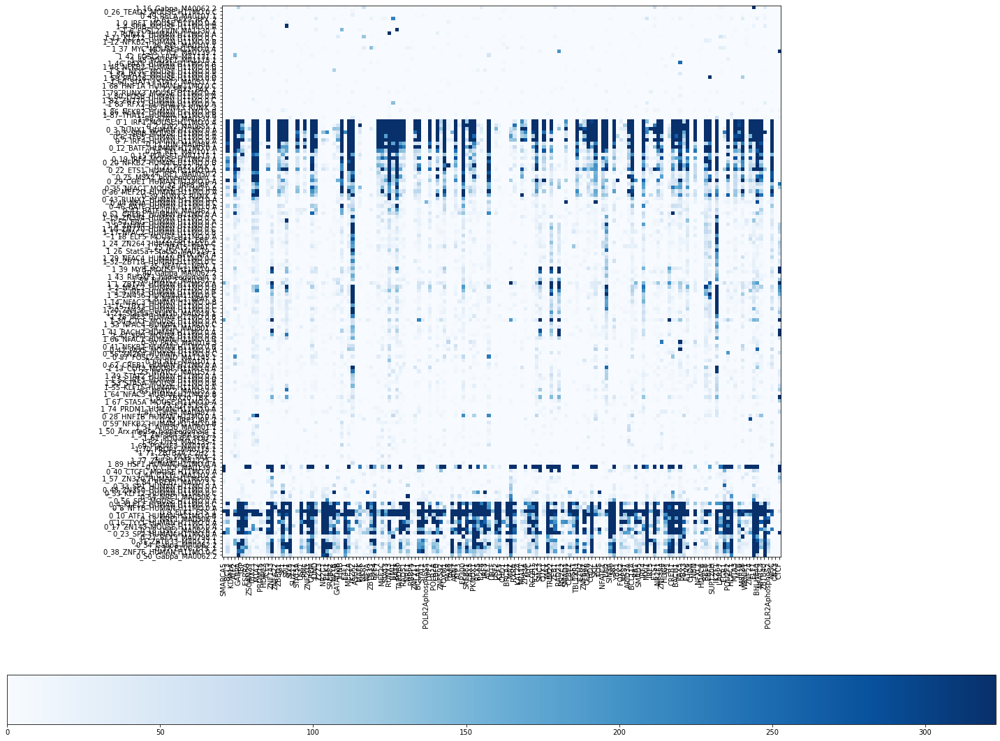

In [16]:
import sklearn.cluster
import scipy.cluster.hierarchy
import scipy.stats

def cluster_matrix_indices(matrix, num_clusters):
    """
    Clusters matrix using k-means. Always clusters on the first
    axis. Returns the indices needed to optimally order the matrix
    by clusters.
    """
    if len(matrix) == 1:
        # Don't cluster at all
        return np.array([0])

    num_clusters = min(num_clusters, len(matrix))
    
    # Perform k-means clustering
    kmeans = sklearn.cluster.KMeans(n_clusters=num_clusters)
    cluster_assignments = kmeans.fit_predict(matrix)

    # Perform hierarchical clustering on the cluster centers to determine optimal ordering
    kmeans_centers = kmeans.cluster_centers_
    cluster_order = scipy.cluster.hierarchy.leaves_list(
        scipy.cluster.hierarchy.optimal_leaf_ordering(
            scipy.cluster.hierarchy.linkage(kmeans_centers, method="centroid"), kmeans_centers
        )
    )

    # Order the peaks so that the cluster assignments follow the optimal ordering
    cluster_inds = []
    for cluster_id in cluster_order:
        cluster_inds.append(np.where(cluster_assignments == cluster_id)[0])
    cluster_inds = np.concatenate(cluster_inds)
    return cluster_inds

import matplotlib

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Create a figure with the right dimensions
fig, ax = plt.subplots(figsize=(20, 16))


 
inds = cluster_matrix_indices(motif_chip_pval_matrix,10)

zero_mask = motif_chip_pval_matrix == 0
min_val = np.min(motif_chip_pval_matrix[~zero_mask])
motif_chip_pval_matrix[zero_mask] = min_val
logpval_matrix = -np.log10(motif_chip_pval_matrix)
 

hmap = ax.imshow(logpval_matrix[inds], cmap="Blues")


# Set axes on heatmap
ax.set_yticks(np.arange(len(unique_motifs)))
ax.set_yticklabels(np.array(unique_motifs)[inds])
ax.set_xticks(np.arange(len(uniq_tfs)))
ax.set_xticklabels(np.array(uniq_tfs), rotation=90)

fig.colorbar(hmap, orientation="horizontal")

fig.tight_layout()
    

plt.show()

In [17]:

from statsmodels.sandbox.stats.multicomp import multipletests



0_0_CTCF_MA0139.1
['CTCF' 'RAD21' 'SMC3' 'ZNF143' 'TRIM22']
0_1_IRF1_MOUSE.H11MO.0.A
['JUNB' 'BATF' 'JUND' 'IRF4' 'MEF2A']
0_2_JDP2_MA0655.1
['BATF' 'JUNB' 'JUND' 'IRF4' 'BCL11A']
0_3_RUNX1_HUMAN.H11MO.0.A
['RUNX3' 'CBFB' 'EZH2' 'BCL11A' 'IRF5']
0_4_KLF12_HUMAN.H11MO.0.C
['ZNF622' 'SP1' 'EGR1' 'NRF1' 'E2F4']
0_5_SPIB_MOUSE.H11MO.0.A
['SPI1' 'ETV6' 'ELF1' 'GABPA' 'ETS1']
0_6_TF65_HUMAN.H11MO.0.A
['RELB' 'BCL3' 'BCL11A' 'EBF1' 'EP300']
0_7_IRF4_HUMAN.H11MO.0.A
['SPI1' 'IRF4' 'BCL11A' 'EP300' 'BMI1']
0_8_NFYB_HUMAN.H11MO.0.A
['FOS' 'NFYA' 'IRF3' 'NFYB' 'CEBPZ']
0_9_ELK1_ETS_1
['ELK1' 'SREBF2' 'GABPA' 'NR2C2' 'E4F1']
0_10_ATF1_HUMAN.H11MO.0.B
['BRCA1' 'ATF3' 'CREB1' 'SUPT20H' 'RFX5']
0_11_JUN_MA0488.1
['ATF2' 'ATF7' 'CREB1' 'CREM' 'JUNB']
0_12_BATF_HUMAN.H11MO.0.A
['JUND' 'BATF' 'JUNB' 'IRF4' 'STAT5A']
0_13_NRF1_MA0506.1
['NRF1' 'ATF3' 'HCFC1' 'E2F4' 'SIX5']
0_14_REL_MA0101.1
['RELB' 'FOXM1' 'NFIC' 'CUX1' 'BCL11A']
0_15_POU5F1_MA1115.1
['POU2F2' 'TBL1XR1' 'MAFK' 'SREBF1' 'EP300']
0_16_TYY1

['KDM1A' 'CHD4' 'TCF7' 'GABPA' 'PBX3']
1_72_PAX2_PAX_1
['NR2C2' 'USF2' 'TCF7' 'ZEB1' 'USF1']
1_73_E2F3_E2F_2
['REST' 'SMAD1' 'EED' 'SIN3A' 'BCL3']
1_74_PRDM1_HUMAN.H11MO.0.A
['SREBF2' 'E2F4' 'CUX1' 'IRF4' 'TCF7']
1_75_PAX5_PAX_1
['MEF2C' 'ATF2' 'GABPA' 'NFIC' 'JUNB']
1_77_ZNF384_MA1125.1
['TCF7' 'ZNF24' 'GABPA' 'BCLAF1' 'ZNF384']
1_79_RUNX3_MOUSE.H11MO.0.A
['IRF5' 'E2F8' 'ZBED1' 'EED' 'MLLT1']
1_80_FOSB_HUMAN.H11MO.0.A
['PAX5' 'TCF12']
1_81_Gata4_MA0482.1
['E4F1' 'ZNF384' 'ELK1' 'ATF2' 'GABPA']
1_82_ZN770_HUMAN.H11MO.0.C
['HSF1' 'TBX21' 'CREB1' 'ARNT' 'ZNF207']
1_83_RFX2_HUMAN.H11MO.0.A
['BMI1' 'ZBTB40' 'RFX5' 'MXI1' 'NRF1']
1_84_RREB1_MA0073.1
['RXRA' 'SUZ12' 'EGR1' 'HSF1' 'ZEB1']
1_85_RUNX3_RUNX_3
['RB1' 'NKRF' 'RUNX3' 'DPF2']
1_86_NFKB2_HUMAN.H11MO.0.B
['SP1' 'ETS1' 'ZNF217' 'TCF3' 'TBL1XR1']
1_87_THA11_HUMAN.H11MO.0.B
['HCFC1' 'USF1' 'MAX' 'ARNT' 'ZNF687']
1_88_STAT1_MA0137.3
['SIX5' 'SREBF1' 'HCFC1' 'NR2C1' 'IKZF1']
1_89_HSF1_HUMAN.H11MO.0.A
['NFATC1' 'STAT3' 'MEF2C' 'IKZF2' 'SPI1

/users/anusri/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.


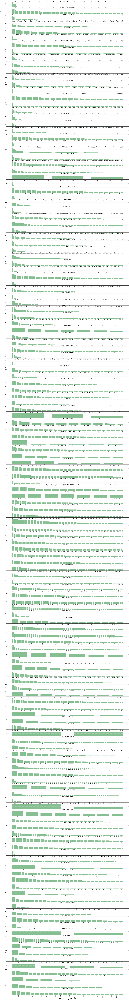

In [22]:
fig, axs = plt.subplots(len(unique_motifs),figsize=(30,250))
from matplotlib.ticker import StrMethodFormatter


for i in range(len(unique_motifs)):
    print(unique_motifs[i])
    p_adjusted = multipletests(motif_chip_pval_matrix[i,:], method='fdr_bh')
    idxs = np.argsort(odds_ratio[i,np.array(p_adjusted[0])])[::-1]
 
    ax = axs[i]
    tfs = np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs]
    counts = odds_ratio[i,np.array(p_adjusted[0])][idxs]
    ax.bar(tfs, counts,color="#86bf91")
    ax.set_xticks(tfs,rotation='vertical')

    #ax.set_ylabel('odds ratio')
    #ax.set_ylabel('TFs significantly co-occuring with motif')

    ax.set_title(unique_motifs[i])

    print(np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs][0:5])
    #print(odds_ratio[i,np.array(p_adjusted[0])][idxs][-5:])
    
for i,x in enumerate(axs):

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Set x-axis label
    x.set_xlabel("Tfs intersecting with motif", weight='bold', size=15)

    # Set y-axis label
    if i == 1:
        x.set_ylabel("TFs", labelpad=50, weight='bold', size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

    x.tick_params(axis='x', rotation=90)
#plt.show()
plt.tight_layout()
plt.savefig(mode+"_histplot.pdf")


In [23]:
motif_chip_pval_matrix[1,:]

array([9.99999825e-001, 9.88131292e-324, 1.77876966e-001, 9.88131292e-324,
       9.88131292e-324, 9.88131292e-324, 7.30280489e-002, 2.88453475e-001,
       9.88131292e-324, 9.88131292e-324, 9.99999757e-001, 9.99999976e-001,
       9.88131292e-324, 9.99999870e-001, 9.99998555e-001, 9.88131292e-324,
       9.88131292e-324, 9.88131292e-324, 1.00000000e+000, 9.99999705e-001,
       9.88131292e-324, 1.00000000e+000, 9.88131292e-324, 1.00000000e+000,
       9.88131292e-324, 9.88131292e-324, 9.98012871e-001, 9.99999661e-001,
       9.99999945e-001, 1.00000000e+000, 8.12617781e-002, 1.00000000e+000,
       9.88131292e-324, 9.99999839e-001, 9.88131292e-324, 9.88131292e-324,
       1.00000000e+000, 9.15779182e-022, 9.99999909e-001, 1.00000000e+000,
       9.99999868e-001, 1.00000000e+000, 9.88131292e-324, 9.88131292e-324,
       9.88131292e-324, 9.88131292e-324, 9.88131292e-324, 9.88131292e-324,
       9.88131292e-324, 9.88131292e-324, 9.99999914e-001, 1.00000000e+000,
       9.88131292e-324, 9

In [24]:
frames=[]
for i in range(len(unique_motifs)):
    print(unique_motifs[i])
    
    p_adjusted = multipletests(motif_chip_pval_matrix[i,:], method='fdr_bh')
    idxs = np.argsort(odds_ratio[i,np.array(p_adjusted[0])])[::-1]
 
    ax = axs[i]
    tfs = np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs]
    counts = odds_ratio[i,np.array(p_adjusted[0])][idxs]

    new = []
    new.append(unique_motifs[i])
    new.extend(np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs][0:10].tolist())
    frames.append(new)
    #ax.set_ylabel('odds ratio')
    #ax.set_ylabel('TFs significantly co-occuring with motif')

    print(np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs][0:5])

outdf = pd.DataFrame(frames)
outdf.to_csv(mode+"_top10.tsv", sep='\t', header=False, index=False)

0_0_CTCF_MA0139.1
['CTCF' 'RAD21' 'SMC3' 'ZNF143' 'TRIM22']
0_1_IRF1_MOUSE.H11MO.0.A
['JUNB' 'BATF' 'JUND' 'IRF4' 'MEF2A']
0_2_JDP2_MA0655.1
['BATF' 'JUNB' 'JUND' 'IRF4' 'BCL11A']
0_3_RUNX1_HUMAN.H11MO.0.A
['RUNX3' 'CBFB' 'EZH2' 'BCL11A' 'IRF5']
0_4_KLF12_HUMAN.H11MO.0.C
['ZNF622' 'SP1' 'EGR1' 'NRF1' 'E2F4']
0_5_SPIB_MOUSE.H11MO.0.A
['SPI1' 'ETV6' 'ELF1' 'GABPA' 'ETS1']
0_6_TF65_HUMAN.H11MO.0.A
['RELB' 'BCL3' 'BCL11A' 'EBF1' 'EP300']
0_7_IRF4_HUMAN.H11MO.0.A
['SPI1' 'IRF4' 'BCL11A' 'EP300' 'BMI1']
0_8_NFYB_HUMAN.H11MO.0.A
['FOS' 'NFYA' 'IRF3' 'NFYB' 'CEBPZ']
0_9_ELK1_ETS_1
['ELK1' 'SREBF2' 'GABPA' 'NR2C2' 'E4F1']
0_10_ATF1_HUMAN.H11MO.0.B
['BRCA1' 'ATF3' 'CREB1' 'SUPT20H' 'RFX5']
0_11_JUN_MA0488.1
['ATF2' 'ATF7' 'CREB1' 'CREM' 'JUNB']
0_12_BATF_HUMAN.H11MO.0.A
['JUND' 'BATF' 'JUNB' 'IRF4' 'STAT5A']
0_13_NRF1_MA0506.1
['NRF1' 'ATF3' 'HCFC1' 'E2F4' 'SIX5']
0_14_REL_MA0101.1
['RELB' 'FOXM1' 'NFIC' 'CUX1' 'BCL11A']
0_15_POU5F1_MA1115.1
['POU2F2' 'TBL1XR1' 'MAFK' 'SREBF1' 'EP300']
0_16_TYY1

['ZNF384' 'ZBTB33' 'CEBPB' 'BMI1' 'TBL1XR1']
1_71_ZBTB7A_C2H2_1
['KDM1A' 'CHD4' 'TCF7' 'GABPA' 'PBX3']
1_72_PAX2_PAX_1
['NR2C2' 'USF2' 'TCF7' 'ZEB1' 'USF1']
1_73_E2F3_E2F_2
['REST' 'SMAD1' 'EED' 'SIN3A' 'BCL3']
1_74_PRDM1_HUMAN.H11MO.0.A
['SREBF2' 'E2F4' 'CUX1' 'IRF4' 'TCF7']
1_75_PAX5_PAX_1
['MEF2C' 'ATF2' 'GABPA' 'NFIC' 'JUNB']
1_77_ZNF384_MA1125.1
['TCF7' 'ZNF24' 'GABPA' 'BCLAF1' 'ZNF384']
1_79_RUNX3_MOUSE.H11MO.0.A
['IRF5' 'E2F8' 'ZBED1' 'EED' 'MLLT1']
1_80_FOSB_HUMAN.H11MO.0.A
['PAX5' 'TCF12']
1_81_Gata4_MA0482.1
['E4F1' 'ZNF384' 'ELK1' 'ATF2' 'GABPA']
1_82_ZN770_HUMAN.H11MO.0.C
['HSF1' 'TBX21' 'CREB1' 'ARNT' 'ZNF207']
1_83_RFX2_HUMAN.H11MO.0.A
['BMI1' 'ZBTB40' 'RFX5' 'MXI1' 'NRF1']
1_84_RREB1_MA0073.1
['RXRA' 'SUZ12' 'EGR1' 'HSF1' 'ZEB1']
1_85_RUNX3_RUNX_3
['RB1' 'NKRF' 'RUNX3' 'DPF2']
1_86_NFKB2_HUMAN.H11MO.0.B
['SP1' 'ETS1' 'ZNF217' 'TCF3' 'TBL1XR1']
1_87_THA11_HUMAN.H11MO.0.B
['HCFC1' 'USF1' 'MAX' 'ARNT' 'ZNF687']
1_88_STAT1_MA0137.3
['SIX5' 'SREBF1' 'HCFC1' 'NR2C1' 'IKZF1']
1

In [20]:
unique_motifs

['0_0_CTCF_MA0139.1',
 '0_1_IRF1_MOUSE.H11MO.0.A',
 '0_2_JDP2_MA0655.1',
 '0_3_RUNX1_HUMAN.H11MO.0.A',
 '0_4_KLF12_HUMAN.H11MO.0.C',
 '0_5_SPIB_MOUSE.H11MO.0.A',
 '0_6_TF65_HUMAN.H11MO.0.A',
 '0_7_IRF4_HUMAN.H11MO.0.A',
 '0_8_NFYB_HUMAN.H11MO.0.A',
 '0_9_ELK1_ETS_1',
 '0_10_ATF1_HUMAN.H11MO.0.B',
 '0_11_JUN_MA0488.1',
 '0_12_BATF_HUMAN.H11MO.0.A',
 '0_13_NRF1_MA0506.1',
 '0_14_REL_MA0101.1',
 '0_15_POU5F1_MA1115.1',
 '0_16_TYY1_HUMAN.H11MO.0.A',
 '0_17_ZN143_MOUSE.H11MO.0.A',
 '0_18_USF2_MA0526.2',
 '0_19_IRF4_MOUSE.H11MO.0.A',
 '0_20_NFKB2_HUMAN.H11MO.0.B',
 '0_21_PAX2_PAX_1',
 '0_22_ETS1_HUMAN.H11MO.0.A',
 '0_23_SP2_HUMAN.H11MO.0.A',
 '0_24_IRF1_MA0050.2',
 '0_25_MSX2_homeodomain_1',
 '0_26_TEAD2_MOUSE.H11MO.0.C',
 '0_27_RFX3_MA0798.1',
 '0_28_HNF1B_HUMAN.H11MO.0.A',
 '0_29_COE1_HUMAN.H11MO.0.A',
 '0_30_PAX5_MA0014.3',
 '0_31_ZBTB33_MA0527.1',
 '0_32_IRF8_IRF_2',
 '0_33_SP1_HUMAN.H11MO.0.A',
 '0_34_Gabpa_MA0062.2',
 '0_35_NFAC1_MOUSE.H11MO.0.A',
 '0_36_MEF2D_HUMAN.H11MO.0.A',
 '0_37_

In [21]:
# data={}
# data["pval"] = motif_chip_pval_matrix
# data["odds"] = odds_ratio
# data["motif_names"] = unique_motifs
# data["tf_names"] = uniq_tfs

# import pickle as pkl
# ft = open("saving_pvals.pkl","wb")
# pkl.dump(data,ft)